In [4]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import cv2
import imageio
import matplotlib.pyplot as plt
from collections import deque

imageio.plugins.ffmpeg.download()

def my_plt_show_image(img, title, mode='color'):
    pass
    """
    zapis = plt.figure(figsize=(20,20))
    if mode=="color":
        plt.imshow(img)
        pass
    else:
        pass
        plt.imshow(img, cmap="gray")
    
    plt.title(title)
    zapis.savefig("./partial_images/"+title+".jpg")
    plt.show()
    """

def join_channel(a,b,c):
    color_binary = np.dstack((a, b, c))
    return color_binary

def create_channels(img):
    
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV).astype(np.float)
    h_channel = hsv[:,:,0]
    s_channel = hsv[:,:,1]
    v_channel = hsv[:,:,2]
    
    hsl = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    hsl_h_channel = hsl[:,:,0]
    hsl_s_channel = hsl[:,:,1]
    hsl_l_channel = hsl[:,:,2]
    
    lab= cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l  = lab[..., 0]
    a, b = lab[...,1], lab[...,2]
    
    return h_channel, s_channel, v_channel, hsl_h_channel, hsl_s_channel, hsl_l_channel, l, a, b

def histogram_change(img):
    out =[]
    limg = np.array(img)
    #plt.imshow(img)
    #plt.show()
    #print (type(img))
    
    lab= cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l  = lab[..., 0]
    a, b = lab[...,1], lab[...,2]
    
    clahe = cv2.createCLAHE(clipLimit=1.0, tileGridSize=(8,8))
    out = clahe.apply(l)
 
    #plt.imshow(out)
    #plt.show()
    #print (type(out))
    
    limg[...,0] = out
    limg[...,1] = a
    limg[...,2] = b
    
    final_out = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
    
    #plt.imshow(final_out)
    #plt.show()
    
    return final_out

def color_threshold(img, s_thresh=(120, 255)):
    
    # , sx_thresh=(20, 100)
    img = np.copy(img)
    s_binary = np.zeros_like(img)
    s_binary[(img >= s_thresh[0]) & (img <= s_thresh[1])] = 1
    

    color_binary = s_binary
    return color_binary
    


def abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(0, 255)):

    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image
        
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1,0, sobel_kernel)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0,1, sobel_kernel)
    
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint(255*abs_sobel/np.max(abs_sobel))
    
    thresholded = np.zeros_like(scaled_sobel)
    thresholded[(scaled_sobel >thresh[0]) & (scaled_sobel <thresh[1])]=1
    
    # Calculate directional gradient
    # Apply threshold
    return thresholded

def mag_thresh(image, sobel_kernel=3, mag_thresh=(0, 255)):

    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image
    grad_x = cv2.Sobel(gray, cv2.CV_64F, 1,0, ksize=sobel_kernel)
    grad_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
       
    abs_grad_x = np.absolute(grad_x)
    abs_grad_y = np.absolute(grad_y)
    
    magnitude = np.sqrt(abs_grad_x**2 + abs_grad_y**2)
    scaled = np.uint(255*magnitude/np.max(magnitude))
    
    mag_binary = np.zeros_like(gray)
    mag_binary[(scaled > mag_thresh[0]) & (scaled < mag_thresh[1])]=1
    # Calculate gradient magnitude
    # Apply threshold
    return mag_binary

def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Calculate gradient direction

    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image
    grad_x = cv2.Sobel(gray, cv2.CV_64F, 1,0,ksize = sobel_kernel)
    grad_y = cv2.Sobel(gray, cv2.CV_64F, 0,1, ksize = sobel_kernel)
    
    abs_sob_x = np.absolute(grad_x)
    abs_sob_y = np.absolute(grad_y)
    
    direction = np.arctan2(abs_sob_y, abs_sob_x)
    dir_binary = np.zeros_like(direction)
    dir_binary[(direction >= thresh[0]) &(direction <= thresh[1]) ] = 1
    result = dir_binary
    # Apply threshold
    return result


In [ ]:

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(warped, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(warped.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids

def draw_centroids(original, warped, window_centroids, window_width, window_height):
    # If we found any window centers
    warpage = np.zeros_like(original)
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped)
        r_points = np.zeros_like(warped)

        # Go through each level and draw the windows 	
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        #my_plt_show_image(template, title = "template inside", mode="color")
        #my_plt_show_image(warped, title = "warped inside 1", mode="color")
        
        warpage[:,:,0] = warped*255
        warpage[:,:,1] = warped*255
        warpage[:,:,2] = warped*255
                
        #my_plt_show_image(warpage, title = "warpage inside", mode="color")
        output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

    # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((warped,warped,warped)),np.uint8)
    #my_plt_show_image(output, title = "output inside", mode="color")
    #my_plt_show_image(warped, title = "warped inside", mode="color")
        
    print (type(output[0][0][0]))
    print (type(warped[0][0]))
    return output

def centroids_to_points(window_centroids, window_width, window_height):
    left_points = []
    right_points = []
    y = 720 - int(window_width//2)
        
    for centers in window_centroids:
        left_x = centers[0]
        right_x = centers[1]
        
        left_points.append((left_x,y))
        right_points.append((right_x,y))
        y -= window_height
    return left_points, right_points

def fit_left_and_right(left_points, right_points):

    x = np.asarray(left_points)[:,0]
    y = np.asarray(left_points)[:,1]
    #print ("x,y",x,y)
    
    x1 = np.asarray(right_points)[:,0]
    y1 = np.asarray(right_points)[:,1]
    #print ("x1,y1",x1,y1)
    
    z = np.polyfit(y, x, 2)
    #print(z)
    
    z1 = np.polyfit(y1, x1, 2)
    #print(z)
    
    ploty = np.linspace(0, 719, num=720)
    left_fitx = z[0]*ploty**2 + z[1]*ploty + z[2]
    right_fitx = z1[0]*ploty**2 + z1[1]*ploty + z1[2]
    
    return left_fitx, right_fitx, x, y, x1, y1, z, z1

def road_curvature(ploty, left_fitx, right_fitx, y_eval):
    

    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # Now our radius of curvature is in meters
    print(left_curverad, 'm', right_curverad, 'm')
    return left_curverad, right_curverad
    # Example values: 632.1 m    626.2 m
    
def draw_fitted(original, clean_warped, title, x,y,x1,y1, right_fitx, left_fitx):
    
    background = np.zeros_like(original)
    
    zapis = plt.figure(figsize=(20,20))
    background[:,:,0] = clean_warped*255
    background[:,:,1] = clean_warped*255
    background[:,:,2] = clean_warped*255
        
    plt.imshow(background) 
    
    plt.xlim(0, 1280)
    plt.ylim(0, 720)
    plt.gca().invert_yaxis()
    

    plt.plot(x,y)
    plt.plot(x1,y1)
    
    plt.plot(right_fitx, ploty, color='red', linewidth=3)
    plt.plot(left_fitx, ploty, color='red', linewidth=3)
    plt.title(title)
    zapis.savefig("./partial_images/"+title+".jpg")
    plt.show()

    return zapis
    
    
    
def draw_road(ploty, clean_warped, right_fitx, left_fitx, y_eval):
    
    
    warp_zero = np.zeros_like(clean_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img_size[0], img_size[1])) 
    return newwarp

def column(matrix, i):
        return [row[i] for row in matrix]
    
def average_points(detected_left_array, detected_right_array):
    length = len(detected_left_array[0])

    avg_left = []
    avg_right = []
    
    for i in range(length):
        #print (timestep)
        #print (timestep[0])
        #print (timestep[0][0])
        
        #print (element[:,0])
        
        left = np.array(column(detected_left_array,i))
        right = np.array(column(detected_right_array,i))
        
        print ("column l", left)
        print ("column r", right)
        
        print ("column l shape", left.shape)
        print ("column r shape", right.shape)
        
                
        if left.shape[0] ==15 :
            print ("now using weighted average")
            left_x = np.average(left[:,:1].flatten(), weights=[1,1,1,1,1,
                                            1,1,1,1,1,
                                            5,5,10,20,50])
            right_x = np.average(right[:,:1].flatten(), weights=[1,1,1,1,1,
                                            1,1,1,1,1,
                                            5,5,10,20,50])
        else:
            left_x = np.mean(left[:,:1])
            right_x = np.mean(right[:,:1])

        
        print ("leftx",left_x)
        print ("rightx", right_x)
        
        print ("left std", np.std(left[:,:1]))
        print ("right std", np.std(right[:,:1]))
                
        print ("y",left[:,1:2][0])
        
        avg_left.append((left_x,left[:,1:2][0][0]))
        avg_right.append((right_x,right[:,1:2][0][0]))
        
    
    print ("Average points for this frame ")
        
    print ("avg left",avg_left)
    print ("avg right", avg_right)
    print ("\n\n")
        
    return avg_left, avg_right

def median_points(detected_left_array, detected_right_array):
    
    def reject_outliers(data, m=3):
        print ("data", data)
        d = np.abs(data - np.median(data))
        print("minus median", d)
        mdev = np.median(d)
        print ("median/mdev", mdev)
        #s = d/mdev if mdev else 0
        if mdev != 0:
            s = d/mdev
            print ("s - d/mdev",s, "m", m)
            print ("data[s<m]",data[s<m], "\n")
            return data[s<m]
        else:
            s = 0
            return data
            
    
    length = len(detected_left_array[0])
    print ("length", length)
    avg_left = []
    avg_right = []
    
    for i in range(length):
        #print (timestep)
        #print (timestep[0])
        #print (timestep[0][0])
        
        #print (element[:,0])
        print ("point - ", i)
        
        left = np.array(column(detected_left_array,i))
        right = np.array(column(detected_right_array,i))
        print ("column l", left)
        print ("column r", right)
        data_left =left[:,:1]
        data_right =right[:,:1]
        
        m = 2
        clean_data_left = reject_outliers(data_left, m=10)
        clean_data_right = reject_outliers(data_right, m=10)
        
        left_x = np.median(clean_data_left)
        right_x = np.median(clean_data_right)
        
        print ("leftx",left_x)
        print ("rightx", right_x)
      
        print ("y",left[:,1:2][0])
        avg_left.append((left_x,left[:,1:2][0][0]))
        avg_right.append((right_x,right[:,1:2][0][0]))

        print ("\n\n")
    
    print ("med left",avg_left)
    print ("med right", avg_right)
    
    avg_left = avg_left
    avg_right = avg_right
    
    return avg_left, avg_right 

def weighted_points(detected_left_array, detected_right_array):
    print ("median with average")
    
    def reject_outliers(data, m=3):
        print ("data", data)
        d = np.abs(data - np.median(data))
        print("minus median", d)
        mdev = np.median(d)
        print ("median/mdev", mdev)
        #s = d/mdev if mdev else 0
        if mdev != 0:
            s = d/mdev
            print ("s - d/mdev",s, "m", m)
            print ("data[s<m]",data[s<m], "\n")
            return data[s<m]
        else:
            s = 0
            return data
            
    
    length = len(detected_left_array[0])
    print ("length", length)
    avg_left = []
    avg_right = []
    
    for i in range(length):
        #print (timestep)
        #print (timestep[0])
        #print (timestep[0][0])
        
        #print (element[:,0])
        print ("point - ", i)
        
        left = np.array(column(detected_left_array,i))
        right = np.array(column(detected_right_array,i))
        print ("column l", left)
        print ("column r", right)
        data_left =left[:,:1]
        data_right =right[:,:1]
        
        m = 2
        clean_data_left = reject_outliers(data_left, m=3)
        clean_data_right = reject_outliers(data_right, m=3)
        
        print ("cleandata shape", clean_data_left.shape)
        print ("cleandata shape", clean_data_right.shape)
        
        weights = [1,1,1,1,1,1,1,1,1,1,5,5,10,20,50]
        
        print (weights[15-clean_data_left.shape[0]:])
        print (weights[15-clean_data_right.shape[0]:])
        
        print ("flattened", left[:,:1].flatten())
        print ("clean left", clean_data_left.flatten())
        print ("weighted av", np.average(clean_data_left.flatten(), weights=weights[15-clean_data_left.shape[0]:]))
        
        print ("clean right", clean_data_right.flatten())
        print ("weighted av", np.average(clean_data_right.flatten(), weights=weights[15-clean_data_right.shape[0]:]))
        
        
        if clean_data_left.shape[0] > 5 :
            print ("now using weighted average")
            #left_x = np.average(left[:,:1].flatten(), weights=[1,1,1,1,1,
            #                                1,1,1,1,1,
            #                                5,5,10,20,50])
            #right_x = np.average(right[:,:1].flatten(), weights=[1,1,1,1,1,
            #                                1,1,1,1,1,
            #                                5,5,10,20,50])
            left_x = np.mean(clean_data_left)
            right_x = np.mean(clean_data_right)
        
        else:
            left_x = np.median(clean_data_left)
            right_x = np.median(clean_data_right)
        
        

        
        print ("leftx",left_x)
        print ("rightx", right_x)
      
        print ("y",left[:,1:2][0])
        avg_left.append((left_x,left[:,1:2][0][0]))
        avg_right.append((right_x,right[:,1:2][0][0]))

        print ("\n\n")
    
    print ("med left",avg_left)
    print ("med right", avg_right)
    
    avg_left = avg_left
    avg_right = avg_right
    
    return avg_left, avg_right 

1260
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


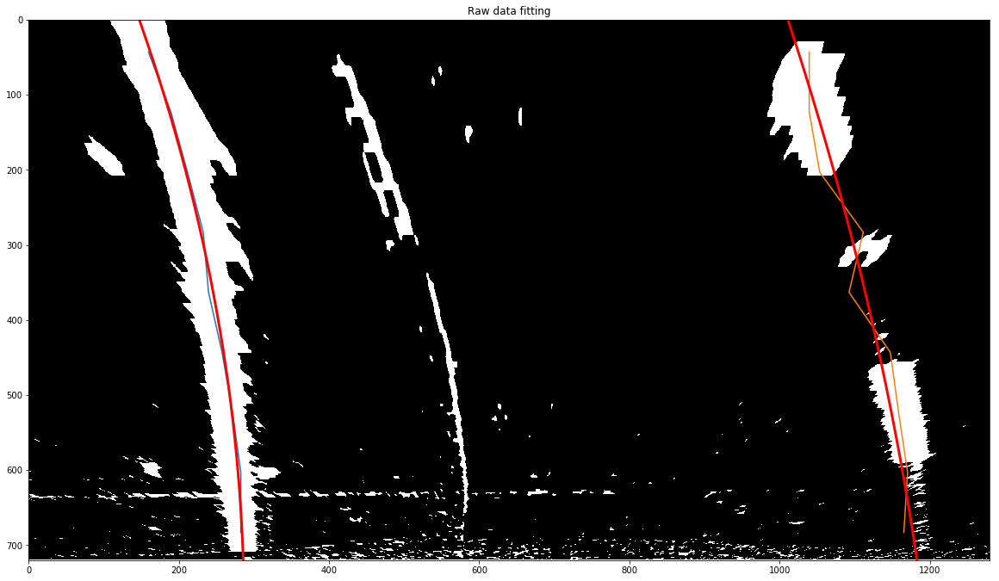

deque([[(282.5, 683), (282.5, 603), (271.5, 523), (257.5, 443), (239.5, 363), (232.5, 283), (211.5, 203), (189.5, 123), (159.5, 43)]], maxlen=25)
deque([[(1165.5, 683), (1170.5, 603), (1158.5, 523), (1147.5, 443), (1092.5, 363), (1111.5, 283), (1053.5, 203), (1039.5, 123), (1039.5, 43)]], maxlen=25)
with mean
column l [[ 282.5  683. ]]
column r [[ 1165.5   683. ]]
column l shape (1, 2)
column r shape (1, 2)
leftx 282.5
rightx 1165.5
left std 0.0
right std 0.0
y [ 683.]
column l [[ 282.5  603. ]]
column r [[ 1170.5   603. ]]
column l shape (1, 2)
column r shape (1, 2)
leftx 282.5
rightx 1170.5
left std 0.0
right std 0.0
y [ 603.]
column l [[ 271.5  523. ]]
column r [[ 1158.5   523. ]]
column l shape (1, 2)
column r shape (1, 2)
leftx 271.5
rightx 1158.5
left std 0.0
right std 0.0
y [ 523.]
column l [[ 257.5  443. ]]
column r [[ 1147.5   443. ]]
column l shape (1, 2)
column r shape (1, 2)
leftx 257.5
rightx 1147.5
left std 0.0
right std 0.0
y [ 443.]
column l [[ 239.5  363. ]]
column r [

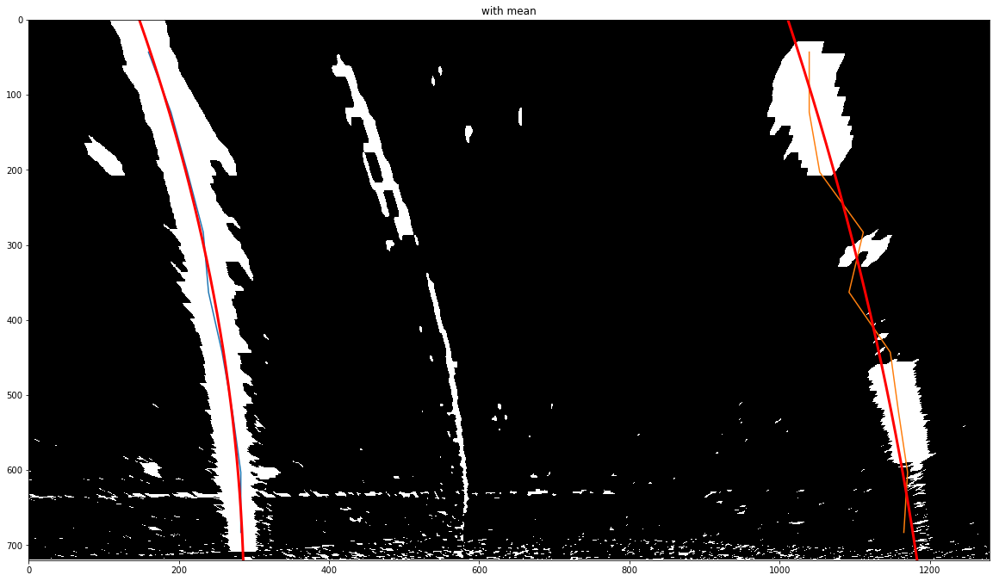

with median
length 9
point -  0
column l [[ 282.5  683. ]]
column r [[ 1165.5   683. ]]
data [[ 282.5]]
minus median [[ 0.]]
median/mdev 0.0
data [[ 1165.5]]
minus median [[ 0.]]
median/mdev 0.0
leftx 282.5
rightx 1165.5
y [ 683.]



point -  1
column l [[ 282.5  603. ]]
column r [[ 1170.5   603. ]]
data [[ 282.5]]
minus median [[ 0.]]
median/mdev 0.0
data [[ 1170.5]]
minus median [[ 0.]]
median/mdev 0.0
leftx 282.5
rightx 1170.5
y [ 603.]



point -  2
column l [[ 271.5  523. ]]
column r [[ 1158.5   523. ]]
data [[ 271.5]]
minus median [[ 0.]]
median/mdev 0.0
data [[ 1158.5]]
minus median [[ 0.]]
median/mdev 0.0
leftx 271.5
rightx 1158.5
y [ 523.]



point -  3
column l [[ 257.5  443. ]]
column r [[ 1147.5   443. ]]
data [[ 257.5]]
minus median [[ 0.]]
median/mdev 0.0
data [[ 1147.5]]
minus median [[ 0.]]
median/mdev 0.0
leftx 257.5
rightx 1147.5
y [ 443.]



point -  4
column l [[ 239.5  363. ]]
column r [[ 1092.5   363. ]]
data [[ 239.5]]
minus median [[ 0.]]
median/mdev 0.0
data [[

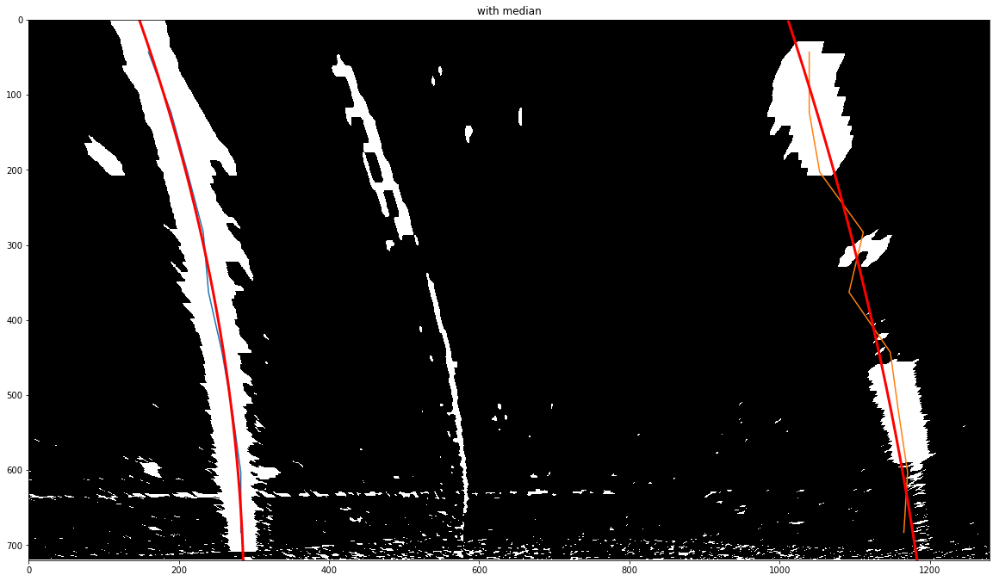

with weighted
median with average
length 9
point -  0
column l [[ 282.5  683. ]]
column r [[ 1165.5   683. ]]
data [[ 282.5]]
minus median [[ 0.]]
median/mdev 0.0
data [[ 1165.5]]
minus median [[ 0.]]
median/mdev 0.0
cleandata shape (1, 1)
cleandata shape (1, 1)
[50]
[50]
flattened [ 282.5]
clean left [ 282.5]
weighted av 282.5
clean right [ 1165.5]
weighted av 1165.5
leftx 282.5
rightx 1165.5
y [ 683.]



point -  1
column l [[ 282.5  603. ]]
column r [[ 1170.5   603. ]]
data [[ 282.5]]
minus median [[ 0.]]
median/mdev 0.0
data [[ 1170.5]]
minus median [[ 0.]]
median/mdev 0.0
cleandata shape (1, 1)
cleandata shape (1, 1)
[50]
[50]
flattened [ 282.5]
clean left [ 282.5]
weighted av 282.5
clean right [ 1170.5]
weighted av 1170.5
leftx 282.5
rightx 1170.5
y [ 603.]



point -  2
column l [[ 271.5  523. ]]
column r [[ 1158.5   523. ]]
data [[ 271.5]]
minus median [[ 0.]]
median/mdev 0.0
data [[ 1158.5]]
minus median [[ 0.]]
median/mdev 0.0
cleandata shape (1, 1)
cleandata shape (1, 1)
[50

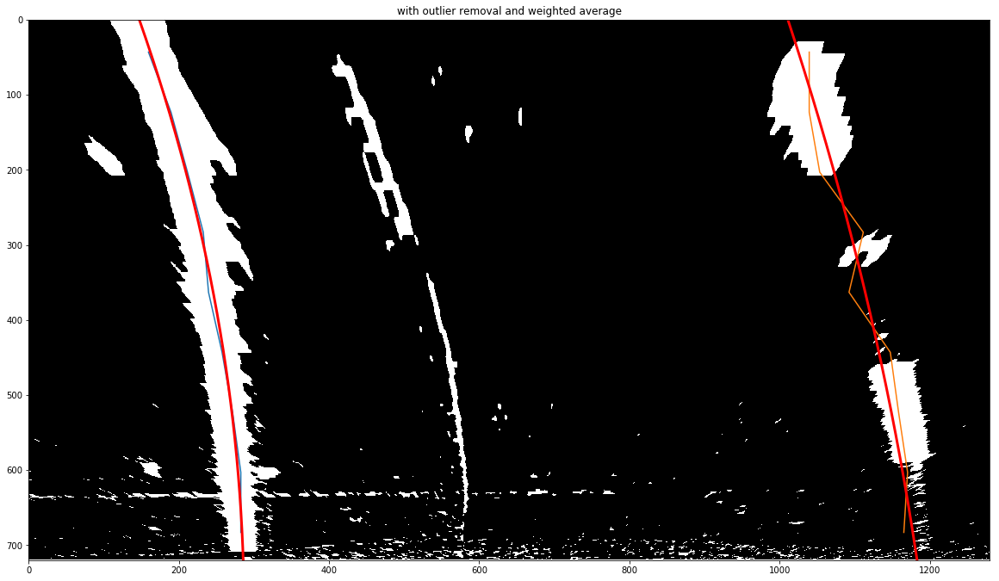

282.5 1165.5 -0.441357142857
744.783744756 m 1314.87513171 m
744.783744756 1314.87513171
Left curve radius 744.78 m
Right curve radius 1314.88 m
Car position -0.4414 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


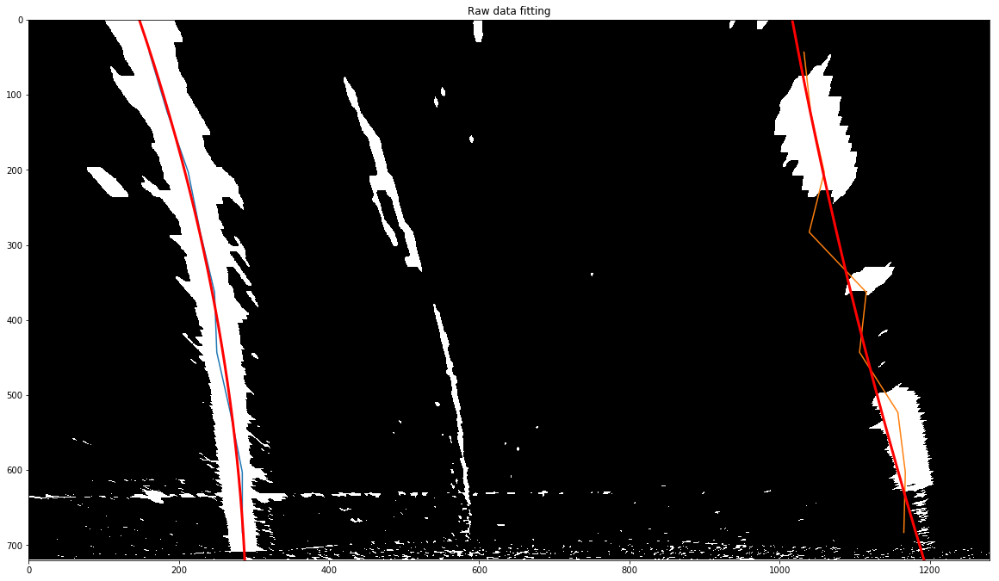

deque([[(282.5, 683), (282.5, 603), (271.5, 523), (257.5, 443), (239.5, 363), (232.5, 283), (211.5, 203), (189.5, 123), (159.5, 43)], [(284.5, 683), (284.5, 603), (268.5, 523), (250.5, 443), (247.5, 363), (228.5, 283), (212.5, 203), (184.5, 123), (160.5, 43)]], maxlen=25)
deque([[(1165.5, 683), (1170.5, 603), (1158.5, 523), (1147.5, 443), (1092.5, 363), (1111.5, 283), (1053.5, 203), (1039.5, 123), (1039.5, 43)], [(1165.5, 683), (1167.5, 603), (1157.5, 523), (1106.5, 443), (1115.5, 363), (1039.5, 283), (1059.5, 203), (1041.5, 123), (1032.5, 43)]], maxlen=25)
with mean
column l [[ 282.5  683. ]
 [ 284.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]]
column l shape (2, 2)
column r shape (2, 2)
leftx 283.5
rightx 1165.5
left std 1.0
right std 0.0
y [ 683.]
column l [[ 282.5  603. ]
 [ 284.5  603. ]]
column r [[ 1170.5   603. ]
 [ 1167.5   603. ]]
column l shape (2, 2)
column r shape (2, 2)
leftx 283.5
rightx 1169.0
left std 1.0
right std 1.5
y [ 603.]
column l [[ 271.5  523. ]
 [

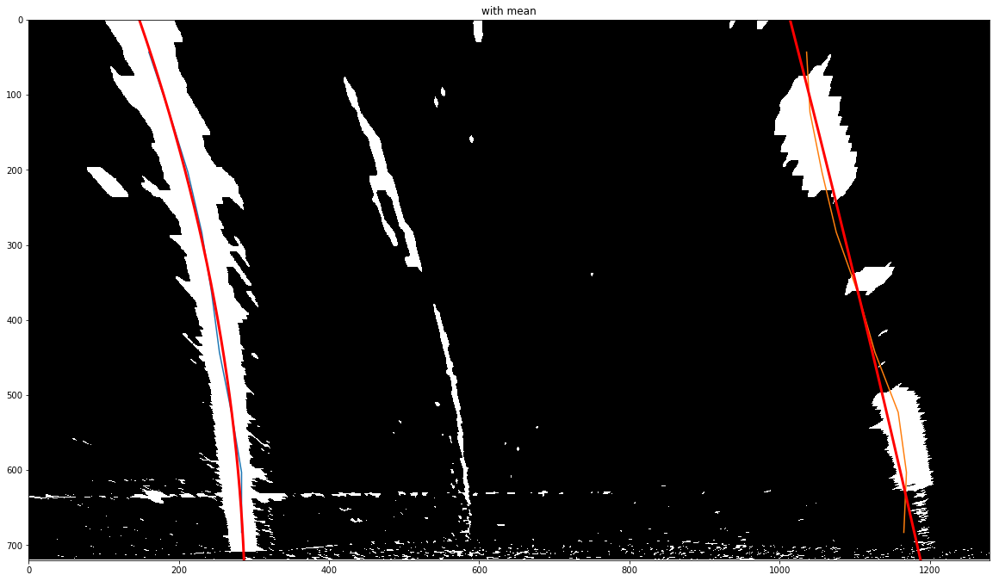

with median
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]]
data [[ 282.5]
 [ 284.5]]
minus median [[ 1.]
 [ 1.]]
median/mdev 1.0
s - d/mdev [[ 1.]
 [ 1.]] m 10
data[s<m] [ 282.5  284.5] 

data [[ 1165.5]
 [ 1165.5]]
minus median [[ 0.]
 [ 0.]]
median/mdev 0.0
leftx 283.5
rightx 1165.5
y [ 683.]



point -  1
column l [[ 282.5  603. ]
 [ 284.5  603. ]]
column r [[ 1170.5   603. ]
 [ 1167.5   603. ]]
data [[ 282.5]
 [ 284.5]]
minus median [[ 1.]
 [ 1.]]
median/mdev 1.0
s - d/mdev [[ 1.]
 [ 1.]] m 10
data[s<m] [ 282.5  284.5] 

data [[ 1170.5]
 [ 1167.5]]
minus median [[ 1.5]
 [ 1.5]]
median/mdev 1.5
s - d/mdev [[ 1.]
 [ 1.]] m 10
data[s<m] [ 1170.5  1167.5] 

leftx 283.5
rightx 1169.0
y [ 603.]



point -  2
column l [[ 271.5  523. ]
 [ 268.5  523. ]]
column r [[ 1158.5   523. ]
 [ 1157.5   523. ]]
data [[ 271.5]
 [ 268.5]]
minus median [[ 1.5]
 [ 1.5]]
median/mdev 1.5
s - d/mdev [[ 1.]
 [ 1.]] m 10
data[s<m] [ 271.5  268.5

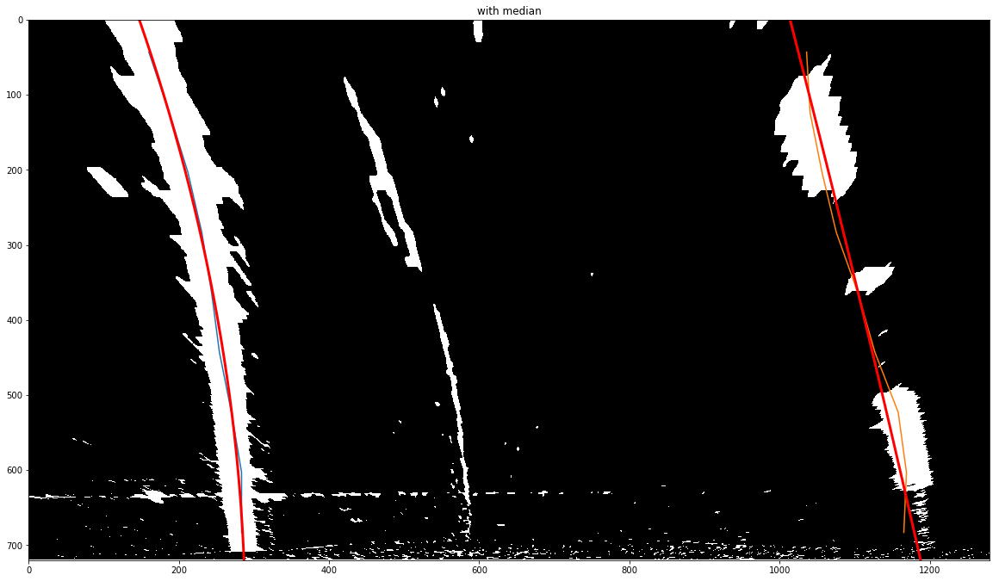

with weighted
median with average
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]]
data [[ 282.5]
 [ 284.5]]
minus median [[ 1.]
 [ 1.]]
median/mdev 1.0
s - d/mdev [[ 1.]
 [ 1.]] m 3
data[s<m] [ 282.5  284.5] 

data [[ 1165.5]
 [ 1165.5]]
minus median [[ 0.]
 [ 0.]]
median/mdev 0.0
cleandata shape (2,)
cleandata shape (2, 1)
[20, 50]
[20, 50]
flattened [ 282.5  284.5]
clean left [ 282.5  284.5]
weighted av 283.928571429
clean right [ 1165.5  1165.5]
weighted av 1165.5
leftx 283.5
rightx 1165.5
y [ 683.]



point -  1
column l [[ 282.5  603. ]
 [ 284.5  603. ]]
column r [[ 1170.5   603. ]
 [ 1167.5   603. ]]
data [[ 282.5]
 [ 284.5]]
minus median [[ 1.]
 [ 1.]]
median/mdev 1.0
s - d/mdev [[ 1.]
 [ 1.]] m 3
data[s<m] [ 282.5  284.5] 

data [[ 1170.5]
 [ 1167.5]]
minus median [[ 1.5]
 [ 1.5]]
median/mdev 1.5
s - d/mdev [[ 1.]
 [ 1.]] m 3
data[s<m] [ 1170.5  1167.5] 

cleandata shape (2,)
cleandata shape (2,)
[20, 50]
[20, 50]


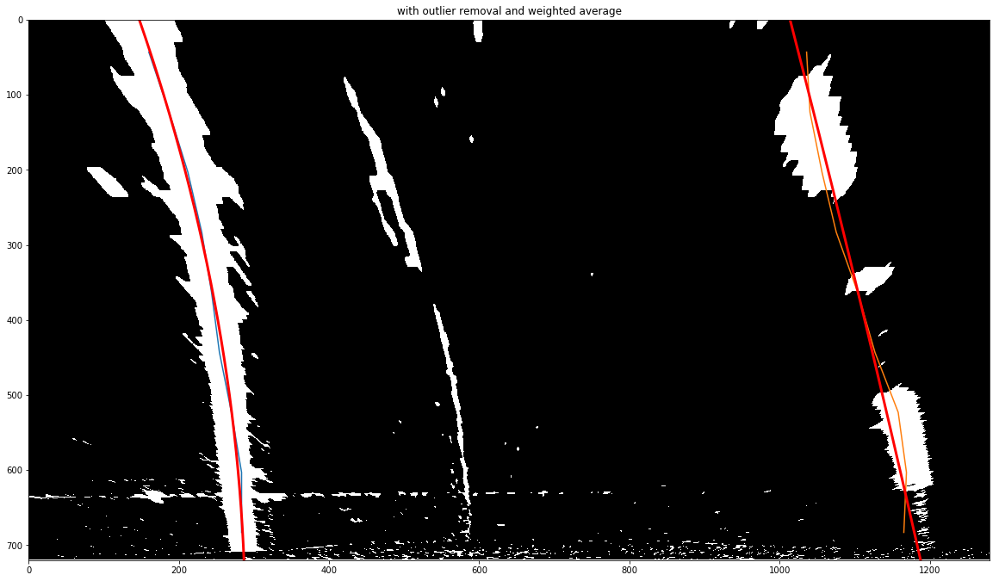

283.5 1165.5 -0.446642857143
776.348424768 m 7479.72725995 m
776.348424768 7479.72725995
Left curve radius 776.35 m
Right curve radius 7479.73 m
Car position -0.4466 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


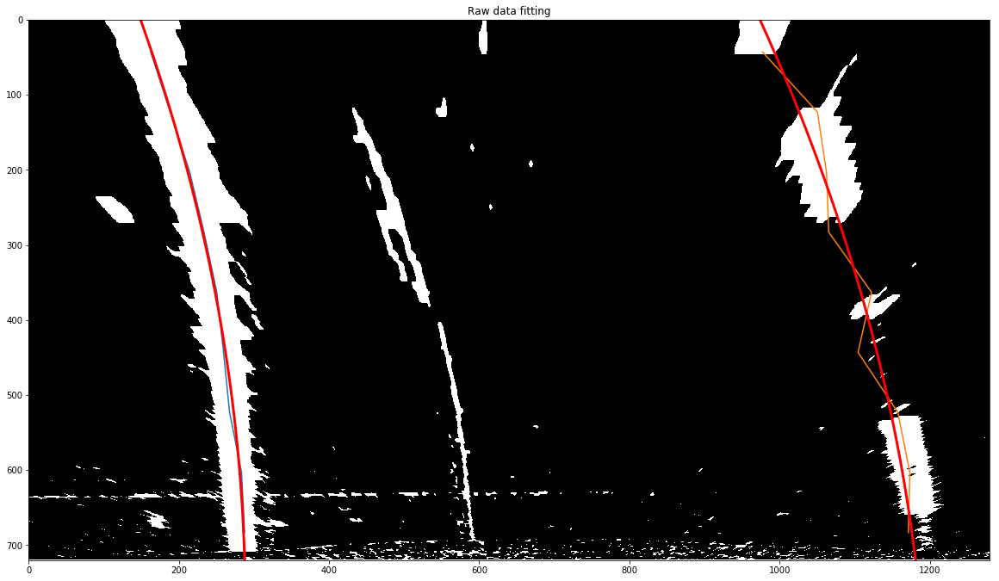

deque([[(282.5, 683), (282.5, 603), (271.5, 523), (257.5, 443), (239.5, 363), (232.5, 283), (211.5, 203), (189.5, 123), (159.5, 43)], [(284.5, 683), (284.5, 603), (268.5, 523), (250.5, 443), (247.5, 363), (228.5, 283), (212.5, 203), (184.5, 123), (160.5, 43)], [(287.5, 683), (283.5, 603), (267.5, 523), (259.5, 443), (250.5, 363), (233.5, 283), (214.5, 203), (188.5, 123), (162.5, 43)]], maxlen=25)
deque([[(1165.5, 683), (1170.5, 603), (1158.5, 523), (1147.5, 443), (1092.5, 363), (1111.5, 283), (1053.5, 203), (1039.5, 123), (1039.5, 43)], [(1165.5, 683), (1167.5, 603), (1157.5, 523), (1106.5, 443), (1115.5, 363), (1039.5, 283), (1059.5, 203), (1041.5, 123), (1032.5, 43)], [(1171.5, 683), (1173.5, 603), (1157.5, 523), (1104.5, 443), (1122.5, 363), (1065.5, 283), (1062.5, 203), (1050.5, 123), (977.5, 43)]], maxlen=25)
with mean
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]]
column l shape (3, 2)
column r shape

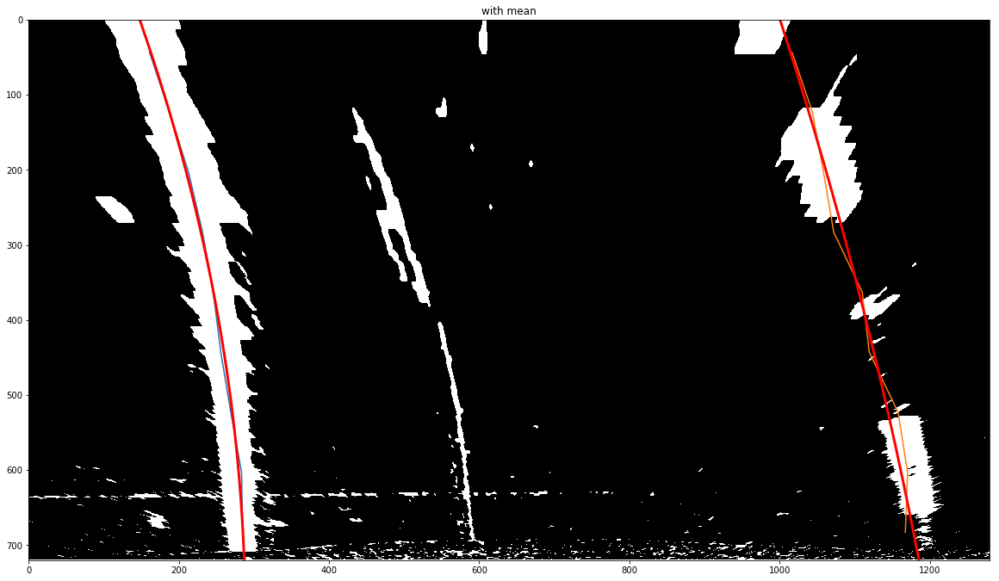

with median
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]]
minus median [[ 2.]
 [ 0.]
 [ 3.]]
median/mdev 2.0
s - d/mdev [[ 1. ]
 [ 0. ]
 [ 1.5]] m 10
data[s<m] [ 282.5  284.5  287.5] 

data [[ 1165.5]
 [ 1165.5]
 [ 1171.5]]
minus median [[ 0.]
 [ 0.]
 [ 6.]]
median/mdev 0.0
leftx 284.5
rightx 1165.5
y [ 683.]



point -  1
column l [[ 282.5  603. ]
 [ 284.5  603. ]
 [ 283.5  603. ]]
column r [[ 1170.5   603. ]
 [ 1167.5   603. ]
 [ 1173.5   603. ]]
data [[ 282.5]
 [ 284.5]
 [ 283.5]]
minus median [[ 1.]
 [ 1.]
 [ 0.]]
median/mdev 1.0
s - d/mdev [[ 1.]
 [ 1.]
 [ 0.]] m 10
data[s<m] [ 282.5  284.5  283.5] 

data [[ 1170.5]
 [ 1167.5]
 [ 1173.5]]
minus median [[ 0.]
 [ 3.]
 [ 3.]]
median/mdev 3.0
s - d/mdev [[ 0.]
 [ 1.]
 [ 1.]] m 10
data[s<m] [ 1170.5  1167.5  1173.5] 

leftx 283.5
rightx 1170.5
y [ 603.]



point -  2
column l [[ 271.5  523. ]
 [ 268.

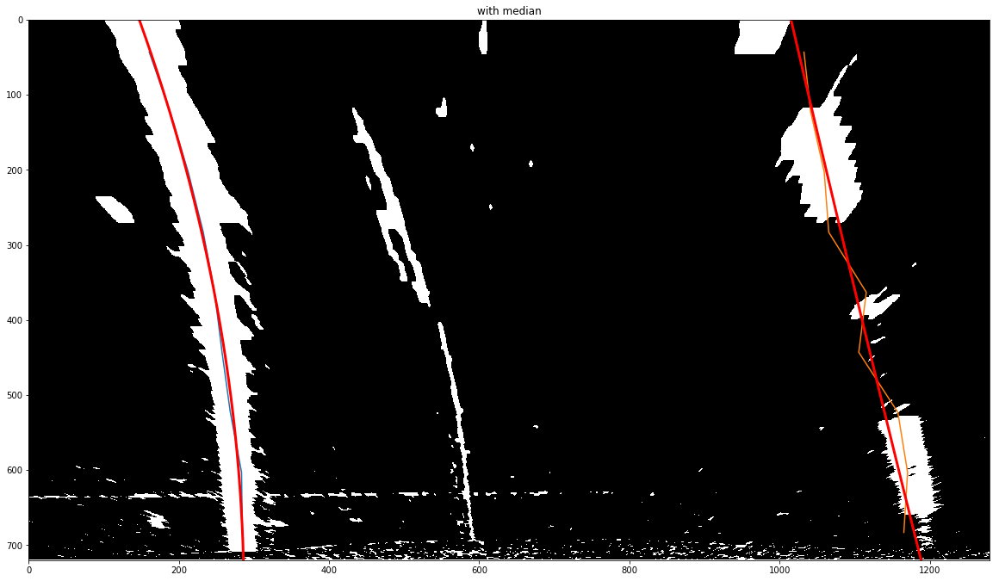

with weighted
median with average
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]]
minus median [[ 2.]
 [ 0.]
 [ 3.]]
median/mdev 2.0
s - d/mdev [[ 1. ]
 [ 0. ]
 [ 1.5]] m 3
data[s<m] [ 282.5  284.5  287.5] 

data [[ 1165.5]
 [ 1165.5]
 [ 1171.5]]
minus median [[ 0.]
 [ 0.]
 [ 6.]]
median/mdev 0.0
cleandata shape (3,)
cleandata shape (3, 1)
[10, 20, 50]
[10, 20, 50]
flattened [ 282.5  284.5  287.5]
clean left [ 282.5  284.5  287.5]
weighted av 286.125
clean right [ 1165.5  1165.5  1171.5]
weighted av 1169.25
leftx 284.5
rightx 1165.5
y [ 683.]



point -  1
column l [[ 282.5  603. ]
 [ 284.5  603. ]
 [ 283.5  603. ]]
column r [[ 1170.5   603. ]
 [ 1167.5   603. ]
 [ 1173.5   603. ]]
data [[ 282.5]
 [ 284.5]
 [ 283.5]]
minus median [[ 1.]
 [ 1.]
 [ 0.]]
median/mdev 1.0
s - d/mdev [[ 1.]
 [ 1.]
 [ 0.]] m 3
data[s<m] [ 282.5  284.5  283.5] 

data [[ 1170.5

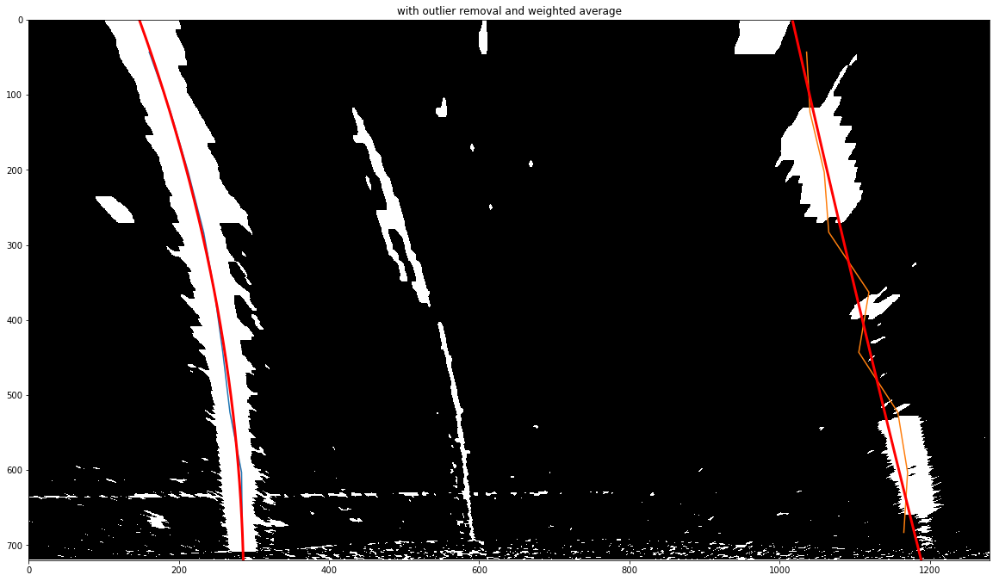

284.5 1165.5 -0.446642857143
757.766642707 m 1800.0530063 m
757.766642707 1800.0530063
Left curve radius 757.77 m
Right curve radius 1800.05 m
Car position -0.4466 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


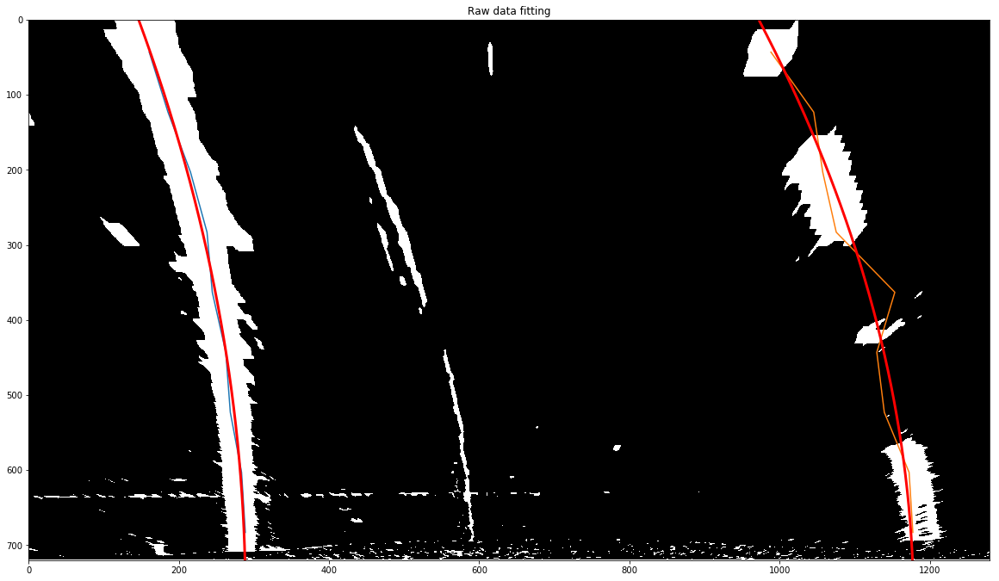

deque([[(282.5, 683), (282.5, 603), (271.5, 523), (257.5, 443), (239.5, 363), (232.5, 283), (211.5, 203), (189.5, 123), (159.5, 43)], [(284.5, 683), (284.5, 603), (268.5, 523), (250.5, 443), (247.5, 363), (228.5, 283), (212.5, 203), (184.5, 123), (160.5, 43)], [(287.5, 683), (283.5, 603), (267.5, 523), (259.5, 443), (250.5, 363), (233.5, 283), (214.5, 203), (188.5, 123), (162.5, 43)], [(288.5, 683), (283.5, 603), (268.5, 523), (262.5, 443), (244.5, 363), (237.5, 283), (215.5, 203), (185.5, 123), (160.5, 43)]], maxlen=25)
deque([[(1165.5, 683), (1170.5, 603), (1158.5, 523), (1147.5, 443), (1092.5, 363), (1111.5, 283), (1053.5, 203), (1039.5, 123), (1039.5, 43)], [(1165.5, 683), (1167.5, 603), (1157.5, 523), (1106.5, 443), (1115.5, 363), (1039.5, 283), (1059.5, 203), (1041.5, 123), (1032.5, 43)], [(1171.5, 683), (1173.5, 603), (1157.5, 523), (1104.5, 443), (1122.5, 363), (1065.5, 283), (1062.5, 203), (1050.5, 123), (977.5, 43)], [(1177.5, 683), (1172.5, 603), (1139.5, 523), (1129.5, 443)

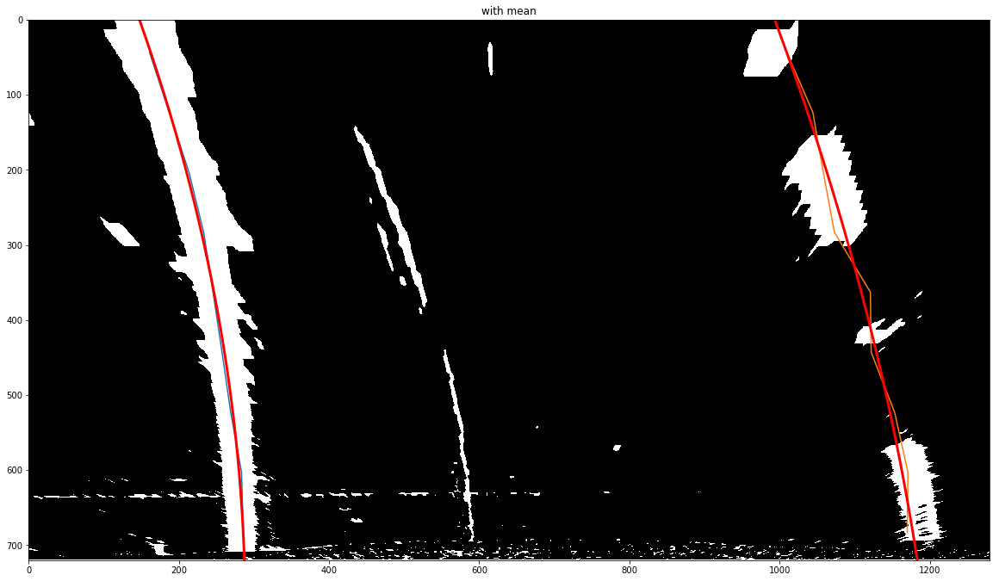

with median
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]
 [ 288.5]]
minus median [[ 3.5]
 [ 1.5]
 [ 1.5]
 [ 2.5]]
median/mdev 2.0
s - d/mdev [[ 1.75]
 [ 0.75]
 [ 0.75]
 [ 1.25]] m 10
data[s<m] [ 282.5  284.5  287.5  288.5] 

data [[ 1165.5]
 [ 1165.5]
 [ 1171.5]
 [ 1177.5]]
minus median [[ 3.]
 [ 3.]
 [ 3.]
 [ 9.]]
median/mdev 3.0
s - d/mdev [[ 1.]
 [ 1.]
 [ 1.]
 [ 3.]] m 10
data[s<m] [ 1165.5  1165.5  1171.5  1177.5] 

leftx 286.0
rightx 1168.5
y [ 683.]



point -  1
column l [[ 282.5  603. ]
 [ 284.5  603. ]
 [ 283.5  603. ]
 [ 283.5  603. ]]
column r [[ 1170.5   603. ]
 [ 1167.5   603. ]
 [ 1173.5   603. ]
 [ 1172.5   603. ]]
data [[ 282.5]
 [ 284.5]
 [ 283.5]
 [ 283.5]]
minus median [[ 1.]
 [ 1.]
 [ 0.]
 [ 0.]]
median/mdev 0.5
s - d/mdev [[ 2.]
 [ 2.]
 [ 0.]
 [ 0.]] m 10
data[s<m] [ 282.5  284.5  283.5  283.5]

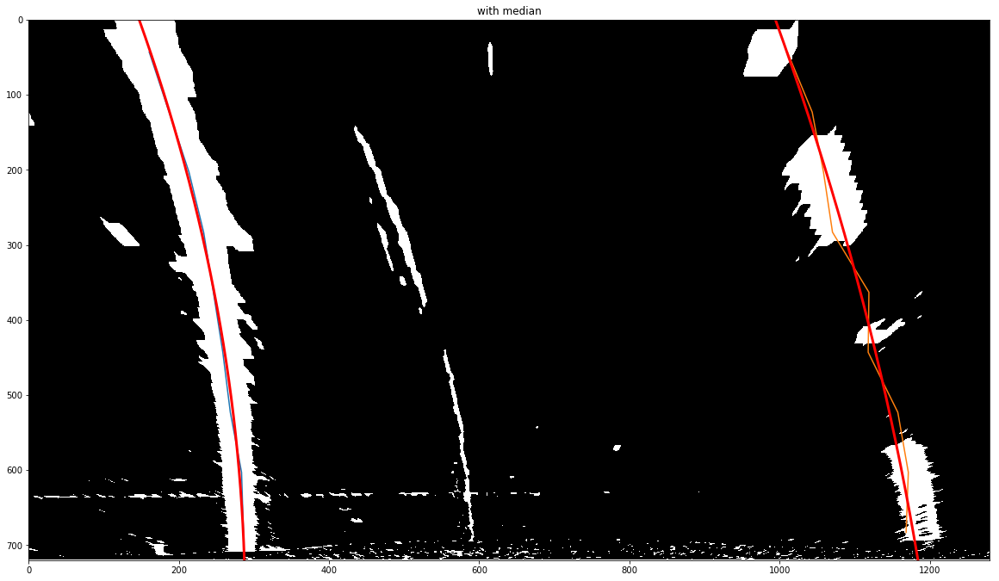

with weighted
median with average
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]
 [ 288.5]]
minus median [[ 3.5]
 [ 1.5]
 [ 1.5]
 [ 2.5]]
median/mdev 2.0
s - d/mdev [[ 1.75]
 [ 0.75]
 [ 0.75]
 [ 1.25]] m 3
data[s<m] [ 282.5  284.5  287.5  288.5] 

data [[ 1165.5]
 [ 1165.5]
 [ 1171.5]
 [ 1177.5]]
minus median [[ 3.]
 [ 3.]
 [ 3.]
 [ 9.]]
median/mdev 3.0
s - d/mdev [[ 1.]
 [ 1.]
 [ 1.]
 [ 3.]] m 3
data[s<m] [ 1165.5  1165.5  1171.5] 

cleandata shape (4,)
cleandata shape (3,)
[5, 10, 20, 50]
[10, 20, 50]
flattened [ 282.5  284.5  287.5  288.5]
clean left [ 282.5  284.5  287.5  288.5]
weighted av 287.441176471
clean right [ 1165.5  1165.5  1171.5]
weighted av 1169.25
leftx 286.0
rightx 1165.5
y [ 683.]



point -  1
column l [[ 282.5  603. ]
 [ 284.5  603. ]
 [ 283.5  603. ]
 [ 283.5  603. ]]
column r [[ 1170.5   603. 

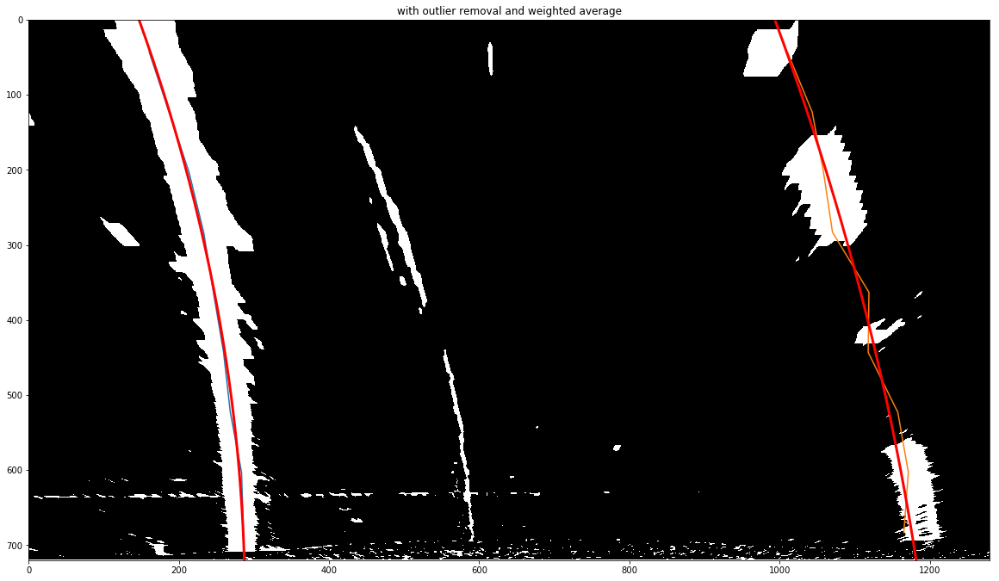

286.0 1165.5 -0.449285714286
739.679568306 m 1086.64816305 m
739.679568306 1086.64816305
Left curve radius 739.68 m
Right curve radius 1086.65 m
Car position -0.4493 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


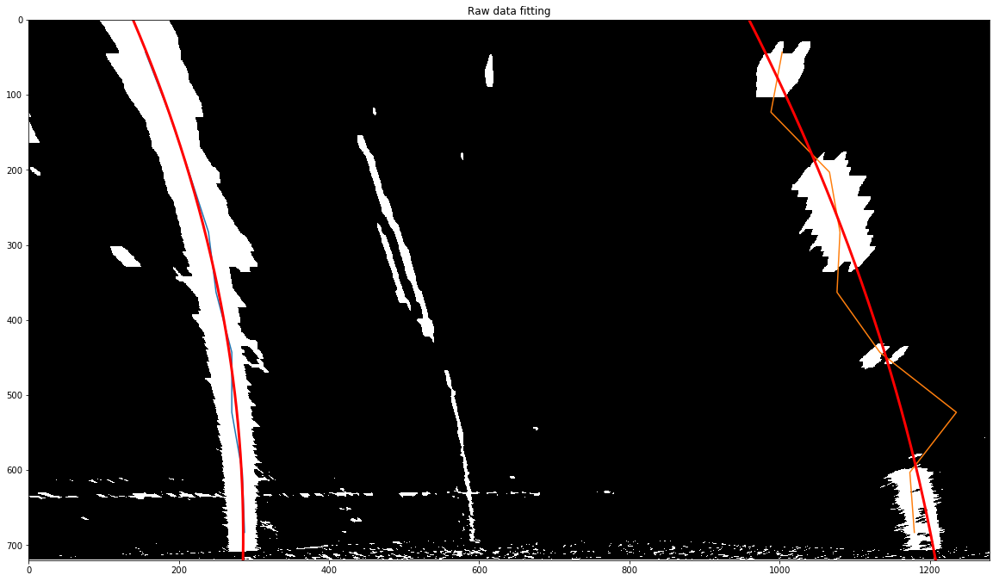

deque([[(282.5, 683), (282.5, 603), (271.5, 523), (257.5, 443), (239.5, 363), (232.5, 283), (211.5, 203), (189.5, 123), (159.5, 43)], [(284.5, 683), (284.5, 603), (268.5, 523), (250.5, 443), (247.5, 363), (228.5, 283), (212.5, 203), (184.5, 123), (160.5, 43)], [(287.5, 683), (283.5, 603), (267.5, 523), (259.5, 443), (250.5, 363), (233.5, 283), (214.5, 203), (188.5, 123), (162.5, 43)], [(288.5, 683), (283.5, 603), (268.5, 523), (262.5, 443), (244.5, 363), (237.5, 283), (215.5, 203), (185.5, 123), (160.5, 43)], [(287.5, 683), (284.5, 603), (270.5, 523), (270.5, 443), (249.5, 363), (239.5, 283), (213.5, 203), (186.5, 123), (155.5, 43)]], maxlen=25)
deque([[(1165.5, 683), (1170.5, 603), (1158.5, 523), (1147.5, 443), (1092.5, 363), (1111.5, 283), (1053.5, 203), (1039.5, 123), (1039.5, 43)], [(1165.5, 683), (1167.5, 603), (1157.5, 523), (1106.5, 443), (1115.5, 363), (1039.5, 283), (1059.5, 203), (1041.5, 123), (1032.5, 43)], [(1171.5, 683), (1173.5, 603), (1157.5, 523), (1104.5, 443), (1122.

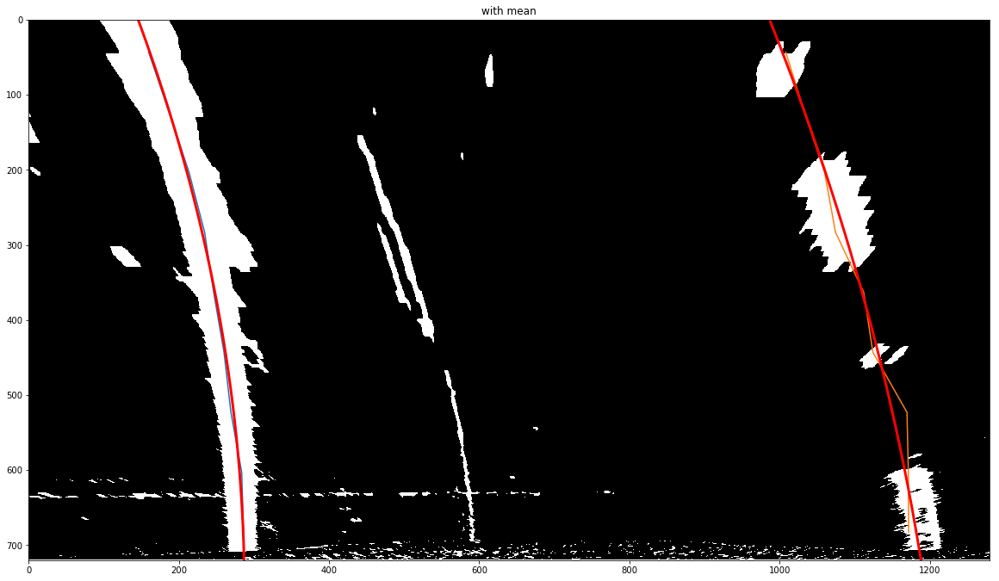

with median
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]
 [ 288.5]
 [ 287.5]]
minus median [[ 5.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 0.]]
median/mdev 1.0
s - d/mdev [[ 5.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 0.]] m 10
data[s<m] [ 282.5  284.5  287.5  288.5  287.5] 

data [[ 1165.5]
 [ 1165.5]
 [ 1171.5]
 [ 1177.5]
 [ 1179.5]]
minus median [[ 6.]
 [ 6.]
 [ 0.]
 [ 6.]
 [ 8.]]
median/mdev 6.0
s - d/mdev [[ 1.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 1.33333333]] m 10
data[s<m] [ 1165.5  1165.5  1171.5  1177.5  1179.5] 

leftx 287.5
rightx 1171.5
y [ 683.]



point -  1
column l [[ 282.5  603. ]
 [ 284.5  603. ]
 [ 283.5  603. ]
 [ 283.5  603. ]
 [ 284.5  603. ]]
column r [[ 1170.5   603. ]
 [ 1167.5   603. ]
 [ 1173.5   603. ]
 [ 1172.5   603. ]
 [ 1173.5   603. ]]
data [[ 282.5]
 [ 284.5]

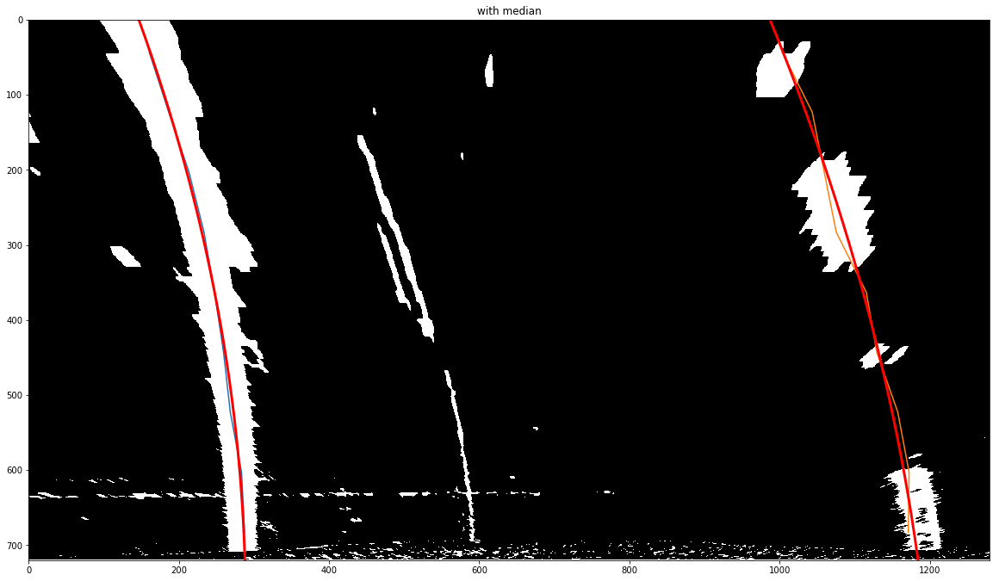

with weighted
median with average
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]
 [ 288.5]
 [ 287.5]]
minus median [[ 5.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 0.]]
median/mdev 1.0
s - d/mdev [[ 5.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 0.]] m 3
data[s<m] [ 287.5  288.5  287.5] 

data [[ 1165.5]
 [ 1165.5]
 [ 1171.5]
 [ 1177.5]
 [ 1179.5]]
minus median [[ 6.]
 [ 6.]
 [ 0.]
 [ 6.]
 [ 8.]]
median/mdev 6.0
s - d/mdev [[ 1.        ]
 [ 1.        ]
 [ 0.        ]
 [ 1.        ]
 [ 1.33333333]] m 3
data[s<m] [ 1165.5  1165.5  1171.5  1177.5  1179.5] 

cleandata shape (3,)
cleandata shape (5,)
[10, 20, 50]
[5, 5, 10, 20, 50]
flattened [ 282.5  284.5  287.5  288.5  287.5]
clean left [ 287.5  288.5  287.5]
weighted av 287.75
clean right [ 1165.5  1165.5  1171.5  1177.5  1179.5]
weighted av 1176.61111111
leftx 287.5
ri

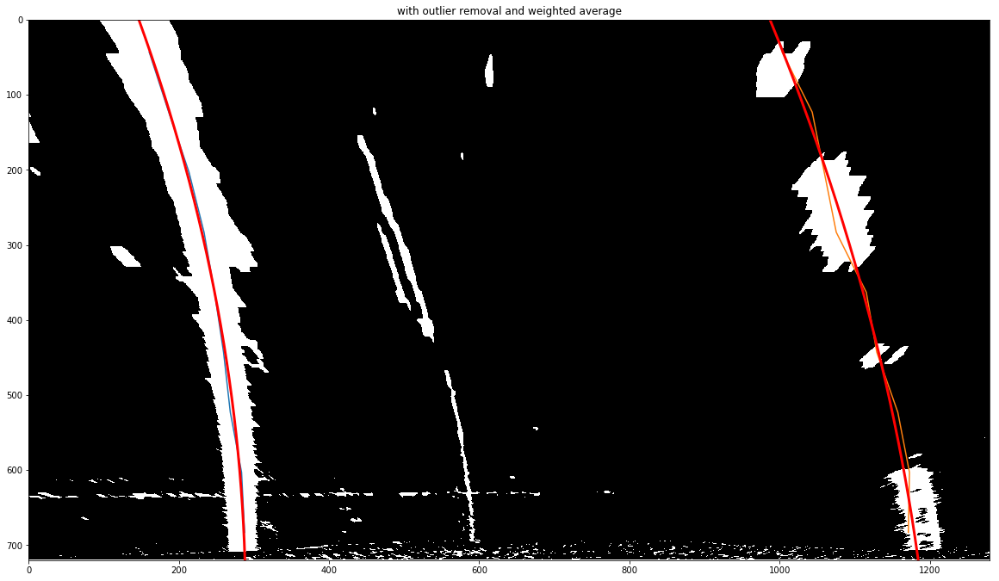

287.5 1171.5 -0.473071428571
685.574305493 m 991.003572465 m
685.574305493 991.003572465
Left curve radius 685.57 m
Right curve radius 991.00 m
Car position -0.4731 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


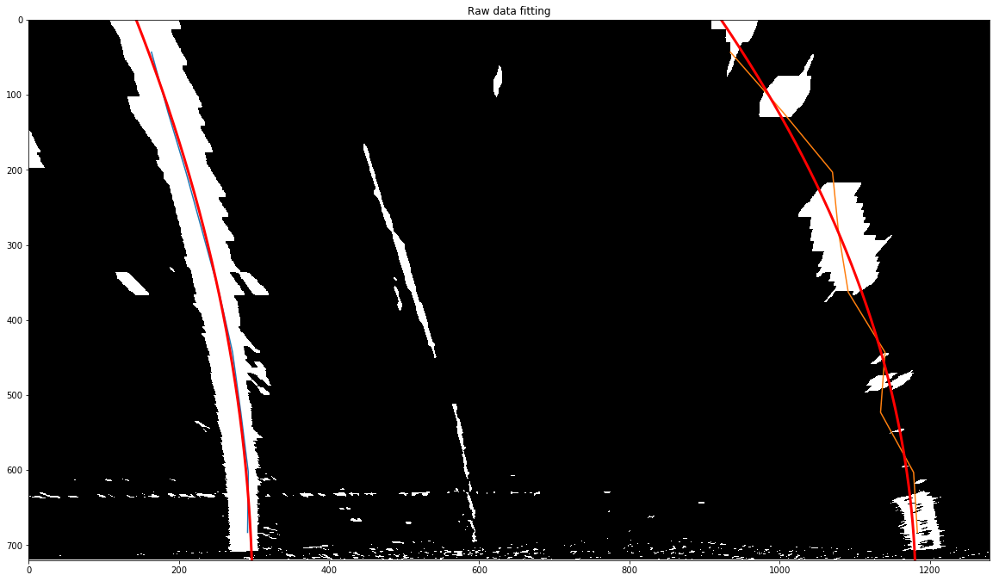

deque([[(282.5, 683), (282.5, 603), (271.5, 523), (257.5, 443), (239.5, 363), (232.5, 283), (211.5, 203), (189.5, 123), (159.5, 43)], [(284.5, 683), (284.5, 603), (268.5, 523), (250.5, 443), (247.5, 363), (228.5, 283), (212.5, 203), (184.5, 123), (160.5, 43)], [(287.5, 683), (283.5, 603), (267.5, 523), (259.5, 443), (250.5, 363), (233.5, 283), (214.5, 203), (188.5, 123), (162.5, 43)], [(288.5, 683), (283.5, 603), (268.5, 523), (262.5, 443), (244.5, 363), (237.5, 283), (215.5, 203), (185.5, 123), (160.5, 43)], [(287.5, 683), (284.5, 603), (270.5, 523), (270.5, 443), (249.5, 363), (239.5, 283), (213.5, 203), (186.5, 123), (155.5, 43)], [(291.5, 683), (292.5, 603), (282.5, 523), (271.5, 443), (253.5, 363), (231.5, 283), (209.5, 203), (185.5, 123), (163.5, 43)]], maxlen=25)
deque([[(1165.5, 683), (1170.5, 603), (1158.5, 523), (1147.5, 443), (1092.5, 363), (1111.5, 283), (1053.5, 203), (1039.5, 123), (1039.5, 43)], [(1165.5, 683), (1167.5, 603), (1157.5, 523), (1106.5, 443), (1115.5, 363), 

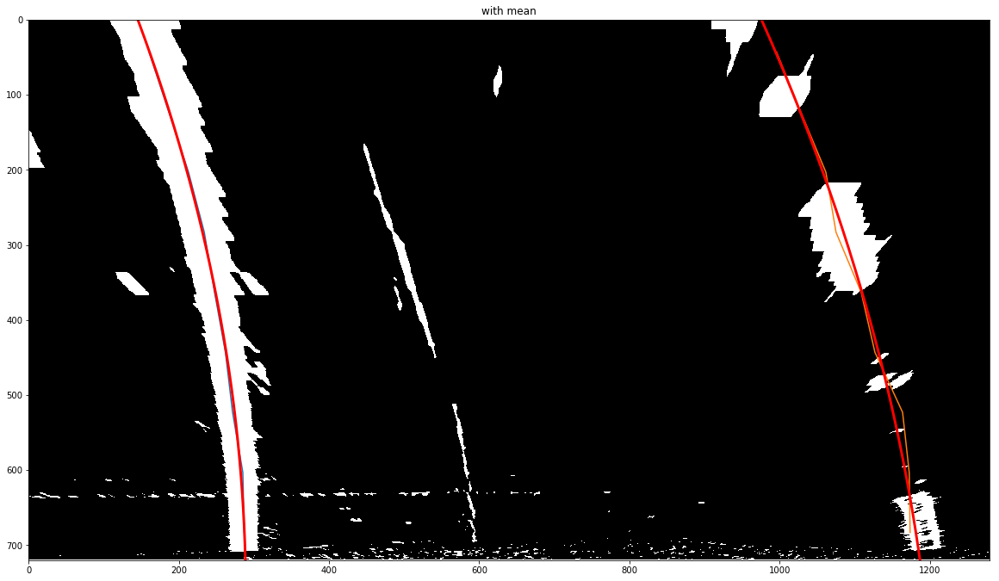

with median
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]
 [ 288.5]
 [ 287.5]
 [ 291.5]]
minus median [[ 5.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 4.]]
median/mdev 2.0
s - d/mdev [[ 2.5]
 [ 1.5]
 [ 0. ]
 [ 0.5]
 [ 0. ]
 [ 2. ]] m 10
data[s<m] [ 282.5  284.5  287.5  288.5  287.5  291.5] 

data [[ 1165.5]
 [ 1165.5]
 [ 1171.5]
 [ 1177.5]
 [ 1179.5]
 [ 1183.5]]
minus median [[ 9.]
 [ 9.]
 [ 3.]
 [ 3.]
 [ 5.]
 [ 9.]]
median/mdev 7.0
s - d/mdev [[ 1.28571429]
 [ 1.28571429]
 [ 0.42857143]
 [ 0.42857143]
 [ 0.71428571]
 [ 1.28571429]] m 10
data[s<m] [ 1165.5  1165.5  1171.5  1177.5  1179.5  1183.5] 

leftx 287.5
rightx 1174.5
y [ 683.]



point -  1
column l [[ 282.5  603. ]
 [ 284.5  603. ]
 [ 283.5  603. ]
 [ 283.5  603. ]
 [ 284.5  603. ]
 [ 292.5  603. ]

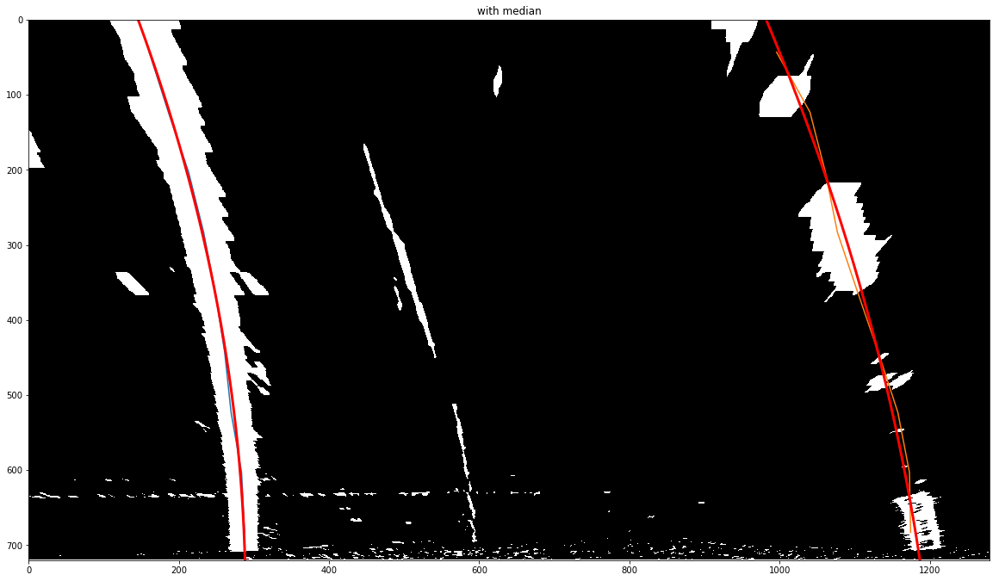

with weighted
median with average
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]
 [ 288.5]
 [ 287.5]
 [ 291.5]]
minus median [[ 5.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 4.]]
median/mdev 2.0
s - d/mdev [[ 2.5]
 [ 1.5]
 [ 0. ]
 [ 0.5]
 [ 0. ]
 [ 2. ]] m 3
data[s<m] [ 282.5  284.5  287.5  288.5  287.5  291.5] 

data [[ 1165.5]
 [ 1165.5]
 [ 1171.5]
 [ 1177.5]
 [ 1179.5]
 [ 1183.5]]
minus median [[ 9.]
 [ 9.]
 [ 3.]
 [ 3.]
 [ 5.]
 [ 9.]]
median/mdev 7.0
s - d/mdev [[ 1.28571429]
 [ 1.28571429]
 [ 0.42857143]
 [ 0.42857143]
 [ 0.71428571]
 [ 1.28571429]] m 3
data[s<m] [ 1165.5  1165.5  1171.5  1177.5  1179.5  1183.5] 

cleandata shape (6,)
cleandata shape (6,)
[1, 5, 5, 10, 20, 50]
[1, 5, 5, 10, 20, 50]
flattened [ 282.5  284.5  287.5  288.5  287.5  291.5]


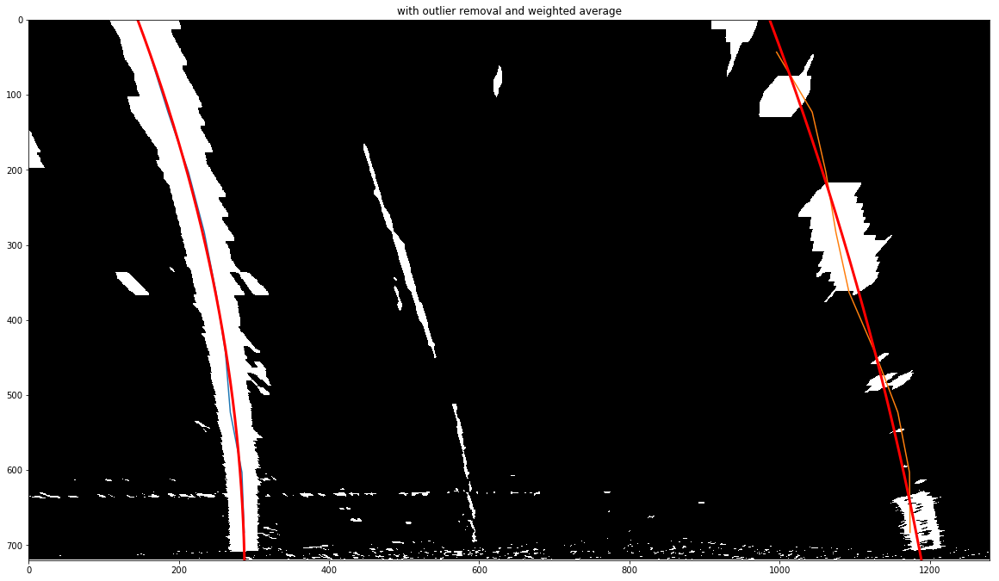

287.0 1173.83333333 -0.475714285714
681.21586488 m 776.171703191 m
681.21586488 776.171703191
Left curve radius 681.22 m
Right curve radius 776.17 m
Car position -0.4757 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


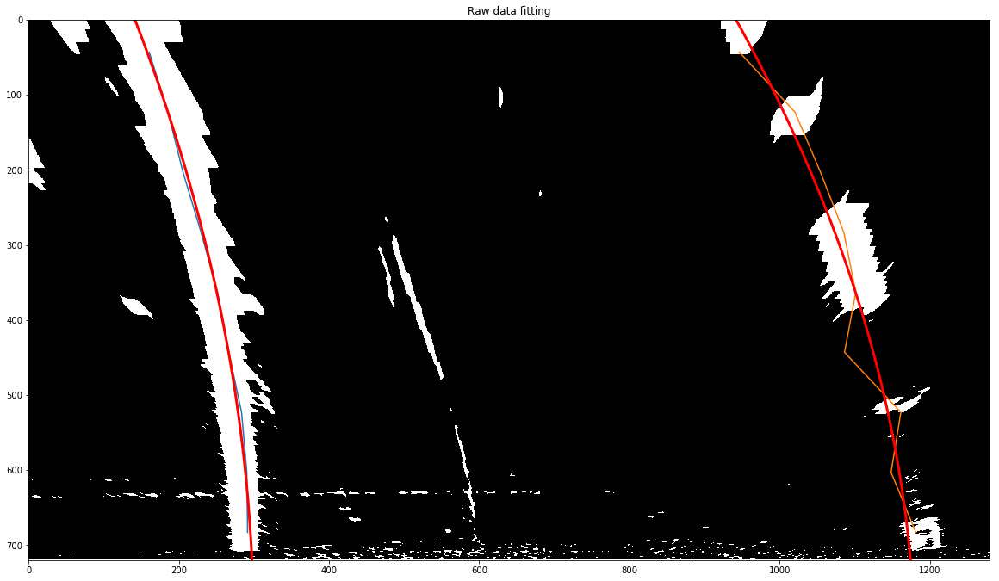

deque([[(282.5, 683), (282.5, 603), (271.5, 523), (257.5, 443), (239.5, 363), (232.5, 283), (211.5, 203), (189.5, 123), (159.5, 43)], [(284.5, 683), (284.5, 603), (268.5, 523), (250.5, 443), (247.5, 363), (228.5, 283), (212.5, 203), (184.5, 123), (160.5, 43)], [(287.5, 683), (283.5, 603), (267.5, 523), (259.5, 443), (250.5, 363), (233.5, 283), (214.5, 203), (188.5, 123), (162.5, 43)], [(288.5, 683), (283.5, 603), (268.5, 523), (262.5, 443), (244.5, 363), (237.5, 283), (215.5, 203), (185.5, 123), (160.5, 43)], [(287.5, 683), (284.5, 603), (270.5, 523), (270.5, 443), (249.5, 363), (239.5, 283), (213.5, 203), (186.5, 123), (155.5, 43)], [(291.5, 683), (292.5, 603), (282.5, 523), (271.5, 443), (253.5, 363), (231.5, 283), (209.5, 203), (185.5, 123), (163.5, 43)], [(291.5, 683), (290.5, 603), (283.5, 523), (266.5, 443), (251.5, 363), (229.5, 283), (205.5, 203), (185.5, 123), (160.5, 43)]], maxlen=25)
deque([[(1165.5, 683), (1170.5, 603), (1158.5, 523), (1147.5, 443), (1092.5, 363), (1111.5, 

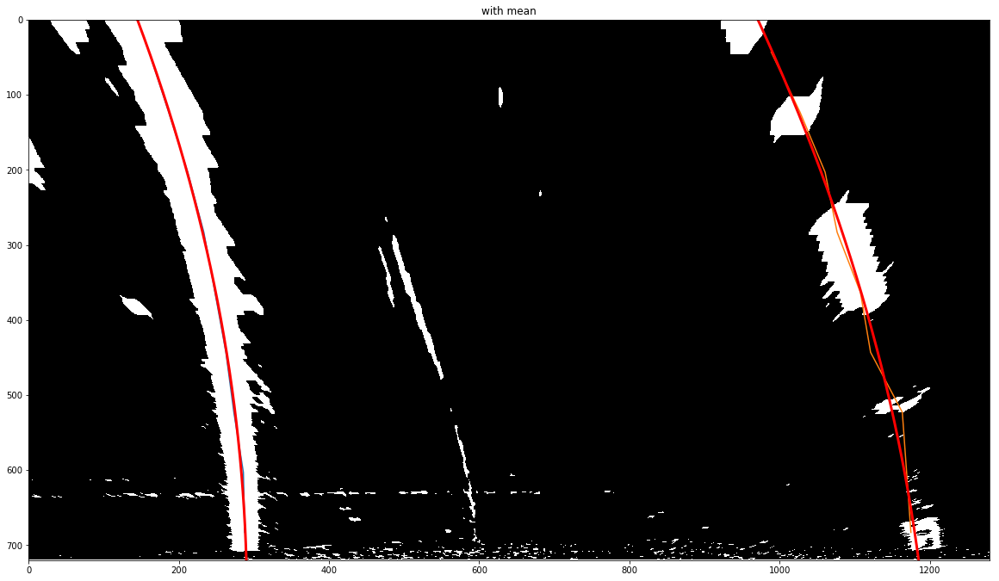

with median
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]
 [ 288.5]
 [ 287.5]
 [ 291.5]
 [ 291.5]]
minus median [[ 5.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 4.]]
median/mdev 3.0
s - d/mdev [[ 1.66666667]
 [ 1.        ]
 [ 0.        ]
 [ 0.33333333]
 [ 0.        ]
 [ 1.33333333]
 [ 1.33333333]] m 10
data[s<m] [ 282.5  284.5  287.5  288.5  287.5  291.5  291.5] 

data [[ 1165.5]
 [ 1165.5]
 [ 1171.5]
 [ 1177.5]
 [ 1179.5]
 [ 1183.5]
 [ 1181.5]]
minus median [[ 12.]
 [ 12.]
 [  6.]
 [  0.]
 [  2.]
 [  6.]
 [  4.]]
median/mdev 6.0
s - d/mdev [[ 2.        ]
 [ 2.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.33333333]
 [ 1.        ]
 [ 0.66666667]] m 10
data[s<m] [ 1165.5  1165.5  1171.5  1177.5  1179.5  1183.5  1181.

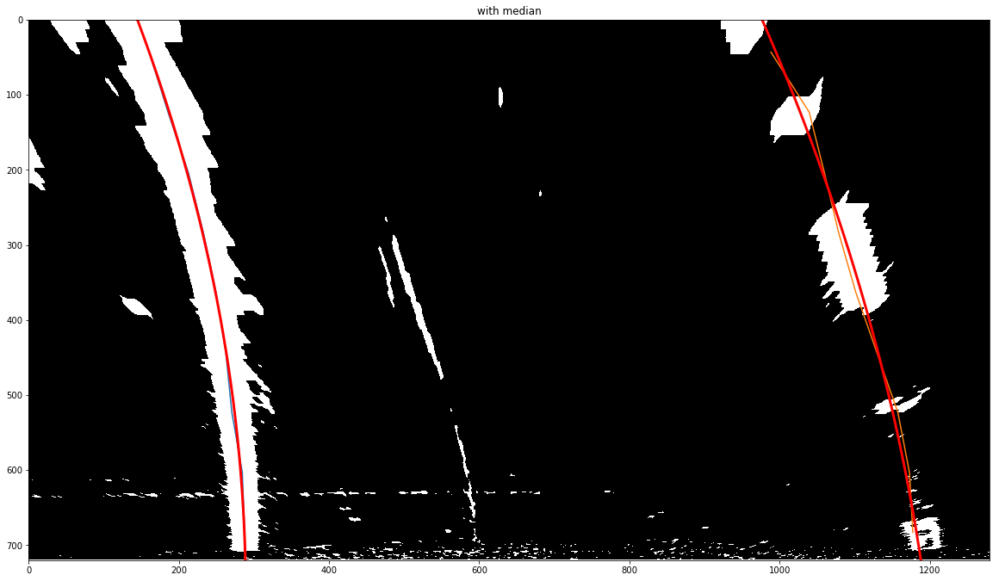

with weighted
median with average
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]
 [ 288.5]
 [ 287.5]
 [ 291.5]
 [ 291.5]]
minus median [[ 5.]
 [ 3.]
 [ 0.]
 [ 1.]
 [ 0.]
 [ 4.]
 [ 4.]]
median/mdev 3.0
s - d/mdev [[ 1.66666667]
 [ 1.        ]
 [ 0.        ]
 [ 0.33333333]
 [ 0.        ]
 [ 1.33333333]
 [ 1.33333333]] m 3
data[s<m] [ 282.5  284.5  287.5  288.5  287.5  291.5  291.5] 

data [[ 1165.5]
 [ 1165.5]
 [ 1171.5]
 [ 1177.5]
 [ 1179.5]
 [ 1183.5]
 [ 1181.5]]
minus median [[ 12.]
 [ 12.]
 [  6.]
 [  0.]
 [  2.]
 [  6.]
 [  4.]]
median/mdev 6.0
s - d/mdev [[ 2.        ]
 [ 2.        ]
 [ 1.        ]
 [ 0.        ]
 [ 0.33333333]
 [ 1.        ]
 [ 0.66666667]] m 3
data[s<m] [ 1165.5  1165.5  1171.5  1177.5  1

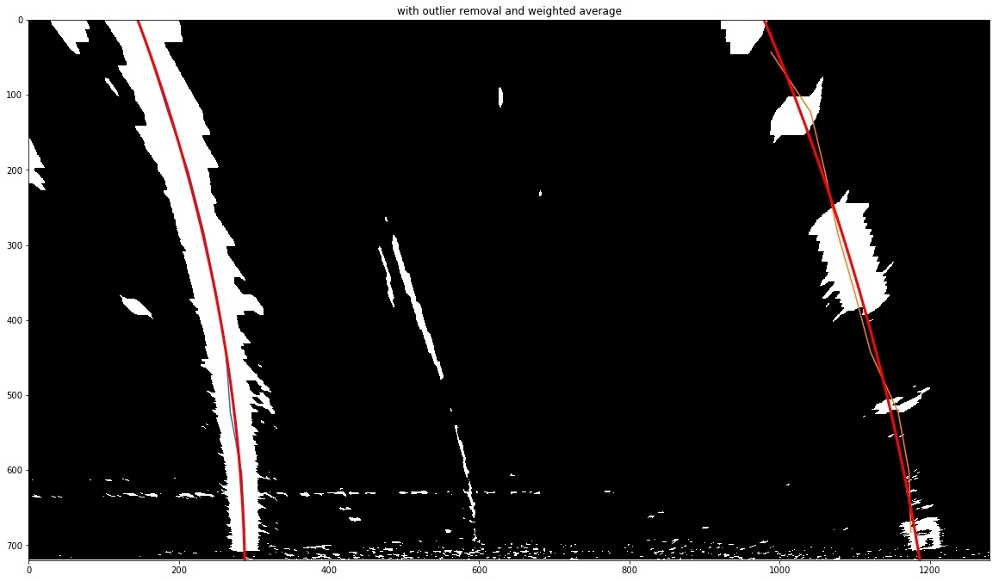

287.642857143 1174.92857143 -0.479112244898
683.937217414 m 721.529249884 m
683.937217414 721.529249884
Left curve radius 683.94 m
Right curve radius 721.53 m
Car position -0.4791 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


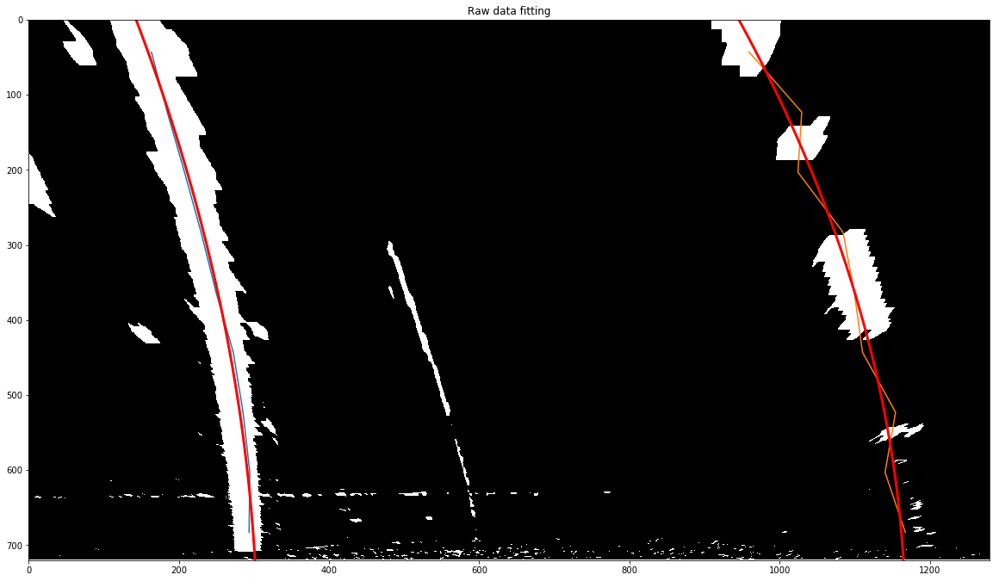

deque([[(282.5, 683), (282.5, 603), (271.5, 523), (257.5, 443), (239.5, 363), (232.5, 283), (211.5, 203), (189.5, 123), (159.5, 43)], [(284.5, 683), (284.5, 603), (268.5, 523), (250.5, 443), (247.5, 363), (228.5, 283), (212.5, 203), (184.5, 123), (160.5, 43)], [(287.5, 683), (283.5, 603), (267.5, 523), (259.5, 443), (250.5, 363), (233.5, 283), (214.5, 203), (188.5, 123), (162.5, 43)], [(288.5, 683), (283.5, 603), (268.5, 523), (262.5, 443), (244.5, 363), (237.5, 283), (215.5, 203), (185.5, 123), (160.5, 43)], [(287.5, 683), (284.5, 603), (270.5, 523), (270.5, 443), (249.5, 363), (239.5, 283), (213.5, 203), (186.5, 123), (155.5, 43)], [(291.5, 683), (292.5, 603), (282.5, 523), (271.5, 443), (253.5, 363), (231.5, 283), (209.5, 203), (185.5, 123), (163.5, 43)], [(291.5, 683), (290.5, 603), (283.5, 523), (266.5, 443), (251.5, 363), (229.5, 283), (205.5, 203), (185.5, 123), (160.5, 43)], [(293.5, 683), (294.5, 603), (285.5, 523), (272.5, 443), (249.5, 363), (229.5, 283), (207.5, 203), (184.

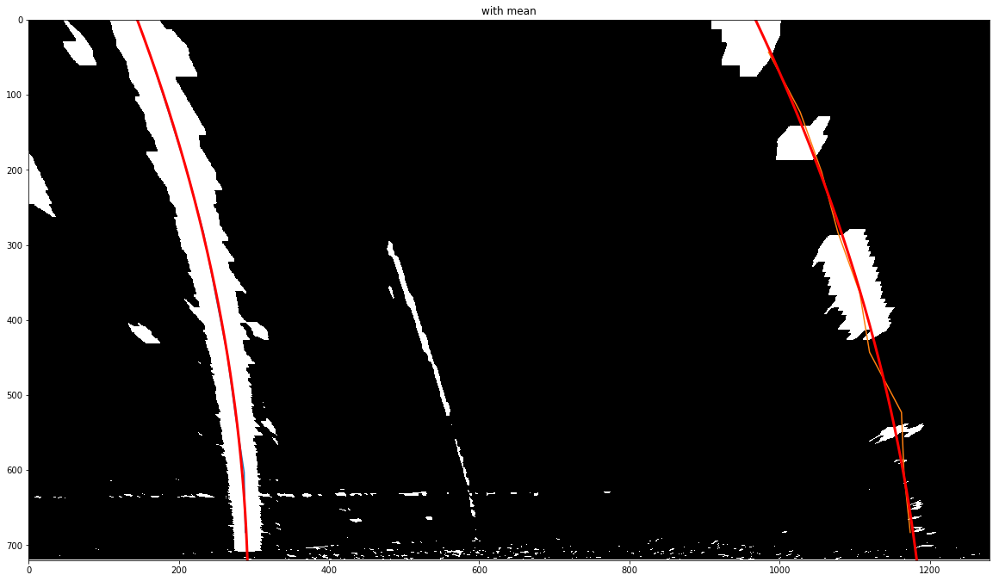

with median
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]
 [ 288.5]
 [ 287.5]
 [ 291.5]
 [ 291.5]
 [ 293.5]]
minus median [[ 5.5]
 [ 3.5]
 [ 0.5]
 [ 0.5]
 [ 0.5]
 [ 3.5]
 [ 3.5]
 [ 5.5]]
median/mdev 3.5
s - d/mdev [[ 1.57142857]
 [ 1.        ]
 [ 0.14285714]
 [ 0.14285714]
 [ 0.14285714]
 [ 1.        ]
 [ 1.        ]
 [ 1.57142857]] m 10
data[s<m] [ 282.5  284.5  287.5  288.5  287.5  291.5  291.5  293.5] 

data [[ 1165.5]
 [ 1165.5]
 [ 1171.5]
 [ 1177.5]
 [ 1179.5]
 [ 1183.5]
 [ 1181.5]
 [ 1167.5]]
minus median [[ 9.]
 [ 9.]
 [ 3.]
 [ 3.]
 [ 5.]
 [ 9.]
 [ 7.]
 [ 7.]]
median/mdev 7.0
s - d/mdev [[ 1.28571429]
 [ 1.28571429]
 [ 0.42857143]
 [ 0.42857143]
 [ 0.71428571]
 [ 1.28

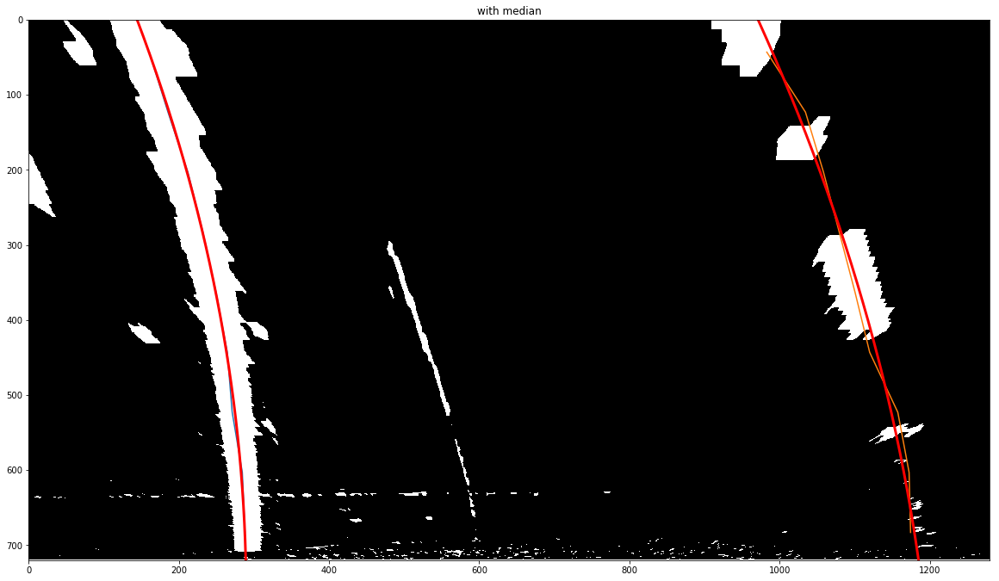

with weighted
median with average
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]
 [ 288.5]
 [ 287.5]
 [ 291.5]
 [ 291.5]
 [ 293.5]]
minus median [[ 5.5]
 [ 3.5]
 [ 0.5]
 [ 0.5]
 [ 0.5]
 [ 3.5]
 [ 3.5]
 [ 5.5]]
median/mdev 3.5
s - d/mdev [[ 1.57142857]
 [ 1.        ]
 [ 0.14285714]
 [ 0.14285714]
 [ 0.14285714]
 [ 1.        ]
 [ 1.        ]
 [ 1.57142857]] m 3
data[s<m] [ 282.5  284.5  287.5  288.5  287.5  291.5  291.5  293.5] 

data [[ 1165.5]
 [ 1165.5]
 [ 1171.5]
 [ 1177.5]
 [ 1179.5]
 [ 1183.5]
 [ 1181.5]
 [ 1167.5]]
minus median [[ 9.]
 [ 9.]
 [ 3.]
 [ 3.]
 [ 5.]
 [ 9.]
 [ 7.]
 [ 7.]]
median/mdev 7.0
s - d/mdev [[ 1.28571429]
 [ 1.28571429]
 [ 0.42857143]
 [ 0.42857143]
 

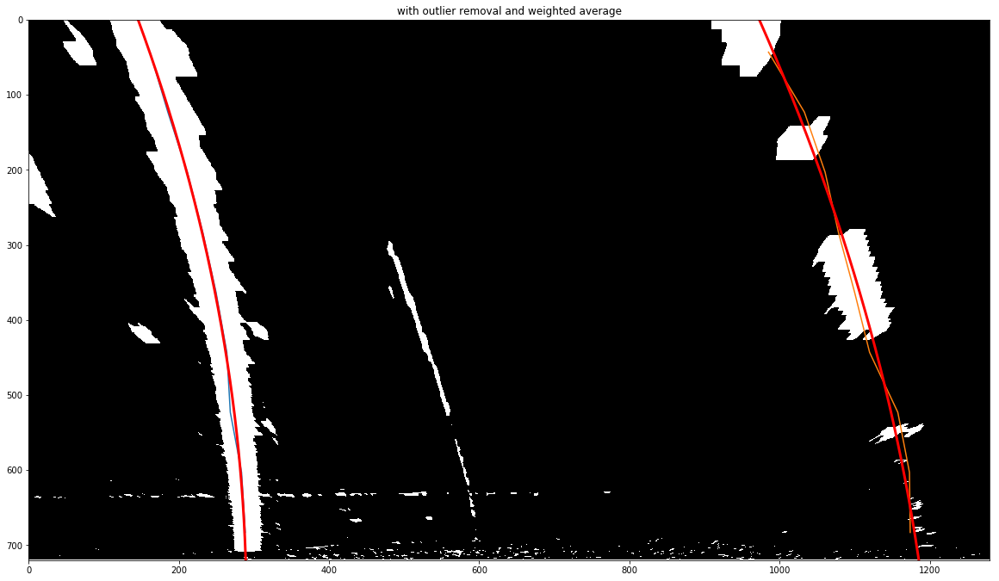

288.375 1174.0 -0.477696428571
690.076503181 m 680.76497194 m
690.076503181 680.76497194
Left curve radius 690.08 m
Right curve radius 680.76 m
Car position -0.4777 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


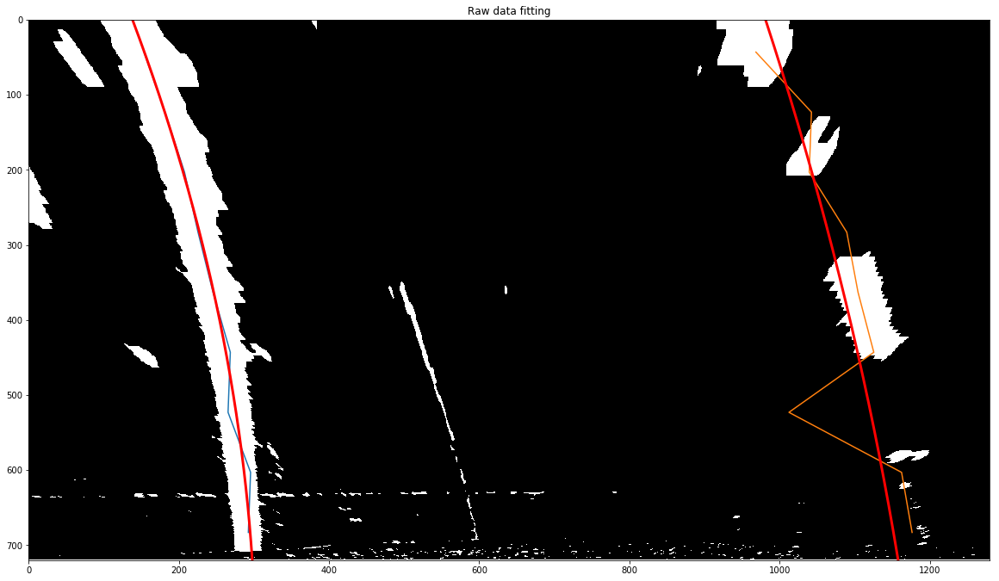

deque([[(282.5, 683), (282.5, 603), (271.5, 523), (257.5, 443), (239.5, 363), (232.5, 283), (211.5, 203), (189.5, 123), (159.5, 43)], [(284.5, 683), (284.5, 603), (268.5, 523), (250.5, 443), (247.5, 363), (228.5, 283), (212.5, 203), (184.5, 123), (160.5, 43)], [(287.5, 683), (283.5, 603), (267.5, 523), (259.5, 443), (250.5, 363), (233.5, 283), (214.5, 203), (188.5, 123), (162.5, 43)], [(288.5, 683), (283.5, 603), (268.5, 523), (262.5, 443), (244.5, 363), (237.5, 283), (215.5, 203), (185.5, 123), (160.5, 43)], [(287.5, 683), (284.5, 603), (270.5, 523), (270.5, 443), (249.5, 363), (239.5, 283), (213.5, 203), (186.5, 123), (155.5, 43)], [(291.5, 683), (292.5, 603), (282.5, 523), (271.5, 443), (253.5, 363), (231.5, 283), (209.5, 203), (185.5, 123), (163.5, 43)], [(291.5, 683), (290.5, 603), (283.5, 523), (266.5, 443), (251.5, 363), (229.5, 283), (205.5, 203), (185.5, 123), (160.5, 43)], [(293.5, 683), (294.5, 603), (285.5, 523), (272.5, 443), (249.5, 363), (229.5, 283), (207.5, 203), (184.

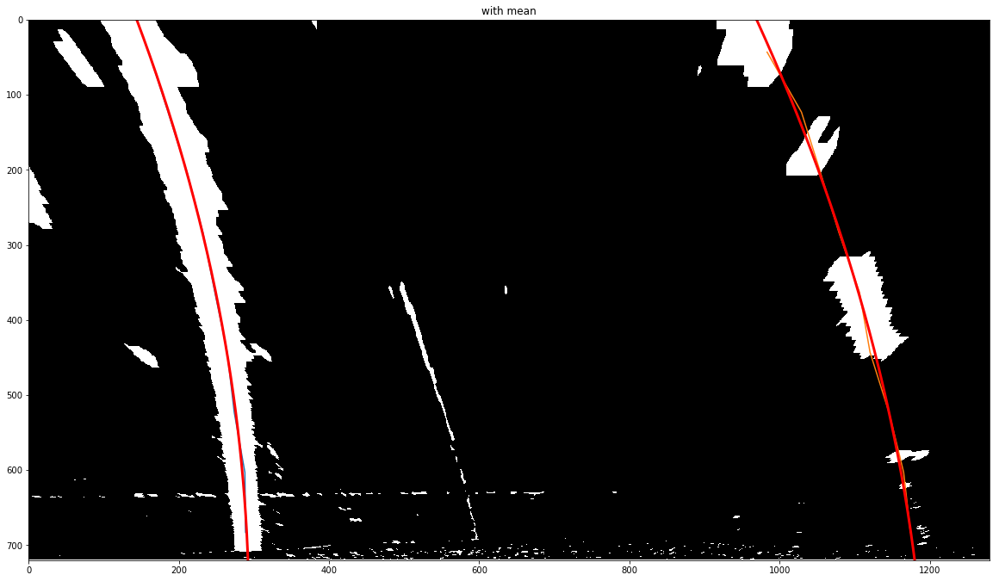

with median
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]
 [ 288.5]
 [ 287.5]
 [ 291.5]
 [ 291.5]
 [ 293.5]
 [ 292.5]]
minus median [[ 6.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 3.]
 [ 5.]
 [ 4.]]
median/mdev 3.0
s - d/mdev [[ 2.        ]
 [ 1.33333333]
 [ 0.33333333]
 [ 0.        ]
 [ 0.33333333]
 [ 1.        ]
 [ 1.        ]
 [ 1.66666667]
 [ 1.33333333]] m 10
data[s<m] [ 282.5  284.5  287.5  288.5  287.5  291.5  291.5  293.5  292.5] 

data [[ 1165.5]
 [ 1165.5]
 [ 1171.5]
 [ 1177.5]
 [ 1179.5]
 [ 1183.5]
 [ 1181.5]
 [ 1167.5]
 [ 1176.5]]
minus median [[ 11.]
 [ 11.]
 [  5.]
 [  1.]
 [  3.]
 [  7.]
 [  5.]
 [  9.]
 [  0.]]
median/mdev 5.0

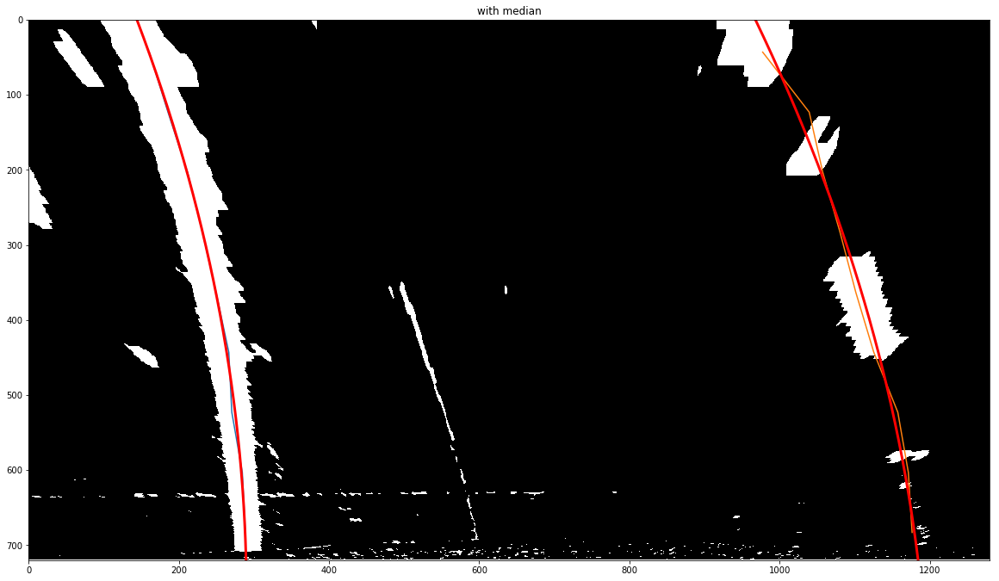

with weighted
median with average
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]
 [ 288.5]
 [ 287.5]
 [ 291.5]
 [ 291.5]
 [ 293.5]
 [ 292.5]]
minus median [[ 6.]
 [ 4.]
 [ 1.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 3.]
 [ 5.]
 [ 4.]]
median/mdev 3.0
s - d/mdev [[ 2.        ]
 [ 1.33333333]
 [ 0.33333333]
 [ 0.        ]
 [ 0.33333333]
 [ 1.        ]
 [ 1.        ]
 [ 1.66666667]
 [ 1.33333333]] m 3
data[s<m] [ 282.5  284.5  287.5  288.5  287.5  291.5  291.5  293.5  292.5] 

data [[ 1165.5]
 [ 1165.5]
 [ 1171.5]
 [ 1177.5]
 [ 1179.5]
 [ 1183.5]
 [ 1181.5]
 [ 1167.5]
 [ 1176.5]]
minus median [[ 11.]
 [ 11.]
 [  5.]
 [  1.]
 [  3.]
 [  7.]
 [  5.]
 [  9.]
 [ 

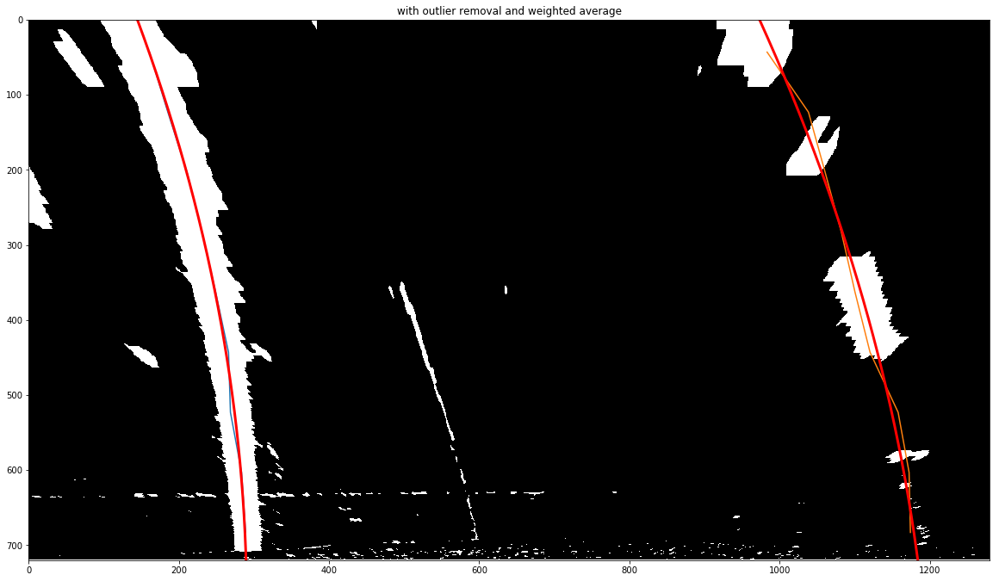

288.833333333 1174.27777778 -0.480119047619
697.925978827 m 723.666798651 m
697.925978827 723.666798651
Left curve radius 697.93 m
Right curve radius 723.67 m
Car position -0.4801 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


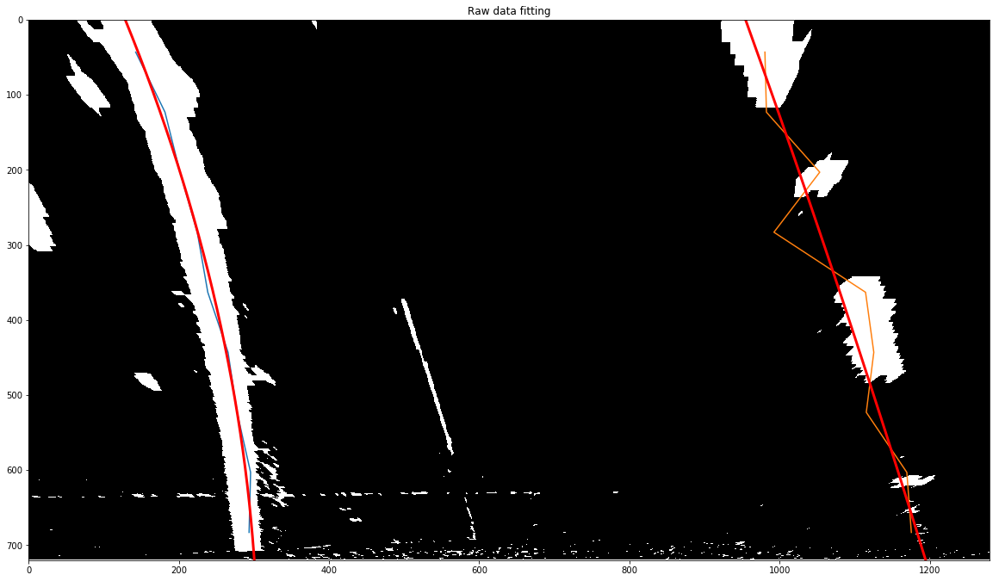

deque([[(282.5, 683), (282.5, 603), (271.5, 523), (257.5, 443), (239.5, 363), (232.5, 283), (211.5, 203), (189.5, 123), (159.5, 43)], [(284.5, 683), (284.5, 603), (268.5, 523), (250.5, 443), (247.5, 363), (228.5, 283), (212.5, 203), (184.5, 123), (160.5, 43)], [(287.5, 683), (283.5, 603), (267.5, 523), (259.5, 443), (250.5, 363), (233.5, 283), (214.5, 203), (188.5, 123), (162.5, 43)], [(288.5, 683), (283.5, 603), (268.5, 523), (262.5, 443), (244.5, 363), (237.5, 283), (215.5, 203), (185.5, 123), (160.5, 43)], [(287.5, 683), (284.5, 603), (270.5, 523), (270.5, 443), (249.5, 363), (239.5, 283), (213.5, 203), (186.5, 123), (155.5, 43)], [(291.5, 683), (292.5, 603), (282.5, 523), (271.5, 443), (253.5, 363), (231.5, 283), (209.5, 203), (185.5, 123), (163.5, 43)], [(291.5, 683), (290.5, 603), (283.5, 523), (266.5, 443), (251.5, 363), (229.5, 283), (205.5, 203), (185.5, 123), (160.5, 43)], [(293.5, 683), (294.5, 603), (285.5, 523), (272.5, 443), (249.5, 363), (229.5, 283), (207.5, 203), (184.

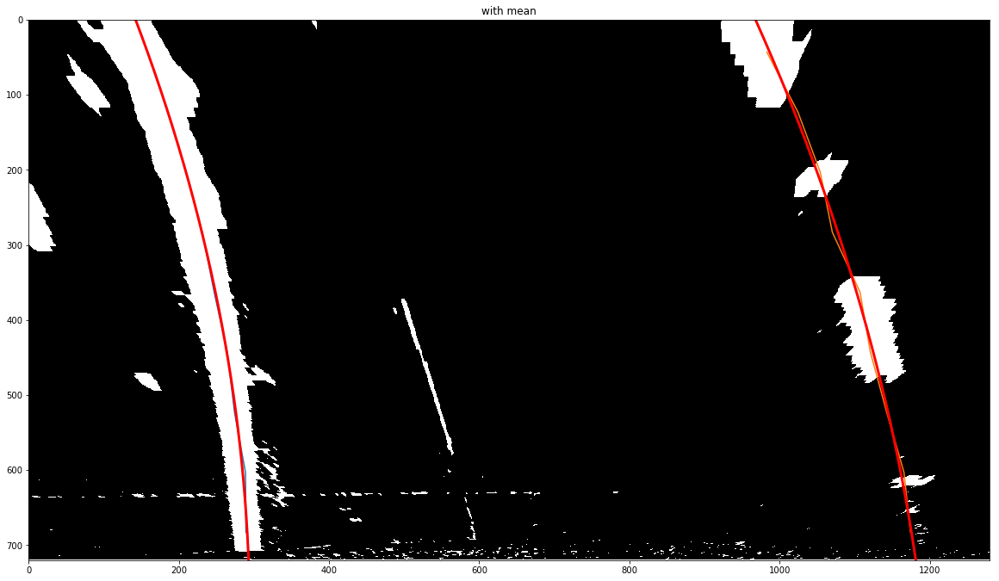

with median
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]
 [ 288.5]
 [ 287.5]
 [ 291.5]
 [ 291.5]
 [ 293.5]
 [ 292.5]
 [ 293.5]]
minus median [[ 7.5]
 [ 5.5]
 [ 2.5]
 [ 1.5]
 [ 2.5]
 [ 1.5]
 [ 1.5]
 [ 3.5]
 [ 2.5]
 [ 3.5]]
median/mdev 2.5
s - d/mdev [[ 3. ]
 [ 2.2]
 [ 1. ]
 [ 0.6]
 [ 1. ]
 [ 0.6]
 [ 0.6]
 [ 1.4]
 [ 1. ]
 [ 1.4]] m 10
data[s<m] [ 282.5  284.5  287.5  288.5  287.5  291.5  291.5  293.5  292.5  293.5] 

data [[ 1165.5]
 [ 1165.5]
 [ 1171.5]
 [ 1177.5]
 [ 1179.5]
 [ 1183.5]
 [ 1181.5]
 [ 1167.5]
 [ 1176.5]
 [ 1175.5]]
minus median [[ 10.5]
 [ 10.5]
 [  4.5]
 [  1.5]
 [  3.5]
 [  7.5]
 [  5.5]

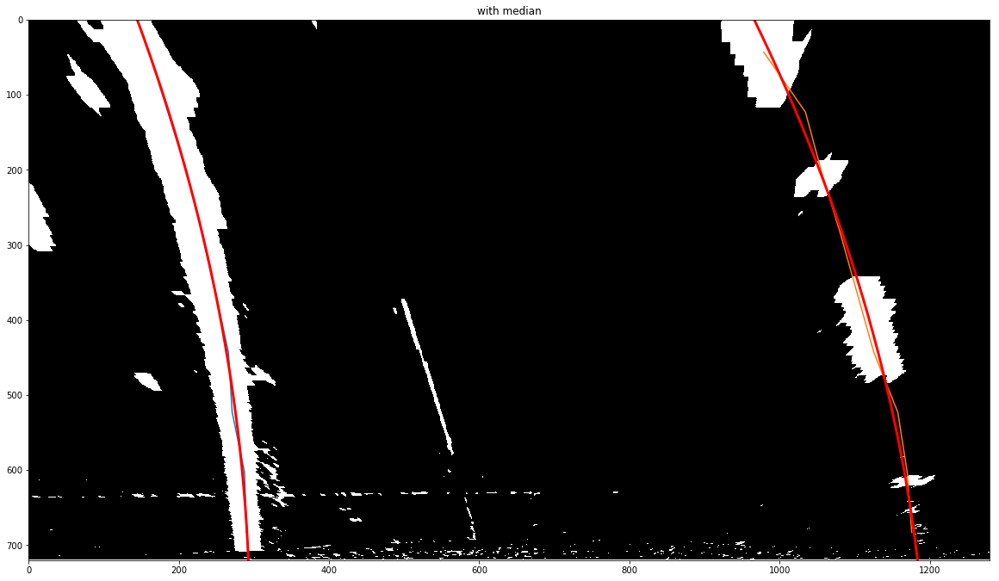

with weighted
median with average
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]
 [ 288.5]
 [ 287.5]
 [ 291.5]
 [ 291.5]
 [ 293.5]
 [ 292.5]
 [ 293.5]]
minus median [[ 7.5]
 [ 5.5]
 [ 2.5]
 [ 1.5]
 [ 2.5]
 [ 1.5]
 [ 1.5]
 [ 3.5]
 [ 2.5]
 [ 3.5]]
median/mdev 2.5
s - d/mdev [[ 3. ]
 [ 2.2]
 [ 1. ]
 [ 0.6]
 [ 1. ]
 [ 0.6]
 [ 0.6]
 [ 1.4]
 [ 1. ]
 [ 1.4]] m 3
data[s<m] [ 284.5  287.5  288.5  287.5  291.5  291.5  293.5  292.5  293.5] 

data [[ 1165.5]
 [ 1165.5]
 [ 1171.5]
 [ 1177.5]
 [ 1179.5]
 [ 1183.5]
 [ 1181.5]
 [ 1167.5]
 [ 1176.5]
 [ 1175.5]]
minus median [[ 10.5]
 [ 10.5]
 [  4.5]
 [  1.5]
 [  3.5]
 [ 

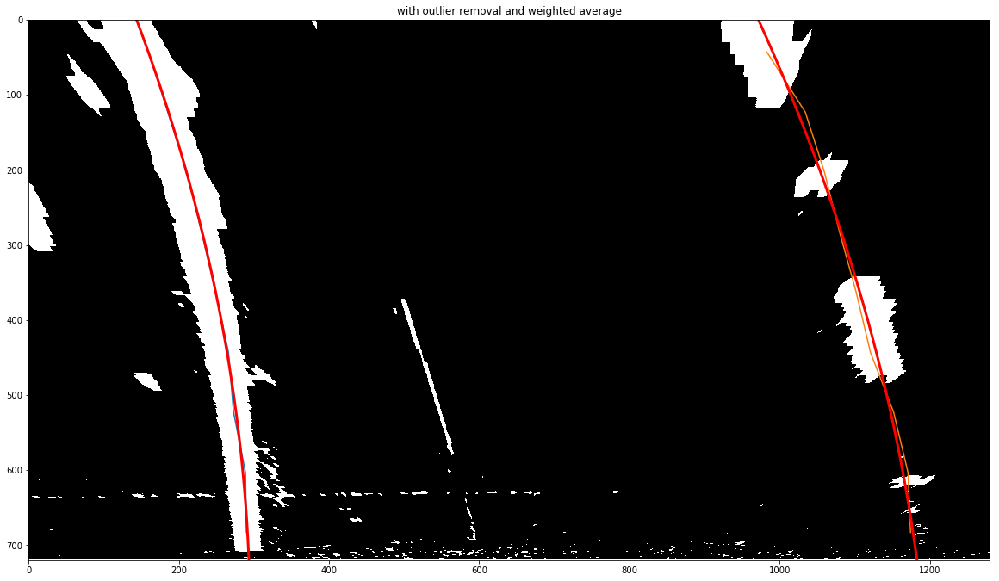

290.055555556 1174.4 -0.486579365079
698.259302384 m 790.046314765 m
698.259302384 790.046314765
Left curve radius 698.26 m
Right curve radius 790.05 m
Car position -0.4866 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


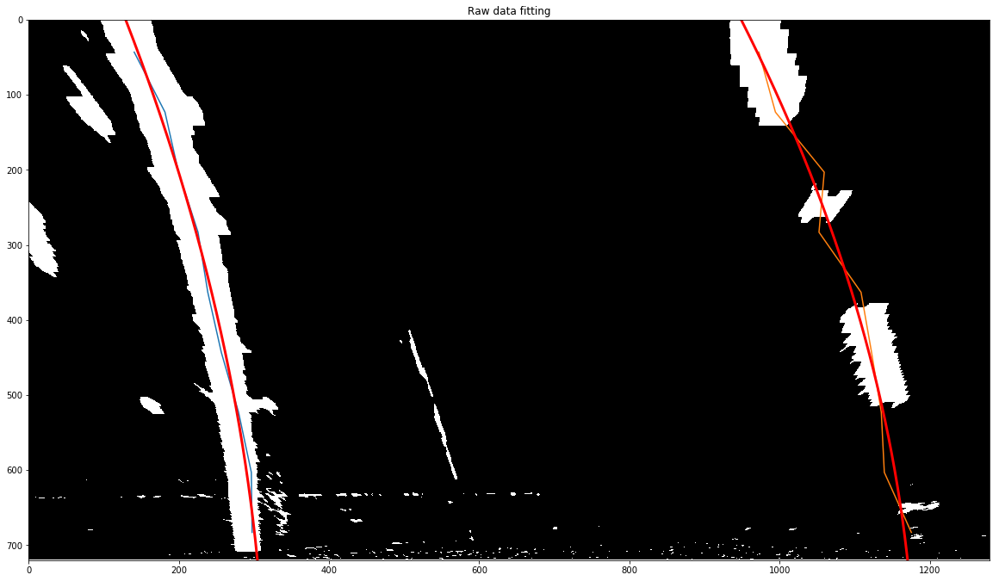

deque([[(282.5, 683), (282.5, 603), (271.5, 523), (257.5, 443), (239.5, 363), (232.5, 283), (211.5, 203), (189.5, 123), (159.5, 43)], [(284.5, 683), (284.5, 603), (268.5, 523), (250.5, 443), (247.5, 363), (228.5, 283), (212.5, 203), (184.5, 123), (160.5, 43)], [(287.5, 683), (283.5, 603), (267.5, 523), (259.5, 443), (250.5, 363), (233.5, 283), (214.5, 203), (188.5, 123), (162.5, 43)], [(288.5, 683), (283.5, 603), (268.5, 523), (262.5, 443), (244.5, 363), (237.5, 283), (215.5, 203), (185.5, 123), (160.5, 43)], [(287.5, 683), (284.5, 603), (270.5, 523), (270.5, 443), (249.5, 363), (239.5, 283), (213.5, 203), (186.5, 123), (155.5, 43)], [(291.5, 683), (292.5, 603), (282.5, 523), (271.5, 443), (253.5, 363), (231.5, 283), (209.5, 203), (185.5, 123), (163.5, 43)], [(291.5, 683), (290.5, 603), (283.5, 523), (266.5, 443), (251.5, 363), (229.5, 283), (205.5, 203), (185.5, 123), (160.5, 43)], [(293.5, 683), (294.5, 603), (285.5, 523), (272.5, 443), (249.5, 363), (229.5, 283), (207.5, 203), (184.

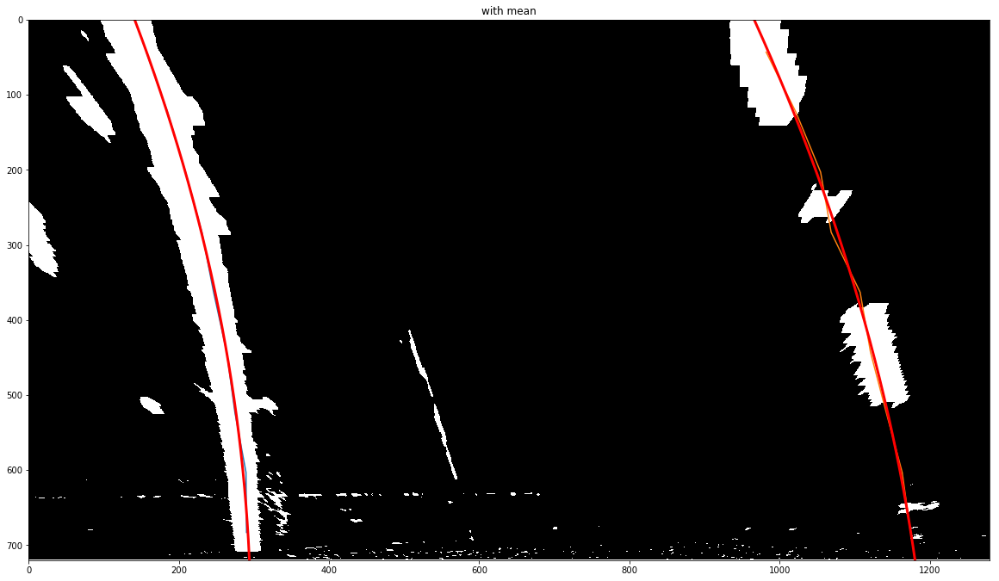

with median
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]
 [ 288.5]
 [ 287.5]
 [ 291.5]
 [ 291.5]
 [ 293.5]
 [ 292.5]
 [ 293.5]
 [ 297.5]]
minus median [[ 9.]
 [ 7.]
 [ 4.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 6.]]
median/mdev 3.0
s - d/mdev [[ 3.        ]
 [ 2.33333333]
 [ 1.33333333]
 [ 1.        ]
 [ 1.33333333]
 [ 0.        ]
 [ 0.        ]
 [ 0.66666667]
 [ 0.33333333]
 [ 0.66666667]
 [ 2.        ]] m 10
data[s<m] [ 282.5  284.5  287.5  288.5  287.5  291.5  291.5  293.5  292.5  293.5
  297.5] 

data [[ 1165.5]
 [ 1165.5]
 [ 1171.5]
 [ 1177.5]
 [ 117

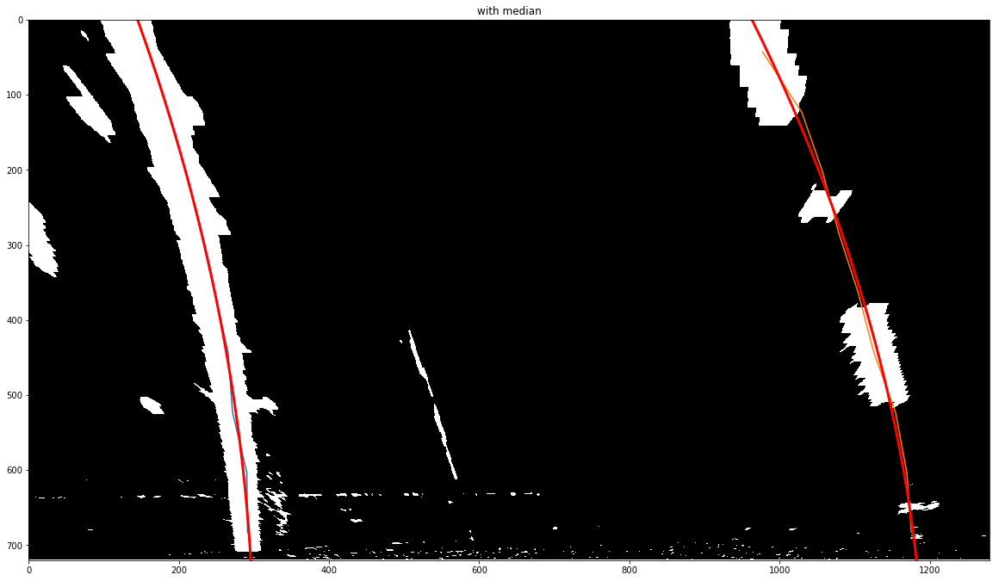

with weighted
median with average
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]
 [ 288.5]
 [ 287.5]
 [ 291.5]
 [ 291.5]
 [ 293.5]
 [ 292.5]
 [ 293.5]
 [ 297.5]]
minus median [[ 9.]
 [ 7.]
 [ 4.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 6.]]
median/mdev 3.0
s - d/mdev [[ 3.        ]
 [ 2.33333333]
 [ 1.33333333]
 [ 1.        ]
 [ 1.33333333]
 [ 0.        ]
 [ 0.        ]
 [ 0.66666667]
 [ 0.33333333]
 [ 0.66666667]
 [ 2.        ]] m 3
data[s<m] [ 284.5  287.5  288.5  287.5  291.5  291.5  293.5  292.5  293.5  297.5] 

data [[ 1165.5]
 [ 1165.5]
 [ 1171.5]
 [ 1

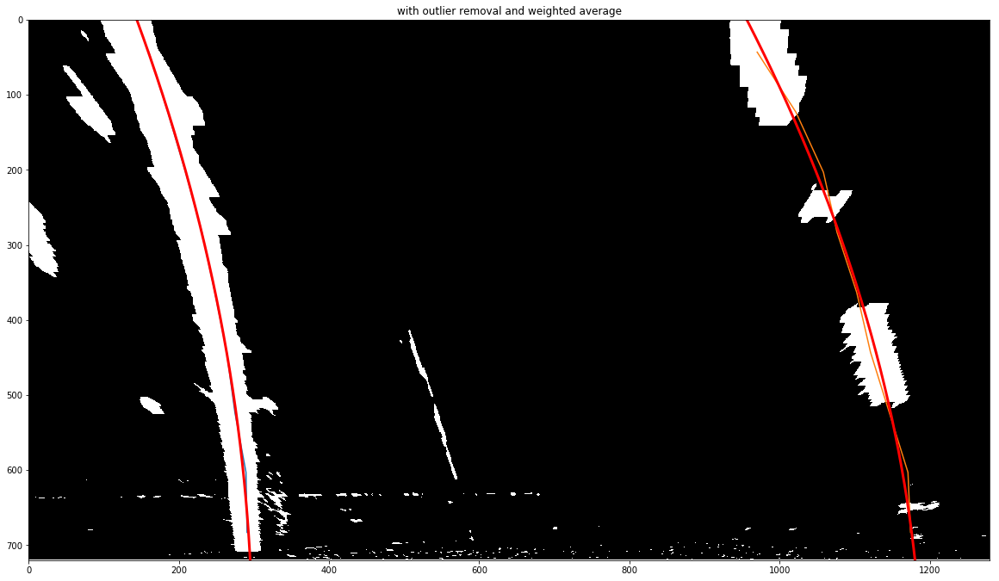

290.8 1174.5 -0.485228571429
707.745421565 m 767.720837794 m
707.745421565 767.720837794
Left curve radius 707.75 m
Right curve radius 767.72 m
Car position -0.4852 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


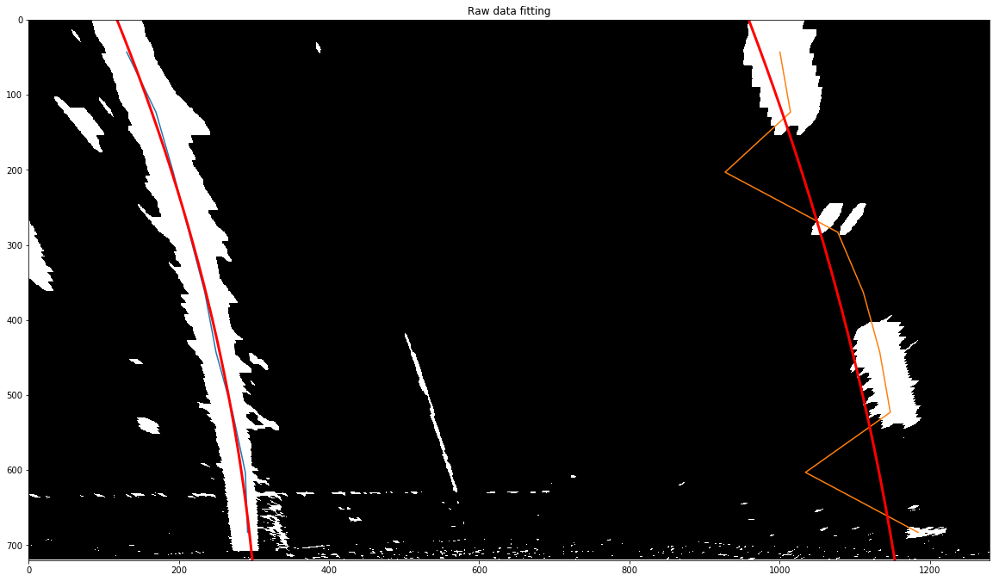

deque([[(282.5, 683), (282.5, 603), (271.5, 523), (257.5, 443), (239.5, 363), (232.5, 283), (211.5, 203), (189.5, 123), (159.5, 43)], [(284.5, 683), (284.5, 603), (268.5, 523), (250.5, 443), (247.5, 363), (228.5, 283), (212.5, 203), (184.5, 123), (160.5, 43)], [(287.5, 683), (283.5, 603), (267.5, 523), (259.5, 443), (250.5, 363), (233.5, 283), (214.5, 203), (188.5, 123), (162.5, 43)], [(288.5, 683), (283.5, 603), (268.5, 523), (262.5, 443), (244.5, 363), (237.5, 283), (215.5, 203), (185.5, 123), (160.5, 43)], [(287.5, 683), (284.5, 603), (270.5, 523), (270.5, 443), (249.5, 363), (239.5, 283), (213.5, 203), (186.5, 123), (155.5, 43)], [(291.5, 683), (292.5, 603), (282.5, 523), (271.5, 443), (253.5, 363), (231.5, 283), (209.5, 203), (185.5, 123), (163.5, 43)], [(291.5, 683), (290.5, 603), (283.5, 523), (266.5, 443), (251.5, 363), (229.5, 283), (205.5, 203), (185.5, 123), (160.5, 43)], [(293.5, 683), (294.5, 603), (285.5, 523), (272.5, 443), (249.5, 363), (229.5, 283), (207.5, 203), (184.

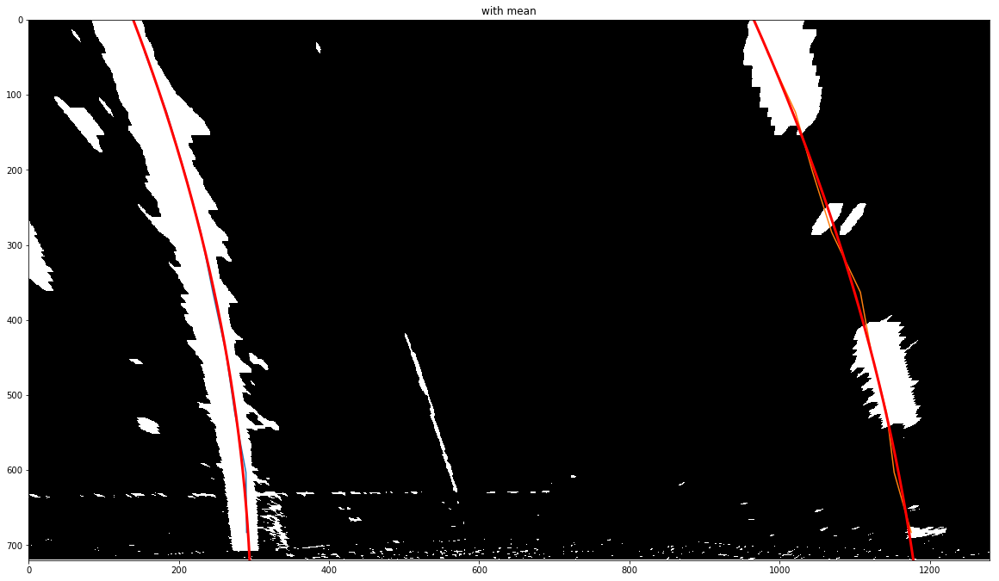

with median
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]
 [ 288.5]
 [ 287.5]
 [ 291.5]
 [ 291.5]
 [ 293.5]
 [ 292.5]
 [ 293.5]
 [ 297.5]
 [ 291.5]]
minus median [[ 9.]
 [ 7.]
 [ 4.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 6.]
 [ 0.]]
median/mdev 2.5
s - d/mdev [[ 3.6]
 [ 2.8]
 [ 1.6]
 [ 1.2]
 [ 1.6]
 [ 0. ]
 [ 0. ]
 [ 0.8]
 [ 0.4]
 [ 0.8]
 [ 2.4]
 [ 0. ]] m 10
data[s<m] [ 282.5  284.5  287.5  288.5  287.5  291.5  291.5  293.5  292.5  293.5
  297.5  291.5] 

data [[ 1165.5]
 [ 1165.5]
 [ 1171.5]
 [ 1177.5]
 [ 1179.5]
 [ 1

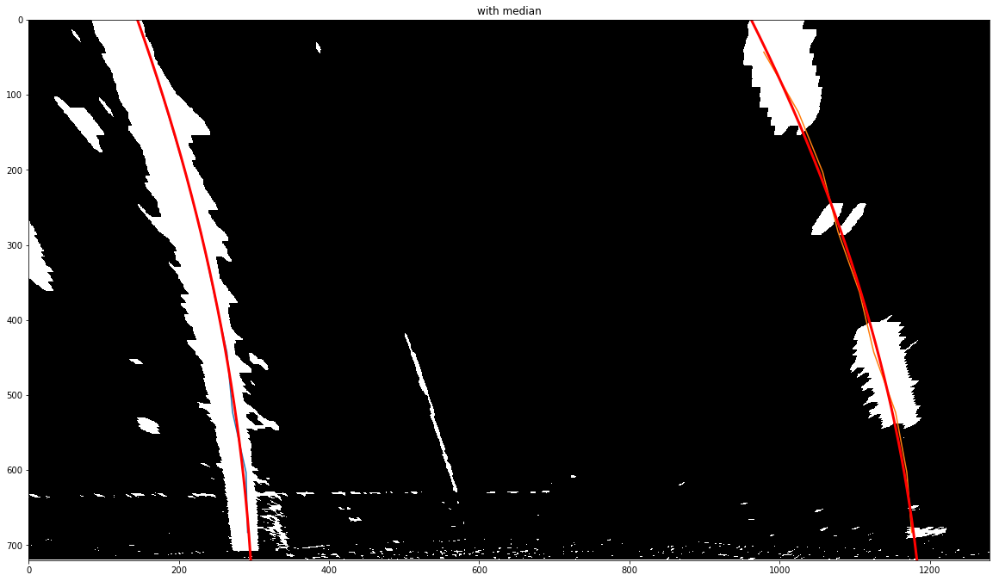

with weighted
median with average
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]
 [ 288.5]
 [ 287.5]
 [ 291.5]
 [ 291.5]
 [ 293.5]
 [ 292.5]
 [ 293.5]
 [ 297.5]
 [ 291.5]]
minus median [[ 9.]
 [ 7.]
 [ 4.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 6.]
 [ 0.]]
median/mdev 2.5
s - d/mdev [[ 3.6]
 [ 2.8]
 [ 1.6]
 [ 1.2]
 [ 1.6]
 [ 0. ]
 [ 0. ]
 [ 0.8]
 [ 0.4]
 [ 0.8]
 [ 2.4]
 [ 0. ]] m 3
data[s<m] [ 284.5  287.5  288.5  287.5  291.5  291.5  293.5  292.5  293.5  297.5
  291.5] 

data [[ 1165.5]
 [ 1165.5]
 [ 1171.5]
 [ 1177.5]
 

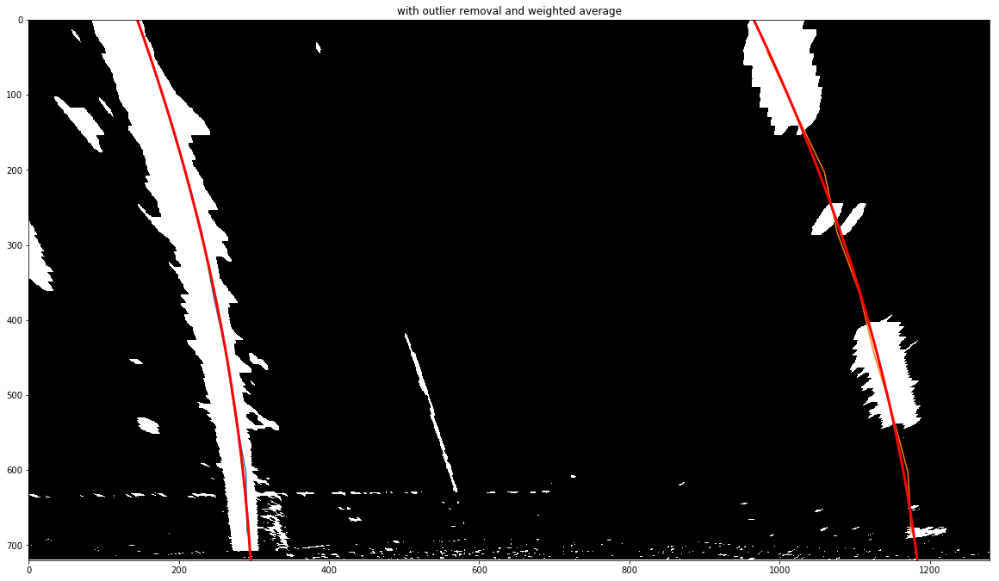

290.863636364 1175.33333333 -0.490850649351
713.003490549 m 786.986068104 m
713.003490549 786.986068104
Left curve radius 713.00 m
Right curve radius 786.99 m
Car position -0.4909 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


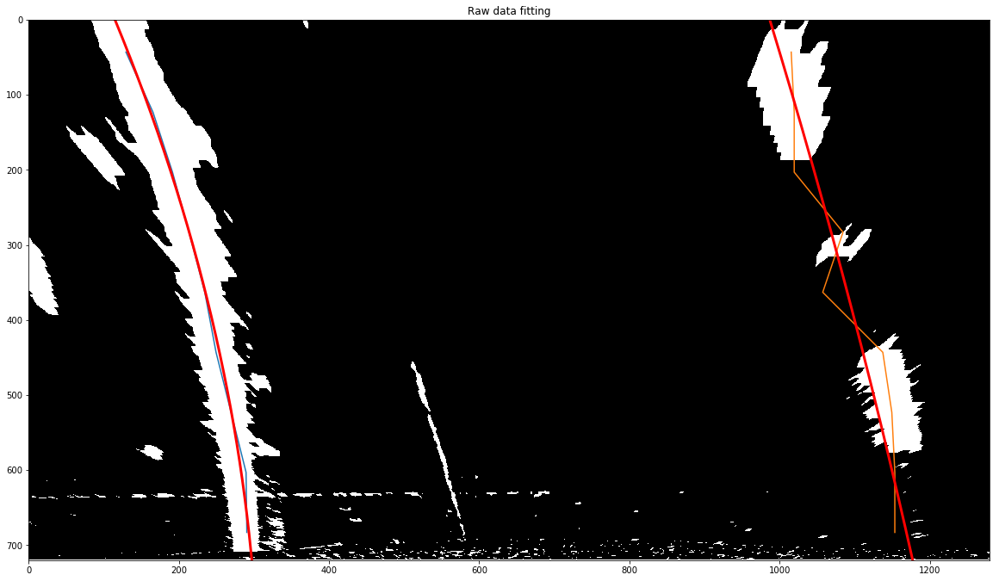

deque([[(282.5, 683), (282.5, 603), (271.5, 523), (257.5, 443), (239.5, 363), (232.5, 283), (211.5, 203), (189.5, 123), (159.5, 43)], [(284.5, 683), (284.5, 603), (268.5, 523), (250.5, 443), (247.5, 363), (228.5, 283), (212.5, 203), (184.5, 123), (160.5, 43)], [(287.5, 683), (283.5, 603), (267.5, 523), (259.5, 443), (250.5, 363), (233.5, 283), (214.5, 203), (188.5, 123), (162.5, 43)], [(288.5, 683), (283.5, 603), (268.5, 523), (262.5, 443), (244.5, 363), (237.5, 283), (215.5, 203), (185.5, 123), (160.5, 43)], [(287.5, 683), (284.5, 603), (270.5, 523), (270.5, 443), (249.5, 363), (239.5, 283), (213.5, 203), (186.5, 123), (155.5, 43)], [(291.5, 683), (292.5, 603), (282.5, 523), (271.5, 443), (253.5, 363), (231.5, 283), (209.5, 203), (185.5, 123), (163.5, 43)], [(291.5, 683), (290.5, 603), (283.5, 523), (266.5, 443), (251.5, 363), (229.5, 283), (205.5, 203), (185.5, 123), (160.5, 43)], [(293.5, 683), (294.5, 603), (285.5, 523), (272.5, 443), (249.5, 363), (229.5, 283), (207.5, 203), (184.

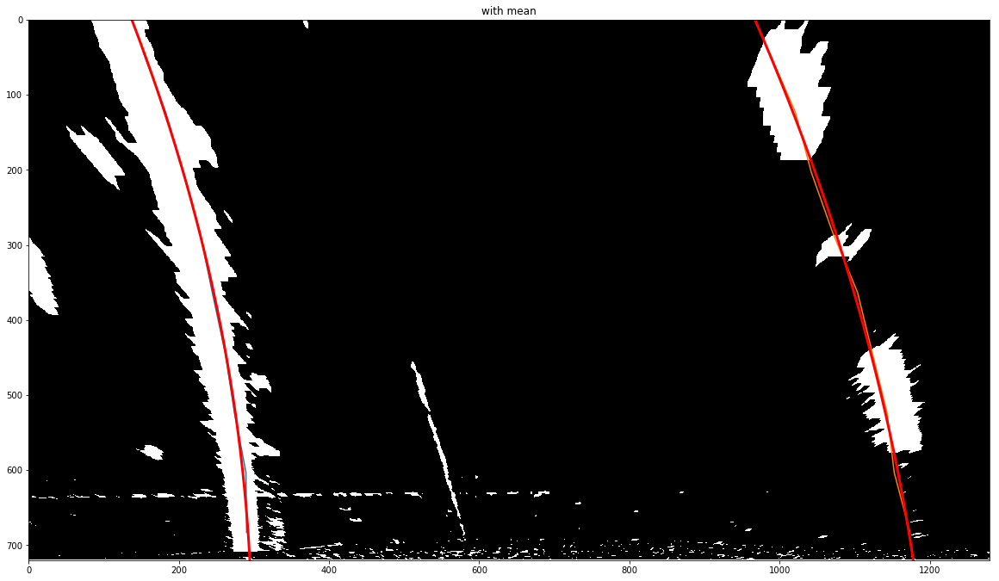

with median
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]
 [ 288.5]
 [ 287.5]
 [ 291.5]
 [ 291.5]
 [ 293.5]
 [ 292.5]
 [ 293.5]
 [ 297.5]
 [ 291.5]
 [ 290.5]]
minus median [[ 9.]
 [ 7.]
 [ 4.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 6.]
 [ 0.]
 [ 1.]]
median/mdev 2.0
s - d/mdev [[ 4.5]
 [ 3.5]
 [ 2. ]
 [ 1.5]
 [ 2. ]
 [ 0. ]
 [ 0. ]
 [ 1. ]
 [ 0.5]
 [ 1. ]
 [ 3. ]
 [ 0. ]
 [ 0.5]] m 10
data[s<m] [ 282.5  284.5  287.5  288.5  287.5  291.5  291.5  293.5  292.5  293.5
  297.5  291.5  290.5

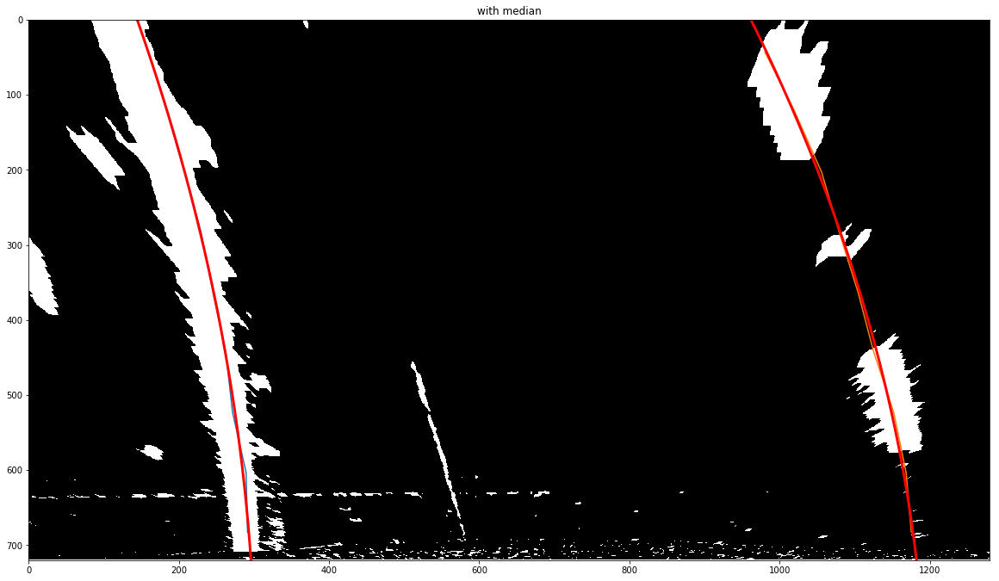

with weighted
median with average
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]
 [ 288.5]
 [ 287.5]
 [ 291.5]
 [ 291.5]
 [ 293.5]
 [ 292.5]
 [ 293.5]
 [ 297.5]
 [ 291.5]
 [ 290.5]]
minus median [[ 9.]
 [ 7.]
 [ 4.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 6.]
 [ 0.]
 [ 1.]]
median/mdev 2.0
s - d/mdev [[ 4.5]
 [ 3.5]
 [ 2. ]
 [ 1.5]
 [ 2. ]
 [ 0. ]
 [ 0. ]
 [ 1. ]
 [ 0.5]
 [ 1. ]
 [ 3. ]
 [ 0. ]
 [ 0.5]] m 3
data[s<m] [ 287.5  288.5  287.5  291.5  291.5  293.5  292.5  293.5  291.5  290.5]

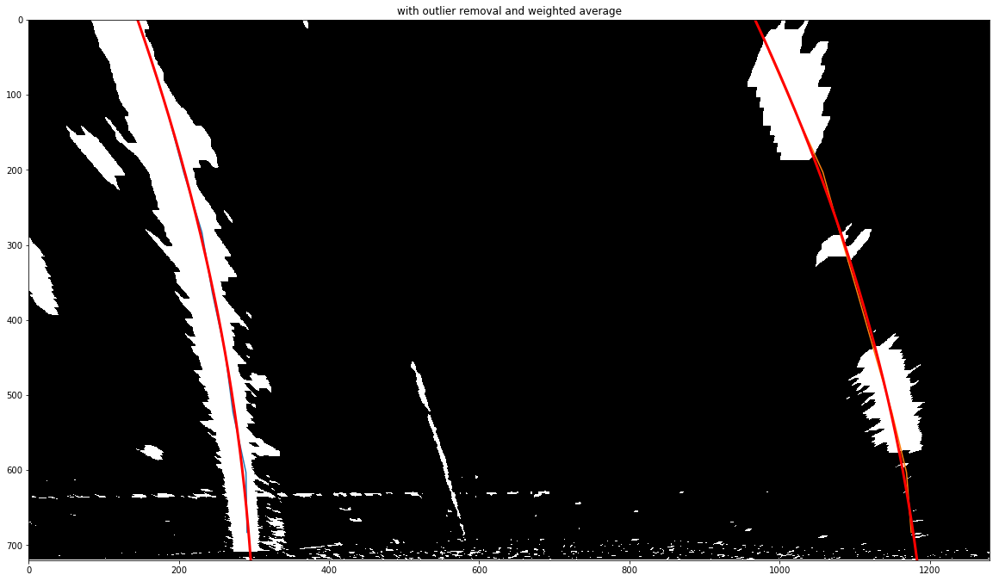

290.8 1175.33333333 -0.490514285714
715.359375955 m 833.863479504 m
715.359375955 833.863479504
Left curve radius 715.36 m
Right curve radius 833.86 m
Car position -0.4905 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


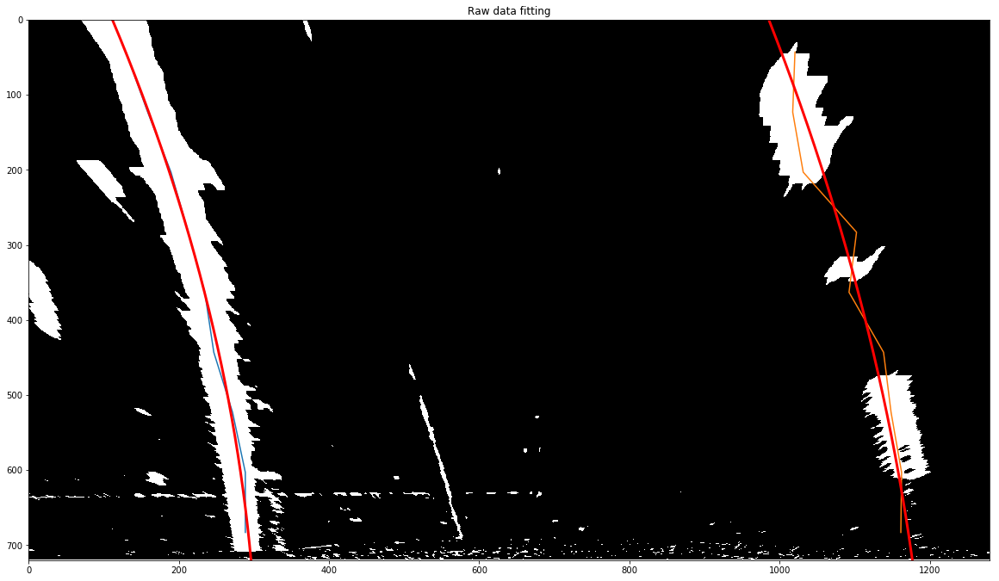

deque([[(282.5, 683), (282.5, 603), (271.5, 523), (257.5, 443), (239.5, 363), (232.5, 283), (211.5, 203), (189.5, 123), (159.5, 43)], [(284.5, 683), (284.5, 603), (268.5, 523), (250.5, 443), (247.5, 363), (228.5, 283), (212.5, 203), (184.5, 123), (160.5, 43)], [(287.5, 683), (283.5, 603), (267.5, 523), (259.5, 443), (250.5, 363), (233.5, 283), (214.5, 203), (188.5, 123), (162.5, 43)], [(288.5, 683), (283.5, 603), (268.5, 523), (262.5, 443), (244.5, 363), (237.5, 283), (215.5, 203), (185.5, 123), (160.5, 43)], [(287.5, 683), (284.5, 603), (270.5, 523), (270.5, 443), (249.5, 363), (239.5, 283), (213.5, 203), (186.5, 123), (155.5, 43)], [(291.5, 683), (292.5, 603), (282.5, 523), (271.5, 443), (253.5, 363), (231.5, 283), (209.5, 203), (185.5, 123), (163.5, 43)], [(291.5, 683), (290.5, 603), (283.5, 523), (266.5, 443), (251.5, 363), (229.5, 283), (205.5, 203), (185.5, 123), (160.5, 43)], [(293.5, 683), (294.5, 603), (285.5, 523), (272.5, 443), (249.5, 363), (229.5, 283), (207.5, 203), (184.

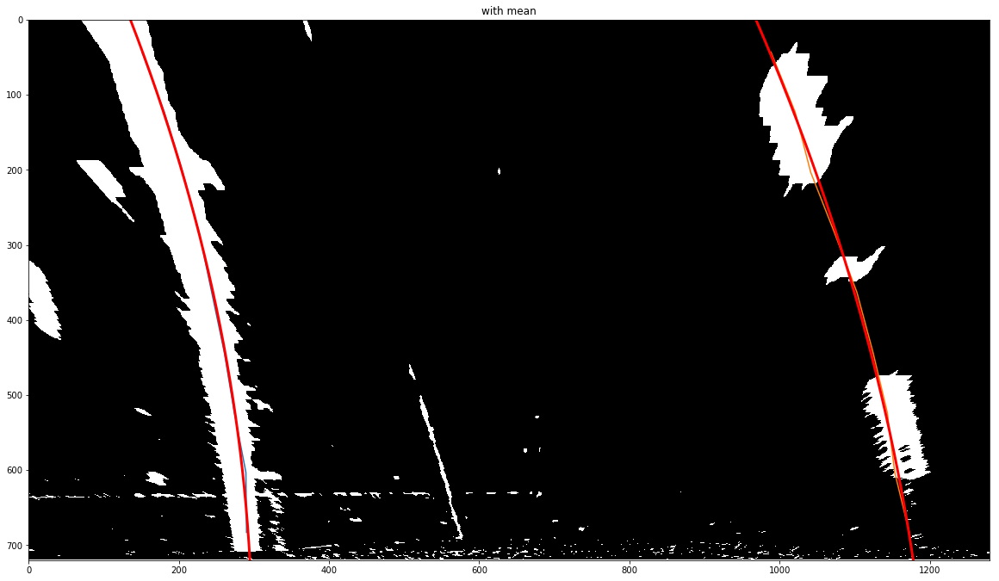

with median
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]
 [ 288.5]
 [ 287.5]
 [ 291.5]
 [ 291.5]
 [ 293.5]
 [ 292.5]
 [ 293.5]
 [ 297.5]
 [ 291.5]
 [ 290.5]
 [ 288.5]]
minus median [[ 8.5]
 [ 6.5]
 [ 3.5]
 [ 2.5]
 [ 3.5]
 [ 0.5]
 [ 0.5]
 [ 2.5]
 [ 1.5]
 [ 2.5]
 [ 6.5]
 [ 0.5]
 [ 0.5]
 [ 2.5]]
median/mdev 2.5
s - d/mdev [[ 3.4]
 [ 2.6]
 [ 1.4]
 [ 1. ]
 [ 1.4]
 [ 0.2]
 [ 0.2]
 [ 1. ]
 [ 0.6]
 [ 1. ]
 [ 2.6]
 [ 0.2]
 [ 0.2]
 [ 1. ]] m 10
data[s<m] [ 282.5  284.5  2

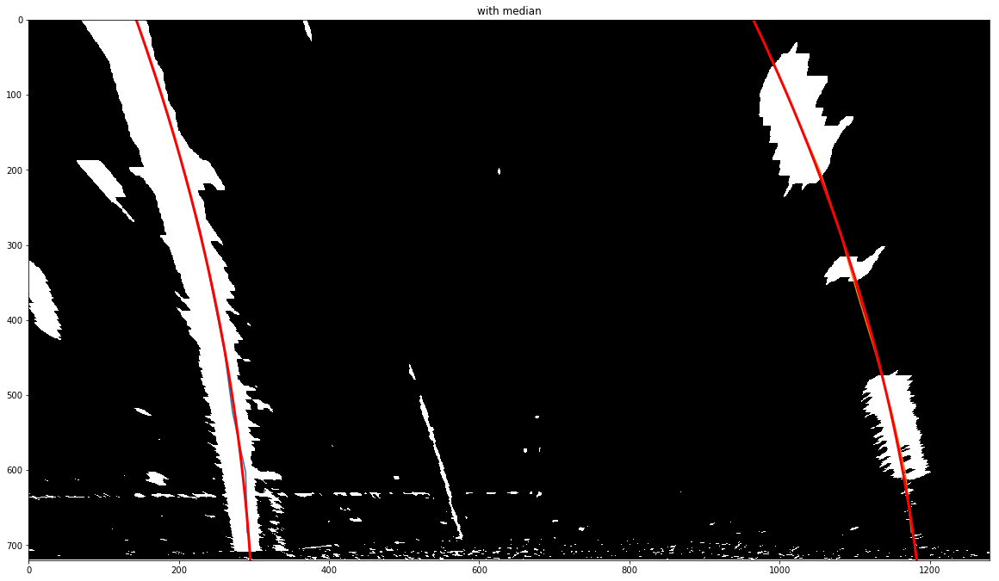

with weighted
median with average
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]
 [ 288.5]
 [ 287.5]
 [ 291.5]
 [ 291.5]
 [ 293.5]
 [ 292.5]
 [ 293.5]
 [ 297.5]
 [ 291.5]
 [ 290.5]
 [ 288.5]]
minus median [[ 8.5]
 [ 6.5]
 [ 3.5]
 [ 2.5]
 [ 3.5]
 [ 0.5]
 [ 0.5]
 [ 2.5]
 [ 1.5]
 [ 2.5]
 [ 6.5]
 [ 0.5]
 [ 0.5]
 [ 2.5]]
median/mdev 2.5
s - d/mdev [[ 3.4]
 [ 2.6]
 [ 1.4]
 [ 1. ]
 [ 1.4]
 [ 0.2]
 [ 0.2]
 [ 1. ]
 [ 0.6]
 [ 1. ]
 [ 2.6]
 [ 0.2]
 [ 0.2]
 [ 1. ]] m 3
data[s

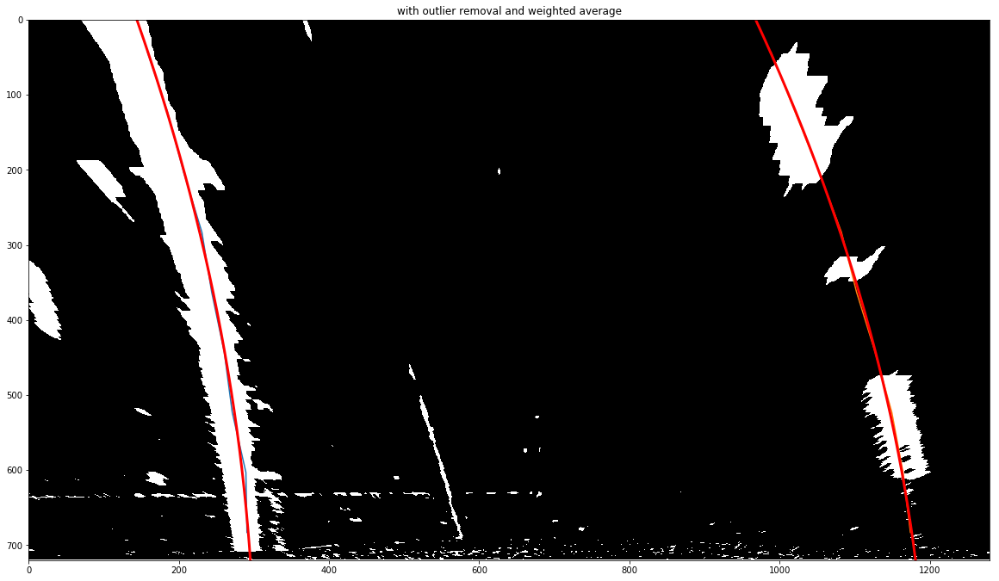

290.653846154 1174.26923077 -0.484456043956
715.72965181 m 840.780438608 m
715.72965181 840.780438608
Left curve radius 715.73 m
Right curve radius 840.78 m
Car position -0.4845 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


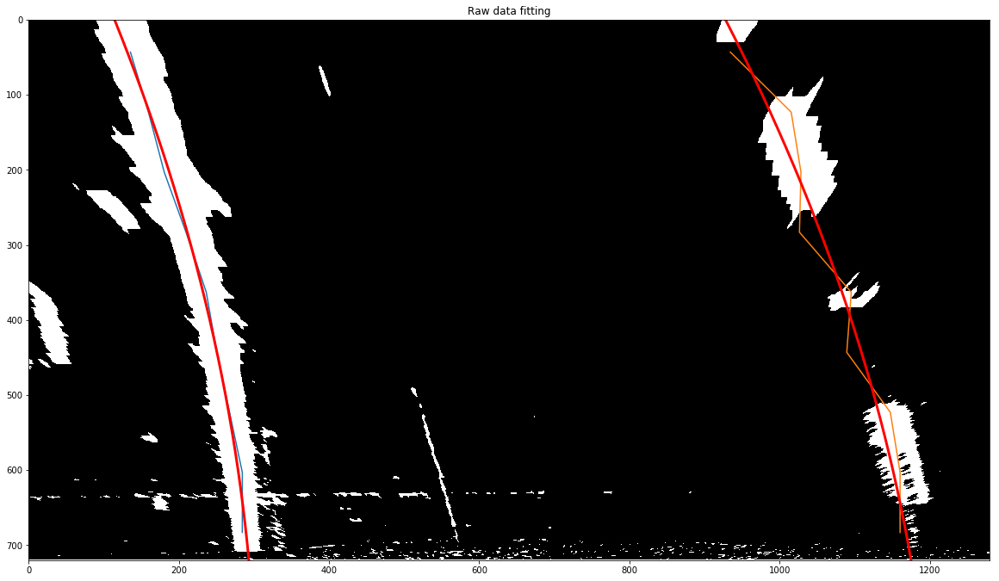

deque([[(282.5, 683), (282.5, 603), (271.5, 523), (257.5, 443), (239.5, 363), (232.5, 283), (211.5, 203), (189.5, 123), (159.5, 43)], [(284.5, 683), (284.5, 603), (268.5, 523), (250.5, 443), (247.5, 363), (228.5, 283), (212.5, 203), (184.5, 123), (160.5, 43)], [(287.5, 683), (283.5, 603), (267.5, 523), (259.5, 443), (250.5, 363), (233.5, 283), (214.5, 203), (188.5, 123), (162.5, 43)], [(288.5, 683), (283.5, 603), (268.5, 523), (262.5, 443), (244.5, 363), (237.5, 283), (215.5, 203), (185.5, 123), (160.5, 43)], [(287.5, 683), (284.5, 603), (270.5, 523), (270.5, 443), (249.5, 363), (239.5, 283), (213.5, 203), (186.5, 123), (155.5, 43)], [(291.5, 683), (292.5, 603), (282.5, 523), (271.5, 443), (253.5, 363), (231.5, 283), (209.5, 203), (185.5, 123), (163.5, 43)], [(291.5, 683), (290.5, 603), (283.5, 523), (266.5, 443), (251.5, 363), (229.5, 283), (205.5, 203), (185.5, 123), (160.5, 43)], [(293.5, 683), (294.5, 603), (285.5, 523), (272.5, 443), (249.5, 363), (229.5, 283), (207.5, 203), (184.

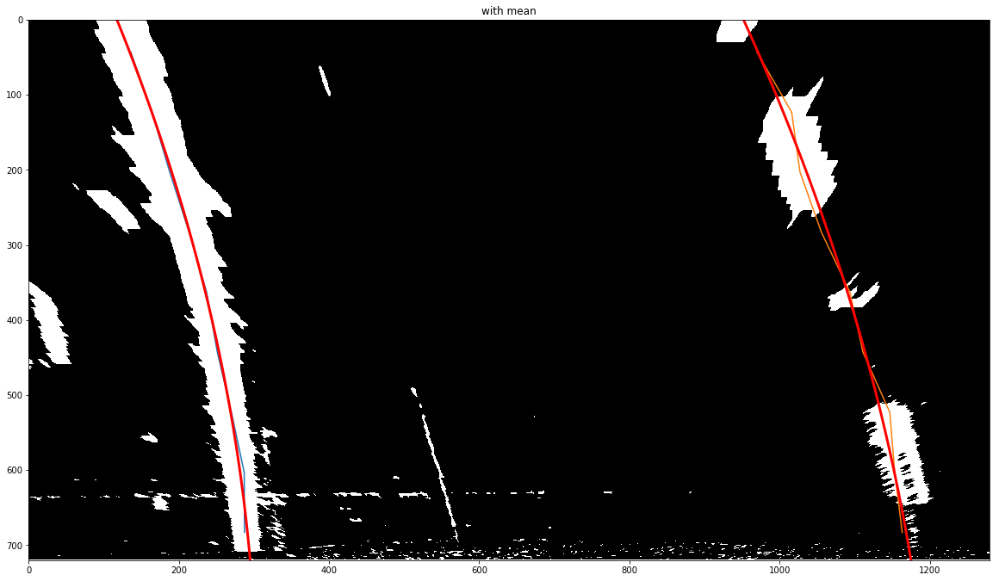

with median
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]
 [ 288.5]
 [ 287.5]
 [ 291.5]
 [ 291.5]
 [ 293.5]
 [ 292.5]
 [ 293.5]
 [ 297.5]
 [ 291.5]
 [ 290.5]
 [ 288.5]
 [ 284.5]]
minus median [[ 8.]
 [ 6.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 7.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 6.]]
median/mdev 3.0
s - d/mdev [[ 2.66666667]
 [ 2.        ]
 [ 1.        ]
 [ 0.66666667]
 [ 1.        ]
 [ 0.33333333]
 [ 0.33333333]
 

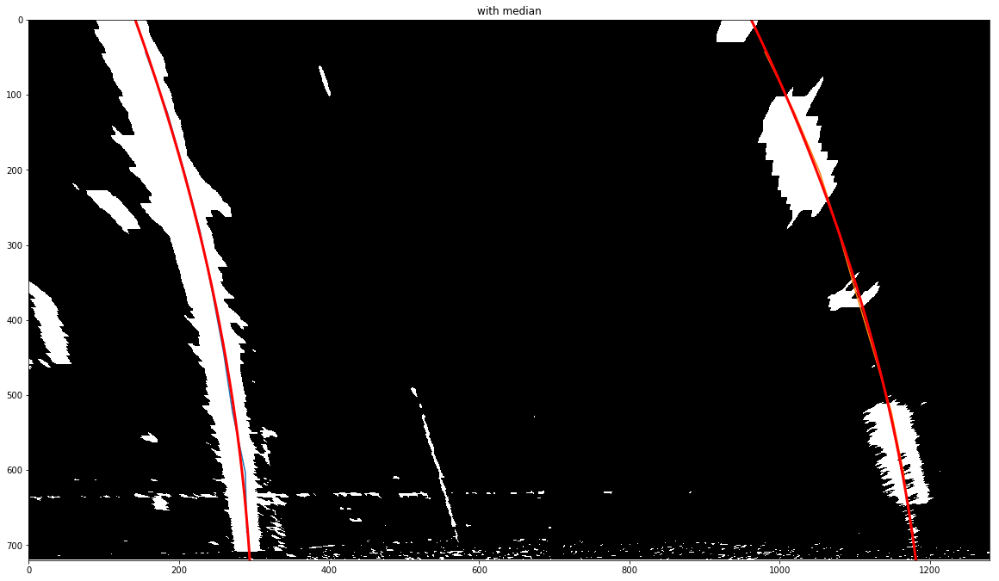

with weighted
median with average
length 9
point -  0
column l [[ 282.5  683. ]
 [ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]]
data [[ 282.5]
 [ 284.5]
 [ 287.5]
 [ 288.5]
 [ 287.5]
 [ 291.5]
 [ 291.5]
 [ 293.5]
 [ 292.5]
 [ 293.5]
 [ 297.5]
 [ 291.5]
 [ 290.5]
 [ 288.5]
 [ 284.5]]
minus median [[ 8.]
 [ 6.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 7.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 6.]]
median/mdev 3.0
s - d/mdev [[ 2.66666667]
 [ 2.        ]
 [ 1.        ]
 [ 0.66666667]
 [ 1.        ]
 [ 0.3333

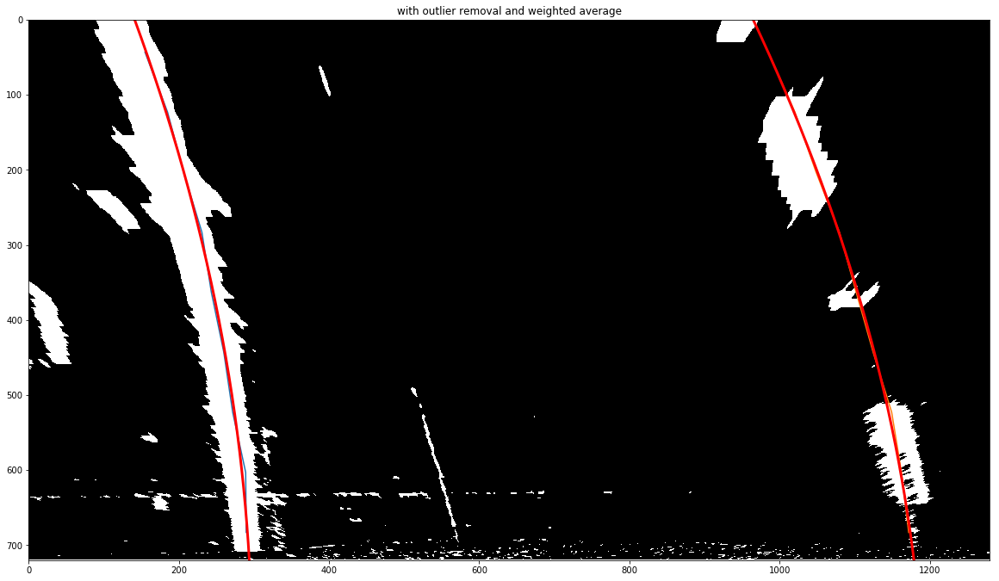

289.7 1171.96666667 -0.479414285714
750.697792054 m 818.478891113 m
750.697792054 818.478891113
Left curve radius 750.70 m
Right curve radius 818.48 m
Car position -0.4794 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


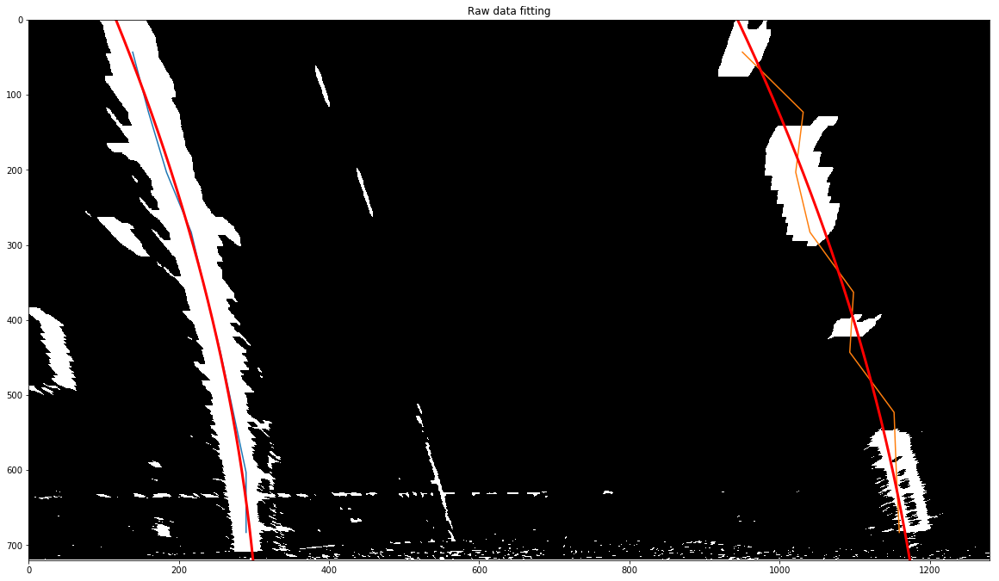

deque([[(284.5, 683), (284.5, 603), (268.5, 523), (250.5, 443), (247.5, 363), (228.5, 283), (212.5, 203), (184.5, 123), (160.5, 43)], [(287.5, 683), (283.5, 603), (267.5, 523), (259.5, 443), (250.5, 363), (233.5, 283), (214.5, 203), (188.5, 123), (162.5, 43)], [(288.5, 683), (283.5, 603), (268.5, 523), (262.5, 443), (244.5, 363), (237.5, 283), (215.5, 203), (185.5, 123), (160.5, 43)], [(287.5, 683), (284.5, 603), (270.5, 523), (270.5, 443), (249.5, 363), (239.5, 283), (213.5, 203), (186.5, 123), (155.5, 43)], [(291.5, 683), (292.5, 603), (282.5, 523), (271.5, 443), (253.5, 363), (231.5, 283), (209.5, 203), (185.5, 123), (163.5, 43)], [(291.5, 683), (290.5, 603), (283.5, 523), (266.5, 443), (251.5, 363), (229.5, 283), (205.5, 203), (185.5, 123), (160.5, 43)], [(293.5, 683), (294.5, 603), (285.5, 523), (272.5, 443), (249.5, 363), (229.5, 283), (207.5, 203), (184.5, 123), (163.5, 43)], [(292.5, 683), (295.5, 603), (265.5, 523), (268.5, 443), (245.5, 363), (225.5, 283), (207.5, 203), (181.

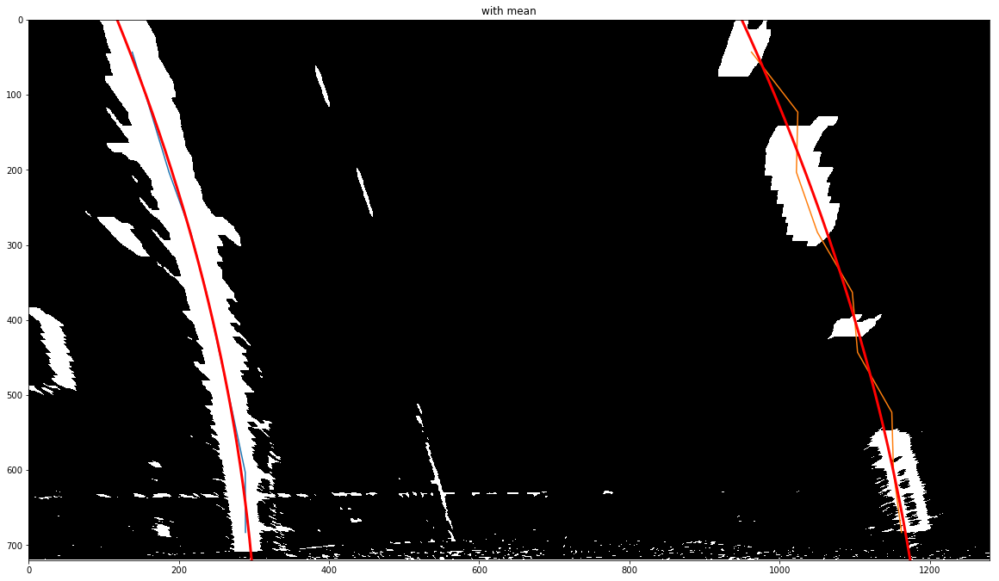

with median
length 9
point -  0
column l [[ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]]
data [[ 284.5]
 [ 287.5]
 [ 288.5]
 [ 287.5]
 [ 291.5]
 [ 291.5]
 [ 293.5]
 [ 292.5]
 [ 293.5]
 [ 297.5]
 [ 291.5]
 [ 290.5]
 [ 288.5]
 [ 284.5]
 [ 289.5]]
minus median [[ 6.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 7.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 6.]
 [ 1.]]
median/mdev 2.0
s - d/mdev [[ 3. ]
 [ 1.5]
 [ 1. ]
 [ 1.5]
 [ 0.5]
 [ 0.5]
 [ 1.5]
 [ 1. ]
 [ 1.5]
 [ 3.5]
 [ 0.5]
 [ 0. ]
 [ 1. ]
 [

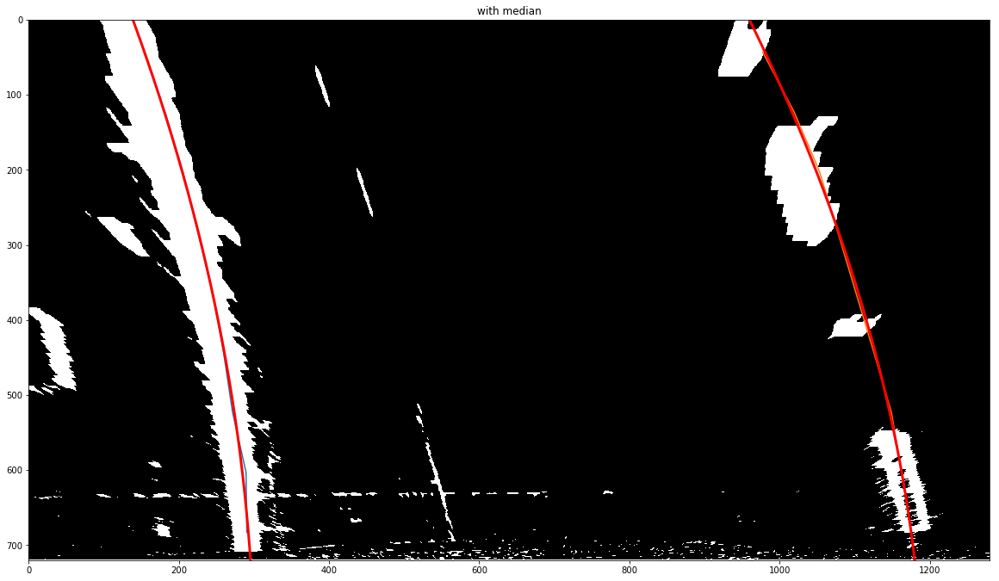

with weighted
median with average
length 9
point -  0
column l [[ 284.5  683. ]
 [ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]]
column r [[ 1165.5   683. ]
 [ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]]
data [[ 284.5]
 [ 287.5]
 [ 288.5]
 [ 287.5]
 [ 291.5]
 [ 291.5]
 [ 293.5]
 [ 292.5]
 [ 293.5]
 [ 297.5]
 [ 291.5]
 [ 290.5]
 [ 288.5]
 [ 284.5]
 [ 289.5]]
minus median [[ 6.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 7.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 6.]
 [ 1.]]
median/mdev 2.0
s - d/mdev [[ 3. ]
 [ 1.5]
 [ 1. ]
 [ 1.5]
 [ 0.5]
 [ 0.5]
 [ 1.5]
 [ 1. ]
 [ 1.5]
 [ 3.5]
 [ 0

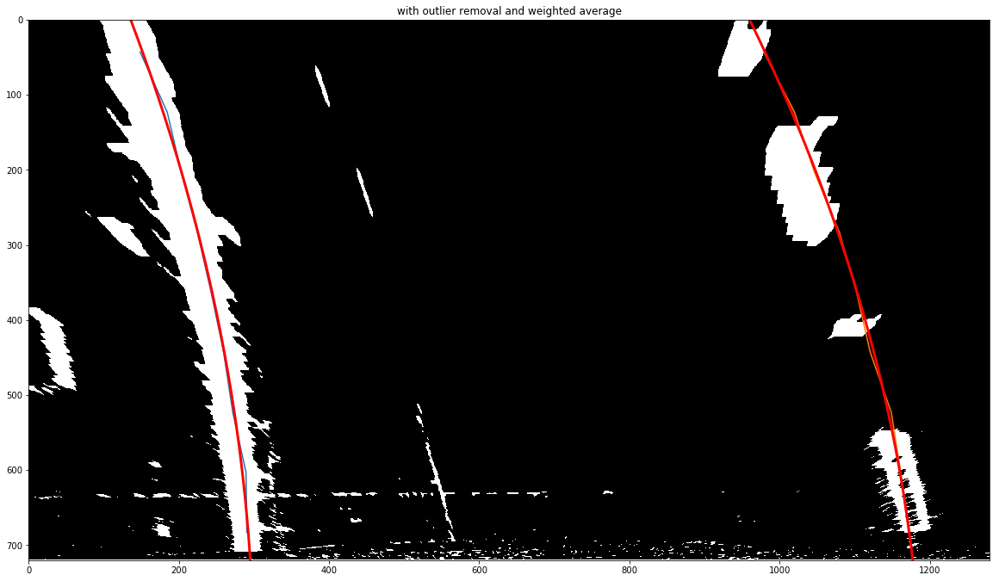

290.5 1171.56666667 -0.478357142857
758.199161579 m 808.914961408 m
758.199161579 808.914961408
Left curve radius 758.20 m
Right curve radius 808.91 m
Car position -0.4784 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


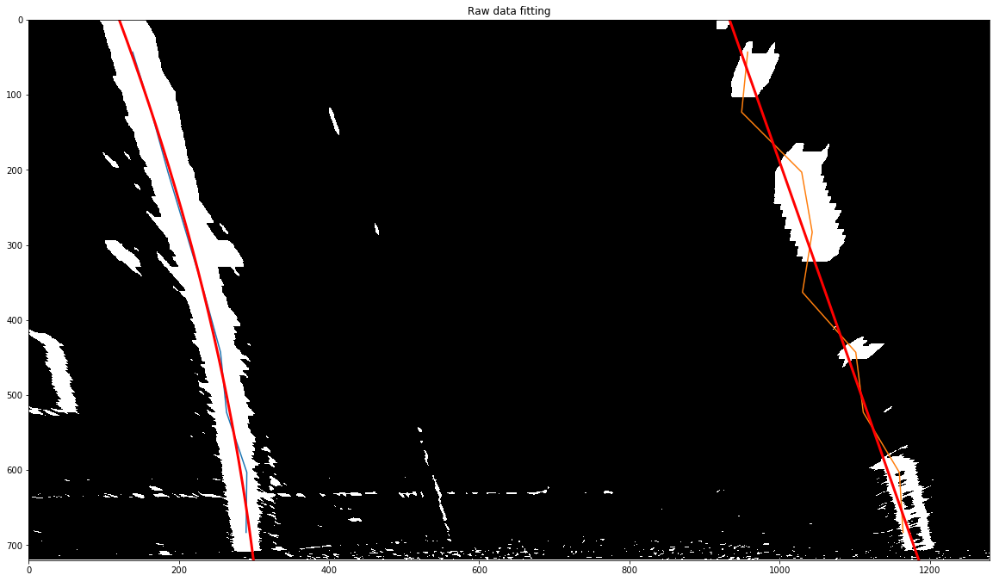

deque([[(287.5, 683), (283.5, 603), (267.5, 523), (259.5, 443), (250.5, 363), (233.5, 283), (214.5, 203), (188.5, 123), (162.5, 43)], [(288.5, 683), (283.5, 603), (268.5, 523), (262.5, 443), (244.5, 363), (237.5, 283), (215.5, 203), (185.5, 123), (160.5, 43)], [(287.5, 683), (284.5, 603), (270.5, 523), (270.5, 443), (249.5, 363), (239.5, 283), (213.5, 203), (186.5, 123), (155.5, 43)], [(291.5, 683), (292.5, 603), (282.5, 523), (271.5, 443), (253.5, 363), (231.5, 283), (209.5, 203), (185.5, 123), (163.5, 43)], [(291.5, 683), (290.5, 603), (283.5, 523), (266.5, 443), (251.5, 363), (229.5, 283), (205.5, 203), (185.5, 123), (160.5, 43)], [(293.5, 683), (294.5, 603), (285.5, 523), (272.5, 443), (249.5, 363), (229.5, 283), (207.5, 203), (184.5, 123), (163.5, 43)], [(292.5, 683), (295.5, 603), (265.5, 523), (268.5, 443), (245.5, 363), (225.5, 283), (207.5, 203), (181.5, 123), (153.5, 43)], [(293.5, 683), (295.5, 603), (277.5, 523), (265.5, 443), (238.5, 363), (224.5, 283), (201.5, 203), (181.

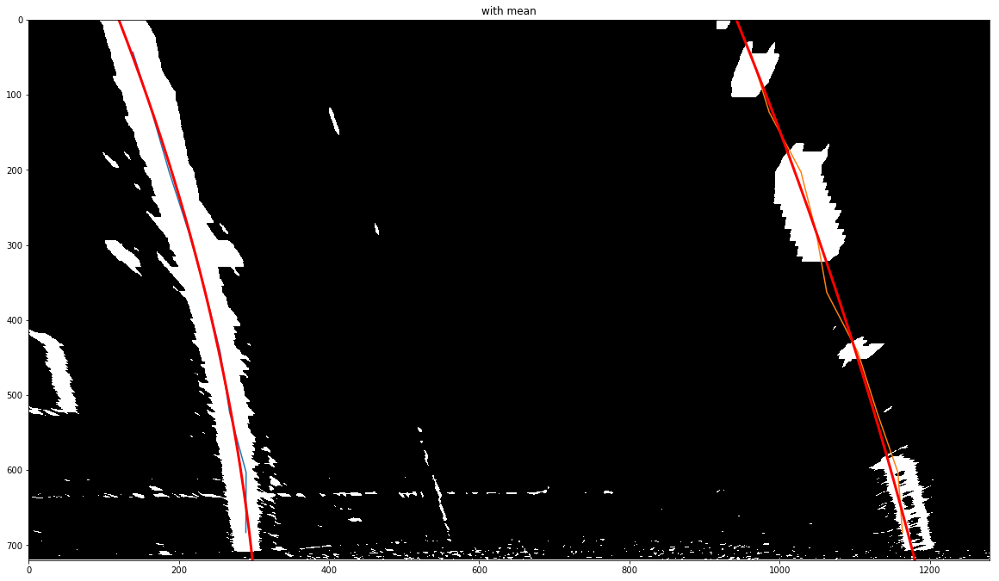

with median
length 9
point -  0
column l [[ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]]
column r [[ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]]
data [[ 287.5]
 [ 288.5]
 [ 287.5]
 [ 291.5]
 [ 291.5]
 [ 293.5]
 [ 292.5]
 [ 293.5]
 [ 297.5]
 [ 291.5]
 [ 290.5]
 [ 288.5]
 [ 284.5]
 [ 289.5]
 [ 289.5]]
minus median [[ 3.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 7.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 6.]
 [ 1.]
 [ 1.]]
median/mdev 2.0
s - d/mdev [[ 1.5]
 [ 1. ]
 [ 1.5]
 [ 0.5]
 [ 0.5]
 [ 1.5]
 [ 1. ]
 [ 1.5]
 [ 3.5]
 [ 0.5]
 [ 0. ]
 [ 1. ]
 [ 3. ]
 [

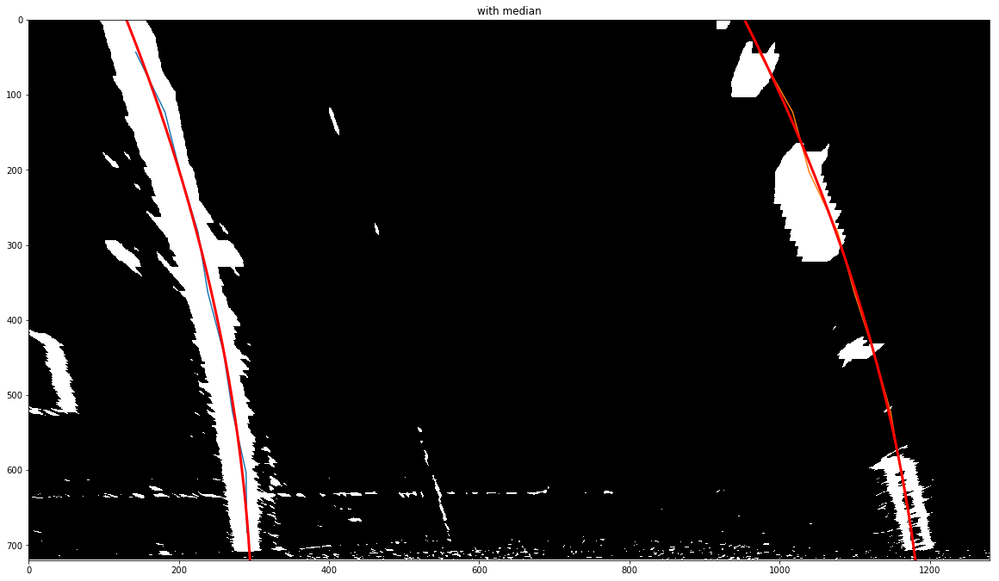

with weighted
median with average
length 9
point -  0
column l [[ 287.5  683. ]
 [ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]]
column r [[ 1171.5   683. ]
 [ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]]
data [[ 287.5]
 [ 288.5]
 [ 287.5]
 [ 291.5]
 [ 291.5]
 [ 293.5]
 [ 292.5]
 [ 293.5]
 [ 297.5]
 [ 291.5]
 [ 290.5]
 [ 288.5]
 [ 284.5]
 [ 289.5]
 [ 289.5]]
minus median [[ 3.]
 [ 2.]
 [ 3.]
 [ 1.]
 [ 1.]
 [ 3.]
 [ 2.]
 [ 3.]
 [ 7.]
 [ 1.]
 [ 0.]
 [ 2.]
 [ 6.]
 [ 1.]
 [ 1.]]
median/mdev 2.0
s - d/mdev [[ 1.5]
 [ 1. ]
 [ 1.5]
 [ 0.5]
 [ 0.5]
 [ 1.5]
 [ 1. ]
 [ 1.5]
 [ 3.5]
 [ 0.5]
 [ 0

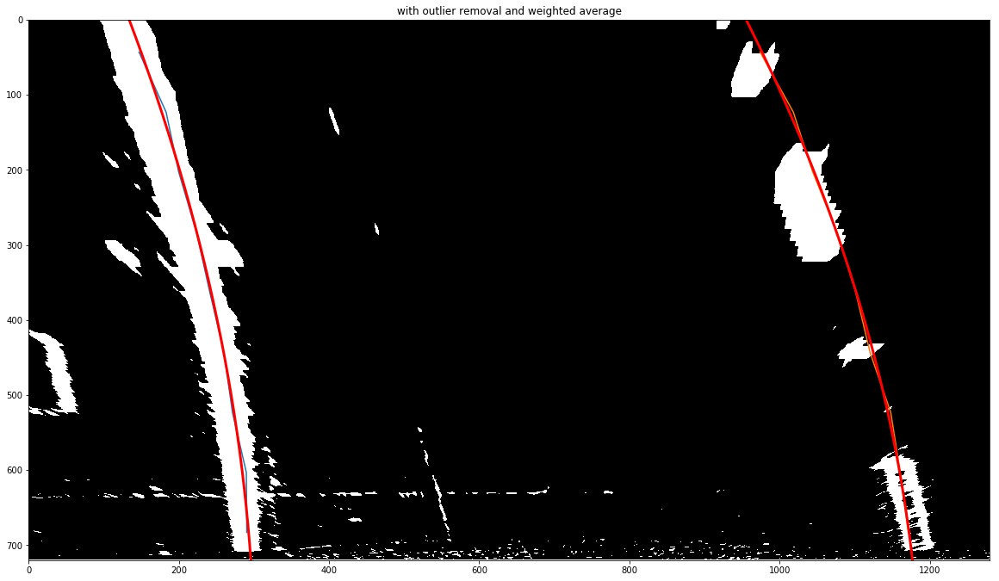

290.423076923 1171.5 -0.477950549451
843.895147286 m 1579.67398108 m
843.895147286 1579.67398108
Left curve radius 843.90 m
Right curve radius 1579.67 m
Car position -0.4780 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


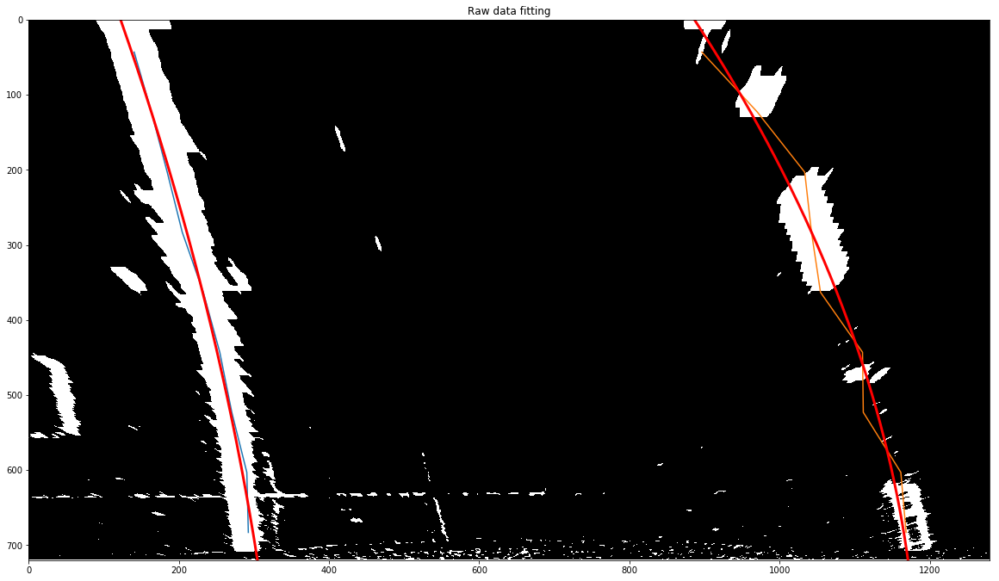

deque([[(288.5, 683), (283.5, 603), (268.5, 523), (262.5, 443), (244.5, 363), (237.5, 283), (215.5, 203), (185.5, 123), (160.5, 43)], [(287.5, 683), (284.5, 603), (270.5, 523), (270.5, 443), (249.5, 363), (239.5, 283), (213.5, 203), (186.5, 123), (155.5, 43)], [(291.5, 683), (292.5, 603), (282.5, 523), (271.5, 443), (253.5, 363), (231.5, 283), (209.5, 203), (185.5, 123), (163.5, 43)], [(291.5, 683), (290.5, 603), (283.5, 523), (266.5, 443), (251.5, 363), (229.5, 283), (205.5, 203), (185.5, 123), (160.5, 43)], [(293.5, 683), (294.5, 603), (285.5, 523), (272.5, 443), (249.5, 363), (229.5, 283), (207.5, 203), (184.5, 123), (163.5, 43)], [(292.5, 683), (295.5, 603), (265.5, 523), (268.5, 443), (245.5, 363), (225.5, 283), (207.5, 203), (181.5, 123), (153.5, 43)], [(293.5, 683), (295.5, 603), (277.5, 523), (265.5, 443), (238.5, 363), (224.5, 283), (201.5, 203), (181.5, 123), (142.5, 43)], [(297.5, 683), (296.5, 603), (279.5, 523), (256.5, 443), (238.5, 363), (225.5, 283), (199.5, 203), (181.

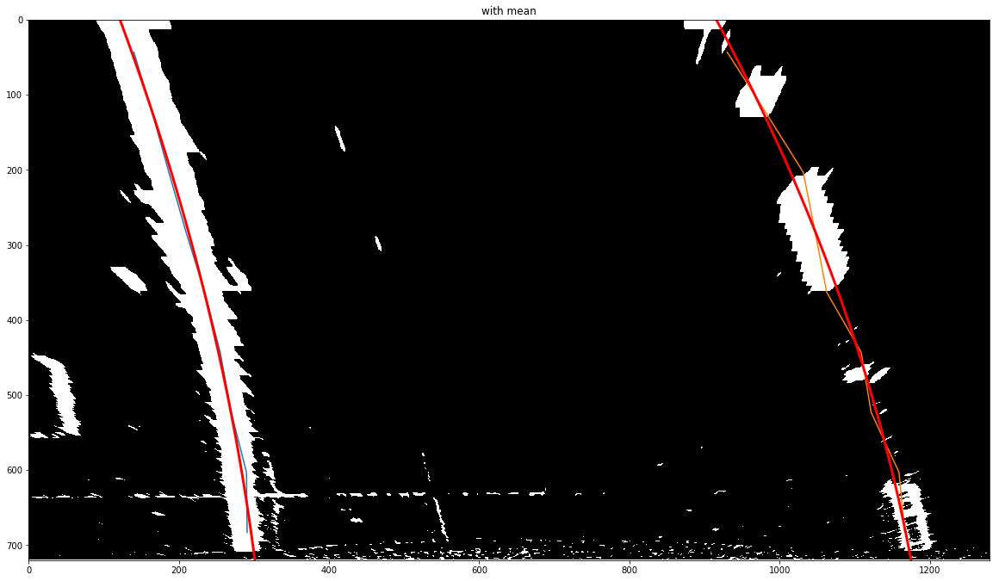

with median
length 9
point -  0
column l [[ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]]
column r [[ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]]
data [[ 288.5]
 [ 287.5]
 [ 291.5]
 [ 291.5]
 [ 293.5]
 [ 292.5]
 [ 293.5]
 [ 297.5]
 [ 291.5]
 [ 290.5]
 [ 288.5]
 [ 284.5]
 [ 289.5]
 [ 289.5]
 [ 292.5]]
minus median [[ 3.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 6.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 7.]
 [ 2.]
 [ 2.]
 [ 1.]]
median/mdev 2.0
s - d/mdev [[ 1.5]
 [ 2. ]
 [ 0. ]
 [ 0. ]
 [ 1. ]
 [ 0.5]
 [ 1. ]
 [ 3. ]
 [ 0. ]
 [ 0.5]
 [ 1.5]
 [ 3.5]
 [ 1. ]
 [

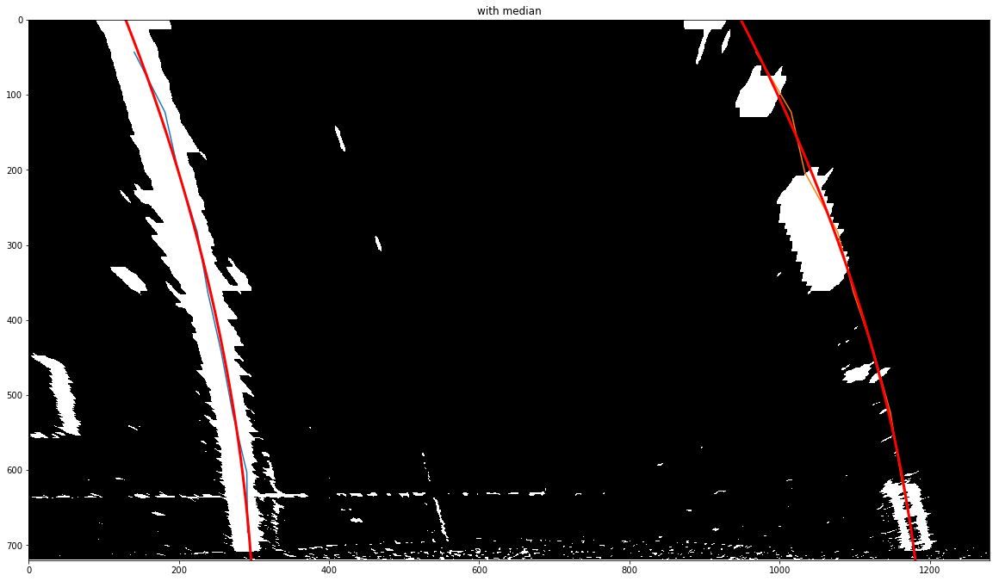

with weighted
median with average
length 9
point -  0
column l [[ 288.5  683. ]
 [ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]]
column r [[ 1177.5   683. ]
 [ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]]
data [[ 288.5]
 [ 287.5]
 [ 291.5]
 [ 291.5]
 [ 293.5]
 [ 292.5]
 [ 293.5]
 [ 297.5]
 [ 291.5]
 [ 290.5]
 [ 288.5]
 [ 284.5]
 [ 289.5]
 [ 289.5]
 [ 292.5]]
minus median [[ 3.]
 [ 4.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 6.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 7.]
 [ 2.]
 [ 2.]
 [ 1.]]
median/mdev 2.0
s - d/mdev [[ 1.5]
 [ 2. ]
 [ 0. ]
 [ 0. ]
 [ 1. ]
 [ 0.5]
 [ 1. ]
 [ 3. ]
 [ 0. ]
 [ 0.5]
 [ 1

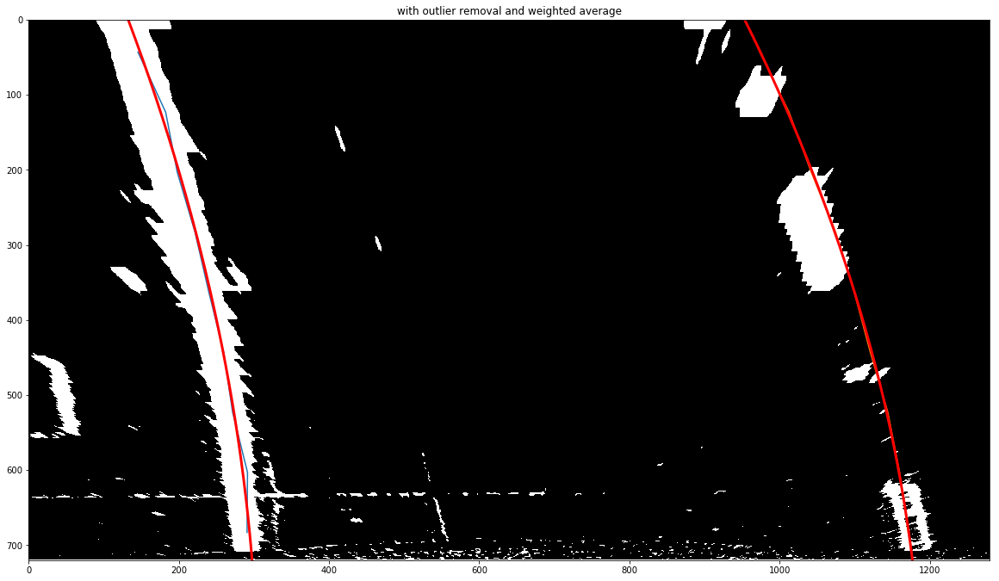

290.807692308 1171.3 -0.479983516484
980.632664038 m 674.917312212 m
980.632664038 674.917312212
Left curve radius 980.63 m
Right curve radius 674.92 m
Car position -0.4800 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


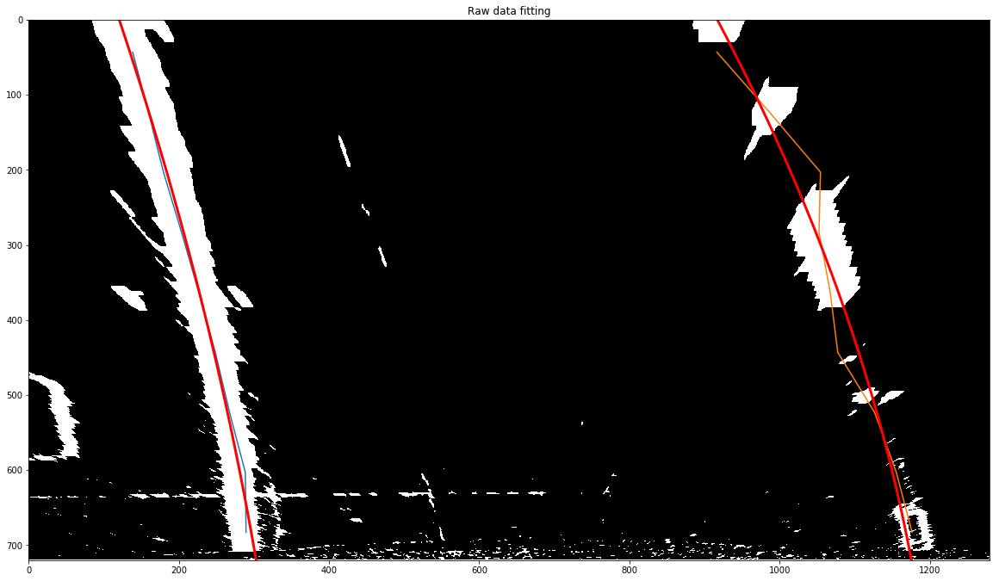

deque([[(287.5, 683), (284.5, 603), (270.5, 523), (270.5, 443), (249.5, 363), (239.5, 283), (213.5, 203), (186.5, 123), (155.5, 43)], [(291.5, 683), (292.5, 603), (282.5, 523), (271.5, 443), (253.5, 363), (231.5, 283), (209.5, 203), (185.5, 123), (163.5, 43)], [(291.5, 683), (290.5, 603), (283.5, 523), (266.5, 443), (251.5, 363), (229.5, 283), (205.5, 203), (185.5, 123), (160.5, 43)], [(293.5, 683), (294.5, 603), (285.5, 523), (272.5, 443), (249.5, 363), (229.5, 283), (207.5, 203), (184.5, 123), (163.5, 43)], [(292.5, 683), (295.5, 603), (265.5, 523), (268.5, 443), (245.5, 363), (225.5, 283), (207.5, 203), (181.5, 123), (153.5, 43)], [(293.5, 683), (295.5, 603), (277.5, 523), (265.5, 443), (238.5, 363), (224.5, 283), (201.5, 203), (181.5, 123), (142.5, 43)], [(297.5, 683), (296.5, 603), (279.5, 523), (256.5, 443), (238.5, 363), (225.5, 283), (199.5, 203), (181.5, 123), (140.5, 43)], [(291.5, 683), (288.5, 603), (271.5, 523), (249.5, 443), (234.5, 363), (213.5, 283), (192.5, 203), (169.

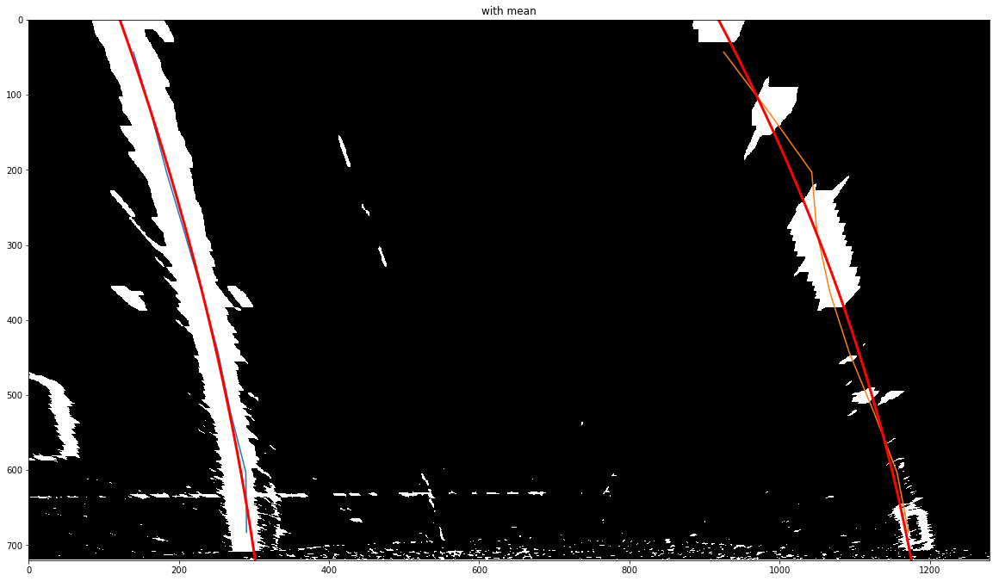

with median
length 9
point -  0
column l [[ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]]
column r [[ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]]
data [[ 287.5]
 [ 291.5]
 [ 291.5]
 [ 293.5]
 [ 292.5]
 [ 293.5]
 [ 297.5]
 [ 291.5]
 [ 290.5]
 [ 288.5]
 [ 284.5]
 [ 289.5]
 [ 289.5]
 [ 292.5]
 [ 289.5]]
minus median [[ 4.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 6.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 7.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 2.]]
median/mdev 2.0
s - d/mdev [[ 2. ]
 [ 0. ]
 [ 0. ]
 [ 1. ]
 [ 0.5]
 [ 1. ]
 [ 3. ]
 [ 0. ]
 [ 0.5]
 [ 1.5]
 [ 3.5]
 [ 1. ]
 [ 1. ]
 [

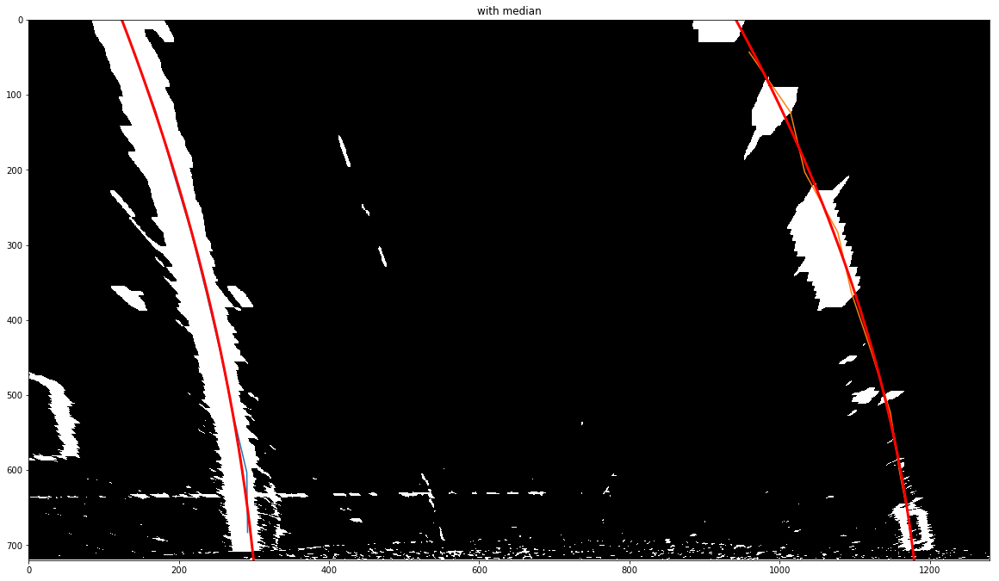

with weighted
median with average
length 9
point -  0
column l [[ 287.5  683. ]
 [ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]]
column r [[ 1179.5   683. ]
 [ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]]
data [[ 287.5]
 [ 291.5]
 [ 291.5]
 [ 293.5]
 [ 292.5]
 [ 293.5]
 [ 297.5]
 [ 291.5]
 [ 290.5]
 [ 288.5]
 [ 284.5]
 [ 289.5]
 [ 289.5]
 [ 292.5]
 [ 289.5]]
minus median [[ 4.]
 [ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 6.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 7.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 2.]]
median/mdev 2.0
s - d/mdev [[ 2. ]
 [ 0. ]
 [ 0. ]
 [ 1. ]
 [ 0.5]
 [ 1. ]
 [ 3. ]
 [ 0. ]
 [ 0.5]
 [ 1.5]
 [ 3

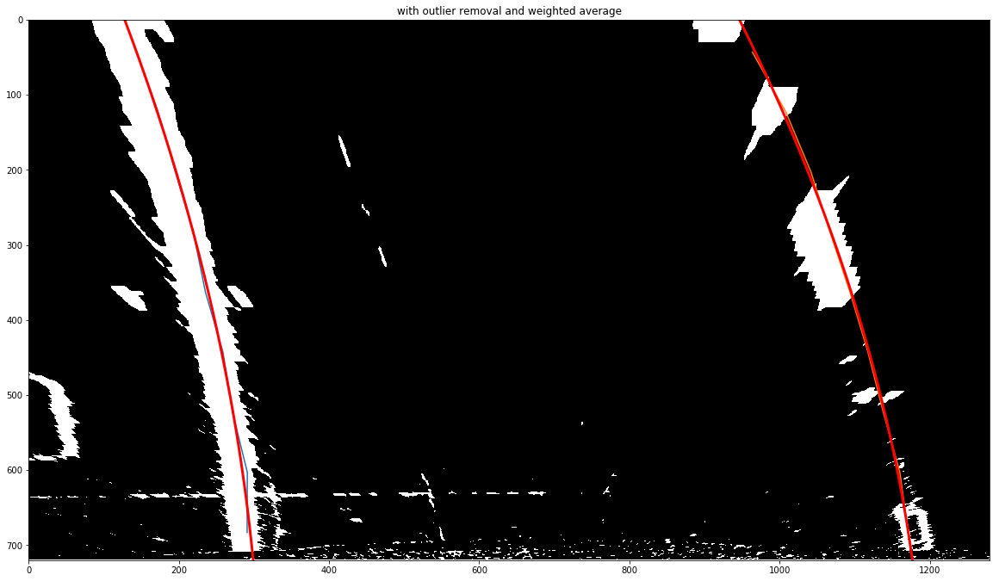

290.884615385 1171.23333333 -0.48039010989
1133.52910535 m 700.653101671 m
1133.52910535 700.653101671
Left curve radius 1133.53 m
Right curve radius 700.65 m
Car position -0.4804 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


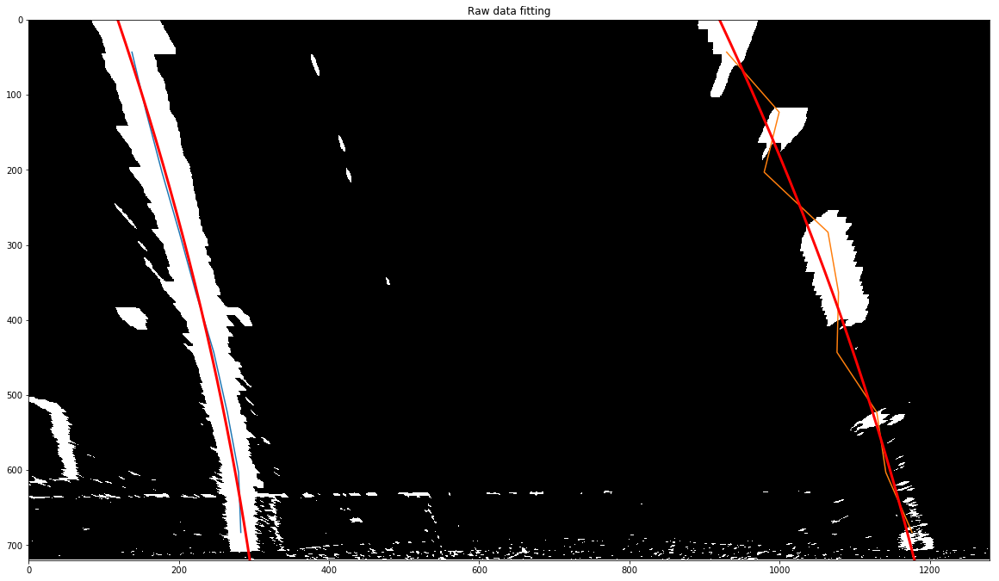

deque([[(291.5, 683), (292.5, 603), (282.5, 523), (271.5, 443), (253.5, 363), (231.5, 283), (209.5, 203), (185.5, 123), (163.5, 43)], [(291.5, 683), (290.5, 603), (283.5, 523), (266.5, 443), (251.5, 363), (229.5, 283), (205.5, 203), (185.5, 123), (160.5, 43)], [(293.5, 683), (294.5, 603), (285.5, 523), (272.5, 443), (249.5, 363), (229.5, 283), (207.5, 203), (184.5, 123), (163.5, 43)], [(292.5, 683), (295.5, 603), (265.5, 523), (268.5, 443), (245.5, 363), (225.5, 283), (207.5, 203), (181.5, 123), (153.5, 43)], [(293.5, 683), (295.5, 603), (277.5, 523), (265.5, 443), (238.5, 363), (224.5, 283), (201.5, 203), (181.5, 123), (142.5, 43)], [(297.5, 683), (296.5, 603), (279.5, 523), (256.5, 443), (238.5, 363), (225.5, 283), (199.5, 203), (181.5, 123), (140.5, 43)], [(291.5, 683), (288.5, 603), (271.5, 523), (249.5, 443), (234.5, 363), (213.5, 283), (192.5, 203), (169.5, 123), (130.5, 43)], [(290.5, 683), (289.5, 603), (269.5, 523), (249.5, 443), (234.5, 363), (213.5, 283), (191.5, 203), (165.

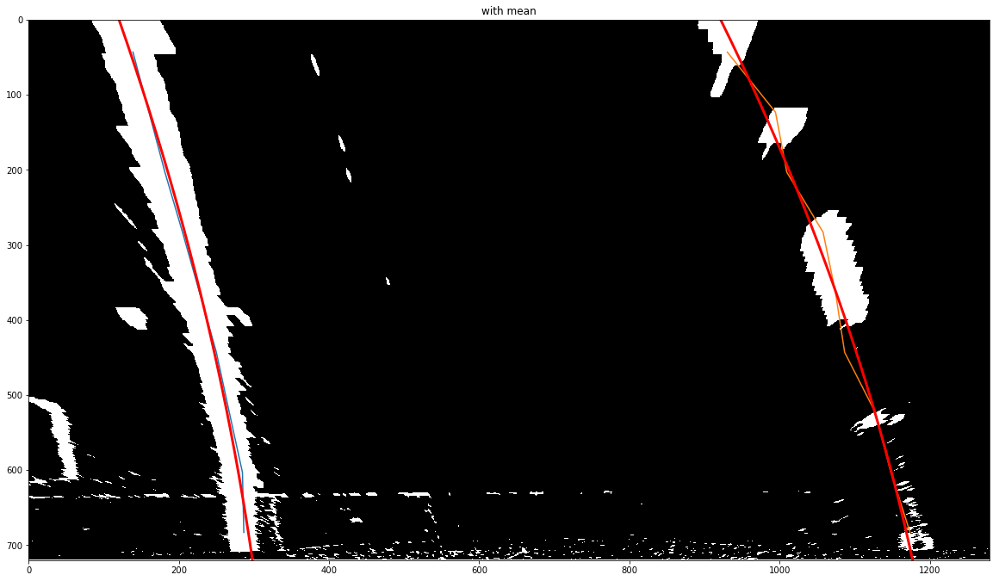

with median
length 9
point -  0
column l [[ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]]
column r [[ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]]
data [[ 291.5]
 [ 291.5]
 [ 293.5]
 [ 292.5]
 [ 293.5]
 [ 297.5]
 [ 291.5]
 [ 290.5]
 [ 288.5]
 [ 284.5]
 [ 289.5]
 [ 289.5]
 [ 292.5]
 [ 289.5]
 [ 282.5]]
minus median [[ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 6.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 7.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 9.]]
median/mdev 2.0
s - d/mdev [[ 0. ]
 [ 0. ]
 [ 1. ]
 [ 0.5]
 [ 1. ]
 [ 3. ]
 [ 0. ]
 [ 0.5]
 [ 1.5]
 [ 3.5]
 [ 1. ]
 [ 1. ]
 [ 0.5]
 [

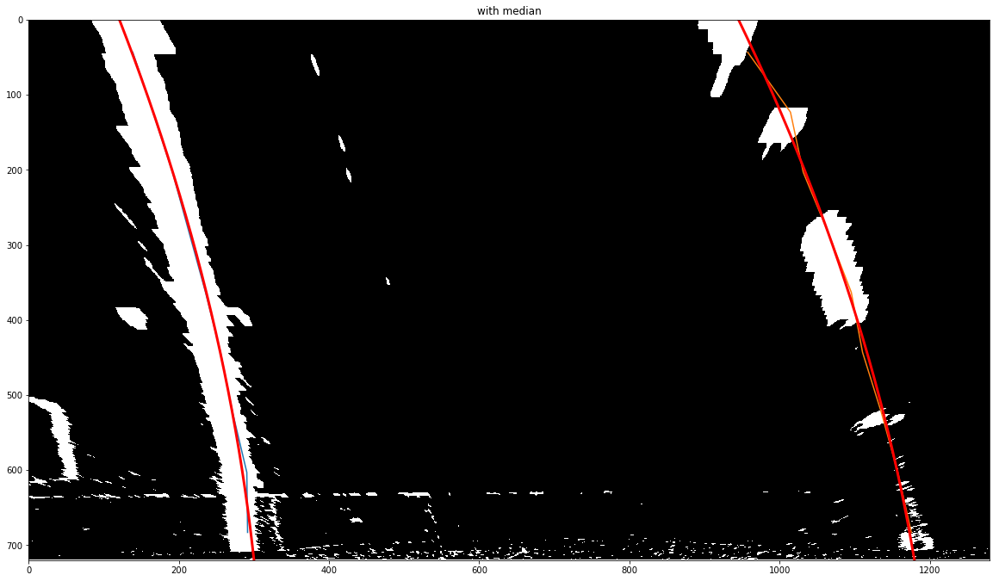

with weighted
median with average
length 9
point -  0
column l [[ 291.5  683. ]
 [ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]]
column r [[ 1183.5   683. ]
 [ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]]
data [[ 291.5]
 [ 291.5]
 [ 293.5]
 [ 292.5]
 [ 293.5]
 [ 297.5]
 [ 291.5]
 [ 290.5]
 [ 288.5]
 [ 284.5]
 [ 289.5]
 [ 289.5]
 [ 292.5]
 [ 289.5]
 [ 282.5]]
minus median [[ 0.]
 [ 0.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 6.]
 [ 0.]
 [ 1.]
 [ 3.]
 [ 7.]
 [ 2.]
 [ 2.]
 [ 1.]
 [ 2.]
 [ 9.]]
median/mdev 2.0
s - d/mdev [[ 0. ]
 [ 0. ]
 [ 1. ]
 [ 0.5]
 [ 1. ]
 [ 3. ]
 [ 0. ]
 [ 0.5]
 [ 1.5]
 [ 3.5]
 [ 1

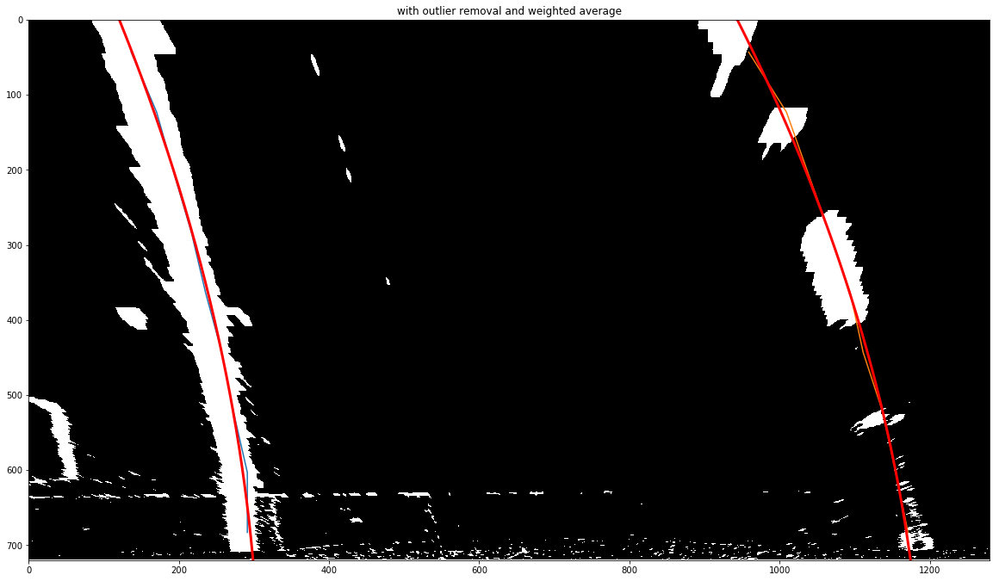

291.166666667 1171.03333333 -0.476595238095
1150.69615386 m 864.104408174 m
1150.69615386 864.104408174
Left curve radius 1150.70 m
Right curve radius 864.10 m
Car position -0.4766 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


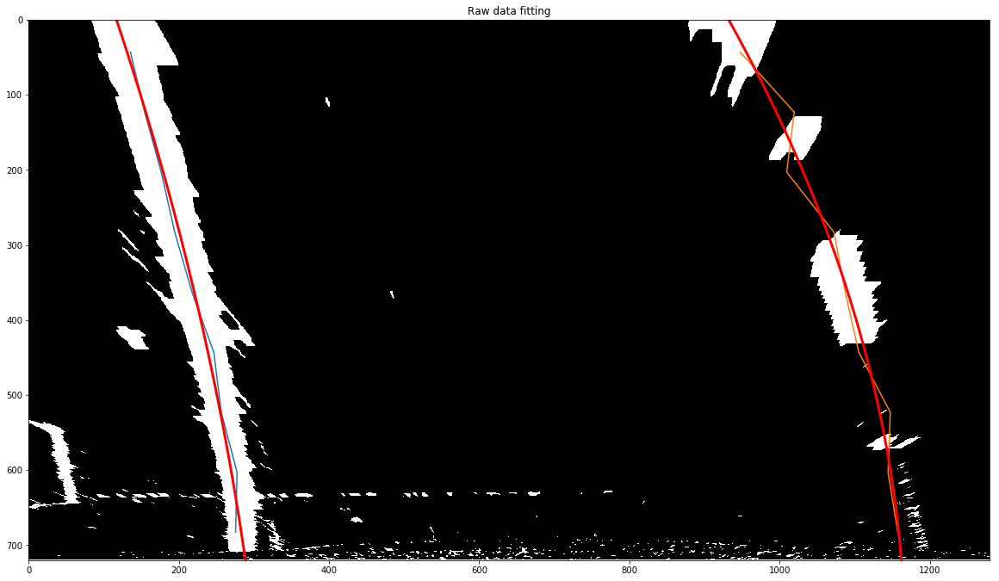

deque([[(291.5, 683), (290.5, 603), (283.5, 523), (266.5, 443), (251.5, 363), (229.5, 283), (205.5, 203), (185.5, 123), (160.5, 43)], [(293.5, 683), (294.5, 603), (285.5, 523), (272.5, 443), (249.5, 363), (229.5, 283), (207.5, 203), (184.5, 123), (163.5, 43)], [(292.5, 683), (295.5, 603), (265.5, 523), (268.5, 443), (245.5, 363), (225.5, 283), (207.5, 203), (181.5, 123), (153.5, 43)], [(293.5, 683), (295.5, 603), (277.5, 523), (265.5, 443), (238.5, 363), (224.5, 283), (201.5, 203), (181.5, 123), (142.5, 43)], [(297.5, 683), (296.5, 603), (279.5, 523), (256.5, 443), (238.5, 363), (225.5, 283), (199.5, 203), (181.5, 123), (140.5, 43)], [(291.5, 683), (288.5, 603), (271.5, 523), (249.5, 443), (234.5, 363), (213.5, 283), (192.5, 203), (169.5, 123), (130.5, 43)], [(290.5, 683), (289.5, 603), (269.5, 523), (249.5, 443), (234.5, 363), (213.5, 283), (191.5, 203), (165.5, 123), (129.5, 43)], [(288.5, 683), (288.5, 603), (271.5, 523), (246.5, 443), (234.5, 363), (212.5, 283), (189.5, 203), (158.

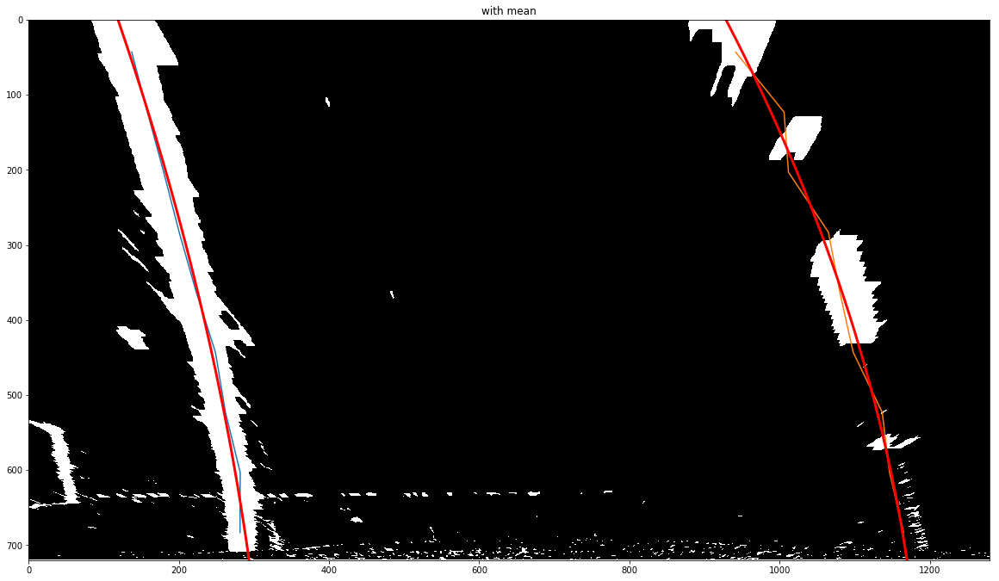

with median
length 9
point -  0
column l [[ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]]
column r [[ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]]
data [[ 291.5]
 [ 293.5]
 [ 292.5]
 [ 293.5]
 [ 297.5]
 [ 291.5]
 [ 290.5]
 [ 288.5]
 [ 284.5]
 [ 289.5]
 [ 289.5]
 [ 292.5]
 [ 289.5]
 [ 282.5]
 [ 275.5]]
minus median [[  1.]
 [  3.]
 [  2.]
 [  3.]
 [  7.]
 [  1.]
 [  0.]
 [  2.]
 [  6.]
 [  1.]
 [  1.]
 [  2.]
 [  1.]
 [  8.]
 [ 15.]]
median/mdev 2.0
s - d/mdev [[ 0.5]
 [ 1.5]
 [ 1. ]
 [ 1.5]
 [ 3.5]
 [ 0.5]
 [ 0. ]
 [ 1. ]
 [ 3. ]
 [ 0.5]
 [ 0.5]
 [ 

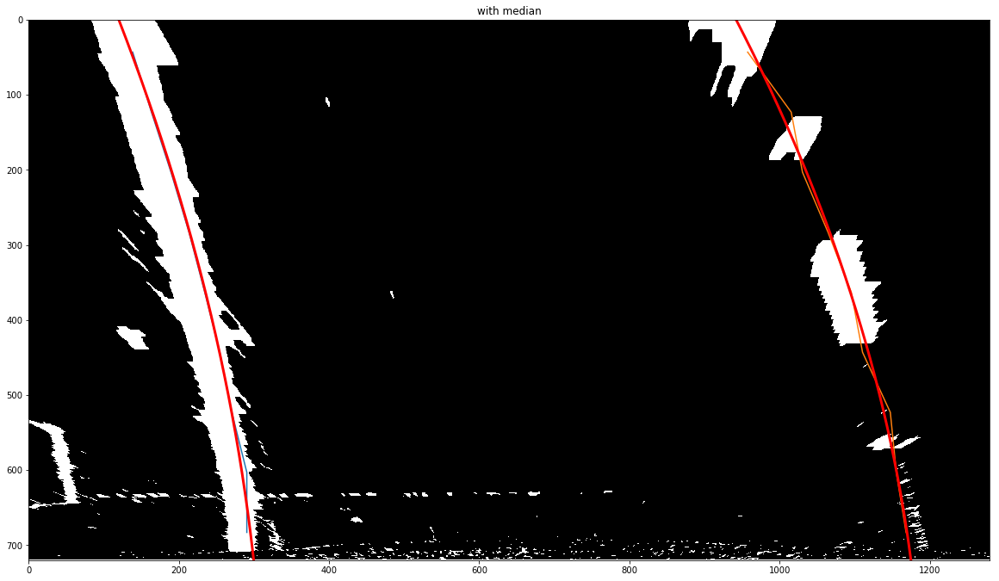

with weighted
median with average
length 9
point -  0
column l [[ 291.5  683. ]
 [ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]]
column r [[ 1181.5   683. ]
 [ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]]
data [[ 291.5]
 [ 293.5]
 [ 292.5]
 [ 293.5]
 [ 297.5]
 [ 291.5]
 [ 290.5]
 [ 288.5]
 [ 284.5]
 [ 289.5]
 [ 289.5]
 [ 292.5]
 [ 289.5]
 [ 282.5]
 [ 275.5]]
minus median [[  1.]
 [  3.]
 [  2.]
 [  3.]
 [  7.]
 [  1.]
 [  0.]
 [  2.]
 [  6.]
 [  1.]
 [  1.]
 [  2.]
 [  1.]
 [  8.]
 [ 15.]]
median/mdev 2.0
s - d/mdev [[ 0.5]
 [ 1.5]
 [ 1. ]
 [ 1.5]
 [ 3.5]
 [ 0.5]
 [ 0. ]
 [ 1. ]
 [ 3.

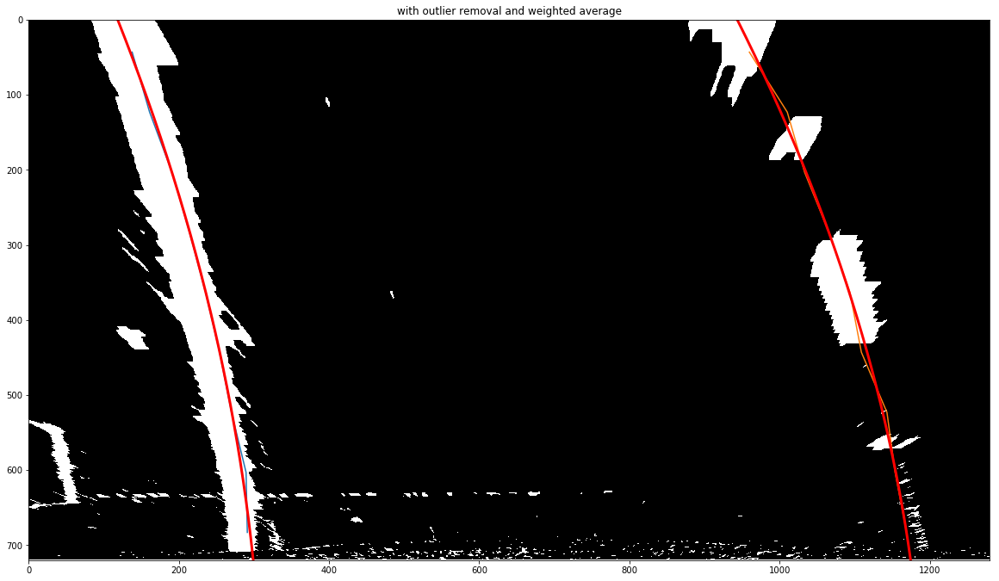

291.136363636 1169.3 -0.476435064935
1169.8775267 m 643.716137108 m
1169.8775267 643.716137108
Left curve radius 1169.88 m
Right curve radius 643.72 m
Car position -0.4764 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


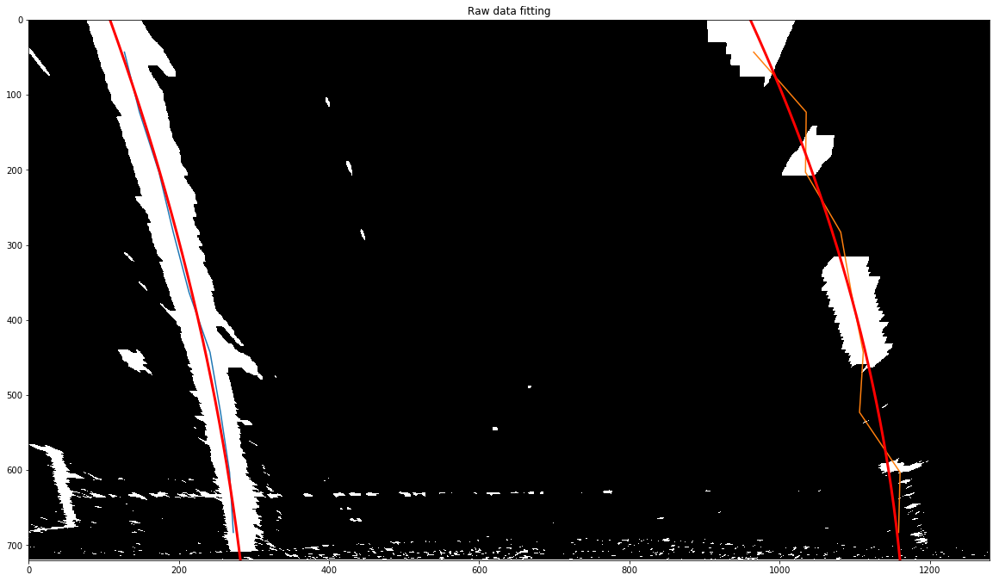

deque([[(293.5, 683), (294.5, 603), (285.5, 523), (272.5, 443), (249.5, 363), (229.5, 283), (207.5, 203), (184.5, 123), (163.5, 43)], [(292.5, 683), (295.5, 603), (265.5, 523), (268.5, 443), (245.5, 363), (225.5, 283), (207.5, 203), (181.5, 123), (153.5, 43)], [(293.5, 683), (295.5, 603), (277.5, 523), (265.5, 443), (238.5, 363), (224.5, 283), (201.5, 203), (181.5, 123), (142.5, 43)], [(297.5, 683), (296.5, 603), (279.5, 523), (256.5, 443), (238.5, 363), (225.5, 283), (199.5, 203), (181.5, 123), (140.5, 43)], [(291.5, 683), (288.5, 603), (271.5, 523), (249.5, 443), (234.5, 363), (213.5, 283), (192.5, 203), (169.5, 123), (130.5, 43)], [(290.5, 683), (289.5, 603), (269.5, 523), (249.5, 443), (234.5, 363), (213.5, 283), (191.5, 203), (165.5, 123), (129.5, 43)], [(288.5, 683), (288.5, 603), (271.5, 523), (246.5, 443), (234.5, 363), (212.5, 283), (189.5, 203), (158.5, 123), (129.5, 43)], [(284.5, 683), (284.5, 603), (267.5, 523), (250.5, 443), (236.5, 363), (209.5, 283), (180.5, 203), (159.

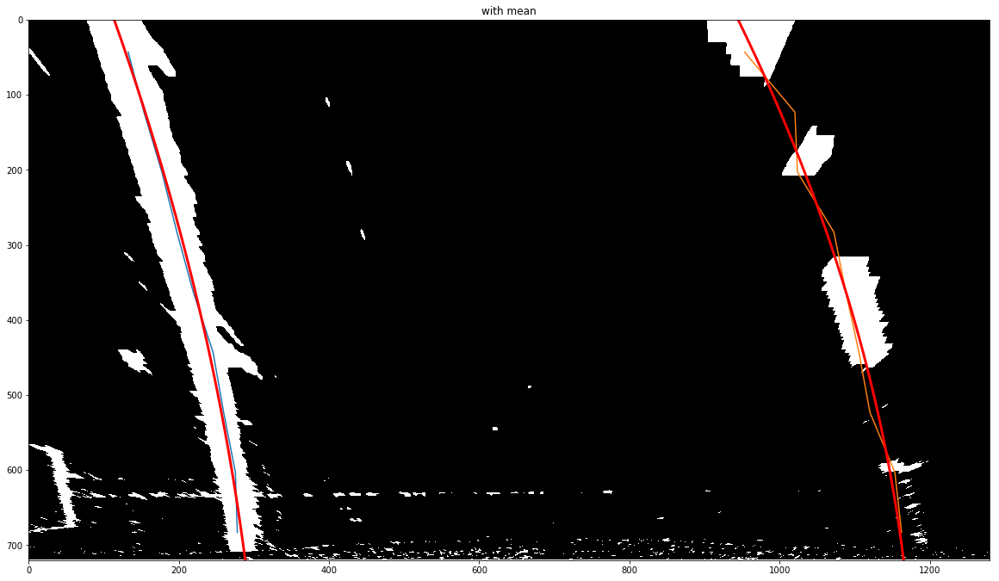

with median
length 9
point -  0
column l [[ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]]
column r [[ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]]
data [[ 293.5]
 [ 292.5]
 [ 293.5]
 [ 297.5]
 [ 291.5]
 [ 290.5]
 [ 288.5]
 [ 284.5]
 [ 289.5]
 [ 289.5]
 [ 292.5]
 [ 289.5]
 [ 282.5]
 [ 275.5]
 [ 272.5]]
minus median [[  4.]
 [  3.]
 [  4.]
 [  8.]
 [  2.]
 [  1.]
 [  1.]
 [  5.]
 [  0.]
 [  0.]
 [  3.]
 [  0.]
 [  7.]
 [ 14.]
 [ 17.]]
median/mdev 3.0
s - d/mdev [[ 1.33333333]
 [ 1.        ]
 [ 1.33333333]
 [ 2.66666667]
 [ 0.66666667]
 [ 0.33333333]
 

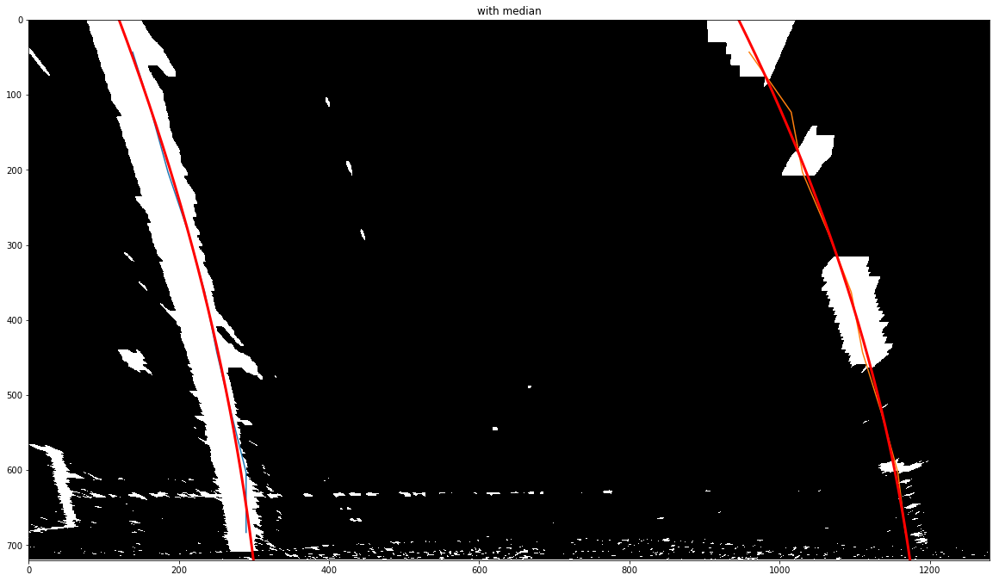

with weighted
median with average
length 9
point -  0
column l [[ 293.5  683. ]
 [ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]]
column r [[ 1167.5   683. ]
 [ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]]
data [[ 293.5]
 [ 292.5]
 [ 293.5]
 [ 297.5]
 [ 291.5]
 [ 290.5]
 [ 288.5]
 [ 284.5]
 [ 289.5]
 [ 289.5]
 [ 292.5]
 [ 289.5]
 [ 282.5]
 [ 275.5]
 [ 272.5]]
minus median [[  4.]
 [  3.]
 [  4.]
 [  8.]
 [  2.]
 [  1.]
 [  1.]
 [  5.]
 [  0.]
 [  0.]
 [  3.]
 [  0.]
 [  7.]
 [ 14.]
 [ 17.]]
median/mdev 3.0
s - d/mdev [[ 1.33333333]
 [ 1.        ]
 [ 1.33333333]
 [ 2.66666667]
 [ 0.6666

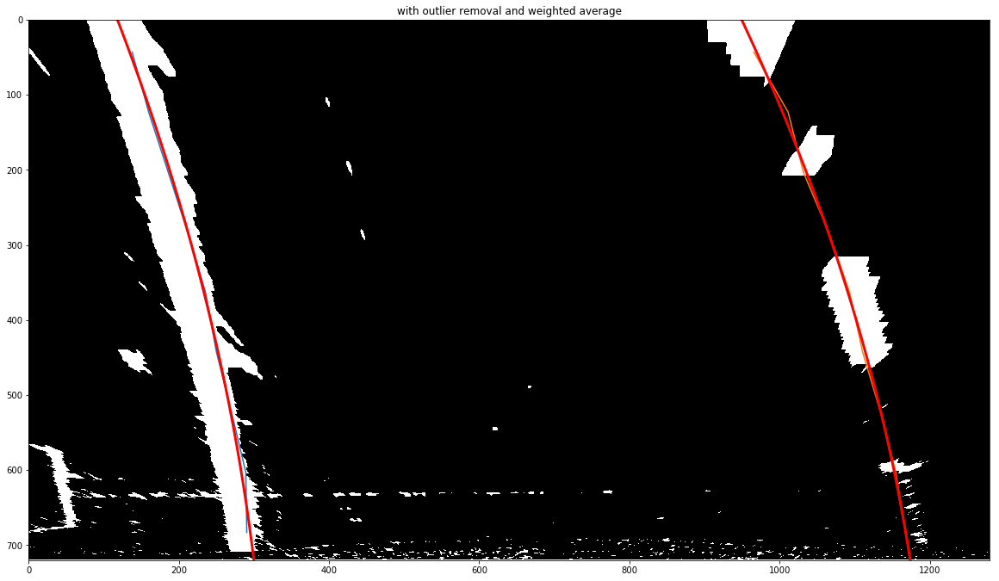

290.423076923 1167.76666667 -0.467379120879
1056.64217966 m 654.316175386 m
1056.64217966 654.316175386
Left curve radius 1056.64 m
Right curve radius 654.32 m
Car position -0.4674 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


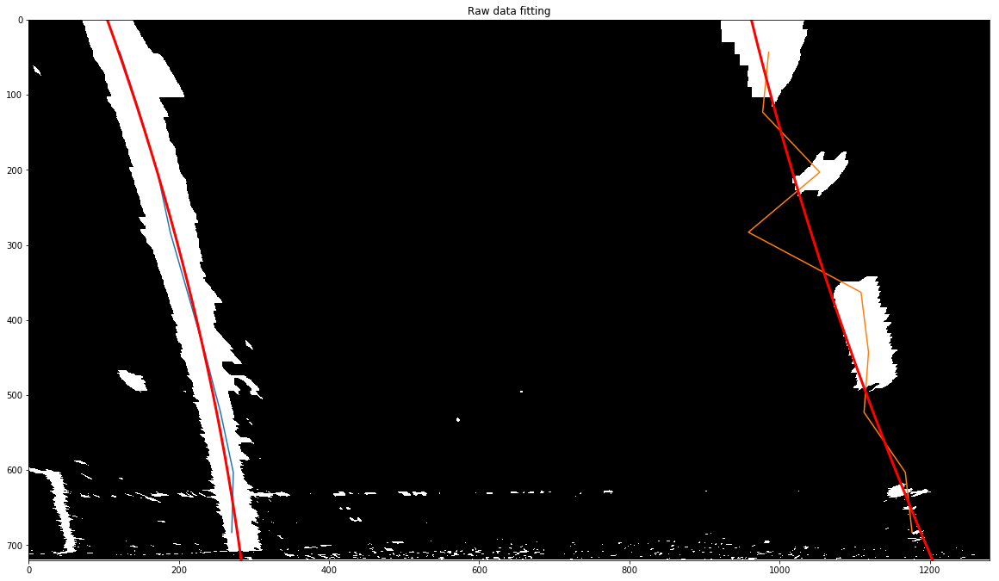

deque([[(292.5, 683), (295.5, 603), (265.5, 523), (268.5, 443), (245.5, 363), (225.5, 283), (207.5, 203), (181.5, 123), (153.5, 43)], [(293.5, 683), (295.5, 603), (277.5, 523), (265.5, 443), (238.5, 363), (224.5, 283), (201.5, 203), (181.5, 123), (142.5, 43)], [(297.5, 683), (296.5, 603), (279.5, 523), (256.5, 443), (238.5, 363), (225.5, 283), (199.5, 203), (181.5, 123), (140.5, 43)], [(291.5, 683), (288.5, 603), (271.5, 523), (249.5, 443), (234.5, 363), (213.5, 283), (192.5, 203), (169.5, 123), (130.5, 43)], [(290.5, 683), (289.5, 603), (269.5, 523), (249.5, 443), (234.5, 363), (213.5, 283), (191.5, 203), (165.5, 123), (129.5, 43)], [(288.5, 683), (288.5, 603), (271.5, 523), (246.5, 443), (234.5, 363), (212.5, 283), (189.5, 203), (158.5, 123), (129.5, 43)], [(284.5, 683), (284.5, 603), (267.5, 523), (250.5, 443), (236.5, 363), (209.5, 283), (180.5, 203), (159.5, 123), (135.5, 43)], [(289.5, 683), (289.5, 603), (272.5, 523), (255.5, 443), (235.5, 363), (216.5, 283), (183.5, 203), (159.

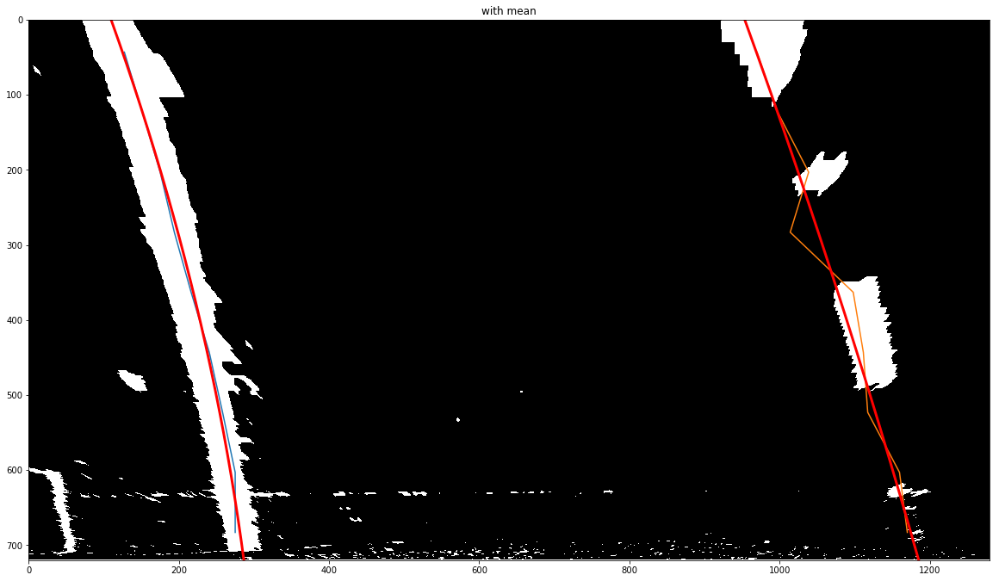

with median
length 9
point -  0
column l [[ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]]
column r [[ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]]
data [[ 292.5]
 [ 293.5]
 [ 297.5]
 [ 291.5]
 [ 290.5]
 [ 288.5]
 [ 284.5]
 [ 289.5]
 [ 289.5]
 [ 292.5]
 [ 289.5]
 [ 282.5]
 [ 275.5]
 [ 272.5]
 [ 270.5]]
minus median [[  3.]
 [  4.]
 [  8.]
 [  2.]
 [  1.]
 [  1.]
 [  5.]
 [  0.]
 [  0.]
 [  3.]
 [  0.]
 [  7.]
 [ 14.]
 [ 17.]
 [ 19.]]
median/mdev 3.0
s - d/mdev [[ 1.        ]
 [ 1.33333333]
 [ 2.66666667]
 [ 0.66666667]
 [ 0.33333333]
 [ 0.33333333]
 

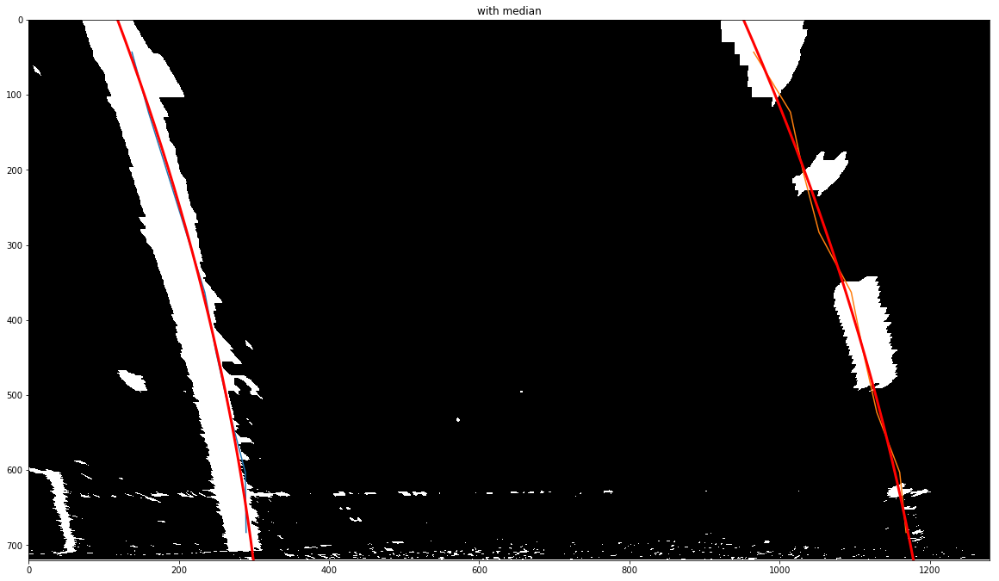

with weighted
median with average
length 9
point -  0
column l [[ 292.5  683. ]
 [ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]]
column r [[ 1176.5   683. ]
 [ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]]
data [[ 292.5]
 [ 293.5]
 [ 297.5]
 [ 291.5]
 [ 290.5]
 [ 288.5]
 [ 284.5]
 [ 289.5]
 [ 289.5]
 [ 292.5]
 [ 289.5]
 [ 282.5]
 [ 275.5]
 [ 272.5]
 [ 270.5]]
minus median [[  3.]
 [  4.]
 [  8.]
 [  2.]
 [  1.]
 [  1.]
 [  5.]
 [  0.]
 [  0.]
 [  3.]
 [  0.]
 [  7.]
 [ 14.]
 [ 17.]
 [ 19.]]
median/mdev 3.0
s - d/mdev [[ 1.        ]
 [ 1.33333333]
 [ 2.66666667]
 [ 0.66666667]
 [ 0.3333

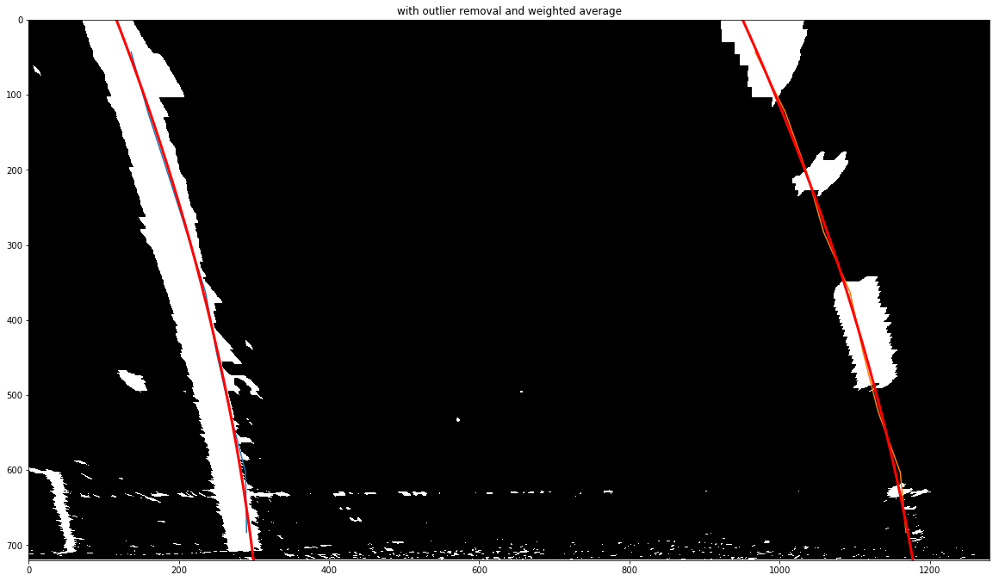

290.166666667 1168.36666667 -0.47130952381
1049.10482892 m 2970.82852553 m
1049.10482892 2970.82852553
Left curve radius 1049.10 m
Right curve radius 2970.83 m
Car position -0.4713 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


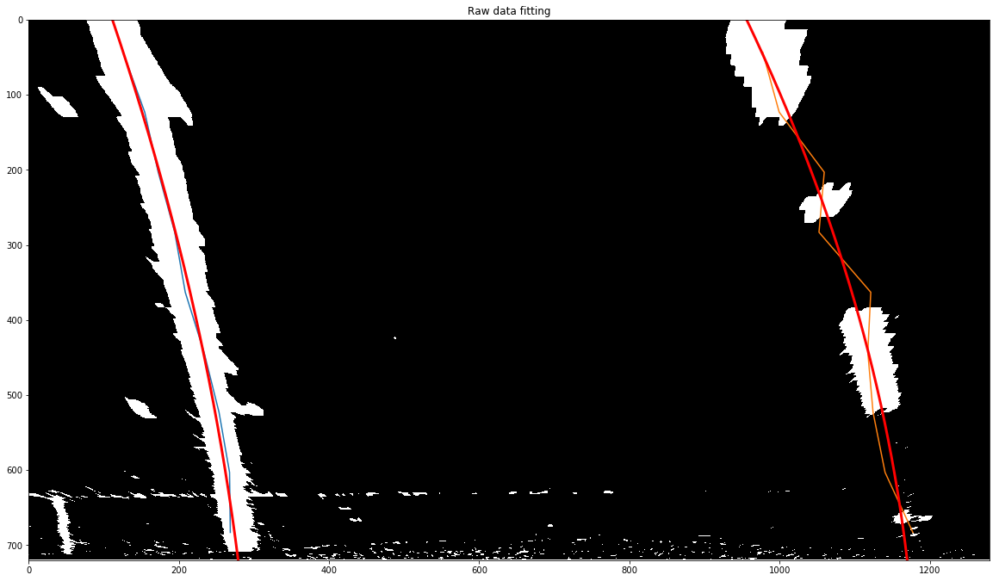

deque([[(293.5, 683), (295.5, 603), (277.5, 523), (265.5, 443), (238.5, 363), (224.5, 283), (201.5, 203), (181.5, 123), (142.5, 43)], [(297.5, 683), (296.5, 603), (279.5, 523), (256.5, 443), (238.5, 363), (225.5, 283), (199.5, 203), (181.5, 123), (140.5, 43)], [(291.5, 683), (288.5, 603), (271.5, 523), (249.5, 443), (234.5, 363), (213.5, 283), (192.5, 203), (169.5, 123), (130.5, 43)], [(290.5, 683), (289.5, 603), (269.5, 523), (249.5, 443), (234.5, 363), (213.5, 283), (191.5, 203), (165.5, 123), (129.5, 43)], [(288.5, 683), (288.5, 603), (271.5, 523), (246.5, 443), (234.5, 363), (212.5, 283), (189.5, 203), (158.5, 123), (129.5, 43)], [(284.5, 683), (284.5, 603), (267.5, 523), (250.5, 443), (236.5, 363), (209.5, 283), (180.5, 203), (159.5, 123), (135.5, 43)], [(289.5, 683), (289.5, 603), (272.5, 523), (255.5, 443), (235.5, 363), (216.5, 283), (183.5, 203), (159.5, 123), (138.5, 43)], [(289.5, 683), (290.5, 603), (263.5, 523), (255.5, 443), (233.5, 363), (209.5, 283), (185.5, 203), (163.

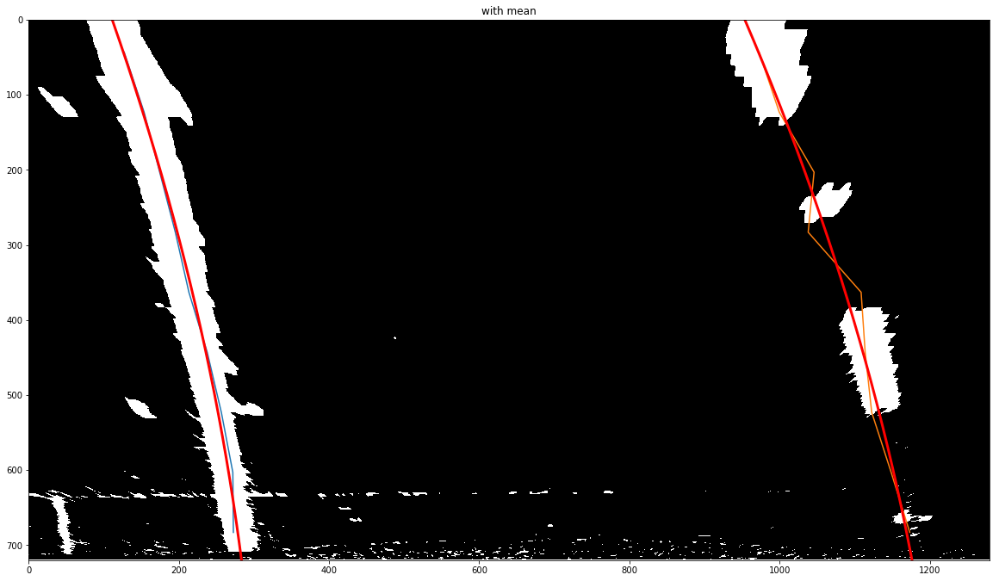

with median
length 9
point -  0
column l [[ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]]
column r [[ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]]
data [[ 293.5]
 [ 297.5]
 [ 291.5]
 [ 290.5]
 [ 288.5]
 [ 284.5]
 [ 289.5]
 [ 289.5]
 [ 292.5]
 [ 289.5]
 [ 282.5]
 [ 275.5]
 [ 272.5]
 [ 270.5]
 [ 268.5]]
minus median [[  4.]
 [  8.]
 [  2.]
 [  1.]
 [  1.]
 [  5.]
 [  0.]
 [  0.]
 [  3.]
 [  0.]
 [  7.]
 [ 14.]
 [ 17.]
 [ 19.]
 [ 21.]]
median/mdev 4.0
s - d/mdev [[ 1.  ]
 [ 2.  ]
 [ 0.5 ]
 [ 0.25]
 [ 0.25]
 [ 1.25]
 [ 0.  ]
 [ 0.  ]
 [ 0.75]
 [ 0.  ]
 

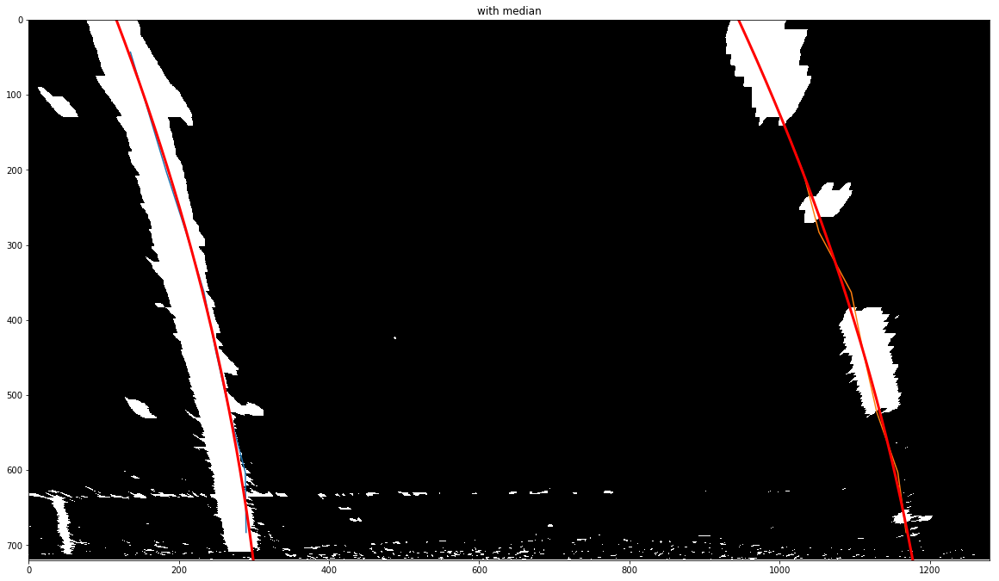

with weighted
median with average
length 9
point -  0
column l [[ 293.5  683. ]
 [ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]]
column r [[ 1175.5   683. ]
 [ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]]
data [[ 293.5]
 [ 297.5]
 [ 291.5]
 [ 290.5]
 [ 288.5]
 [ 284.5]
 [ 289.5]
 [ 289.5]
 [ 292.5]
 [ 289.5]
 [ 282.5]
 [ 275.5]
 [ 272.5]
 [ 270.5]
 [ 268.5]]
minus median [[  4.]
 [  8.]
 [  2.]
 [  1.]
 [  1.]
 [  5.]
 [  0.]
 [  0.]
 [  3.]
 [  0.]
 [  7.]
 [ 14.]
 [ 17.]
 [ 19.]
 [ 21.]]
median/mdev 4.0
s - d/mdev [[ 1.  ]
 [ 2.  ]
 [ 0.5 ]
 [ 0.25]
 [ 0.25]
 [ 1.25]
 [ 0.  ]
 [ 0. 

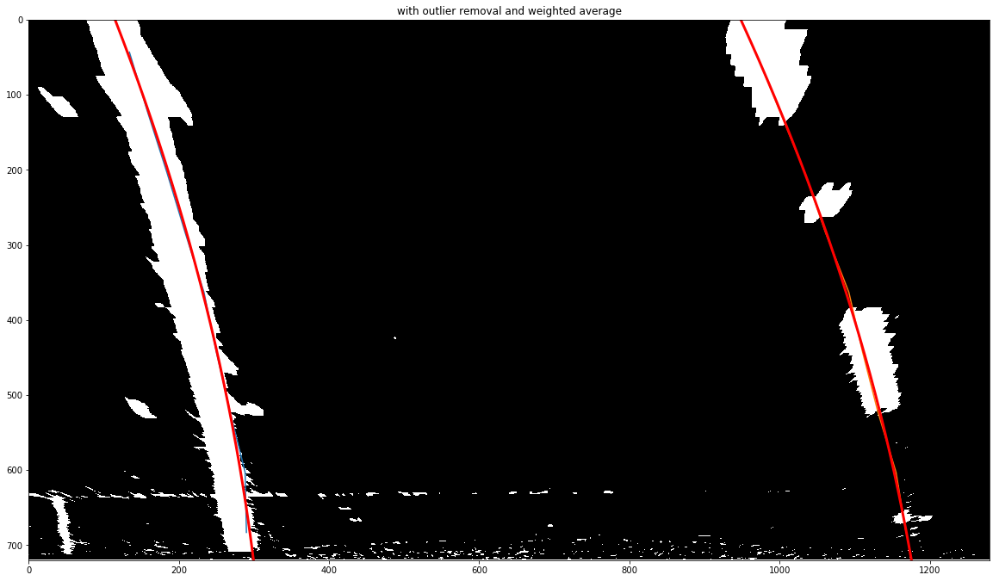

289.954545455 1168.43333333 -0.470188311688
1070.1065024 m 992.901321541 m
1070.1065024 992.901321541
Left curve radius 1070.11 m
Right curve radius 992.90 m
Car position -0.4702 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


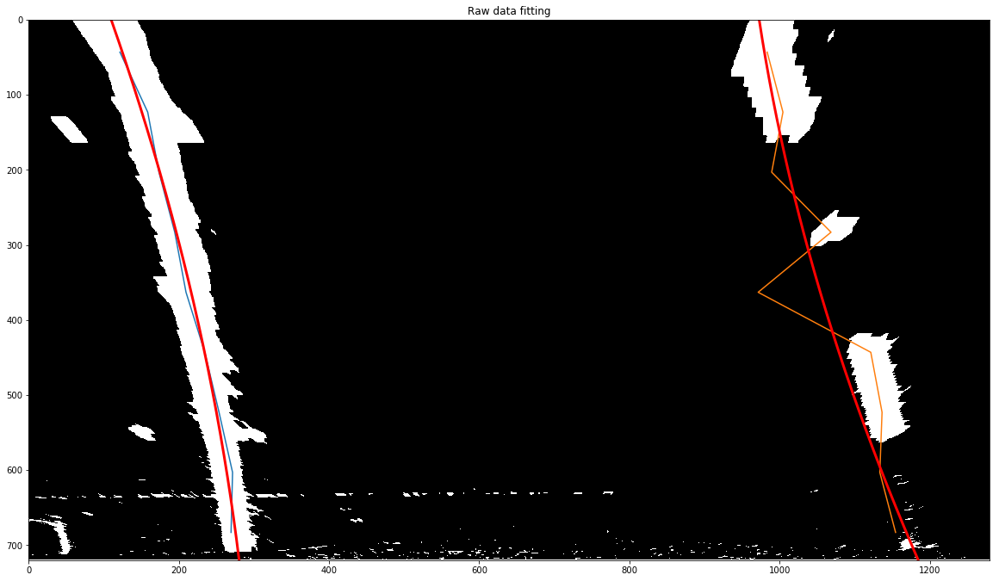

deque([[(297.5, 683), (296.5, 603), (279.5, 523), (256.5, 443), (238.5, 363), (225.5, 283), (199.5, 203), (181.5, 123), (140.5, 43)], [(291.5, 683), (288.5, 603), (271.5, 523), (249.5, 443), (234.5, 363), (213.5, 283), (192.5, 203), (169.5, 123), (130.5, 43)], [(290.5, 683), (289.5, 603), (269.5, 523), (249.5, 443), (234.5, 363), (213.5, 283), (191.5, 203), (165.5, 123), (129.5, 43)], [(288.5, 683), (288.5, 603), (271.5, 523), (246.5, 443), (234.5, 363), (212.5, 283), (189.5, 203), (158.5, 123), (129.5, 43)], [(284.5, 683), (284.5, 603), (267.5, 523), (250.5, 443), (236.5, 363), (209.5, 283), (180.5, 203), (159.5, 123), (135.5, 43)], [(289.5, 683), (289.5, 603), (272.5, 523), (255.5, 443), (235.5, 363), (216.5, 283), (183.5, 203), (159.5, 123), (138.5, 43)], [(289.5, 683), (290.5, 603), (263.5, 523), (255.5, 443), (233.5, 363), (209.5, 283), (185.5, 203), (163.5, 123), (138.5, 43)], [(292.5, 683), (290.5, 603), (270.5, 523), (254.5, 443), (232.5, 363), (204.5, 283), (184.5, 203), (163.

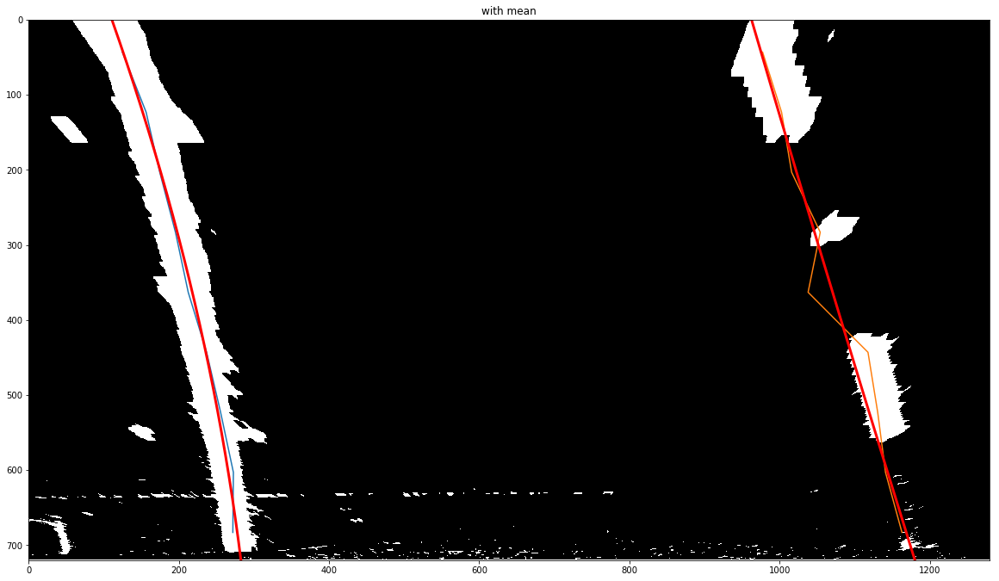

with median
length 9
point -  0
column l [[ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]]
column r [[ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]]
data [[ 297.5]
 [ 291.5]
 [ 290.5]
 [ 288.5]
 [ 284.5]
 [ 289.5]
 [ 289.5]
 [ 292.5]
 [ 289.5]
 [ 282.5]
 [ 275.5]
 [ 272.5]
 [ 270.5]
 [ 268.5]
 [ 269.5]]
minus median [[  9.]
 [  3.]
 [  2.]
 [  0.]
 [  4.]
 [  1.]
 [  1.]
 [  4.]
 [  1.]
 [  6.]
 [ 13.]
 [ 16.]
 [ 18.]
 [ 20.]
 [ 19.]]
median/mdev 4.0
s - d/mdev [[ 2.25]
 [ 0.75]
 [ 0.5 ]
 [ 0.  ]
 [ 1.  ]
 [ 0.25]
 [ 0.25]
 [ 1.  ]
 [ 0.25]
 [ 1.5 ]
 

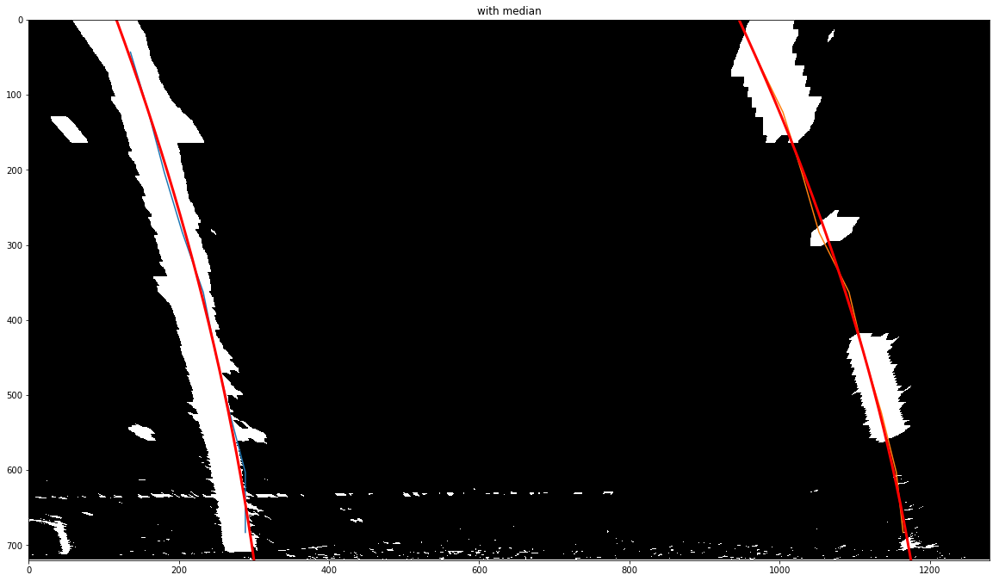

with weighted
median with average
length 9
point -  0
column l [[ 297.5  683. ]
 [ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]]
column r [[ 1175.5   683. ]
 [ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]]
data [[ 297.5]
 [ 291.5]
 [ 290.5]
 [ 288.5]
 [ 284.5]
 [ 289.5]
 [ 289.5]
 [ 292.5]
 [ 289.5]
 [ 282.5]
 [ 275.5]
 [ 272.5]
 [ 270.5]
 [ 268.5]
 [ 269.5]]
minus median [[  9.]
 [  3.]
 [  2.]
 [  0.]
 [  4.]
 [  1.]
 [  1.]
 [  4.]
 [  1.]
 [  6.]
 [ 13.]
 [ 16.]
 [ 18.]
 [ 20.]
 [ 19.]]
median/mdev 4.0
s - d/mdev [[ 2.25]
 [ 0.75]
 [ 0.5 ]
 [ 0.  ]
 [ 1.  ]
 [ 0.25]
 [ 0.25]
 [ 1. 

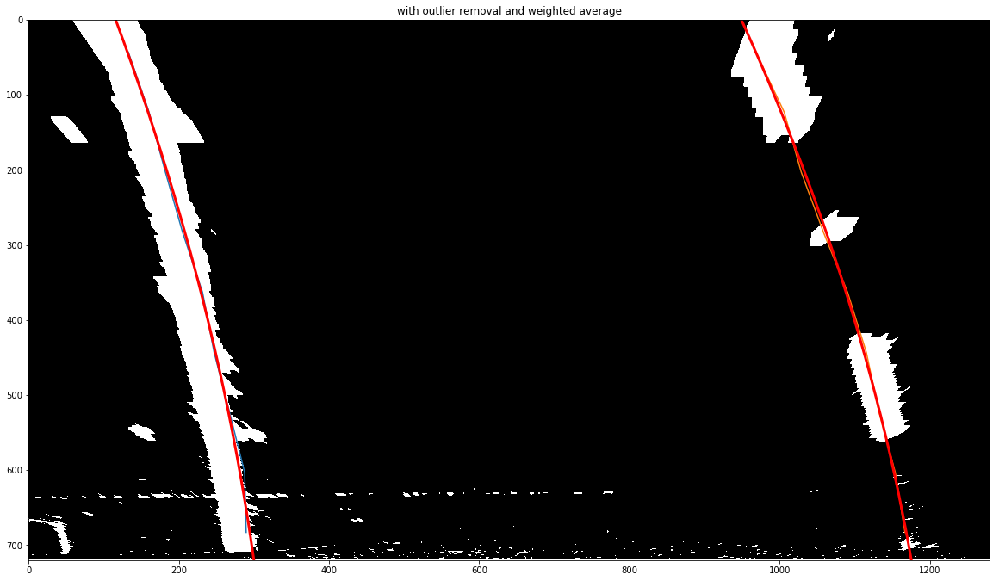

289.6 1167.03333333 -0.463028571429
1041.98870009 m 12092.5842233 m
1041.98870009 12092.5842233
Left curve radius 1041.99 m
Right curve radius 12092.58 m
Car position -0.4630 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


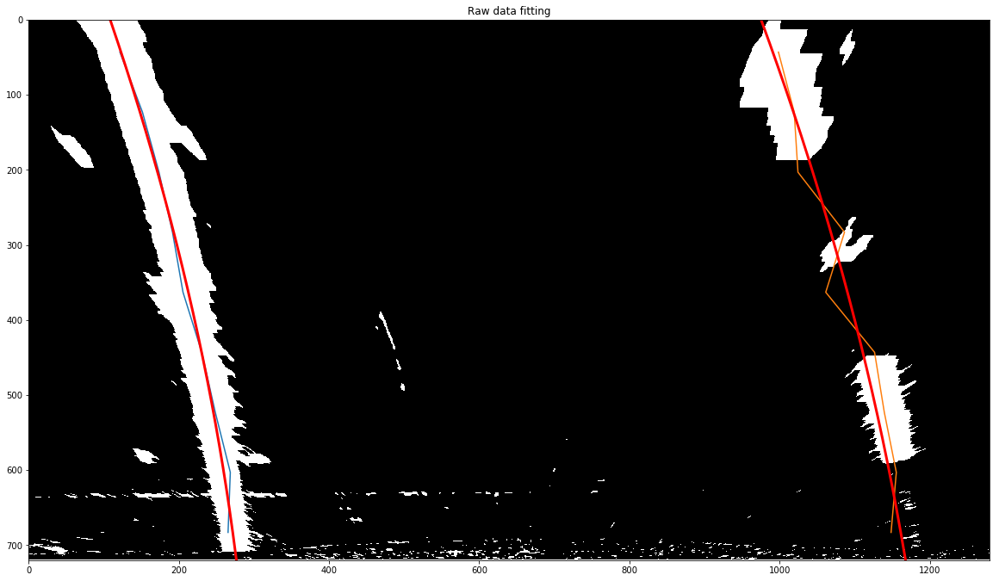

deque([[(291.5, 683), (288.5, 603), (271.5, 523), (249.5, 443), (234.5, 363), (213.5, 283), (192.5, 203), (169.5, 123), (130.5, 43)], [(290.5, 683), (289.5, 603), (269.5, 523), (249.5, 443), (234.5, 363), (213.5, 283), (191.5, 203), (165.5, 123), (129.5, 43)], [(288.5, 683), (288.5, 603), (271.5, 523), (246.5, 443), (234.5, 363), (212.5, 283), (189.5, 203), (158.5, 123), (129.5, 43)], [(284.5, 683), (284.5, 603), (267.5, 523), (250.5, 443), (236.5, 363), (209.5, 283), (180.5, 203), (159.5, 123), (135.5, 43)], [(289.5, 683), (289.5, 603), (272.5, 523), (255.5, 443), (235.5, 363), (216.5, 283), (183.5, 203), (159.5, 123), (138.5, 43)], [(289.5, 683), (290.5, 603), (263.5, 523), (255.5, 443), (233.5, 363), (209.5, 283), (185.5, 203), (163.5, 123), (138.5, 43)], [(292.5, 683), (290.5, 603), (270.5, 523), (254.5, 443), (232.5, 363), (204.5, 283), (184.5, 203), (163.5, 123), (140.5, 43)], [(289.5, 683), (288.5, 603), (267.5, 523), (248.5, 443), (226.5, 363), (203.5, 283), (179.5, 203), (159.

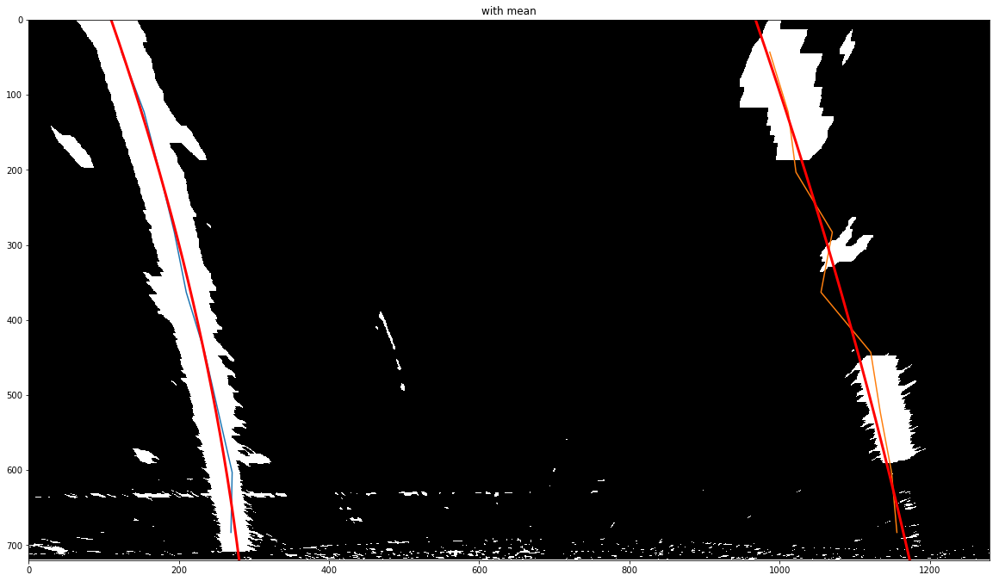

with median
length 9
point -  0
column l [[ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]]
column r [[ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]]
data [[ 291.5]
 [ 290.5]
 [ 288.5]
 [ 284.5]
 [ 289.5]
 [ 289.5]
 [ 292.5]
 [ 289.5]
 [ 282.5]
 [ 275.5]
 [ 272.5]
 [ 270.5]
 [ 268.5]
 [ 269.5]
 [ 265.5]]
minus median [[  7.]
 [  6.]
 [  4.]
 [  0.]
 [  5.]
 [  5.]
 [  8.]
 [  5.]
 [  2.]
 [  9.]
 [ 12.]
 [ 14.]
 [ 16.]
 [ 15.]
 [ 19.]]
median/mdev 7.0
s - d/mdev [[ 1.        ]
 [ 0.85714286]
 [ 0.57142857]
 [ 0.        ]
 [ 0.71428571]
 [ 0.71428571]
 

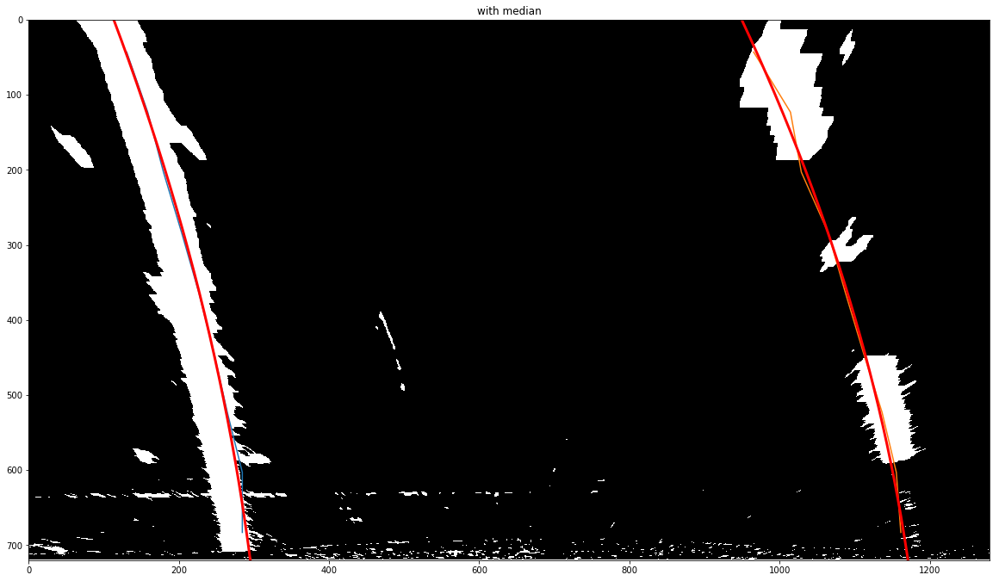

with weighted
median with average
length 9
point -  0
column l [[ 291.5  683. ]
 [ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]]
column r [[ 1184.5   683. ]
 [ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]]
data [[ 291.5]
 [ 290.5]
 [ 288.5]
 [ 284.5]
 [ 289.5]
 [ 289.5]
 [ 292.5]
 [ 289.5]
 [ 282.5]
 [ 275.5]
 [ 272.5]
 [ 270.5]
 [ 268.5]
 [ 269.5]
 [ 265.5]]
minus median [[  7.]
 [  6.]
 [  4.]
 [  0.]
 [  5.]
 [  5.]
 [  8.]
 [  5.]
 [  2.]
 [  9.]
 [ 12.]
 [ 14.]
 [ 16.]
 [ 15.]
 [ 19.]]
median/mdev 7.0
s - d/mdev [[ 1.        ]
 [ 0.85714286]
 [ 0.57142857]
 [ 0.        ]
 [ 0.7142

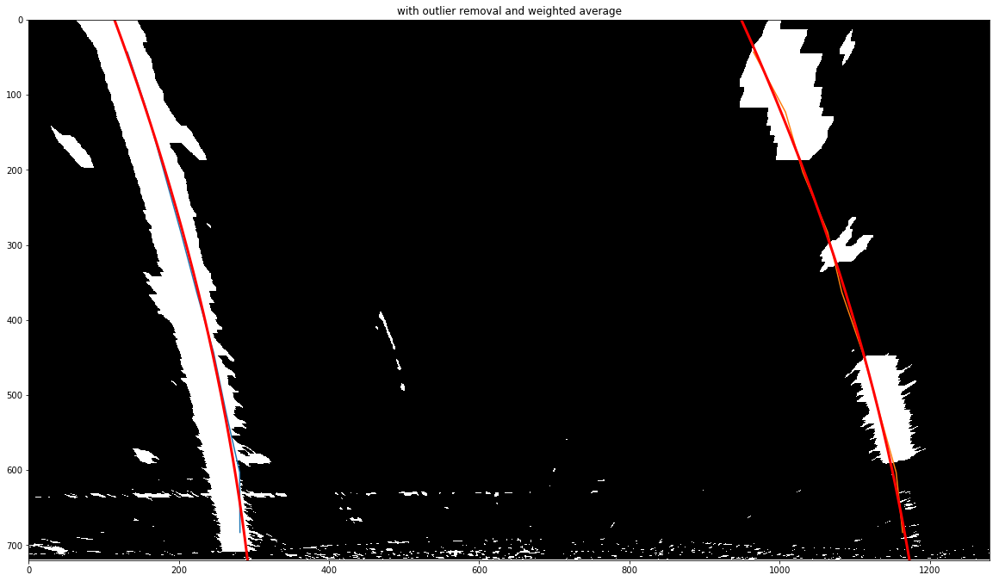

281.366666667 1163.85714286 -0.435366666667
1060.37876282 m 2046.65040617 m
1060.37876282 2046.65040617
Left curve radius 1060.38 m
Right curve radius 2046.65 m
Car position -0.4354 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


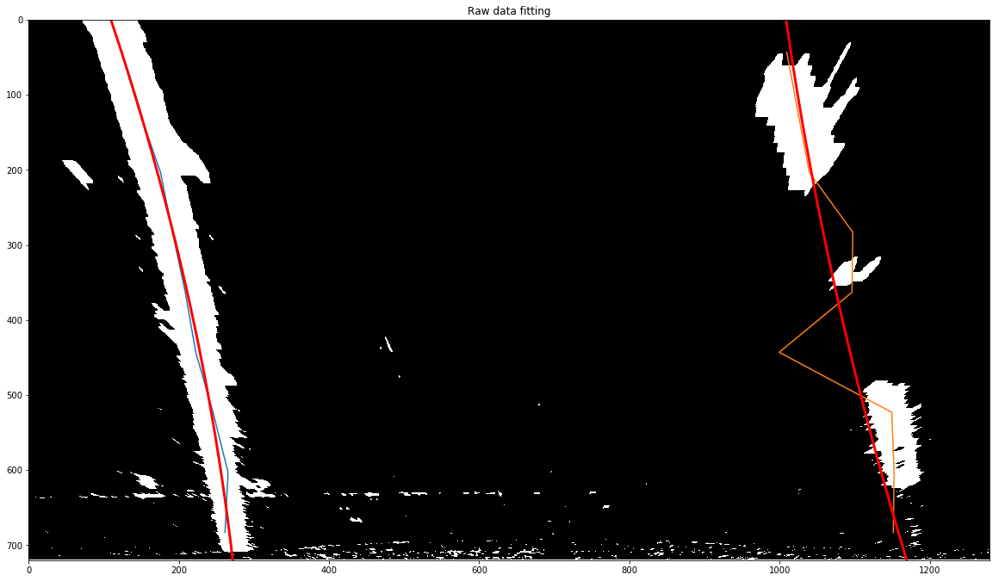

deque([[(290.5, 683), (289.5, 603), (269.5, 523), (249.5, 443), (234.5, 363), (213.5, 283), (191.5, 203), (165.5, 123), (129.5, 43)], [(288.5, 683), (288.5, 603), (271.5, 523), (246.5, 443), (234.5, 363), (212.5, 283), (189.5, 203), (158.5, 123), (129.5, 43)], [(284.5, 683), (284.5, 603), (267.5, 523), (250.5, 443), (236.5, 363), (209.5, 283), (180.5, 203), (159.5, 123), (135.5, 43)], [(289.5, 683), (289.5, 603), (272.5, 523), (255.5, 443), (235.5, 363), (216.5, 283), (183.5, 203), (159.5, 123), (138.5, 43)], [(289.5, 683), (290.5, 603), (263.5, 523), (255.5, 443), (233.5, 363), (209.5, 283), (185.5, 203), (163.5, 123), (138.5, 43)], [(292.5, 683), (290.5, 603), (270.5, 523), (254.5, 443), (232.5, 363), (204.5, 283), (184.5, 203), (163.5, 123), (140.5, 43)], [(289.5, 683), (288.5, 603), (267.5, 523), (248.5, 443), (226.5, 363), (203.5, 283), (179.5, 203), (159.5, 123), (138.5, 43)], [(282.5, 683), (279.5, 603), (264.5, 523), (246.5, 443), (222.5, 363), (200.5, 283), (177.5, 203), (156.

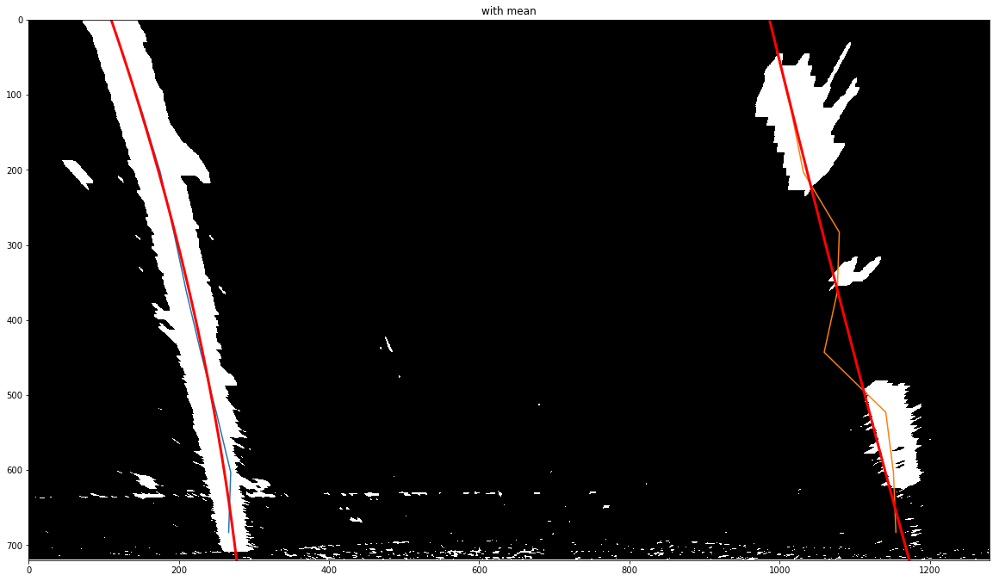

with median
length 9
point -  0
column l [[ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]]
column r [[ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]]
data [[ 290.5]
 [ 288.5]
 [ 284.5]
 [ 289.5]
 [ 289.5]
 [ 292.5]
 [ 289.5]
 [ 282.5]
 [ 275.5]
 [ 272.5]
 [ 270.5]
 [ 268.5]
 [ 269.5]
 [ 265.5]
 [ 261.5]]
minus median [[  8.]
 [  6.]
 [  2.]
 [  7.]
 [  7.]
 [ 10.]
 [  7.]
 [  0.]
 [  7.]
 [ 10.]
 [ 12.]
 [ 14.]
 [ 13.]
 [ 17.]
 [ 21.]]
median/mdev 8.0
s - d/mdev [[ 1.   ]
 [ 0.75 ]
 [ 0.25 ]
 [ 0.875]
 [ 0.875]
 [ 1.25 ]
 [ 0.875]
 [ 0.   ]
 [ 0.875]
 

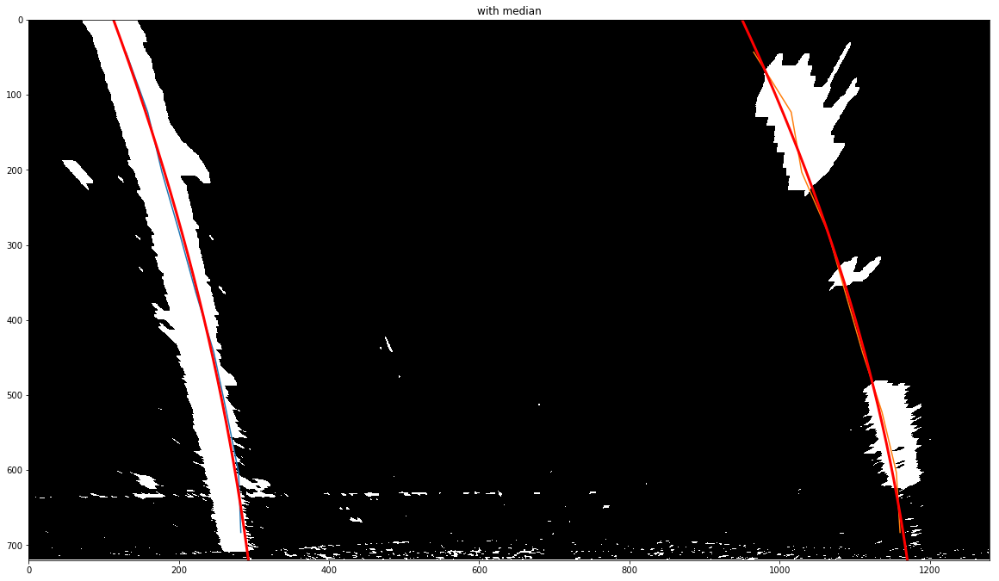

with weighted
median with average
length 9
point -  0
column l [[ 290.5  683. ]
 [ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]]
column r [[ 1153.5   683. ]
 [ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]]
data [[ 290.5]
 [ 288.5]
 [ 284.5]
 [ 289.5]
 [ 289.5]
 [ 292.5]
 [ 289.5]
 [ 282.5]
 [ 275.5]
 [ 272.5]
 [ 270.5]
 [ 268.5]
 [ 269.5]
 [ 265.5]
 [ 261.5]]
minus median [[  8.]
 [  6.]
 [  2.]
 [  7.]
 [  7.]
 [ 10.]
 [  7.]
 [  0.]
 [  7.]
 [ 10.]
 [ 12.]
 [ 14.]
 [ 13.]
 [ 17.]
 [ 21.]]
median/mdev 8.0
s - d/mdev [[ 1.   ]
 [ 0.75 ]
 [ 0.25 ]
 [ 0.875]
 [ 0.875]
 [ 1.25 ]
 [ 0.875]

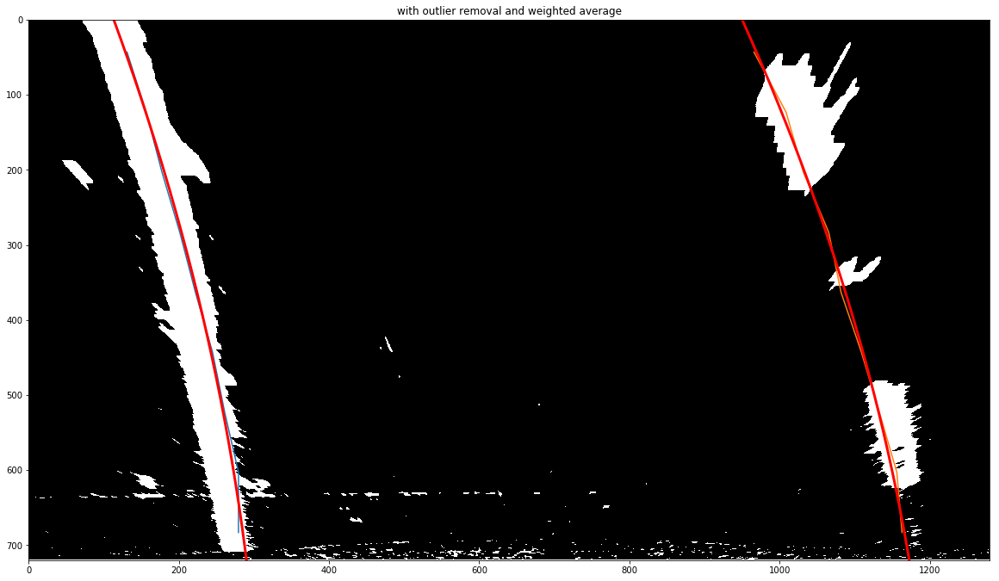

279.366666667 1163.03333333 -0.424795238095
1062.33246291 m 7794.01837484 m
1062.33246291 7794.01837484
Left curve radius 1062.33 m
Right curve radius 7794.02 m
Car position -0.4248 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


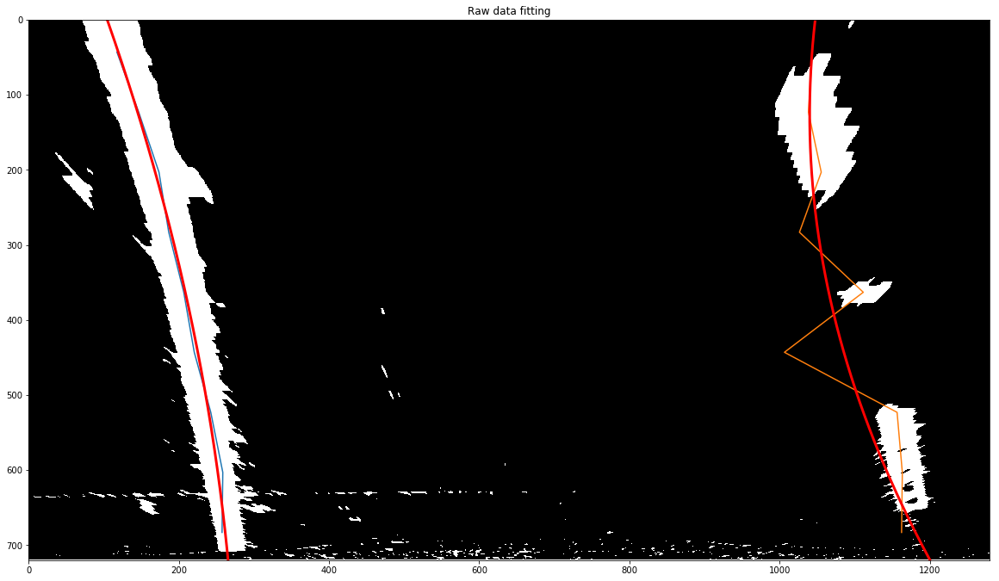

deque([[(288.5, 683), (288.5, 603), (271.5, 523), (246.5, 443), (234.5, 363), (212.5, 283), (189.5, 203), (158.5, 123), (129.5, 43)], [(284.5, 683), (284.5, 603), (267.5, 523), (250.5, 443), (236.5, 363), (209.5, 283), (180.5, 203), (159.5, 123), (135.5, 43)], [(289.5, 683), (289.5, 603), (272.5, 523), (255.5, 443), (235.5, 363), (216.5, 283), (183.5, 203), (159.5, 123), (138.5, 43)], [(289.5, 683), (290.5, 603), (263.5, 523), (255.5, 443), (233.5, 363), (209.5, 283), (185.5, 203), (163.5, 123), (138.5, 43)], [(292.5, 683), (290.5, 603), (270.5, 523), (254.5, 443), (232.5, 363), (204.5, 283), (184.5, 203), (163.5, 123), (140.5, 43)], [(289.5, 683), (288.5, 603), (267.5, 523), (248.5, 443), (226.5, 363), (203.5, 283), (179.5, 203), (159.5, 123), (138.5, 43)], [(282.5, 683), (279.5, 603), (264.5, 523), (246.5, 443), (222.5, 363), (200.5, 283), (177.5, 203), (156.5, 123), (137.5, 43)], [(275.5, 683), (277.5, 603), (256.5, 523), (246.5, 443), (217.5, 363), (194.5, 283), (176.5, 203), (154.

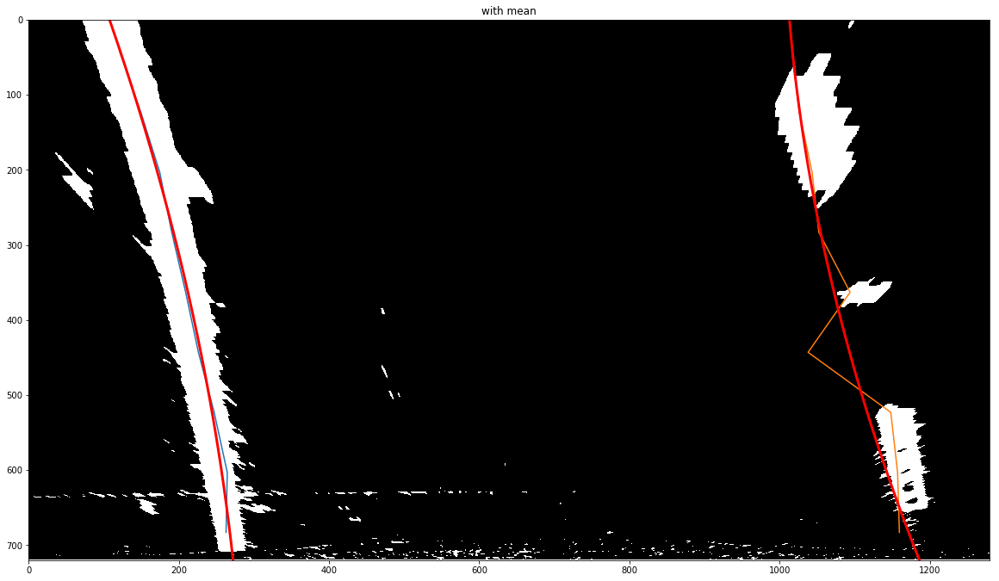

with median
length 9
point -  0
column l [[ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]]
column r [[ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]]
data [[ 288.5]
 [ 284.5]
 [ 289.5]
 [ 289.5]
 [ 292.5]
 [ 289.5]
 [ 282.5]
 [ 275.5]
 [ 272.5]
 [ 270.5]
 [ 268.5]
 [ 269.5]
 [ 265.5]
 [ 261.5]
 [ 257.5]]
minus median [[ 13.]
 [  9.]
 [ 14.]
 [ 14.]
 [ 17.]
 [ 14.]
 [  7.]
 [  0.]
 [  3.]
 [  5.]
 [  7.]
 [  6.]
 [ 10.]
 [ 14.]
 [ 18.]]
median/mdev 10.0
s - d/mdev [[ 1.3]
 [ 0.9]
 [ 1.4]
 [ 1.4]
 [ 1.7]
 [ 1.4]
 [ 0.7]
 [ 0. ]
 [ 0.3]
 [ 0.5]
 [ 0.7]
 [

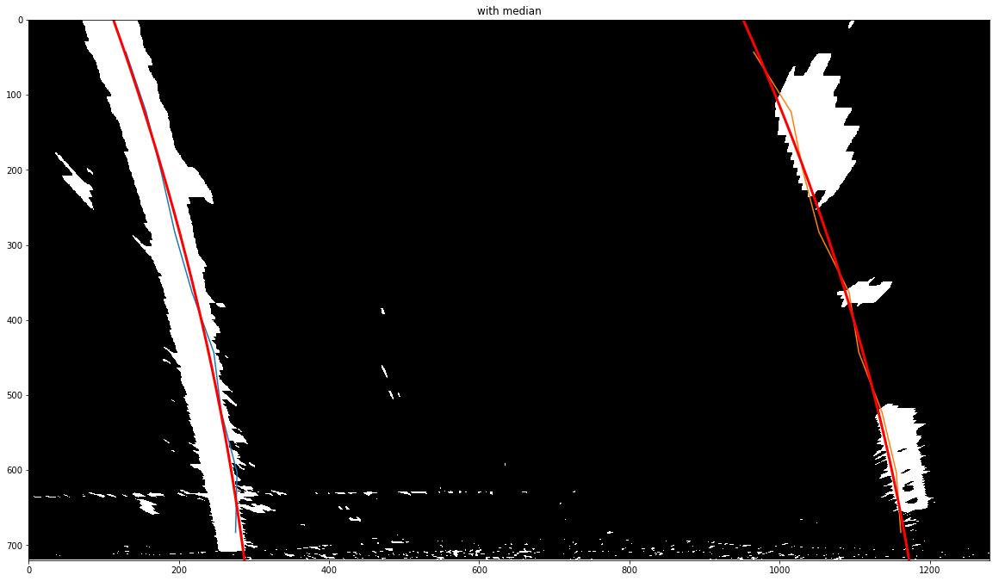

with weighted
median with average
length 9
point -  0
column l [[ 288.5  683. ]
 [ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]]
column r [[ 1161.5   683. ]
 [ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]]
data [[ 288.5]
 [ 284.5]
 [ 289.5]
 [ 289.5]
 [ 292.5]
 [ 289.5]
 [ 282.5]
 [ 275.5]
 [ 272.5]
 [ 270.5]
 [ 268.5]
 [ 269.5]
 [ 265.5]
 [ 261.5]
 [ 257.5]]
minus median [[ 13.]
 [  9.]
 [ 14.]
 [ 14.]
 [ 17.]
 [ 14.]
 [  7.]
 [  0.]
 [  3.]
 [  5.]
 [  7.]
 [  6.]
 [ 10.]
 [ 14.]
 [ 18.]]
median/mdev 10.0
s - d/mdev [[ 1.3]
 [ 0.9]
 [ 1.4]
 [ 1.4]
 [ 1.7]
 [ 1.4]
 [ 0.7]
 [ 0. ]
 [ 0

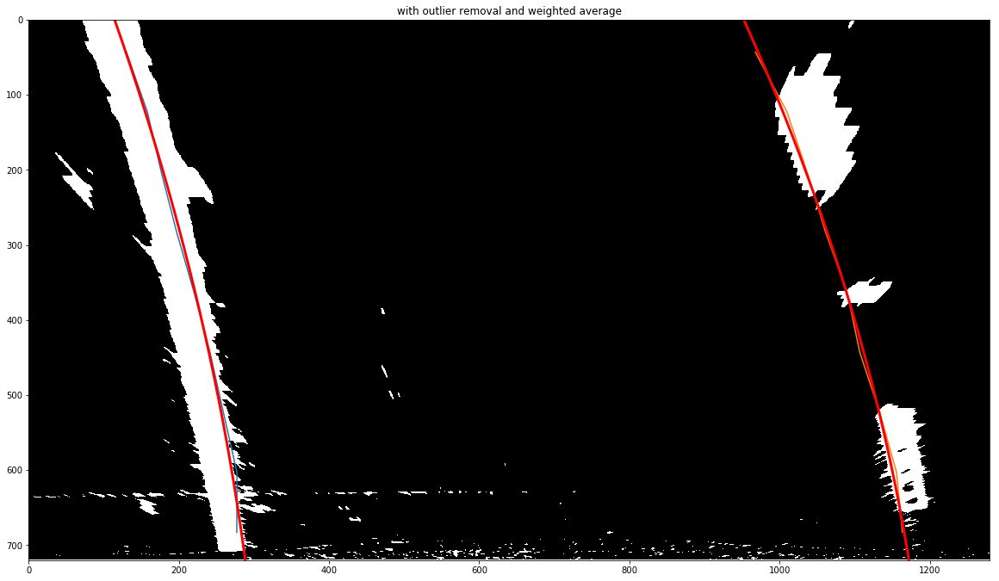

277.166666667 1163.63333333 -0.423738095238
992.615631114 m 765.653407374 m
992.615631114 765.653407374
Left curve radius 992.62 m
Right curve radius 765.65 m
Car position -0.4237 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


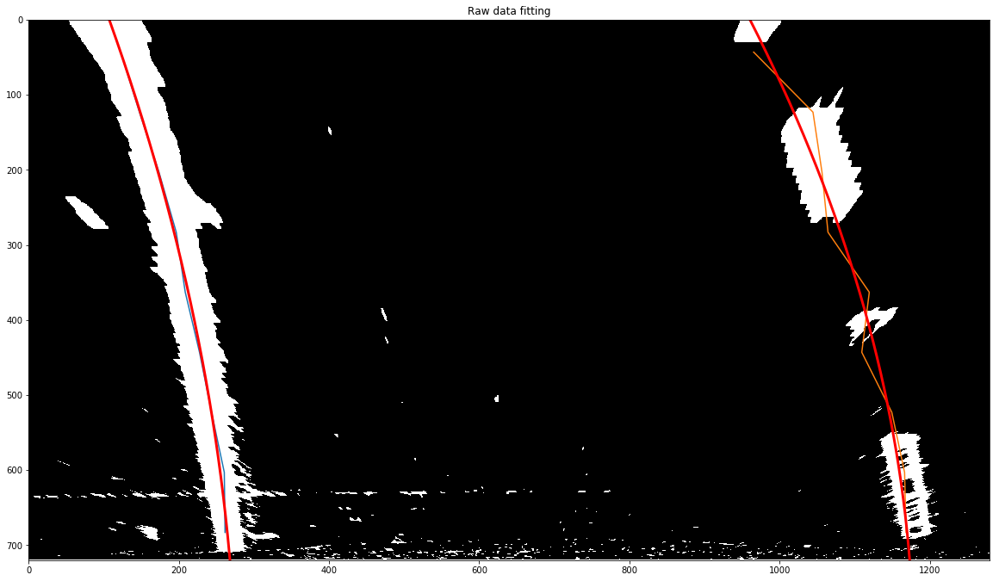

deque([[(284.5, 683), (284.5, 603), (267.5, 523), (250.5, 443), (236.5, 363), (209.5, 283), (180.5, 203), (159.5, 123), (135.5, 43)], [(289.5, 683), (289.5, 603), (272.5, 523), (255.5, 443), (235.5, 363), (216.5, 283), (183.5, 203), (159.5, 123), (138.5, 43)], [(289.5, 683), (290.5, 603), (263.5, 523), (255.5, 443), (233.5, 363), (209.5, 283), (185.5, 203), (163.5, 123), (138.5, 43)], [(292.5, 683), (290.5, 603), (270.5, 523), (254.5, 443), (232.5, 363), (204.5, 283), (184.5, 203), (163.5, 123), (140.5, 43)], [(289.5, 683), (288.5, 603), (267.5, 523), (248.5, 443), (226.5, 363), (203.5, 283), (179.5, 203), (159.5, 123), (138.5, 43)], [(282.5, 683), (279.5, 603), (264.5, 523), (246.5, 443), (222.5, 363), (200.5, 283), (177.5, 203), (156.5, 123), (137.5, 43)], [(275.5, 683), (277.5, 603), (256.5, 523), (246.5, 443), (217.5, 363), (194.5, 283), (176.5, 203), (154.5, 123), (135.5, 43)], [(272.5, 683), (267.5, 603), (255.5, 523), (241.5, 443), (213.5, 363), (192.5, 283), (173.5, 203), (147.

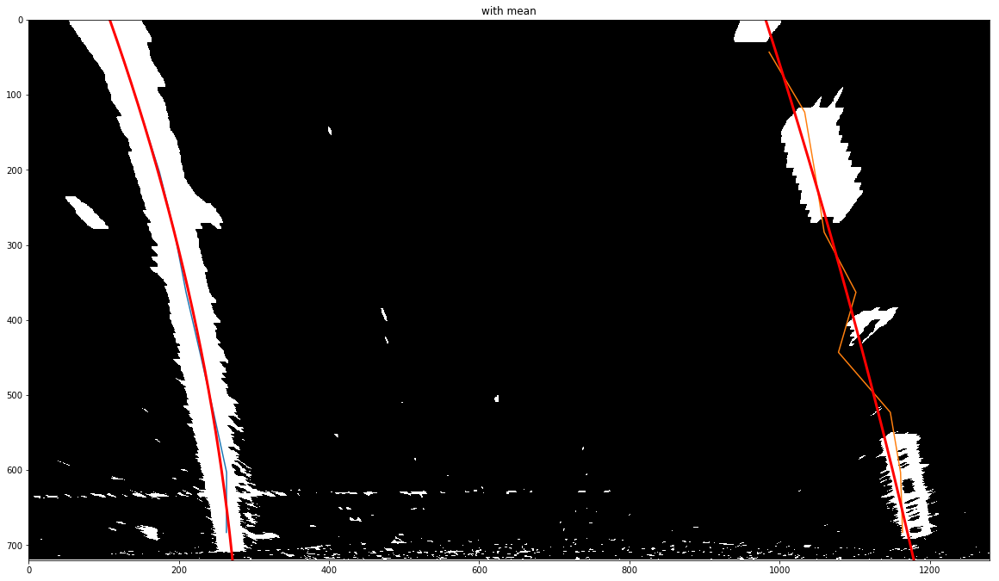

with median
length 9
point -  0
column l [[ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]]
column r [[ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]]
data [[ 284.5]
 [ 289.5]
 [ 289.5]
 [ 292.5]
 [ 289.5]
 [ 282.5]
 [ 275.5]
 [ 272.5]
 [ 270.5]
 [ 268.5]
 [ 269.5]
 [ 265.5]
 [ 261.5]
 [ 257.5]
 [ 261.5]]
minus median [[ 12.]
 [ 17.]
 [ 17.]
 [ 20.]
 [ 17.]
 [ 10.]
 [  3.]
 [  0.]
 [  2.]
 [  4.]
 [  3.]
 [  7.]
 [ 11.]
 [ 15.]
 [ 11.]]
median/mdev 11.0
s - d/mdev [[ 1.09090909]
 [ 1.54545455]
 [ 1.54545455]
 [ 1.81818182]
 [ 1.54545455]
 [ 0.90909091]


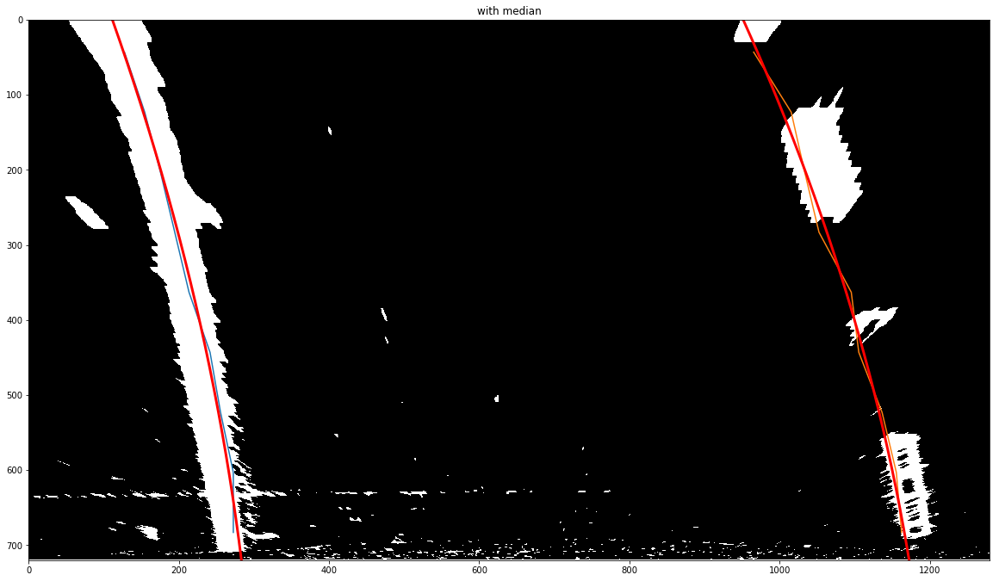

with weighted
median with average
length 9
point -  0
column l [[ 284.5  683. ]
 [ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]]
column r [[ 1160.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]]
data [[ 284.5]
 [ 289.5]
 [ 289.5]
 [ 292.5]
 [ 289.5]
 [ 282.5]
 [ 275.5]
 [ 272.5]
 [ 270.5]
 [ 268.5]
 [ 269.5]
 [ 265.5]
 [ 261.5]
 [ 257.5]
 [ 261.5]]
minus median [[ 12.]
 [ 17.]
 [ 17.]
 [ 20.]
 [ 17.]
 [ 10.]
 [  3.]
 [  0.]
 [  2.]
 [  4.]
 [  3.]
 [  7.]
 [ 11.]
 [ 15.]
 [ 11.]]
median/mdev 11.0
s - d/mdev [[ 1.09090909]
 [ 1.54545455]
 [ 1.54545455]
 [ 1.81818182]
 [ 1.545

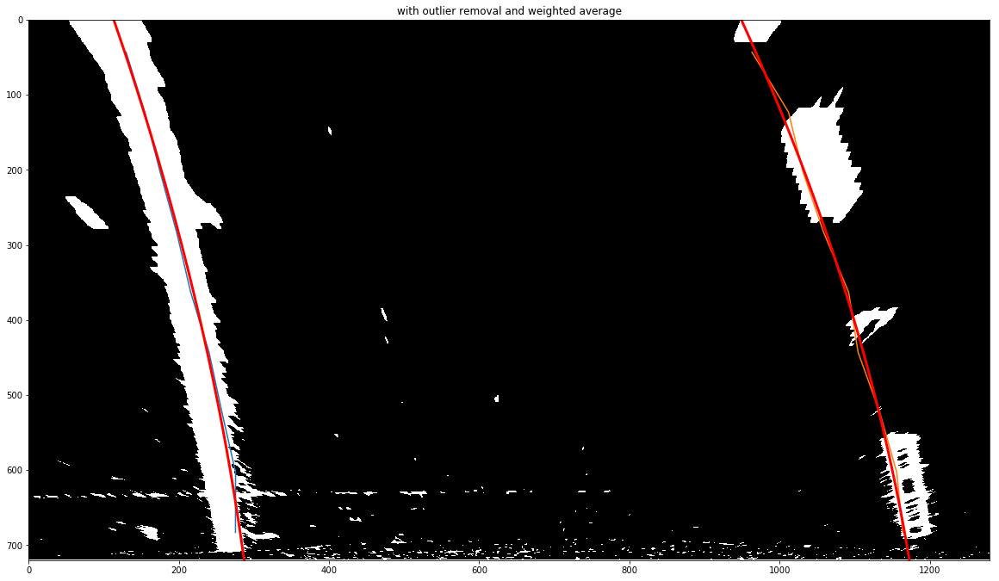

275.366666667 1164.1 -0.41950952381
937.492525486 m 2599.22779764 m
937.492525486 2599.22779764
Left curve radius 937.49 m
Right curve radius 2599.23 m
Car position -0.4195 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


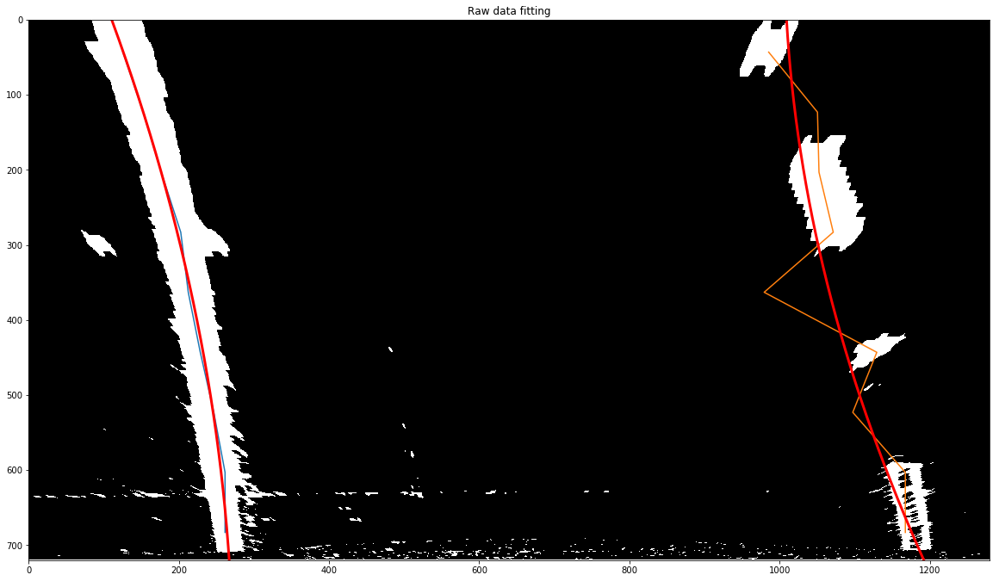

deque([[(289.5, 683), (289.5, 603), (272.5, 523), (255.5, 443), (235.5, 363), (216.5, 283), (183.5, 203), (159.5, 123), (138.5, 43)], [(289.5, 683), (290.5, 603), (263.5, 523), (255.5, 443), (233.5, 363), (209.5, 283), (185.5, 203), (163.5, 123), (138.5, 43)], [(292.5, 683), (290.5, 603), (270.5, 523), (254.5, 443), (232.5, 363), (204.5, 283), (184.5, 203), (163.5, 123), (140.5, 43)], [(289.5, 683), (288.5, 603), (267.5, 523), (248.5, 443), (226.5, 363), (203.5, 283), (179.5, 203), (159.5, 123), (138.5, 43)], [(282.5, 683), (279.5, 603), (264.5, 523), (246.5, 443), (222.5, 363), (200.5, 283), (177.5, 203), (156.5, 123), (137.5, 43)], [(275.5, 683), (277.5, 603), (256.5, 523), (246.5, 443), (217.5, 363), (194.5, 283), (176.5, 203), (154.5, 123), (135.5, 43)], [(272.5, 683), (267.5, 603), (255.5, 523), (241.5, 443), (213.5, 363), (192.5, 283), (173.5, 203), (147.5, 123), (127.5, 43)], [(270.5, 683), (272.5, 603), (255.5, 523), (234.5, 443), (211.5, 363), (188.5, 283), (171.5, 203), (147.

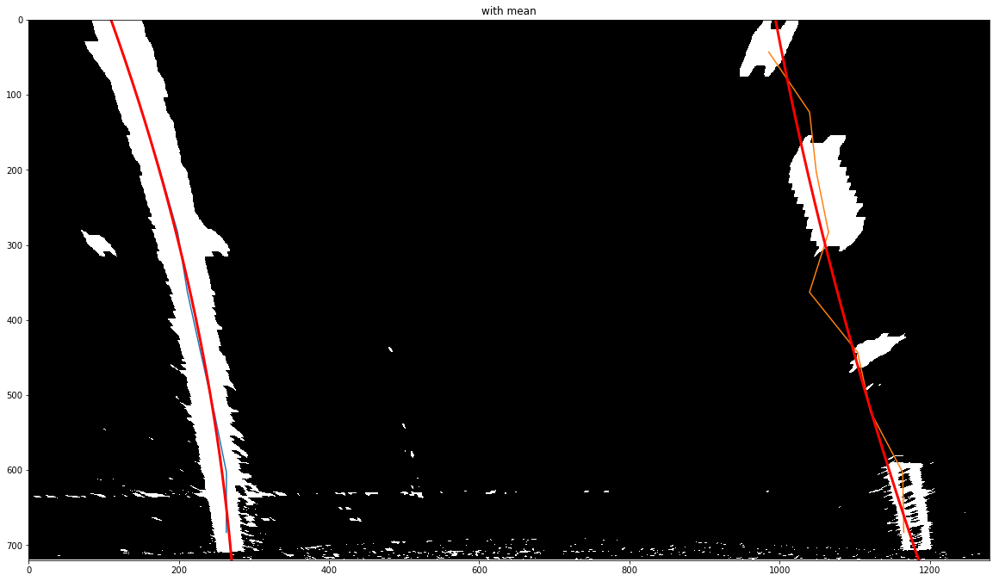

with median
length 9
point -  0
column l [[ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]]
column r [[ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]]
data [[ 289.5]
 [ 289.5]
 [ 292.5]
 [ 289.5]
 [ 282.5]
 [ 275.5]
 [ 272.5]
 [ 270.5]
 [ 268.5]
 [ 269.5]
 [ 265.5]
 [ 261.5]
 [ 257.5]
 [ 261.5]
 [ 261.5]]
minus median [[ 19.]
 [ 19.]
 [ 22.]
 [ 19.]
 [ 12.]
 [  5.]
 [  2.]
 [  0.]
 [  2.]
 [  1.]
 [  5.]
 [  9.]
 [ 13.]
 [  9.]
 [  9.]]
median/mdev 9.0
s - d/mdev [[ 2.11111111]
 [ 2.11111111]
 [ 2.44444444]
 [ 2.11111111]
 [ 1.33333333]
 [ 0.55555556]
 

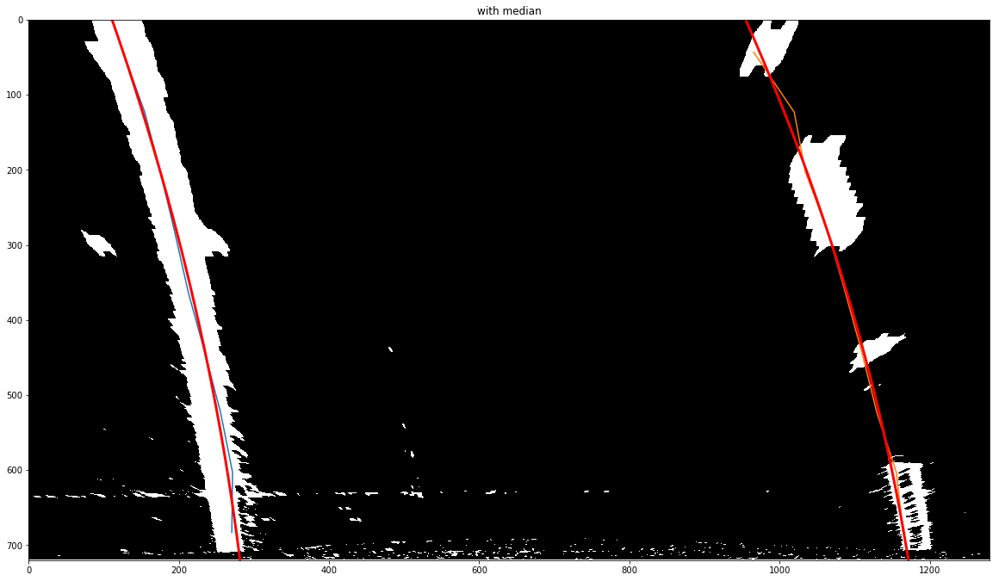

with weighted
median with average
length 9
point -  0
column l [[ 289.5  683. ]
 [ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]]
column r [[ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]]
data [[ 289.5]
 [ 289.5]
 [ 292.5]
 [ 289.5]
 [ 282.5]
 [ 275.5]
 [ 272.5]
 [ 270.5]
 [ 268.5]
 [ 269.5]
 [ 265.5]
 [ 261.5]
 [ 257.5]
 [ 261.5]
 [ 261.5]]
minus median [[ 19.]
 [ 19.]
 [ 22.]
 [ 19.]
 [ 12.]
 [  5.]
 [  2.]
 [  0.]
 [  2.]
 [  1.]
 [  5.]
 [  9.]
 [ 13.]
 [  9.]
 [  9.]]
median/mdev 9.0
s - d/mdev [[ 2.11111111]
 [ 2.11111111]
 [ 2.44444444]
 [ 2.11111111]
 [ 1.3333

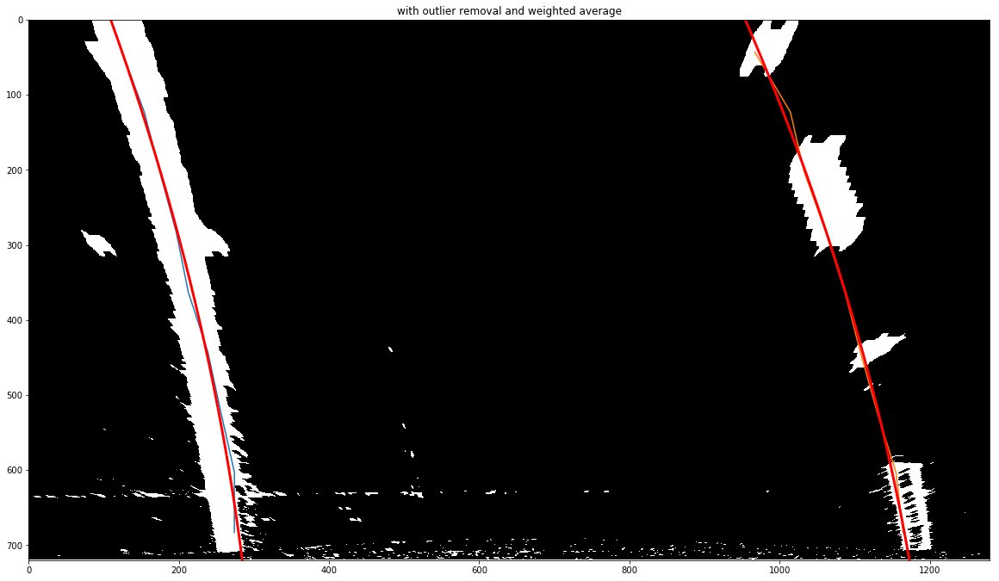

273.833333333 1164.56666667 -0.41669047619
868.727139485 m 1564.00472761 m
868.727139485 1564.00472761
Left curve radius 868.73 m
Right curve radius 1564.00 m
Car position -0.4167 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


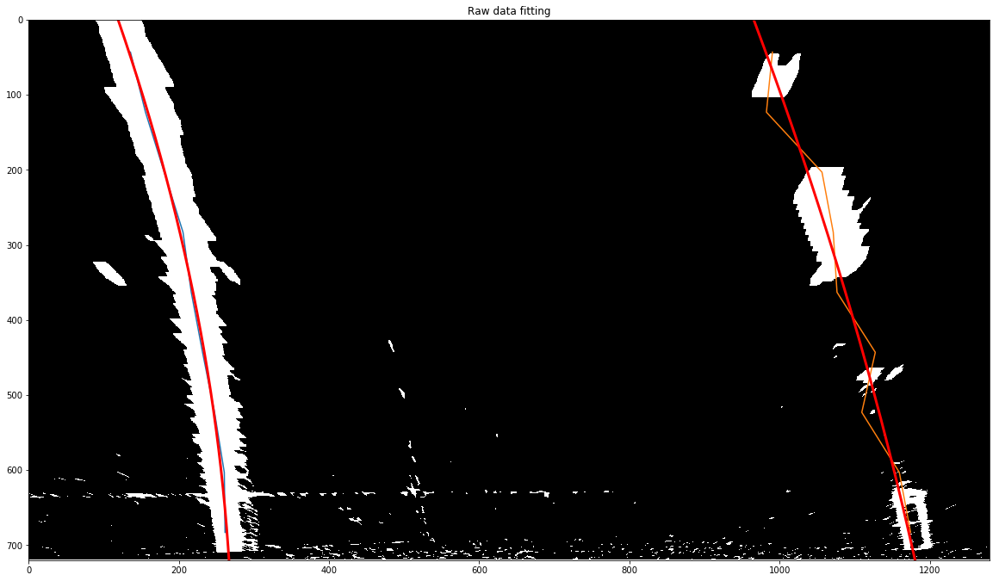

deque([[(289.5, 683), (290.5, 603), (263.5, 523), (255.5, 443), (233.5, 363), (209.5, 283), (185.5, 203), (163.5, 123), (138.5, 43)], [(292.5, 683), (290.5, 603), (270.5, 523), (254.5, 443), (232.5, 363), (204.5, 283), (184.5, 203), (163.5, 123), (140.5, 43)], [(289.5, 683), (288.5, 603), (267.5, 523), (248.5, 443), (226.5, 363), (203.5, 283), (179.5, 203), (159.5, 123), (138.5, 43)], [(282.5, 683), (279.5, 603), (264.5, 523), (246.5, 443), (222.5, 363), (200.5, 283), (177.5, 203), (156.5, 123), (137.5, 43)], [(275.5, 683), (277.5, 603), (256.5, 523), (246.5, 443), (217.5, 363), (194.5, 283), (176.5, 203), (154.5, 123), (135.5, 43)], [(272.5, 683), (267.5, 603), (255.5, 523), (241.5, 443), (213.5, 363), (192.5, 283), (173.5, 203), (147.5, 123), (127.5, 43)], [(270.5, 683), (272.5, 603), (255.5, 523), (234.5, 443), (211.5, 363), (188.5, 283), (171.5, 203), (147.5, 123), (121.5, 43)], [(268.5, 683), (267.5, 603), (253.5, 523), (233.5, 443), (208.5, 363), (194.5, 283), (172.5, 203), (154.

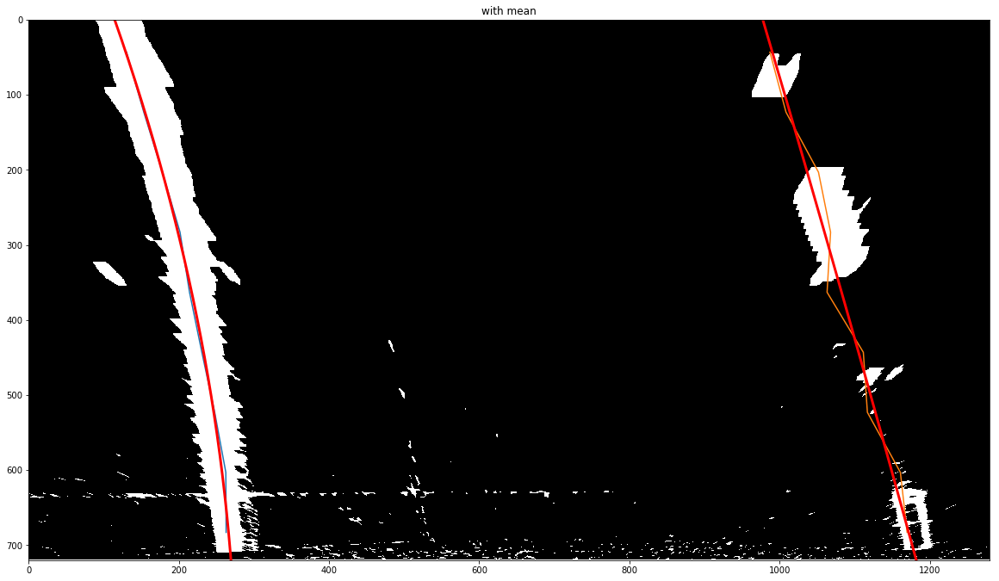

with median
length 9
point -  0
column l [[ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]]
column r [[ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]]
data [[ 289.5]
 [ 292.5]
 [ 289.5]
 [ 282.5]
 [ 275.5]
 [ 272.5]
 [ 270.5]
 [ 268.5]
 [ 269.5]
 [ 265.5]
 [ 261.5]
 [ 257.5]
 [ 261.5]
 [ 261.5]
 [ 261.5]]
minus median [[ 20.]
 [ 23.]
 [ 20.]
 [ 13.]
 [  6.]
 [  3.]
 [  1.]
 [  1.]
 [  0.]
 [  4.]
 [  8.]
 [ 12.]
 [  8.]
 [  8.]
 [  8.]]
median/mdev 8.0
s - d/mdev [[ 2.5  ]
 [ 2.875]
 [ 2.5  ]
 [ 1.625]
 [ 0.75 ]
 [ 0.375]
 [ 0.125]
 [ 0.125]
 [ 0.   ]
 

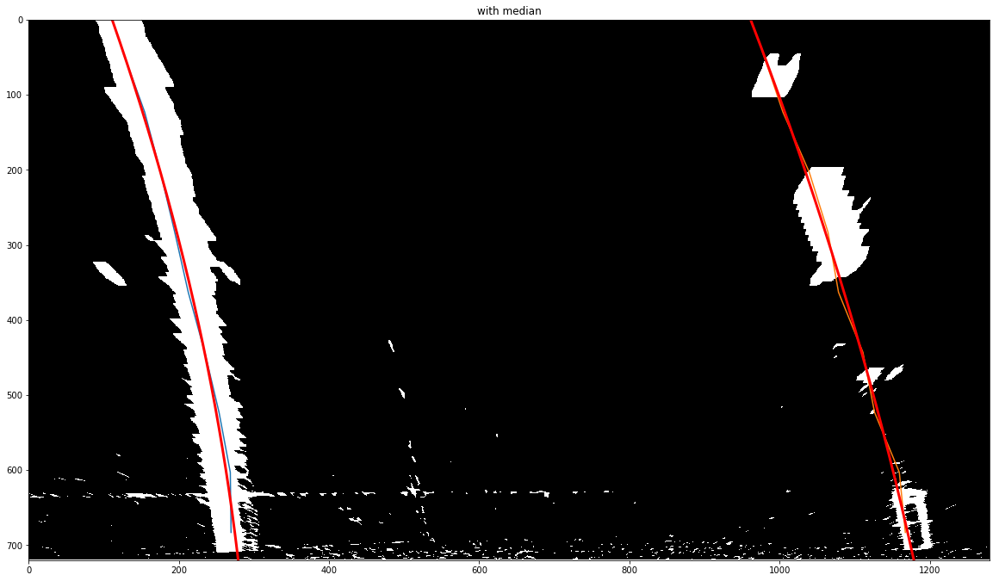

with weighted
median with average
length 9
point -  0
column l [[ 289.5  683. ]
 [ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]]
column r [[ 1164.5   683. ]
 [ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]]
data [[ 289.5]
 [ 292.5]
 [ 289.5]
 [ 282.5]
 [ 275.5]
 [ 272.5]
 [ 270.5]
 [ 268.5]
 [ 269.5]
 [ 265.5]
 [ 261.5]
 [ 257.5]
 [ 261.5]
 [ 261.5]
 [ 261.5]]
minus median [[ 20.]
 [ 23.]
 [ 20.]
 [ 13.]
 [  6.]
 [  3.]
 [  1.]
 [  1.]
 [  0.]
 [  4.]
 [  8.]
 [ 12.]
 [  8.]
 [  8.]
 [  8.]]
median/mdev 8.0
s - d/mdev [[ 2.5  ]
 [ 2.875]
 [ 2.5  ]
 [ 1.625]
 [ 0.75 ]
 [ 0.375]
 [ 0.125]

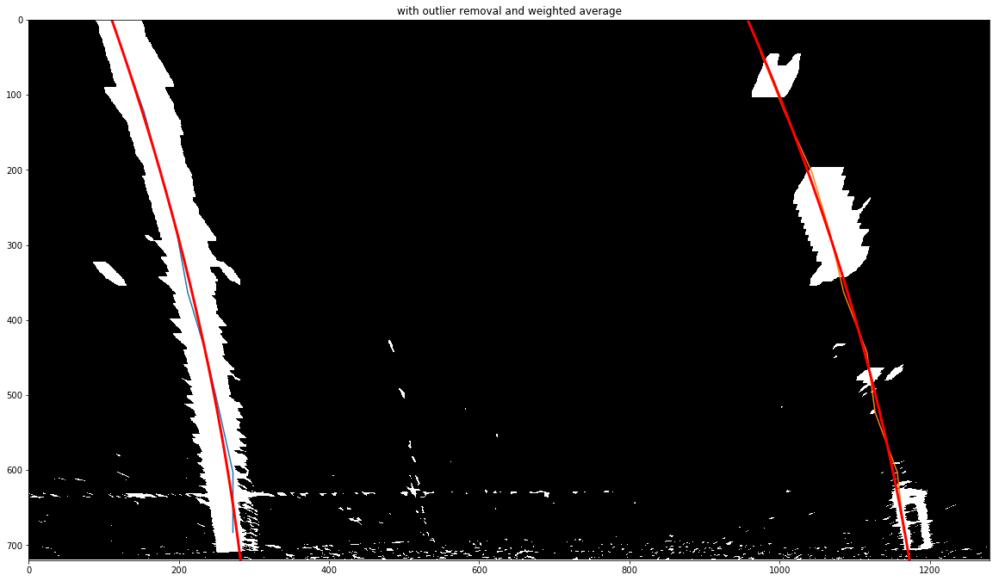

271.966666667 1165.56666667 -0.41210952381
869.640804816 m 11531.6616573 m
869.640804816 11531.6616573
Left curve radius 869.64 m
Right curve radius 11531.66 m
Car position -0.4121 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


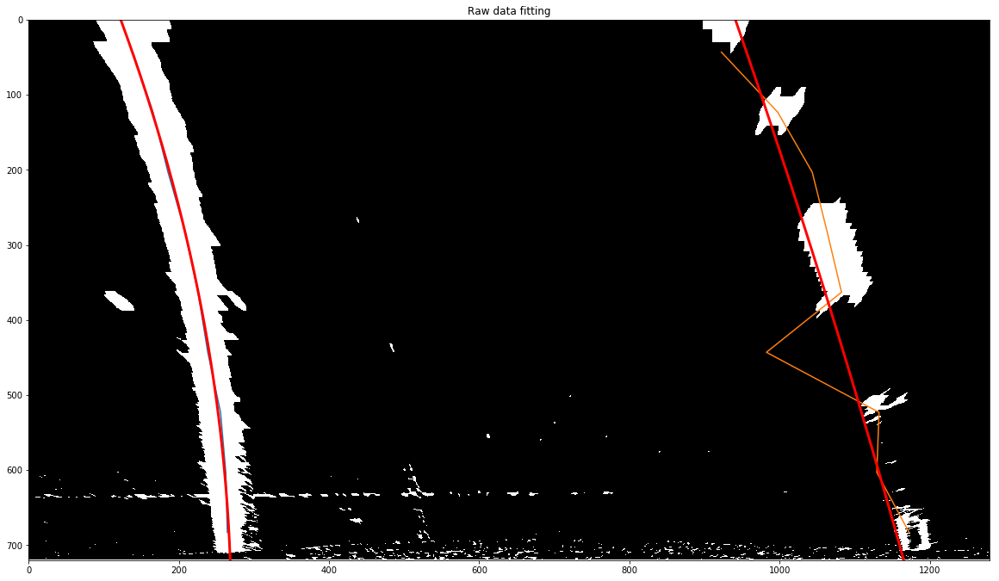

deque([[(292.5, 683), (290.5, 603), (270.5, 523), (254.5, 443), (232.5, 363), (204.5, 283), (184.5, 203), (163.5, 123), (140.5, 43)], [(289.5, 683), (288.5, 603), (267.5, 523), (248.5, 443), (226.5, 363), (203.5, 283), (179.5, 203), (159.5, 123), (138.5, 43)], [(282.5, 683), (279.5, 603), (264.5, 523), (246.5, 443), (222.5, 363), (200.5, 283), (177.5, 203), (156.5, 123), (137.5, 43)], [(275.5, 683), (277.5, 603), (256.5, 523), (246.5, 443), (217.5, 363), (194.5, 283), (176.5, 203), (154.5, 123), (135.5, 43)], [(272.5, 683), (267.5, 603), (255.5, 523), (241.5, 443), (213.5, 363), (192.5, 283), (173.5, 203), (147.5, 123), (127.5, 43)], [(270.5, 683), (272.5, 603), (255.5, 523), (234.5, 443), (211.5, 363), (188.5, 283), (171.5, 203), (147.5, 123), (121.5, 43)], [(268.5, 683), (267.5, 603), (253.5, 523), (233.5, 443), (208.5, 363), (194.5, 283), (172.5, 203), (154.5, 123), (125.5, 43)], [(269.5, 683), (271.5, 603), (253.5, 523), (234.5, 443), (209.5, 363), (194.5, 283), (173.5, 203), (158.

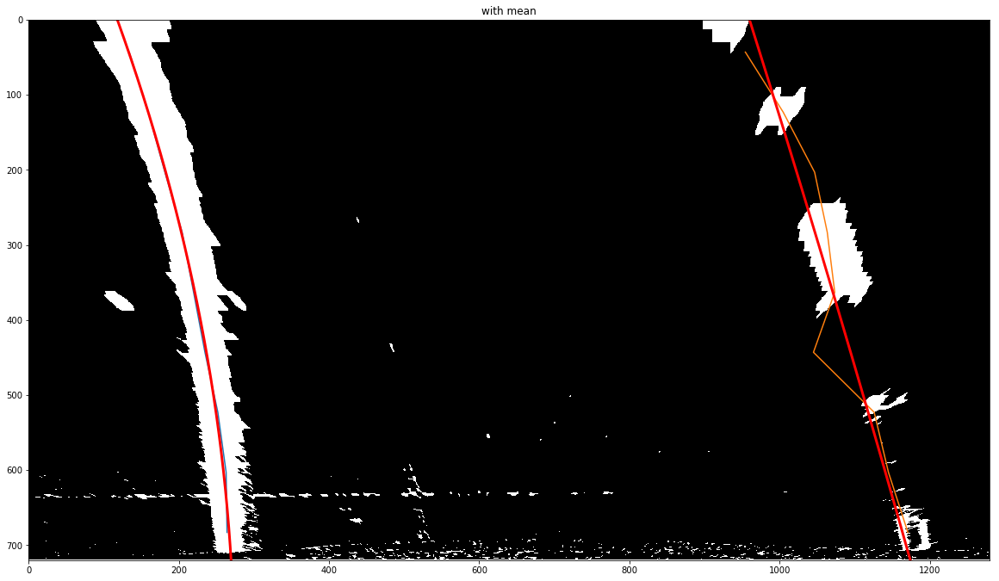

with median
length 9
point -  0
column l [[ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]]
column r [[ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]]
data [[ 292.5]
 [ 289.5]
 [ 282.5]
 [ 275.5]
 [ 272.5]
 [ 270.5]
 [ 268.5]
 [ 269.5]
 [ 265.5]
 [ 261.5]
 [ 257.5]
 [ 261.5]
 [ 261.5]
 [ 261.5]
 [ 264.5]]
minus median [[ 24.]
 [ 21.]
 [ 14.]
 [  7.]
 [  4.]
 [  2.]
 [  0.]
 [  1.]
 [  3.]
 [  7.]
 [ 11.]
 [  7.]
 [  7.]
 [  7.]
 [  4.]]
median/mdev 7.0
s - d/mdev [[ 3.42857143]
 [ 3.        ]
 [ 2.        ]
 [ 1.        ]
 [ 0.57142857]
 [ 0.28571429]
 

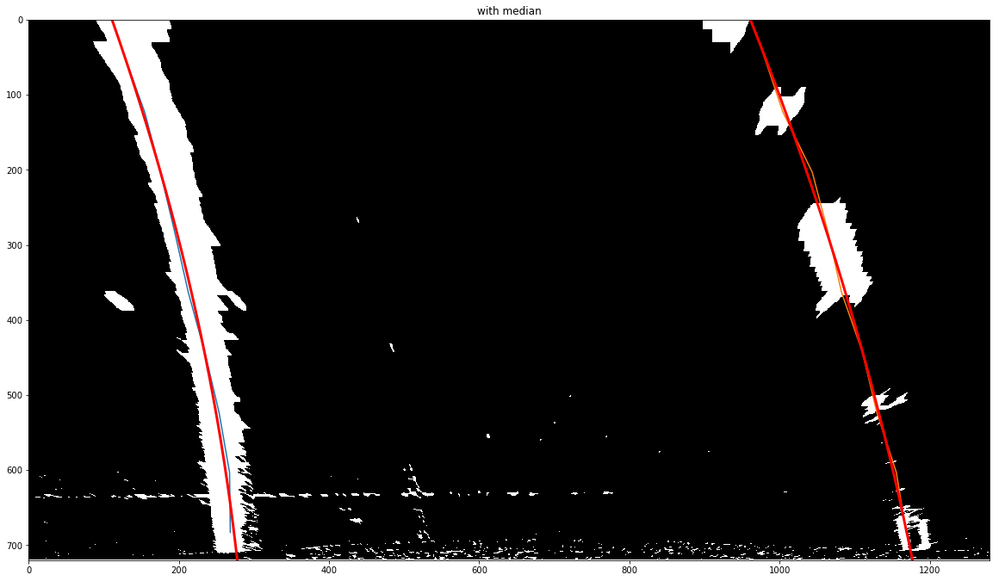

with weighted
median with average
length 9
point -  0
column l [[ 292.5  683. ]
 [ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]]
column r [[ 1168.5   683. ]
 [ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]]
data [[ 292.5]
 [ 289.5]
 [ 282.5]
 [ 275.5]
 [ 272.5]
 [ 270.5]
 [ 268.5]
 [ 269.5]
 [ 265.5]
 [ 261.5]
 [ 257.5]
 [ 261.5]
 [ 261.5]
 [ 261.5]
 [ 264.5]]
minus median [[ 24.]
 [ 21.]
 [ 14.]
 [  7.]
 [  4.]
 [  2.]
 [  0.]
 [  1.]
 [  3.]
 [  7.]
 [ 11.]
 [  7.]
 [  7.]
 [  7.]
 [  4.]]
median/mdev 7.0
s - d/mdev [[ 3.42857143]
 [ 3.        ]
 [ 2.        ]
 [ 1.        ]
 [ 0.5714

 [ 2.2]] m 3
data[s<m] [ 163.5  159.5  156.5  154.5  147.5  147.5  154.5  158.5  151.5  147.5
  146.5  147.5  152.5  155.5  165.5] 

data [[  970.5]
 [  986.5]
 [  999.5]
 [ 1019.5]
 [ 1035.5]
 [  977.5]
 [  999.5]
 [ 1004.5]
 [ 1019.5]
 [ 1024.5]
 [ 1038.5]
 [ 1044.5]
 [ 1050.5]
 [  982.5]
 [  997.5]]
minus median [[ 34.]
 [ 18.]
 [  5.]
 [ 15.]
 [ 31.]
 [ 27.]
 [  5.]
 [  0.]
 [ 15.]
 [ 20.]
 [ 34.]
 [ 40.]
 [ 46.]
 [ 22.]
 [  7.]]
median/mdev 20.0
s - d/mdev [[ 1.7 ]
 [ 0.9 ]
 [ 0.25]
 [ 0.75]
 [ 1.55]
 [ 1.35]
 [ 0.25]
 [ 0.  ]
 [ 0.75]
 [ 1.  ]
 [ 1.7 ]
 [ 2.  ]
 [ 2.3 ]
 [ 1.1 ]
 [ 0.35]] m 3
data[s<m] [  970.5   986.5   999.5  1019.5  1035.5   977.5   999.5  1004.5  1019.5
  1024.5  1038.5  1044.5  1050.5   982.5   997.5] 

cleandata shape (15,)
cleandata shape (15,)
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 5, 5, 10, 20, 50]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 5, 5, 10, 20, 50]
flattened [ 163.5  159.5  156.5  154.5  147.5  147.5  154.5  158.5  151.5  147.5
  146.5  147.5  152.5  155.5  165.5]

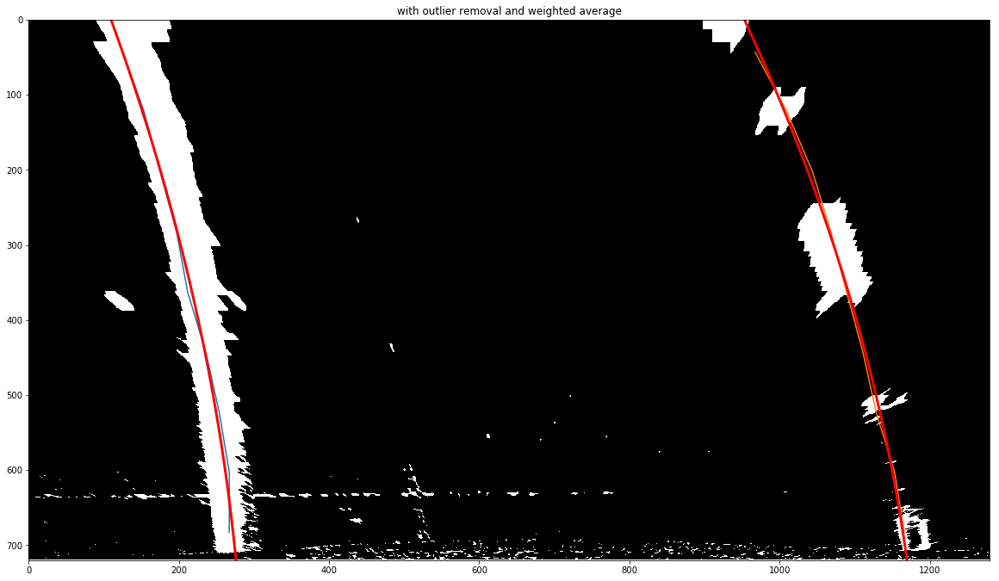

267.115384615 1166.1 -0.402324175824
793.079217692 m 6964.03789434 m
793.079217692 6964.03789434
Left curve radius 793.08 m
Right curve radius 6964.04 m
Car position -0.4023 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


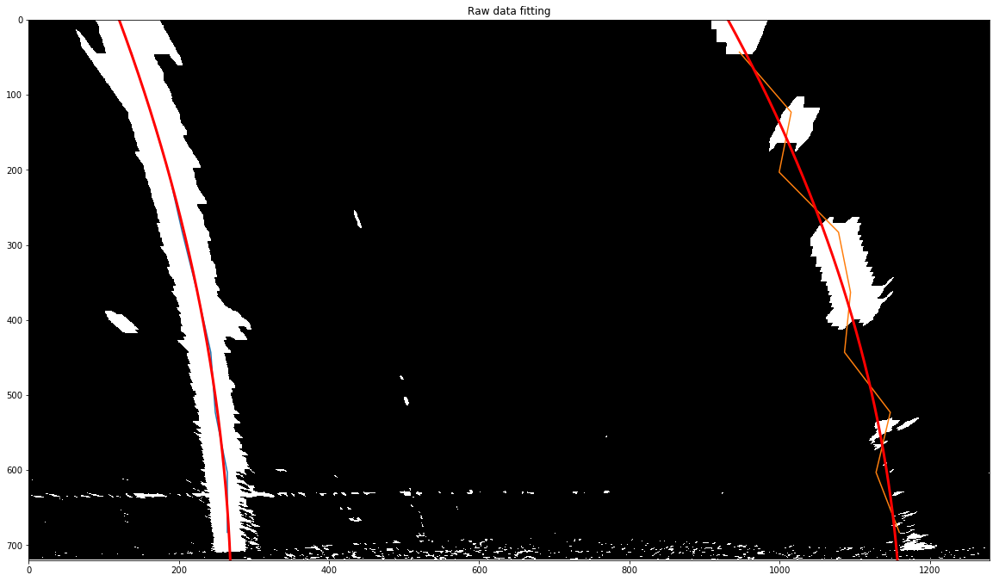

deque([[(289.5, 683), (288.5, 603), (267.5, 523), (248.5, 443), (226.5, 363), (203.5, 283), (179.5, 203), (159.5, 123), (138.5, 43)], [(282.5, 683), (279.5, 603), (264.5, 523), (246.5, 443), (222.5, 363), (200.5, 283), (177.5, 203), (156.5, 123), (137.5, 43)], [(275.5, 683), (277.5, 603), (256.5, 523), (246.5, 443), (217.5, 363), (194.5, 283), (176.5, 203), (154.5, 123), (135.5, 43)], [(272.5, 683), (267.5, 603), (255.5, 523), (241.5, 443), (213.5, 363), (192.5, 283), (173.5, 203), (147.5, 123), (127.5, 43)], [(270.5, 683), (272.5, 603), (255.5, 523), (234.5, 443), (211.5, 363), (188.5, 283), (171.5, 203), (147.5, 123), (121.5, 43)], [(268.5, 683), (267.5, 603), (253.5, 523), (233.5, 443), (208.5, 363), (194.5, 283), (172.5, 203), (154.5, 123), (125.5, 43)], [(269.5, 683), (271.5, 603), (253.5, 523), (234.5, 443), (209.5, 363), (194.5, 283), (173.5, 203), (158.5, 123), (121.5, 43)], [(265.5, 683), (268.5, 603), (248.5, 523), (230.5, 443), (205.5, 363), (191.5, 283), (173.5, 203), (151.

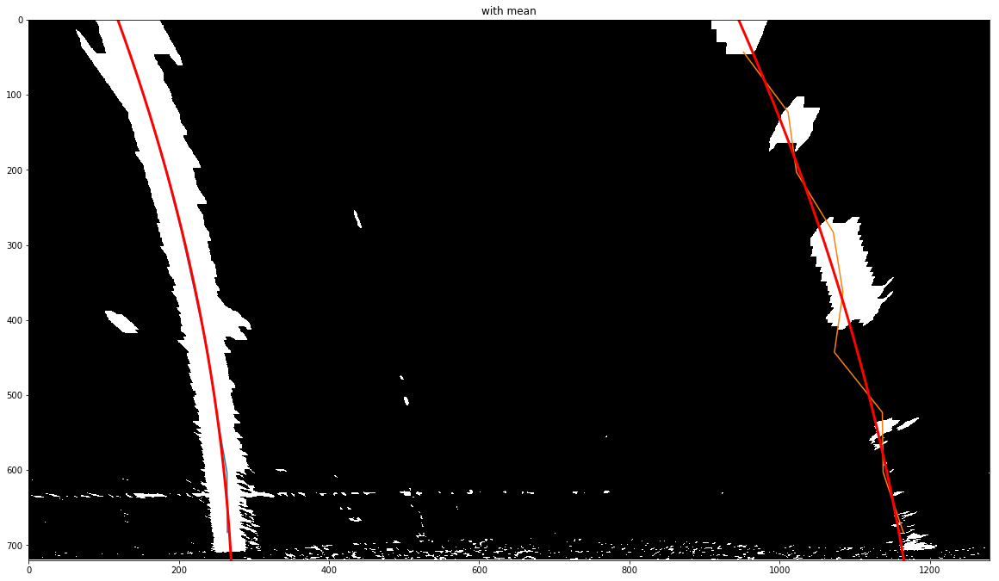

with median
length 9
point -  0
column l [[ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]]
column r [[ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]]
data [[ 289.5]
 [ 282.5]
 [ 275.5]
 [ 272.5]
 [ 270.5]
 [ 268.5]
 [ 269.5]
 [ 265.5]
 [ 261.5]
 [ 257.5]
 [ 261.5]
 [ 261.5]
 [ 261.5]
 [ 264.5]
 [ 264.5]]
minus median [[ 24.]
 [ 17.]
 [ 10.]
 [  7.]
 [  5.]
 [  3.]
 [  4.]
 [  0.]
 [  4.]
 [  8.]
 [  4.]
 [  4.]
 [  4.]
 [  1.]
 [  1.]]
median/mdev 4.0
s - d/mdev [[ 6.  ]
 [ 4.25]
 [ 2.5 ]
 [ 1.75]
 [ 1.25]
 [ 0.75]
 [ 1.  ]
 [ 0.  ]
 [ 1.  ]
 [ 2.  ]
 

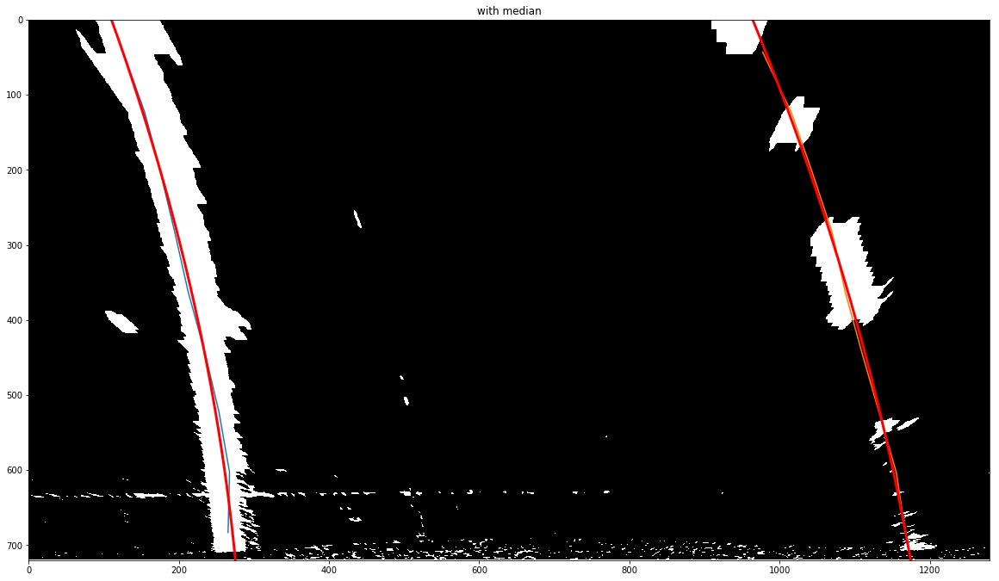

with weighted
median with average
length 9
point -  0
column l [[ 289.5  683. ]
 [ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]]
column r [[ 1176.5   683. ]
 [ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]]
data [[ 289.5]
 [ 282.5]
 [ 275.5]
 [ 272.5]
 [ 270.5]
 [ 268.5]
 [ 269.5]
 [ 265.5]
 [ 261.5]
 [ 257.5]
 [ 261.5]
 [ 261.5]
 [ 261.5]
 [ 264.5]
 [ 264.5]]
minus median [[ 24.]
 [ 17.]
 [ 10.]
 [  7.]
 [  5.]
 [  3.]
 [  4.]
 [  0.]
 [  4.]
 [  8.]
 [  4.]
 [  4.]
 [  4.]
 [  1.]
 [  1.]]
median/mdev 4.0
s - d/mdev [[ 6.  ]
 [ 4.25]
 [ 2.5 ]
 [ 1.75]
 [ 1.25]
 [ 0.75]
 [ 1.  ]
 [ 0. 

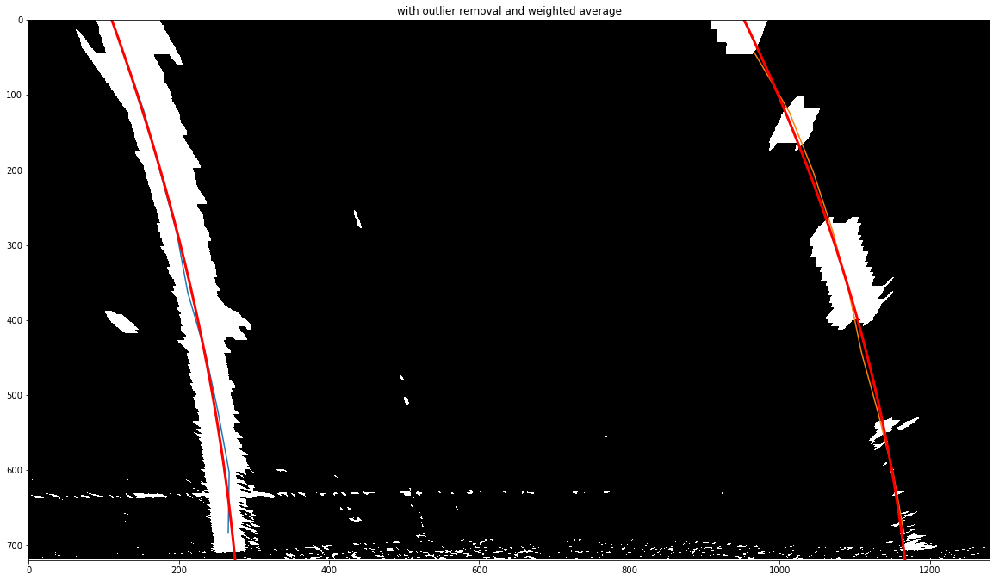

265.730769231 1165.5 -0.395005494505
766.491140916 m 880.230025056 m
766.491140916 880.230025056
Left curve radius 766.49 m
Right curve radius 880.23 m
Car position -0.3950 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


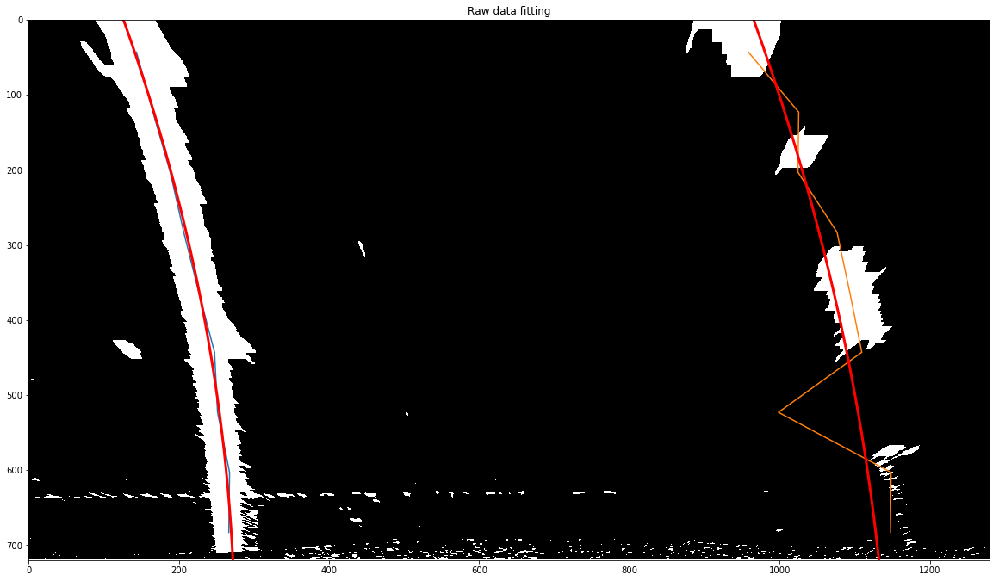

deque([[(282.5, 683), (279.5, 603), (264.5, 523), (246.5, 443), (222.5, 363), (200.5, 283), (177.5, 203), (156.5, 123), (137.5, 43)], [(275.5, 683), (277.5, 603), (256.5, 523), (246.5, 443), (217.5, 363), (194.5, 283), (176.5, 203), (154.5, 123), (135.5, 43)], [(272.5, 683), (267.5, 603), (255.5, 523), (241.5, 443), (213.5, 363), (192.5, 283), (173.5, 203), (147.5, 123), (127.5, 43)], [(270.5, 683), (272.5, 603), (255.5, 523), (234.5, 443), (211.5, 363), (188.5, 283), (171.5, 203), (147.5, 123), (121.5, 43)], [(268.5, 683), (267.5, 603), (253.5, 523), (233.5, 443), (208.5, 363), (194.5, 283), (172.5, 203), (154.5, 123), (125.5, 43)], [(269.5, 683), (271.5, 603), (253.5, 523), (234.5, 443), (209.5, 363), (194.5, 283), (173.5, 203), (158.5, 123), (121.5, 43)], [(265.5, 683), (268.5, 603), (248.5, 523), (230.5, 443), (205.5, 363), (191.5, 283), (173.5, 203), (151.5, 123), (121.5, 43)], [(261.5, 683), (265.5, 603), (245.5, 523), (222.5, 443), (208.5, 363), (191.5, 283), (175.5, 203), (147.

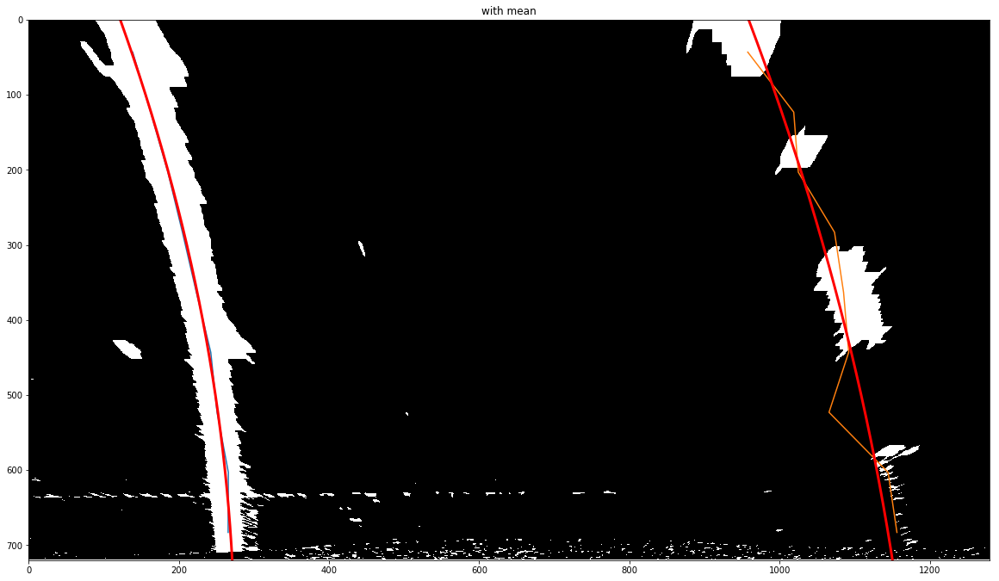

with median
length 9
point -  0
column l [[ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]
 [ 266.5  683. ]]
column r [[ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]
 [ 1147.5   683. ]]
data [[ 282.5]
 [ 275.5]
 [ 272.5]
 [ 270.5]
 [ 268.5]
 [ 269.5]
 [ 265.5]
 [ 261.5]
 [ 257.5]
 [ 261.5]
 [ 261.5]
 [ 261.5]
 [ 264.5]
 [ 264.5]
 [ 266.5]]
minus median [[ 17.]
 [ 10.]
 [  7.]
 [  5.]
 [  3.]
 [  4.]
 [  0.]
 [  4.]
 [  8.]
 [  4.]
 [  4.]
 [  4.]
 [  1.]
 [  1.]
 [  1.]]
median/mdev 4.0
s - d/mdev [[ 4.25]
 [ 2.5 ]
 [ 1.75]
 [ 1.25]
 [ 0.75]
 [ 1.  ]
 [ 0.  ]
 [ 1.  ]
 [ 2.  ]
 [ 1.  ]
 

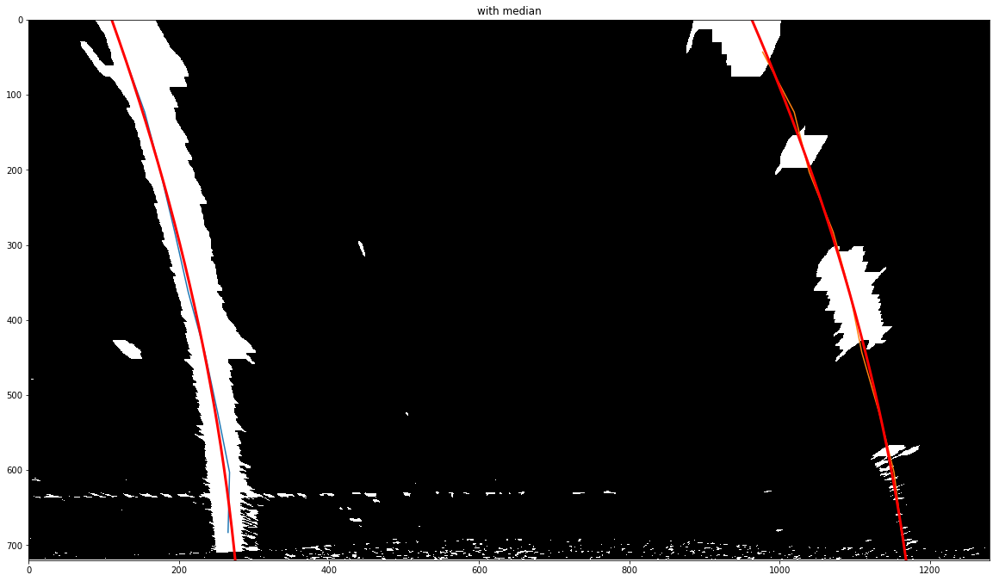

with weighted
median with average
length 9
point -  0
column l [[ 282.5  683. ]
 [ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]
 [ 266.5  683. ]]
column r [[ 1176.5   683. ]
 [ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]
 [ 1147.5   683. ]]
data [[ 282.5]
 [ 275.5]
 [ 272.5]
 [ 270.5]
 [ 268.5]
 [ 269.5]
 [ 265.5]
 [ 261.5]
 [ 257.5]
 [ 261.5]
 [ 261.5]
 [ 261.5]
 [ 264.5]
 [ 264.5]
 [ 266.5]]
minus median [[ 17.]
 [ 10.]
 [  7.]
 [  5.]
 [  3.]
 [  4.]
 [  0.]
 [  4.]
 [  8.]
 [  4.]
 [  4.]
 [  4.]
 [  1.]
 [  1.]
 [  1.]]
median/mdev 4.0
s - d/mdev [[ 4.25]
 [ 2.5 ]
 [ 1.75]
 [ 1.25]
 [ 0.75]
 [ 1.  ]
 [ 0.  ]
 [ 1. 

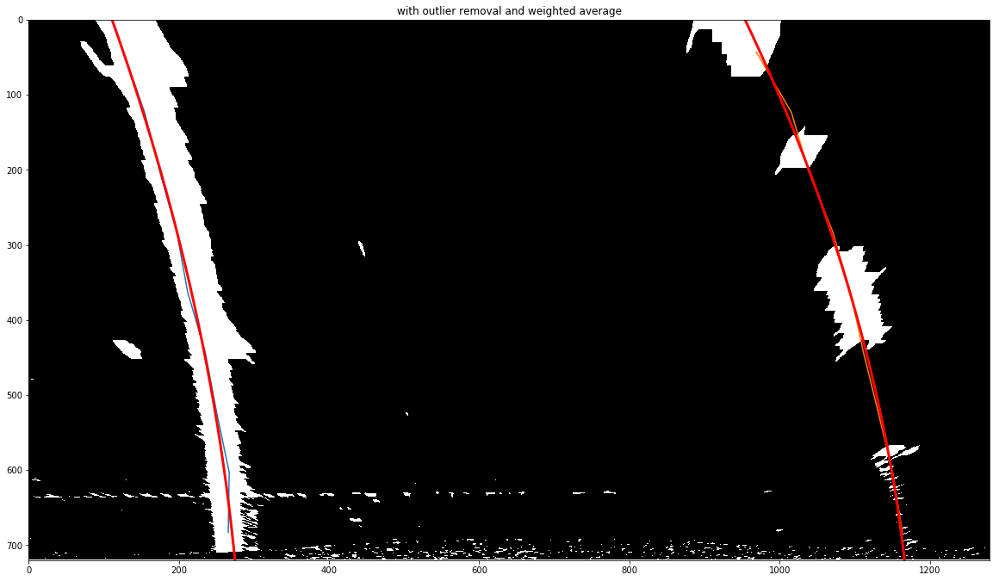

265.785714286 1163.56666667 -0.390010204082
779.715091036 m 1073.30929957 m
779.715091036 1073.30929957
Left curve radius 779.72 m
Right curve radius 1073.31 m
Car position -0.3900 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


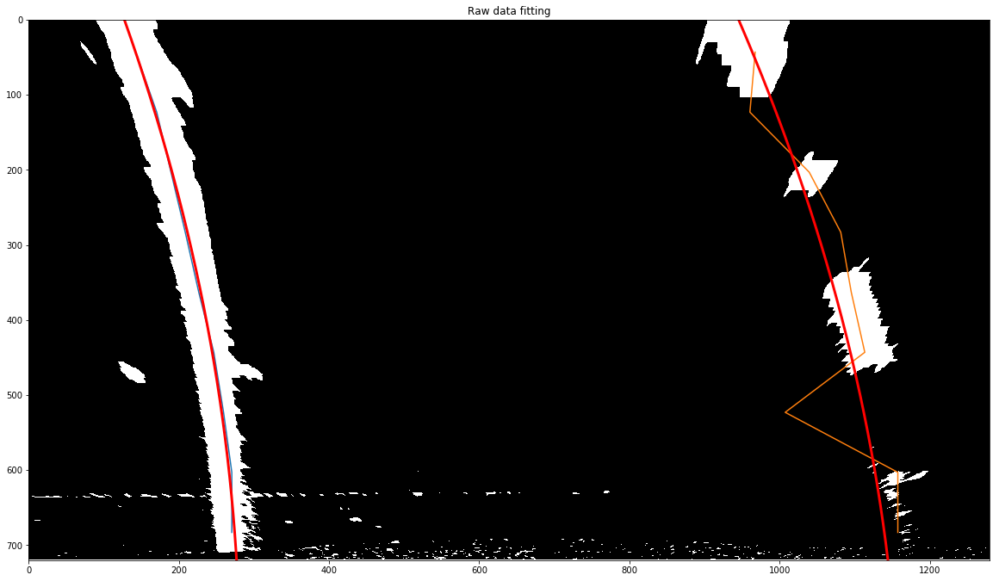

deque([[(275.5, 683), (277.5, 603), (256.5, 523), (246.5, 443), (217.5, 363), (194.5, 283), (176.5, 203), (154.5, 123), (135.5, 43)], [(272.5, 683), (267.5, 603), (255.5, 523), (241.5, 443), (213.5, 363), (192.5, 283), (173.5, 203), (147.5, 123), (127.5, 43)], [(270.5, 683), (272.5, 603), (255.5, 523), (234.5, 443), (211.5, 363), (188.5, 283), (171.5, 203), (147.5, 123), (121.5, 43)], [(268.5, 683), (267.5, 603), (253.5, 523), (233.5, 443), (208.5, 363), (194.5, 283), (172.5, 203), (154.5, 123), (125.5, 43)], [(269.5, 683), (271.5, 603), (253.5, 523), (234.5, 443), (209.5, 363), (194.5, 283), (173.5, 203), (158.5, 123), (121.5, 43)], [(265.5, 683), (268.5, 603), (248.5, 523), (230.5, 443), (205.5, 363), (191.5, 283), (173.5, 203), (151.5, 123), (121.5, 43)], [(261.5, 683), (265.5, 603), (245.5, 523), (222.5, 443), (208.5, 363), (191.5, 283), (175.5, 203), (147.5, 123), (123.5, 43)], [(257.5, 683), (258.5, 603), (242.5, 523), (220.5, 443), (206.5, 363), (186.5, 283), (173.5, 203), (146.

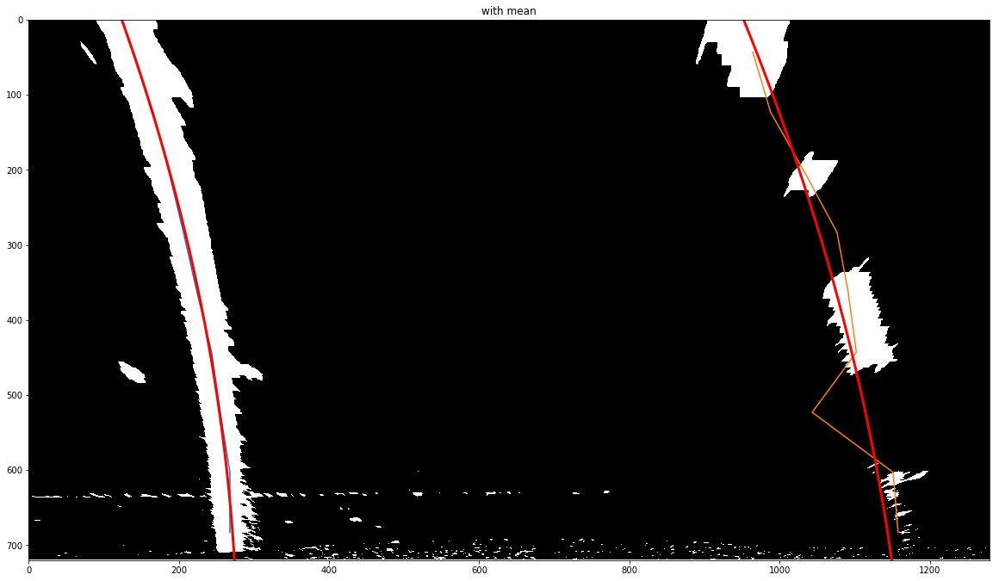

with median
length 9
point -  0
column l [[ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]
 [ 266.5  683. ]
 [ 270.5  683. ]]
column r [[ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]
 [ 1147.5   683. ]
 [ 1157.5   683. ]]
data [[ 275.5]
 [ 272.5]
 [ 270.5]
 [ 268.5]
 [ 269.5]
 [ 265.5]
 [ 261.5]
 [ 257.5]
 [ 261.5]
 [ 261.5]
 [ 261.5]
 [ 264.5]
 [ 264.5]
 [ 266.5]
 [ 270.5]]
minus median [[ 10.]
 [  7.]
 [  5.]
 [  3.]
 [  4.]
 [  0.]
 [  4.]
 [  8.]
 [  4.]
 [  4.]
 [  4.]
 [  1.]
 [  1.]
 [  1.]
 [  5.]]
median/mdev 4.0
s - d/mdev [[ 2.5 ]
 [ 1.75]
 [ 1.25]
 [ 0.75]
 [ 1.  ]
 [ 0.  ]
 [ 1.  ]
 [ 2.  ]
 [ 1.  ]
 [ 1.  ]
 

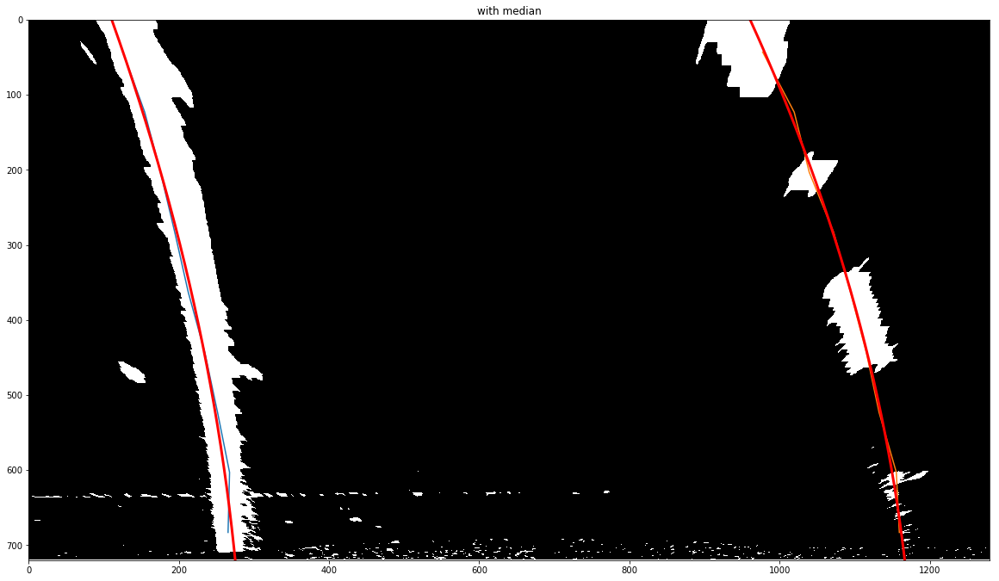

with weighted
median with average
length 9
point -  0
column l [[ 275.5  683. ]
 [ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]
 [ 266.5  683. ]
 [ 270.5  683. ]]
column r [[ 1157.5   683. ]
 [ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]
 [ 1147.5   683. ]
 [ 1157.5   683. ]]
data [[ 275.5]
 [ 272.5]
 [ 270.5]
 [ 268.5]
 [ 269.5]
 [ 265.5]
 [ 261.5]
 [ 257.5]
 [ 261.5]
 [ 261.5]
 [ 261.5]
 [ 264.5]
 [ 264.5]
 [ 266.5]
 [ 270.5]]
minus median [[ 10.]
 [  7.]
 [  5.]
 [  3.]
 [  4.]
 [  0.]
 [  4.]
 [  8.]
 [  4.]
 [  4.]
 [  4.]
 [  1.]
 [  1.]
 [  1.]
 [  5.]]
median/mdev 4.0
s - d/mdev [[ 2.5 ]
 [ 1.75]
 [ 1.25]
 [ 0.75]
 [ 1.  ]
 [ 0.  ]
 [ 1.  ]
 [ 2. 

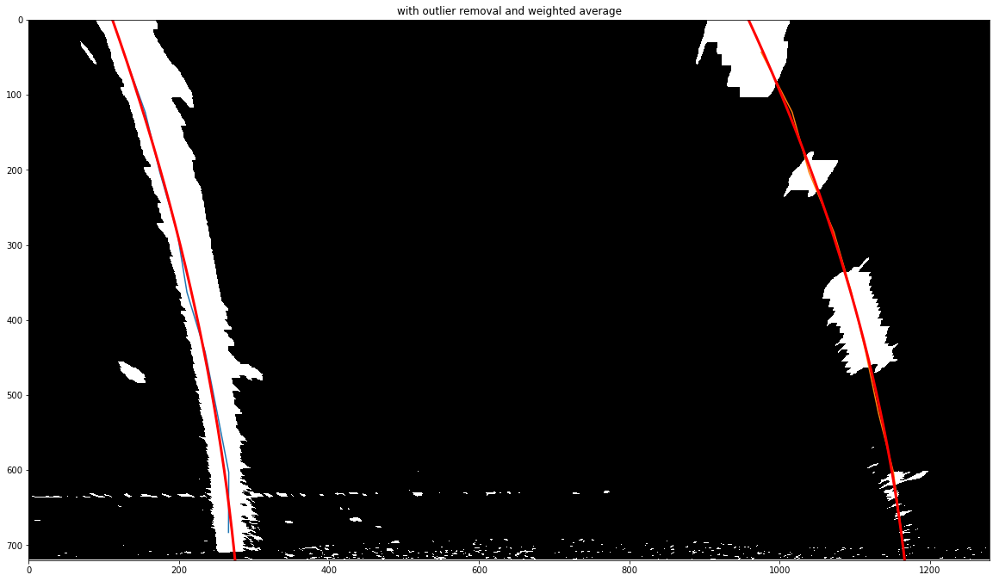

266.1 1162.3 -0.391671428571
801.580453194 m 895.442761808 m
801.580453194 895.442761808
Left curve radius 801.58 m
Right curve radius 895.44 m
Car position -0.3917 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


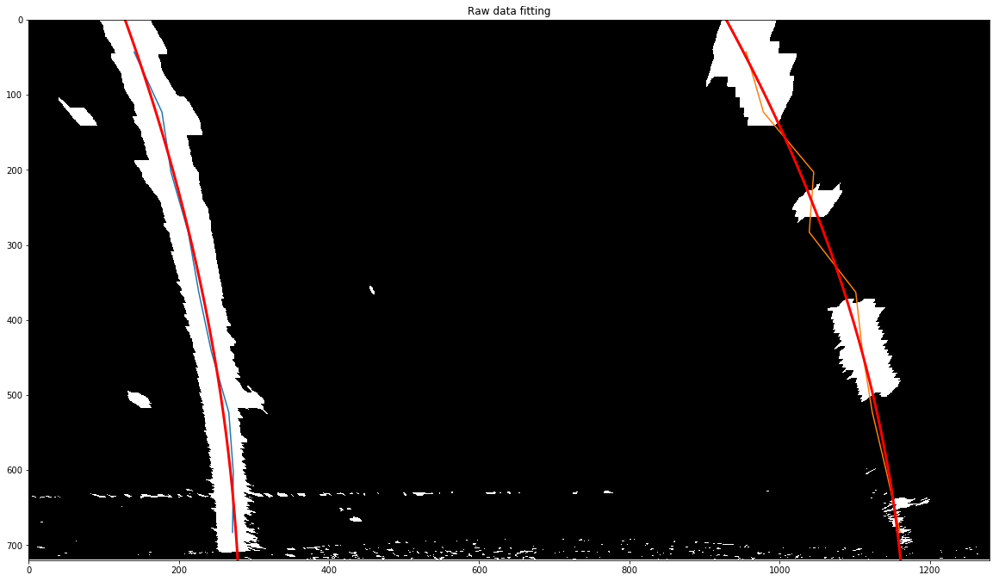

deque([[(272.5, 683), (267.5, 603), (255.5, 523), (241.5, 443), (213.5, 363), (192.5, 283), (173.5, 203), (147.5, 123), (127.5, 43)], [(270.5, 683), (272.5, 603), (255.5, 523), (234.5, 443), (211.5, 363), (188.5, 283), (171.5, 203), (147.5, 123), (121.5, 43)], [(268.5, 683), (267.5, 603), (253.5, 523), (233.5, 443), (208.5, 363), (194.5, 283), (172.5, 203), (154.5, 123), (125.5, 43)], [(269.5, 683), (271.5, 603), (253.5, 523), (234.5, 443), (209.5, 363), (194.5, 283), (173.5, 203), (158.5, 123), (121.5, 43)], [(265.5, 683), (268.5, 603), (248.5, 523), (230.5, 443), (205.5, 363), (191.5, 283), (173.5, 203), (151.5, 123), (121.5, 43)], [(261.5, 683), (265.5, 603), (245.5, 523), (222.5, 443), (208.5, 363), (191.5, 283), (175.5, 203), (147.5, 123), (123.5, 43)], [(257.5, 683), (258.5, 603), (242.5, 523), (220.5, 443), (206.5, 363), (186.5, 283), (173.5, 203), (146.5, 123), (117.5, 43)], [(261.5, 683), (260.5, 603), (243.5, 523), (227.5, 443), (208.5, 363), (196.5, 283), (173.5, 203), (147.

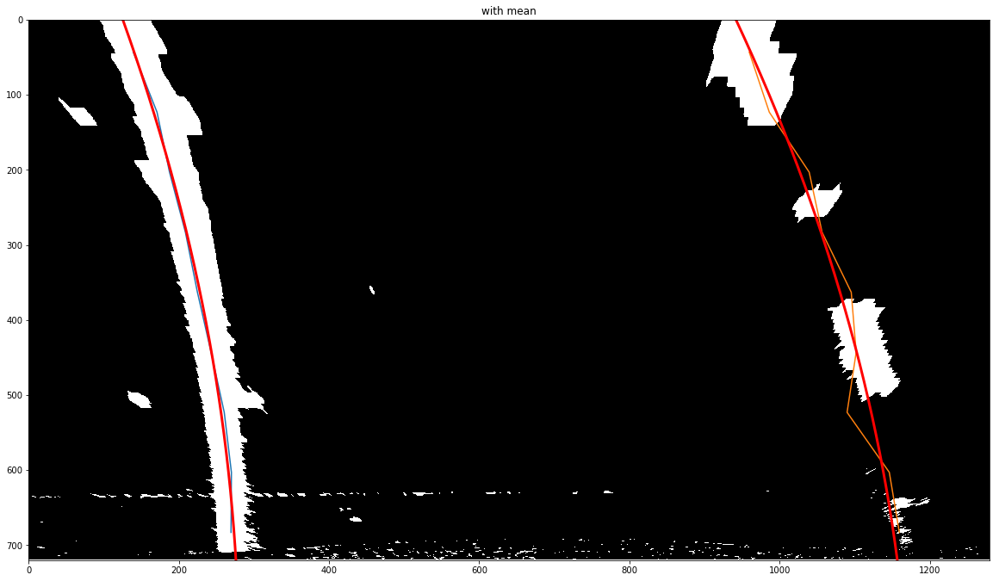

with median
length 9
point -  0
column l [[ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]
 [ 266.5  683. ]
 [ 270.5  683. ]
 [ 271.5  683. ]]
column r [[ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]
 [ 1147.5   683. ]
 [ 1157.5   683. ]
 [ 1160.5   683. ]]
data [[ 272.5]
 [ 270.5]
 [ 268.5]
 [ 269.5]
 [ 265.5]
 [ 261.5]
 [ 257.5]
 [ 261.5]
 [ 261.5]
 [ 261.5]
 [ 264.5]
 [ 264.5]
 [ 266.5]
 [ 270.5]
 [ 271.5]]
minus median [[ 7.]
 [ 5.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 4.]
 [ 8.]
 [ 4.]
 [ 4.]
 [ 4.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 5.]
 [ 6.]]
median/mdev 4.0
s - d/mdev [[ 1.75]
 [ 1.25]
 [ 0.75]
 [ 1.  ]
 [ 0.  ]
 [ 1.  ]
 [ 2.  ]
 [ 1.  ]
 [ 1.  ]
 [ 1.  ]
 [ 0.25]
 [ 0.25

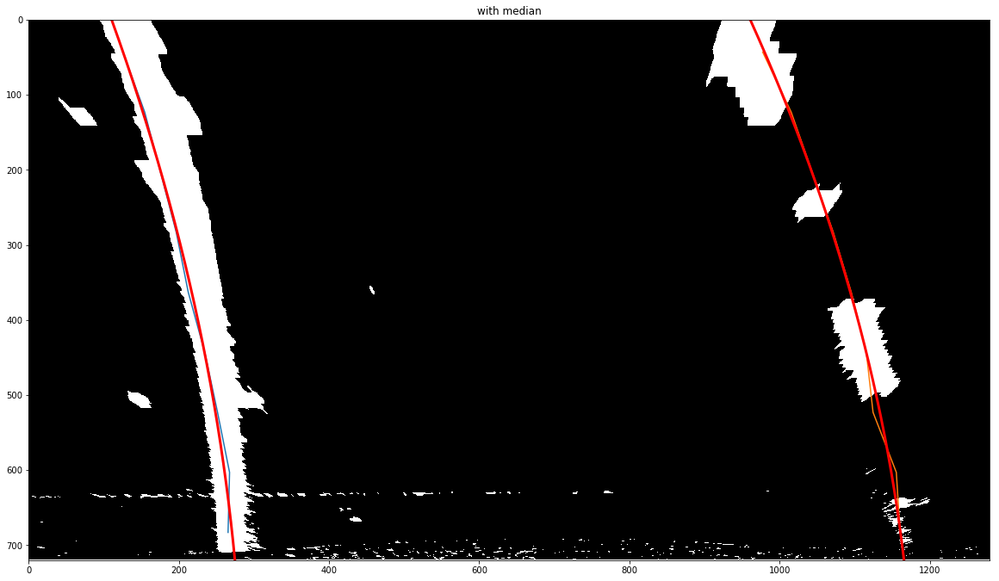

with weighted
median with average
length 9
point -  0
column l [[ 272.5  683. ]
 [ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]
 [ 266.5  683. ]
 [ 270.5  683. ]
 [ 271.5  683. ]]
column r [[ 1158.5   683. ]
 [ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]
 [ 1147.5   683. ]
 [ 1157.5   683. ]
 [ 1160.5   683. ]]
data [[ 272.5]
 [ 270.5]
 [ 268.5]
 [ 269.5]
 [ 265.5]
 [ 261.5]
 [ 257.5]
 [ 261.5]
 [ 261.5]
 [ 261.5]
 [ 264.5]
 [ 264.5]
 [ 266.5]
 [ 270.5]
 [ 271.5]]
minus median [[ 7.]
 [ 5.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 4.]
 [ 8.]
 [ 4.]
 [ 4.]
 [ 4.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 5.]
 [ 6.]]
median/mdev 4.0
s - d/mdev [[ 1.75]
 [ 1.25]
 [ 0.75]
 [ 1.  ]
 [ 0.  ]
 [ 1.  ]
 [ 2.  ]
 [ 1.  ]
 [ 1.  ]
 [ 

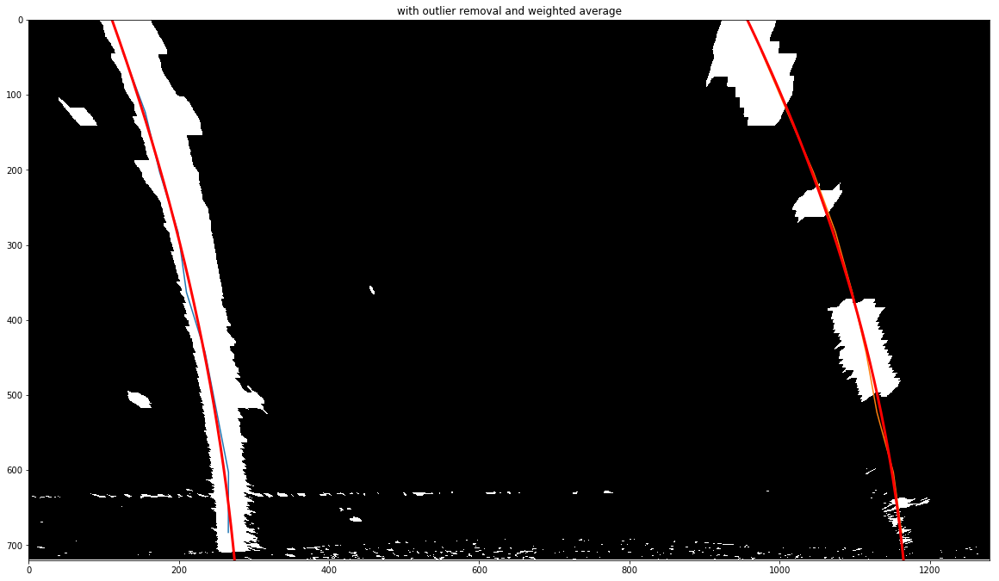

265.833333333 1162.5 -0.390261904762
793.12823477 m 704.636028301 m
793.12823477 704.636028301
Left curve radius 793.13 m
Right curve radius 704.64 m
Car position -0.3903 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


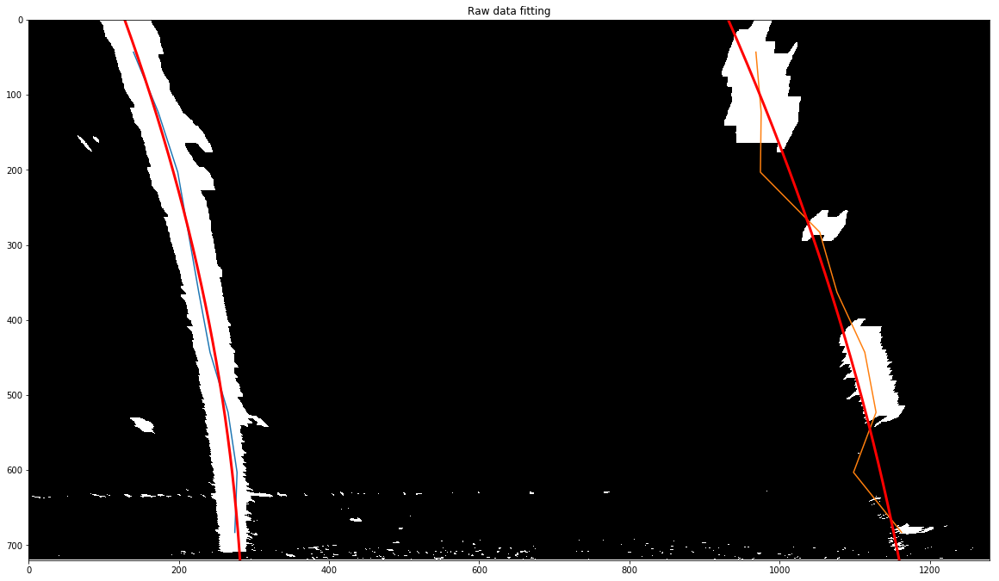

deque([[(270.5, 683), (272.5, 603), (255.5, 523), (234.5, 443), (211.5, 363), (188.5, 283), (171.5, 203), (147.5, 123), (121.5, 43)], [(268.5, 683), (267.5, 603), (253.5, 523), (233.5, 443), (208.5, 363), (194.5, 283), (172.5, 203), (154.5, 123), (125.5, 43)], [(269.5, 683), (271.5, 603), (253.5, 523), (234.5, 443), (209.5, 363), (194.5, 283), (173.5, 203), (158.5, 123), (121.5, 43)], [(265.5, 683), (268.5, 603), (248.5, 523), (230.5, 443), (205.5, 363), (191.5, 283), (173.5, 203), (151.5, 123), (121.5, 43)], [(261.5, 683), (265.5, 603), (245.5, 523), (222.5, 443), (208.5, 363), (191.5, 283), (175.5, 203), (147.5, 123), (123.5, 43)], [(257.5, 683), (258.5, 603), (242.5, 523), (220.5, 443), (206.5, 363), (186.5, 283), (173.5, 203), (146.5, 123), (117.5, 43)], [(261.5, 683), (260.5, 603), (243.5, 523), (227.5, 443), (208.5, 363), (196.5, 283), (173.5, 203), (147.5, 123), (122.5, 43)], [(261.5, 683), (261.5, 603), (246.5, 523), (228.5, 443), (212.5, 363), (202.5, 283), (176.5, 203), (152.

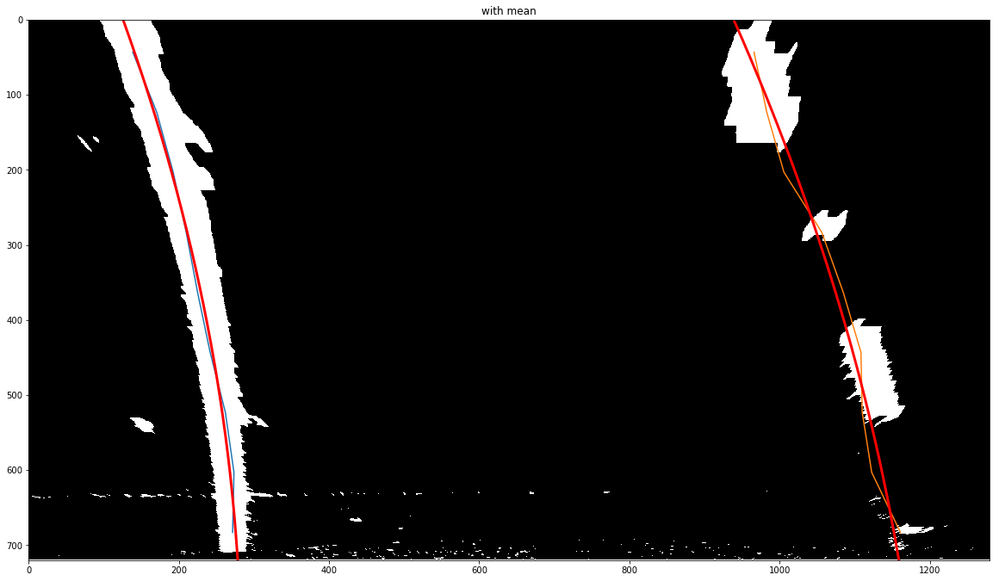

with median
length 9
point -  0
column l [[ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]
 [ 266.5  683. ]
 [ 270.5  683. ]
 [ 271.5  683. ]
 [ 274.5  683. ]]
column r [[ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]
 [ 1147.5   683. ]
 [ 1157.5   683. ]
 [ 1160.5   683. ]
 [ 1162.5   683. ]]
data [[ 270.5]
 [ 268.5]
 [ 269.5]
 [ 265.5]
 [ 261.5]
 [ 257.5]
 [ 261.5]
 [ 261.5]
 [ 261.5]
 [ 264.5]
 [ 264.5]
 [ 266.5]
 [ 270.5]
 [ 271.5]
 [ 274.5]]
minus median [[ 5.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 4.]
 [ 8.]
 [ 4.]
 [ 4.]
 [ 4.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 5.]
 [ 6.]
 [ 9.]]
median/mdev 4.0
s - d/mdev [[ 1.25]
 [ 0.75]
 [ 1.  ]
 [ 0.  ]
 [ 1.  ]
 [ 2.  ]
 [ 1.  ]
 [ 1.  ]
 [ 1.  ]
 [ 0.25]
 [ 0.25]
 [ 0.25

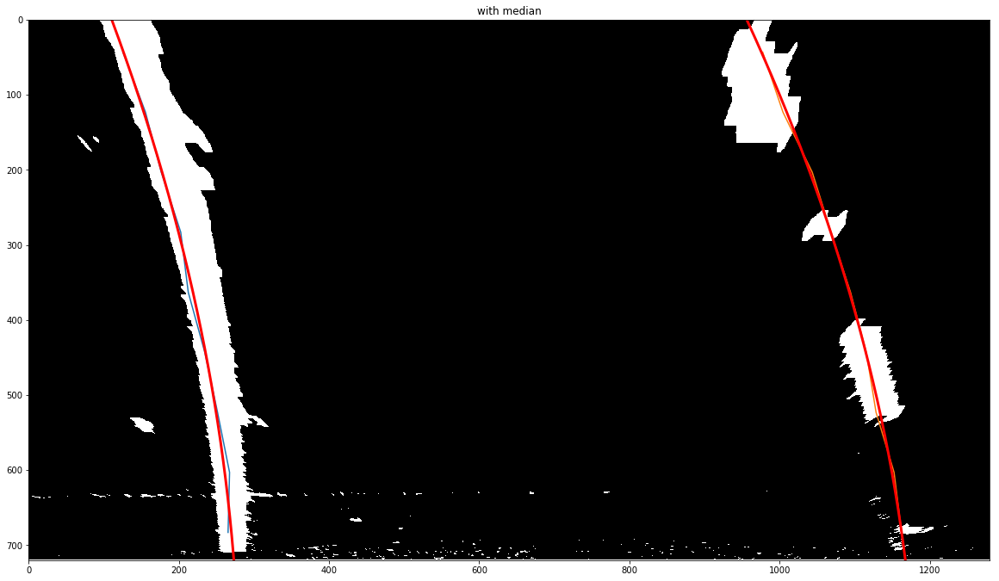

with weighted
median with average
length 9
point -  0
column l [[ 270.5  683. ]
 [ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]
 [ 266.5  683. ]
 [ 270.5  683. ]
 [ 271.5  683. ]
 [ 274.5  683. ]]
column r [[ 1176.5   683. ]
 [ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]
 [ 1147.5   683. ]
 [ 1157.5   683. ]
 [ 1160.5   683. ]
 [ 1162.5   683. ]]
data [[ 270.5]
 [ 268.5]
 [ 269.5]
 [ 265.5]
 [ 261.5]
 [ 257.5]
 [ 261.5]
 [ 261.5]
 [ 261.5]
 [ 264.5]
 [ 264.5]
 [ 266.5]
 [ 270.5]
 [ 271.5]
 [ 274.5]]
minus median [[ 5.]
 [ 3.]
 [ 4.]
 [ 0.]
 [ 4.]
 [ 8.]
 [ 4.]
 [ 4.]
 [ 4.]
 [ 1.]
 [ 1.]
 [ 1.]
 [ 5.]
 [ 6.]
 [ 9.]]
median/mdev 4.0
s - d/mdev [[ 1.25]
 [ 0.75]
 [ 1.  ]
 [ 0.  ]
 [ 1.  ]
 [ 2.  ]
 [ 1.  ]
 [ 1.  ]
 [ 1.  ]
 [ 

data[s<m] [  977.5   999.5  1004.5  1019.5  1024.5  1038.5  1044.5  1050.5   982.5
   997.5  1015.5  1025.5   960.5   978.5   975.5] 

cleandata shape (15,)
cleandata shape (15,)
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 5, 5, 10, 20, 50]
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 5, 5, 10, 20, 50]
flattened [ 147.5  154.5  158.5  151.5  147.5  146.5  147.5  152.5  155.5  165.5
  162.5  165.5  170.5  177.5  172.5]
clean left [ 147.5  154.5  158.5  151.5  147.5  146.5  147.5  152.5  155.5  165.5
  162.5  165.5  170.5  177.5  172.5]
weighted av 170.47
clean right [  977.5   999.5  1004.5  1019.5  1024.5  1038.5  1044.5  1050.5   982.5
   997.5  1015.5  1025.5   960.5   978.5   975.5]
weighted av 982.94
now using weighted average
leftx 158.366666667
rightx 1006.3
y [ 123.]



point -  8
column l [[ 121.5   43. ]
 [ 125.5   43. ]
 [ 121.5   43. ]
 [ 121.5   43. ]
 [ 123.5   43. ]
 [ 117.5   43. ]
 [ 122.5   43. ]
 [ 125.5   43. ]
 [ 135.5   43. ]
 [ 138.5   43. ]
 [ 136.5   43. ]
 [ 143.5   43. ]
 [ 142.5   43. 

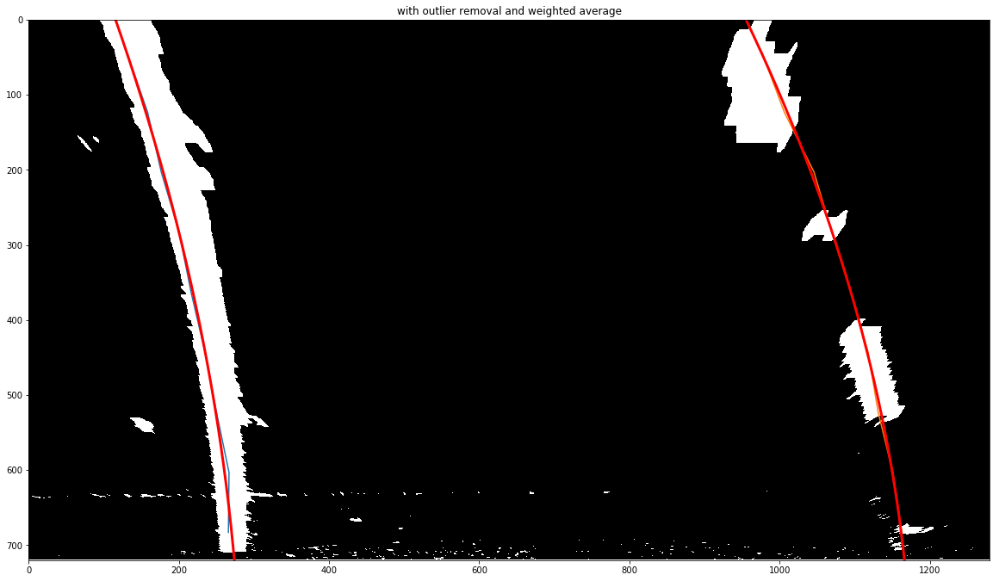

265.966666667 1162.76666667 -0.390966666667
800.776013012 m 863.211491334 m
800.776013012 863.211491334
Left curve radius 800.78 m
Right curve radius 863.21 m
Car position -0.3910 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


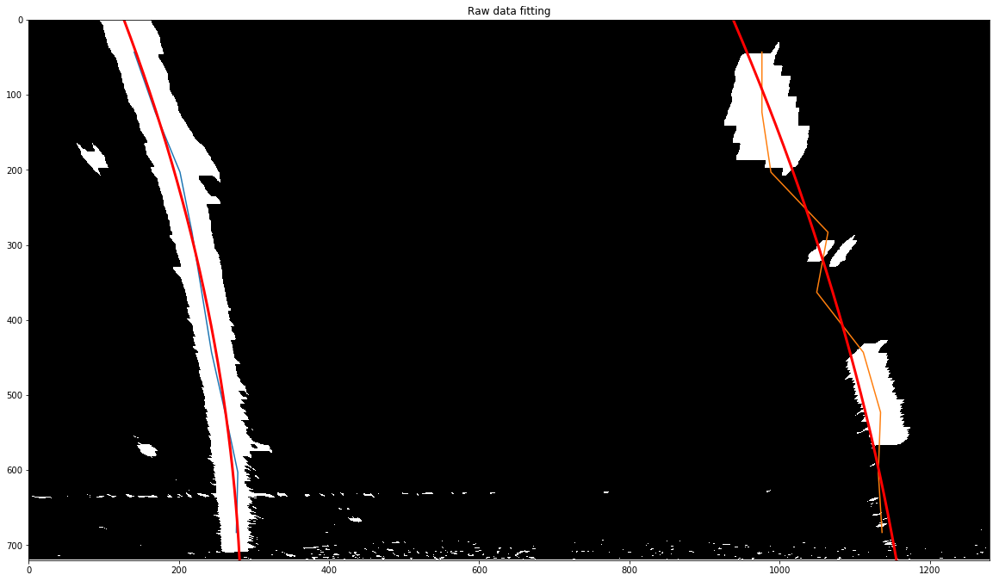

deque([[(268.5, 683), (267.5, 603), (253.5, 523), (233.5, 443), (208.5, 363), (194.5, 283), (172.5, 203), (154.5, 123), (125.5, 43)], [(269.5, 683), (271.5, 603), (253.5, 523), (234.5, 443), (209.5, 363), (194.5, 283), (173.5, 203), (158.5, 123), (121.5, 43)], [(265.5, 683), (268.5, 603), (248.5, 523), (230.5, 443), (205.5, 363), (191.5, 283), (173.5, 203), (151.5, 123), (121.5, 43)], [(261.5, 683), (265.5, 603), (245.5, 523), (222.5, 443), (208.5, 363), (191.5, 283), (175.5, 203), (147.5, 123), (123.5, 43)], [(257.5, 683), (258.5, 603), (242.5, 523), (220.5, 443), (206.5, 363), (186.5, 283), (173.5, 203), (146.5, 123), (117.5, 43)], [(261.5, 683), (260.5, 603), (243.5, 523), (227.5, 443), (208.5, 363), (196.5, 283), (173.5, 203), (147.5, 123), (122.5, 43)], [(261.5, 683), (261.5, 603), (246.5, 523), (228.5, 443), (212.5, 363), (202.5, 283), (176.5, 203), (152.5, 123), (125.5, 43)], [(261.5, 683), (260.5, 603), (247.5, 523), (231.5, 443), (216.5, 363), (205.5, 283), (180.5, 203), (155.

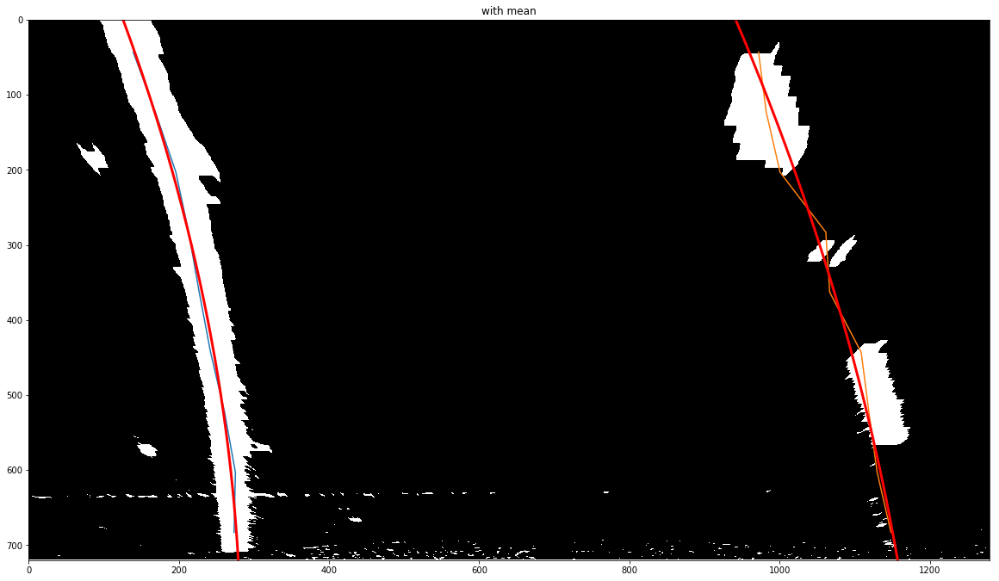

with median
length 9
point -  0
column l [[ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]
 [ 266.5  683. ]
 [ 270.5  683. ]
 [ 271.5  683. ]
 [ 274.5  683. ]
 [ 276.5  683. ]]
column r [[ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]
 [ 1147.5   683. ]
 [ 1157.5   683. ]
 [ 1160.5   683. ]
 [ 1162.5   683. ]
 [ 1136.5   683. ]]
data [[ 268.5]
 [ 269.5]
 [ 265.5]
 [ 261.5]
 [ 257.5]
 [ 261.5]
 [ 261.5]
 [ 261.5]
 [ 264.5]
 [ 264.5]
 [ 266.5]
 [ 270.5]
 [ 271.5]
 [ 274.5]
 [ 276.5]]
minus median [[  3.]
 [  4.]
 [  0.]
 [  4.]
 [  8.]
 [  4.]
 [  4.]
 [  4.]
 [  1.]
 [  1.]
 [  1.]
 [  5.]
 [  6.]
 [  9.]
 [ 11.]]
median/mdev 4.0
s - d/mdev [[ 0.75]
 [ 1.  ]
 [ 0.  ]
 [ 1.  ]
 [ 2.  ]
 [ 1.  ]
 [ 1.  ]
 [ 1.  ]
 [ 0.25]
 [ 0.25]
 

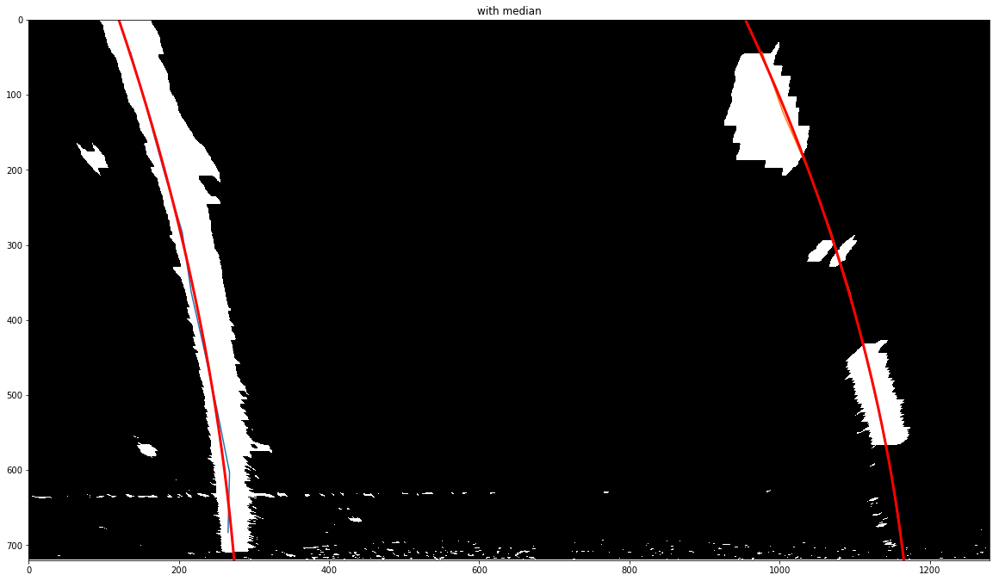

with weighted
median with average
length 9
point -  0
column l [[ 268.5  683. ]
 [ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]
 [ 266.5  683. ]
 [ 270.5  683. ]
 [ 271.5  683. ]
 [ 274.5  683. ]
 [ 276.5  683. ]]
column r [[ 1177.5   683. ]
 [ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]
 [ 1147.5   683. ]
 [ 1157.5   683. ]
 [ 1160.5   683. ]
 [ 1162.5   683. ]
 [ 1136.5   683. ]]
data [[ 268.5]
 [ 269.5]
 [ 265.5]
 [ 261.5]
 [ 257.5]
 [ 261.5]
 [ 261.5]
 [ 261.5]
 [ 264.5]
 [ 264.5]
 [ 266.5]
 [ 270.5]
 [ 271.5]
 [ 274.5]
 [ 276.5]]
minus median [[  3.]
 [  4.]
 [  0.]
 [  4.]
 [  8.]
 [  4.]
 [  4.]
 [  4.]
 [  1.]
 [  1.]
 [  1.]
 [  5.]
 [  6.]
 [  9.]
 [ 11.]]
median/mdev 4.0
s - d/mdev [[ 0.75]
 [ 1.  ]
 [ 0.  ]
 [ 1.  ]
 [ 2.  ]
 [ 1.  ]
 [ 1.  ]
 [ 1. 

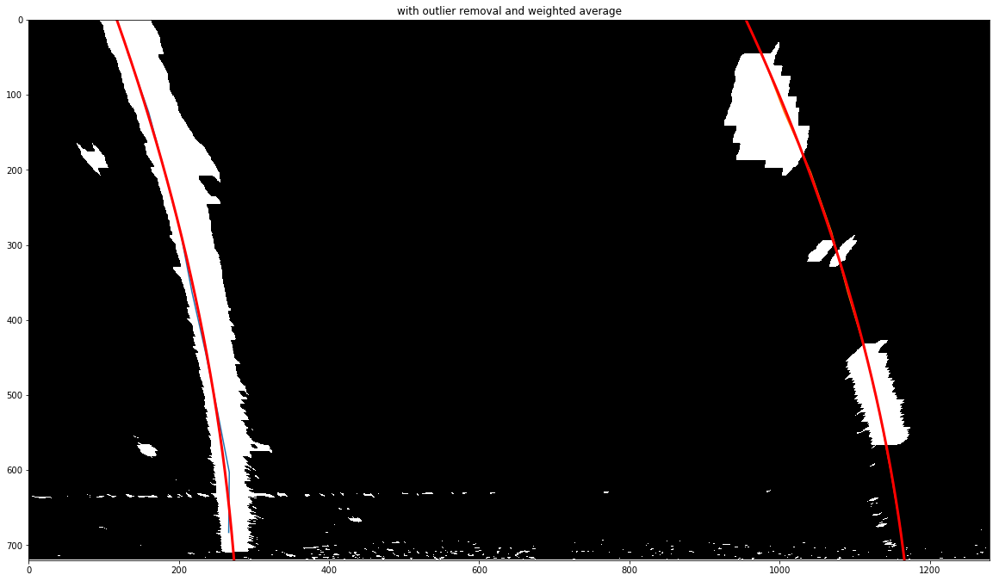

266.366666667 1161.78571429 -0.387795238095
763.250330718 m 942.725077382 m
763.250330718 942.725077382
Left curve radius 763.25 m
Right curve radius 942.73 m
Car position -0.3878 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


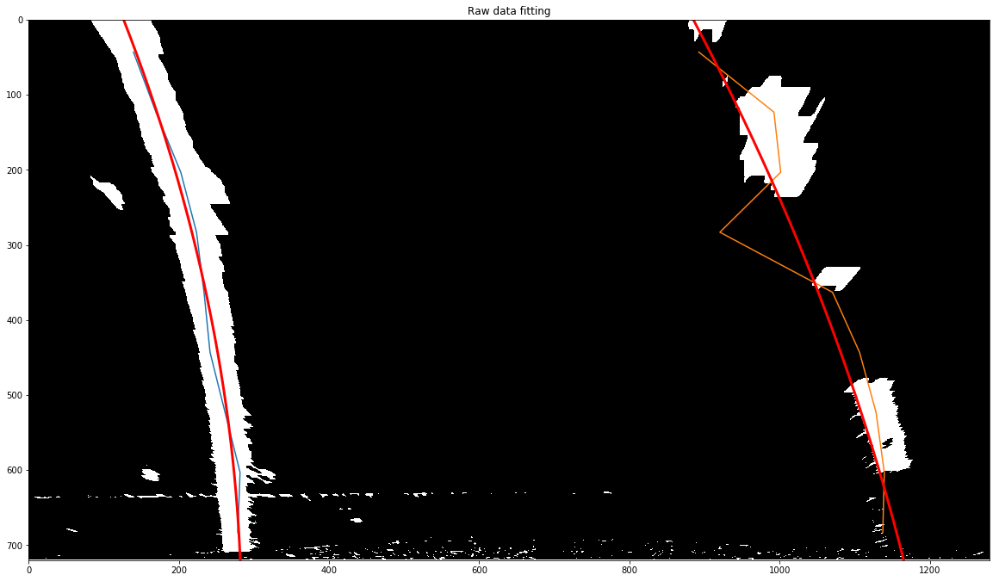

deque([[(269.5, 683), (271.5, 603), (253.5, 523), (234.5, 443), (209.5, 363), (194.5, 283), (173.5, 203), (158.5, 123), (121.5, 43)], [(265.5, 683), (268.5, 603), (248.5, 523), (230.5, 443), (205.5, 363), (191.5, 283), (173.5, 203), (151.5, 123), (121.5, 43)], [(261.5, 683), (265.5, 603), (245.5, 523), (222.5, 443), (208.5, 363), (191.5, 283), (175.5, 203), (147.5, 123), (123.5, 43)], [(257.5, 683), (258.5, 603), (242.5, 523), (220.5, 443), (206.5, 363), (186.5, 283), (173.5, 203), (146.5, 123), (117.5, 43)], [(261.5, 683), (260.5, 603), (243.5, 523), (227.5, 443), (208.5, 363), (196.5, 283), (173.5, 203), (147.5, 123), (122.5, 43)], [(261.5, 683), (261.5, 603), (246.5, 523), (228.5, 443), (212.5, 363), (202.5, 283), (176.5, 203), (152.5, 123), (125.5, 43)], [(261.5, 683), (260.5, 603), (247.5, 523), (231.5, 443), (216.5, 363), (205.5, 283), (180.5, 203), (155.5, 123), (135.5, 43)], [(264.5, 683), (262.5, 603), (255.5, 523), (238.5, 443), (225.5, 363), (208.5, 283), (185.5, 203), (165.

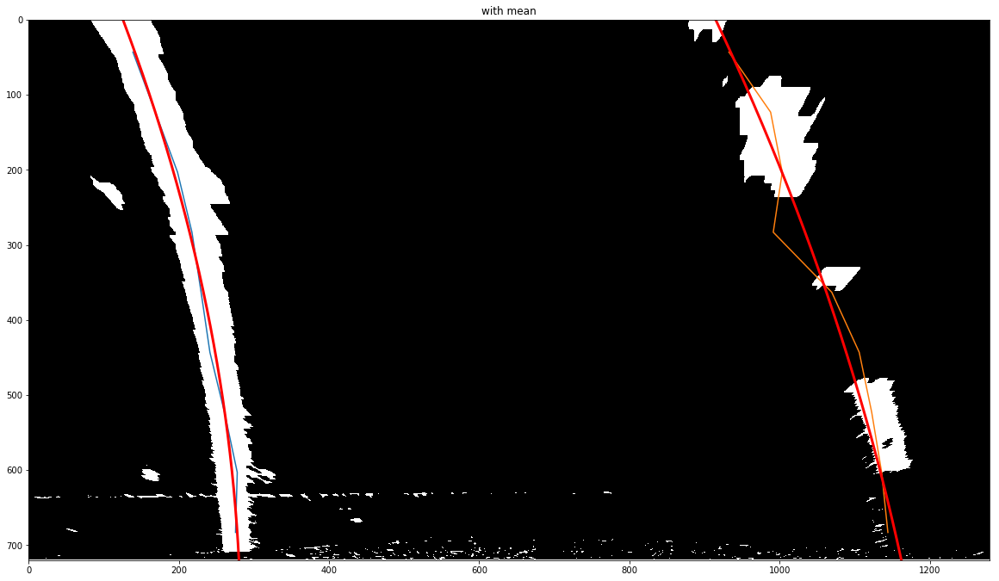

with median
length 9
point -  0
column l [[ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]
 [ 266.5  683. ]
 [ 270.5  683. ]
 [ 271.5  683. ]
 [ 274.5  683. ]
 [ 276.5  683. ]
 [ 278.5  683. ]]
column r [[ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]
 [ 1147.5   683. ]
 [ 1157.5   683. ]
 [ 1160.5   683. ]
 [ 1162.5   683. ]
 [ 1136.5   683. ]
 [ 1137.5   683. ]]
data [[ 269.5]
 [ 265.5]
 [ 261.5]
 [ 257.5]
 [ 261.5]
 [ 261.5]
 [ 261.5]
 [ 264.5]
 [ 264.5]
 [ 266.5]
 [ 270.5]
 [ 271.5]
 [ 274.5]
 [ 276.5]
 [ 278.5]]
minus median [[  4.]
 [  0.]
 [  4.]
 [  8.]
 [  4.]
 [  4.]
 [  4.]
 [  1.]
 [  1.]
 [  1.]
 [  5.]
 [  6.]
 [  9.]
 [ 11.]
 [ 13.]]
median/mdev 4.0
s - d/mdev [[ 1.  ]
 [ 0.  ]
 [ 1.  ]
 [ 2.  ]
 [ 1.  ]
 [ 1.  ]
 [ 1.  ]
 [ 0.25]
 [ 0.25]
 [ 0.25]
 

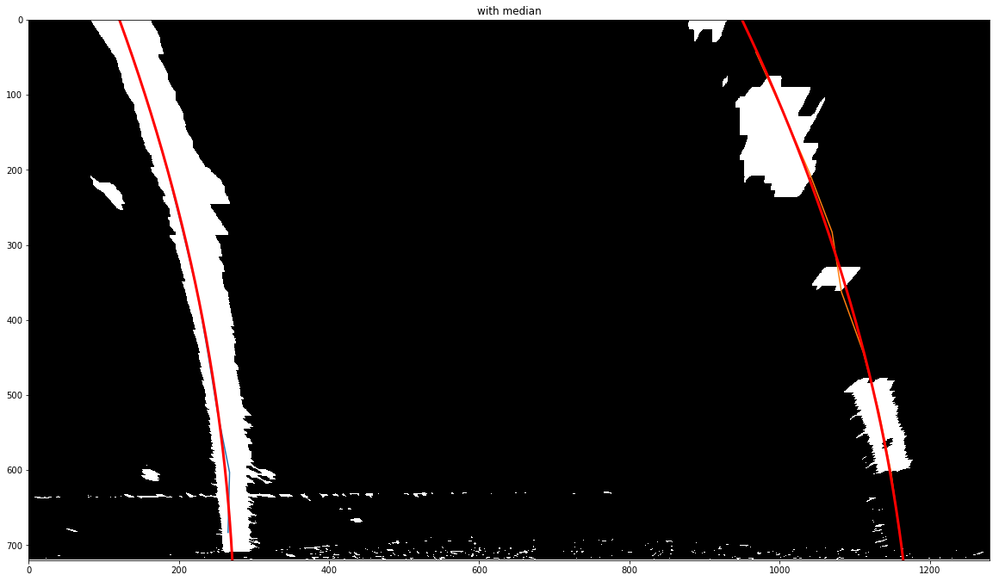

with weighted
median with average
length 9
point -  0
column l [[ 269.5  683. ]
 [ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]
 [ 266.5  683. ]
 [ 270.5  683. ]
 [ 271.5  683. ]
 [ 274.5  683. ]
 [ 276.5  683. ]
 [ 278.5  683. ]]
column r [[ 1154.5   683. ]
 [ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]
 [ 1147.5   683. ]
 [ 1157.5   683. ]
 [ 1160.5   683. ]
 [ 1162.5   683. ]
 [ 1136.5   683. ]
 [ 1137.5   683. ]]
data [[ 269.5]
 [ 265.5]
 [ 261.5]
 [ 257.5]
 [ 261.5]
 [ 261.5]
 [ 261.5]
 [ 264.5]
 [ 264.5]
 [ 266.5]
 [ 270.5]
 [ 271.5]
 [ 274.5]
 [ 276.5]
 [ 278.5]]
minus median [[  4.]
 [  0.]
 [  4.]
 [  8.]
 [  4.]
 [  4.]
 [  4.]
 [  1.]
 [  1.]
 [  1.]
 [  5.]
 [  6.]
 [  9.]
 [ 11.]
 [ 13.]]
median/mdev 4.0
s - d/mdev [[ 1.  ]
 [ 0.  ]
 [ 1.  ]
 [ 2.  ]
 [ 1.  ]
 [ 1.  ]
 [ 1.  ]
 [ 0.2

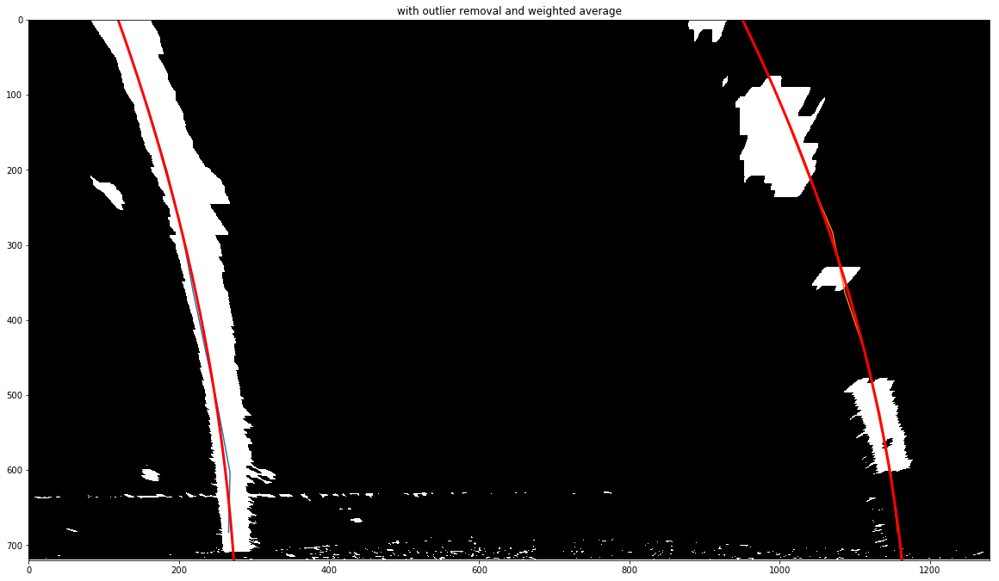

266.214285714 1157.43333333 -0.376418367347
725.473071619 m 933.838118685 m
725.473071619 933.838118685
Left curve radius 725.47 m
Right curve radius 933.84 m
Car position -0.3764 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


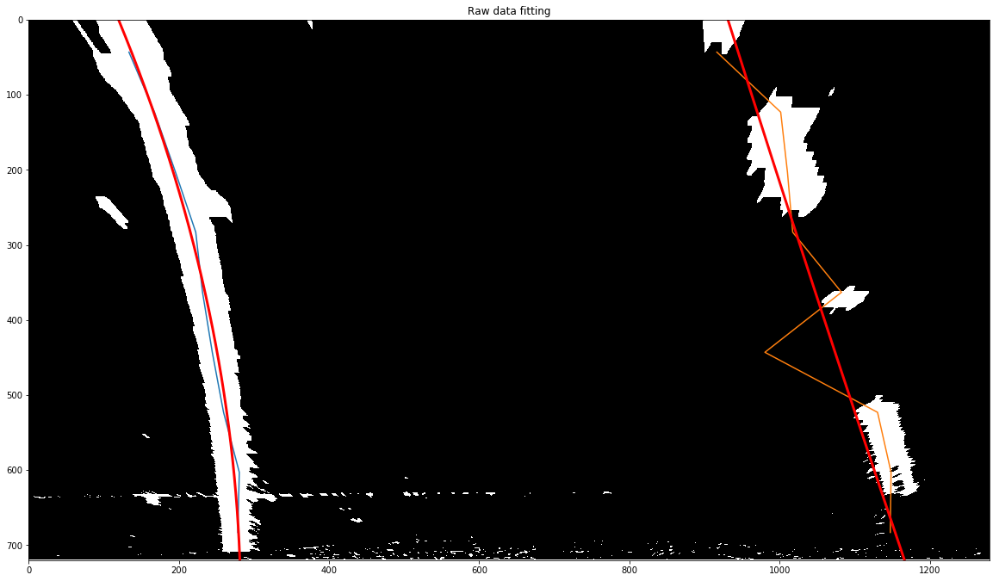

deque([[(265.5, 683), (268.5, 603), (248.5, 523), (230.5, 443), (205.5, 363), (191.5, 283), (173.5, 203), (151.5, 123), (121.5, 43)], [(261.5, 683), (265.5, 603), (245.5, 523), (222.5, 443), (208.5, 363), (191.5, 283), (175.5, 203), (147.5, 123), (123.5, 43)], [(257.5, 683), (258.5, 603), (242.5, 523), (220.5, 443), (206.5, 363), (186.5, 283), (173.5, 203), (146.5, 123), (117.5, 43)], [(261.5, 683), (260.5, 603), (243.5, 523), (227.5, 443), (208.5, 363), (196.5, 283), (173.5, 203), (147.5, 123), (122.5, 43)], [(261.5, 683), (261.5, 603), (246.5, 523), (228.5, 443), (212.5, 363), (202.5, 283), (176.5, 203), (152.5, 123), (125.5, 43)], [(261.5, 683), (260.5, 603), (247.5, 523), (231.5, 443), (216.5, 363), (205.5, 283), (180.5, 203), (155.5, 123), (135.5, 43)], [(264.5, 683), (262.5, 603), (255.5, 523), (238.5, 443), (225.5, 363), (208.5, 283), (185.5, 203), (165.5, 123), (138.5, 43)], [(264.5, 683), (264.5, 603), (248.5, 523), (242.5, 443), (224.5, 363), (204.5, 283), (186.5, 203), (162.

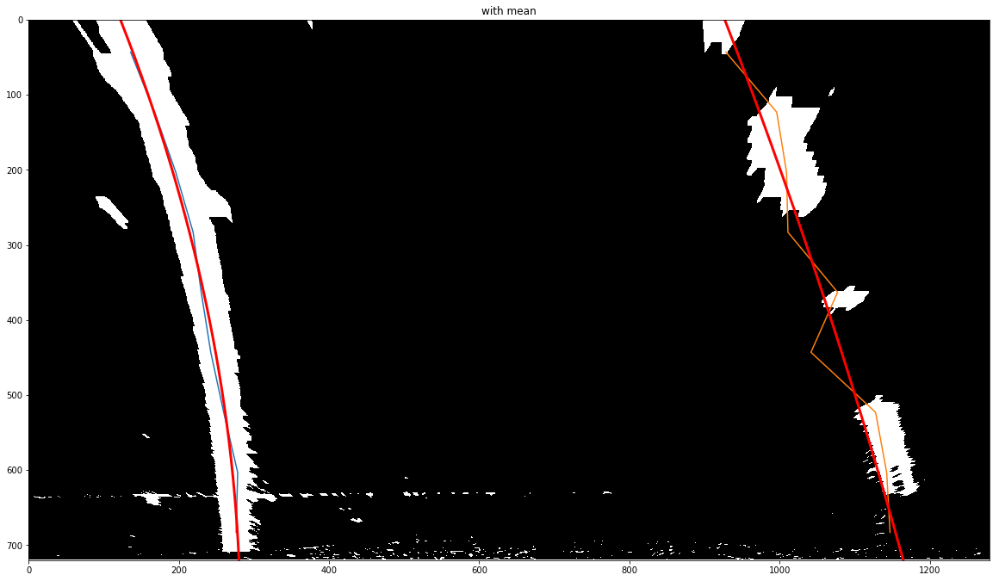

with median
length 9
point -  0
column l [[ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]
 [ 266.5  683. ]
 [ 270.5  683. ]
 [ 271.5  683. ]
 [ 274.5  683. ]
 [ 276.5  683. ]
 [ 278.5  683. ]
 [ 278.5  683. ]]
column r [[ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]
 [ 1147.5   683. ]
 [ 1157.5   683. ]
 [ 1160.5   683. ]
 [ 1162.5   683. ]
 [ 1136.5   683. ]
 [ 1137.5   683. ]
 [ 1147.5   683. ]]
data [[ 265.5]
 [ 261.5]
 [ 257.5]
 [ 261.5]
 [ 261.5]
 [ 261.5]
 [ 264.5]
 [ 264.5]
 [ 266.5]
 [ 270.5]
 [ 271.5]
 [ 274.5]
 [ 276.5]
 [ 278.5]
 [ 278.5]]
minus median [[  0.]
 [  4.]
 [  8.]
 [  4.]
 [  4.]
 [  4.]
 [  1.]
 [  1.]
 [  1.]
 [  5.]
 [  6.]
 [  9.]
 [ 11.]
 [ 13.]
 [ 13.]]
median/mdev 4.0
s - d/mdev [[ 0.  ]
 [ 1.  ]
 [ 2.  ]
 [ 1.  ]
 [ 1.  ]
 [ 1.  ]
 [ 0.25]
 [ 0.25]
 [ 0.25]
 [ 1.25]
 

 [ 0.28571429]] m 10
data[s<m] [ 151.5  147.5  146.5  147.5  152.5  155.5  165.5  162.5  165.5  170.5
  177.5  172.5  168.5  169.5  167.5] 

data [[ 1019.5]
 [ 1024.5]
 [ 1038.5]
 [ 1044.5]
 [ 1050.5]
 [  982.5]
 [  997.5]
 [ 1015.5]
 [ 1025.5]
 [  960.5]
 [  978.5]
 [  975.5]
 [  976.5]
 [  992.5]
 [ 1001.5]]
minus median [[ 18.]
 [ 23.]
 [ 37.]
 [ 43.]
 [ 49.]
 [ 19.]
 [  4.]
 [ 14.]
 [ 24.]
 [ 41.]
 [ 23.]
 [ 26.]
 [ 25.]
 [  9.]
 [  0.]]
median/mdev 23.0
s - d/mdev [[ 0.7826087 ]
 [ 1.        ]
 [ 1.60869565]
 [ 1.86956522]
 [ 2.13043478]
 [ 0.82608696]
 [ 0.17391304]
 [ 0.60869565]
 [ 1.04347826]
 [ 1.7826087 ]
 [ 1.        ]
 [ 1.13043478]
 [ 1.08695652]
 [ 0.39130435]
 [ 0.        ]] m 10
data[s<m] [ 1019.5  1024.5  1038.5  1044.5  1050.5   982.5   997.5  1015.5  1025.5
   960.5   978.5   975.5   976.5   992.5  1001.5] 

leftx 165.5
rightx 1001.5
y [ 123.]



point -  8
column l [[ 121.5   43. ]
 [ 123.5   43. ]
 [ 117.5   43. ]
 [ 122.5   43. ]
 [ 125.5   43. ]
 [ 135.5   43. ]

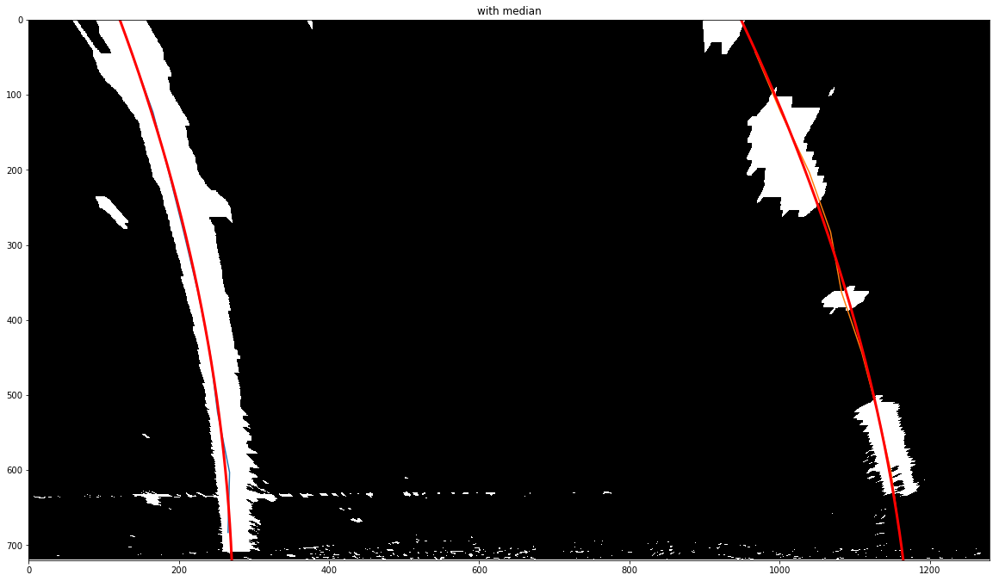

with weighted
median with average
length 9
point -  0
column l [[ 265.5  683. ]
 [ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]
 [ 266.5  683. ]
 [ 270.5  683. ]
 [ 271.5  683. ]
 [ 274.5  683. ]
 [ 276.5  683. ]
 [ 278.5  683. ]
 [ 278.5  683. ]]
column r [[ 1148.5   683. ]
 [ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]
 [ 1147.5   683. ]
 [ 1157.5   683. ]
 [ 1160.5   683. ]
 [ 1162.5   683. ]
 [ 1136.5   683. ]
 [ 1137.5   683. ]
 [ 1147.5   683. ]]
data [[ 265.5]
 [ 261.5]
 [ 257.5]
 [ 261.5]
 [ 261.5]
 [ 261.5]
 [ 264.5]
 [ 264.5]
 [ 266.5]
 [ 270.5]
 [ 271.5]
 [ 274.5]
 [ 276.5]
 [ 278.5]
 [ 278.5]]
minus median [[  0.]
 [  4.]
 [  8.]
 [  4.]
 [  4.]
 [  4.]
 [  1.]
 [  1.]
 [  1.]
 [  5.]
 [  6.]
 [  9.]
 [ 11.]
 [ 13.]
 [ 13.]]
median/mdev 4.0
s - d/mdev [[ 0.  ]
 [ 1.  ]
 [ 2.  ]
 [ 1.  ]
 [ 1.  ]
 [ 1.  ]
 [ 0.25]
 [ 0.2

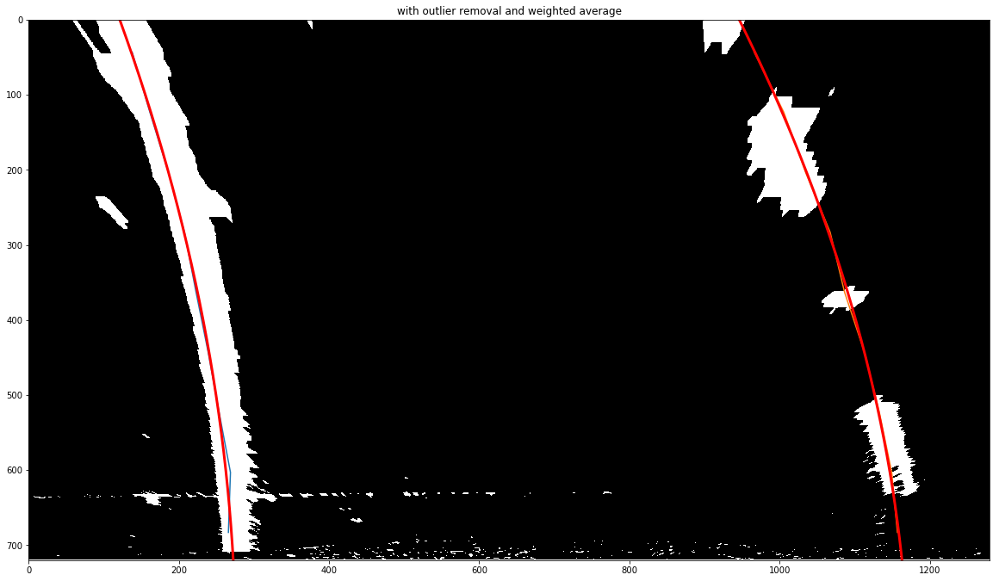

265.961538462 1156.96666667 -0.375082417582
680.932470968 m 2141.48883231 m
680.932470968 2141.48883231
Left curve radius 680.93 m
Right curve radius 2141.49 m
Car position -0.3751 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


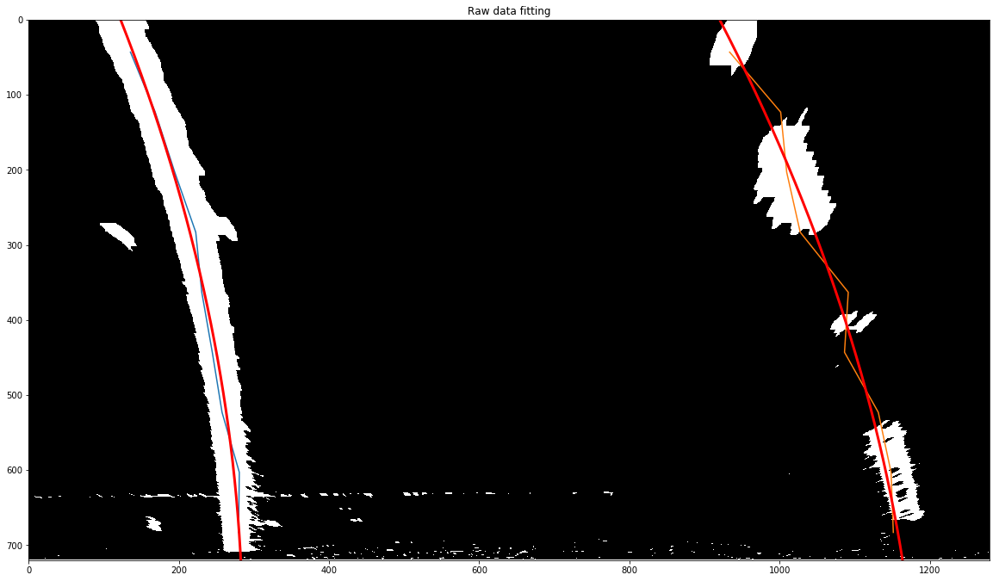

deque([[(261.5, 683), (265.5, 603), (245.5, 523), (222.5, 443), (208.5, 363), (191.5, 283), (175.5, 203), (147.5, 123), (123.5, 43)], [(257.5, 683), (258.5, 603), (242.5, 523), (220.5, 443), (206.5, 363), (186.5, 283), (173.5, 203), (146.5, 123), (117.5, 43)], [(261.5, 683), (260.5, 603), (243.5, 523), (227.5, 443), (208.5, 363), (196.5, 283), (173.5, 203), (147.5, 123), (122.5, 43)], [(261.5, 683), (261.5, 603), (246.5, 523), (228.5, 443), (212.5, 363), (202.5, 283), (176.5, 203), (152.5, 123), (125.5, 43)], [(261.5, 683), (260.5, 603), (247.5, 523), (231.5, 443), (216.5, 363), (205.5, 283), (180.5, 203), (155.5, 123), (135.5, 43)], [(264.5, 683), (262.5, 603), (255.5, 523), (238.5, 443), (225.5, 363), (208.5, 283), (185.5, 203), (165.5, 123), (138.5, 43)], [(264.5, 683), (264.5, 603), (248.5, 523), (242.5, 443), (224.5, 363), (204.5, 283), (186.5, 203), (162.5, 123), (136.5, 43)], [(266.5, 683), (267.5, 603), (251.5, 523), (247.5, 443), (226.5, 363), (206.5, 283), (188.5, 203), (165.

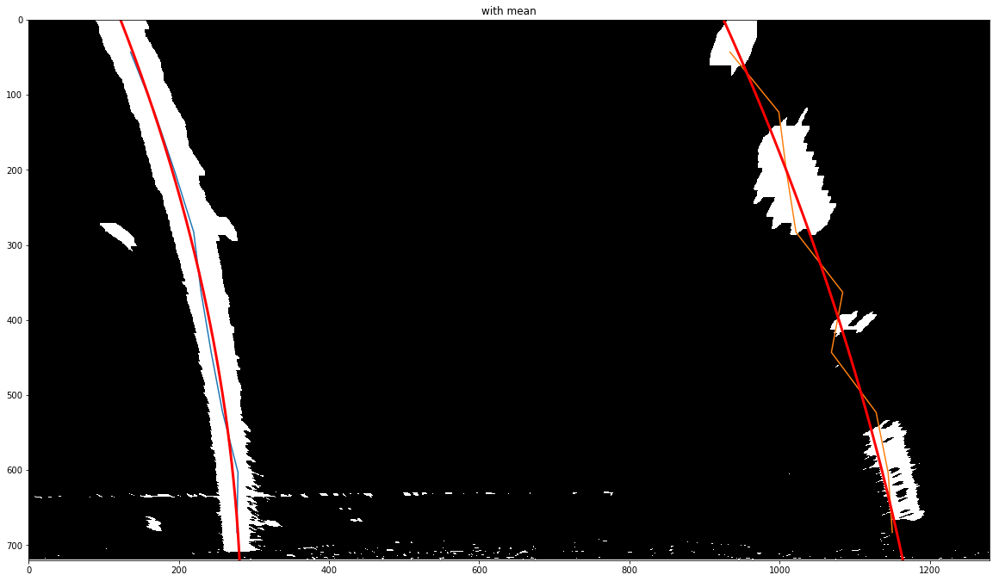

with median
length 9
point -  0
column l [[ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]
 [ 266.5  683. ]
 [ 270.5  683. ]
 [ 271.5  683. ]
 [ 274.5  683. ]
 [ 276.5  683. ]
 [ 278.5  683. ]
 [ 278.5  683. ]
 [ 279.5  683. ]]
column r [[ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]
 [ 1147.5   683. ]
 [ 1157.5   683. ]
 [ 1160.5   683. ]
 [ 1162.5   683. ]
 [ 1136.5   683. ]
 [ 1137.5   683. ]
 [ 1147.5   683. ]
 [ 1151.5   683. ]]
data [[ 261.5]
 [ 257.5]
 [ 261.5]
 [ 261.5]
 [ 261.5]
 [ 264.5]
 [ 264.5]
 [ 266.5]
 [ 270.5]
 [ 271.5]
 [ 274.5]
 [ 276.5]
 [ 278.5]
 [ 278.5]
 [ 279.5]]
minus median [[  5.]
 [  9.]
 [  5.]
 [  5.]
 [  5.]
 [  2.]
 [  2.]
 [  0.]
 [  4.]
 [  5.]
 [  8.]
 [ 10.]
 [ 12.]
 [ 12.]
 [ 13.]]
median/mdev 5.0
s - d/mdev [[ 1. ]
 [ 1.8]
 [ 1. ]
 [ 1. ]
 [ 1. ]
 [ 0.4]
 [ 0.4]
 [ 0. ]
 [ 0.8]
 [ 1. ]
 [ 1.6]
 [ 

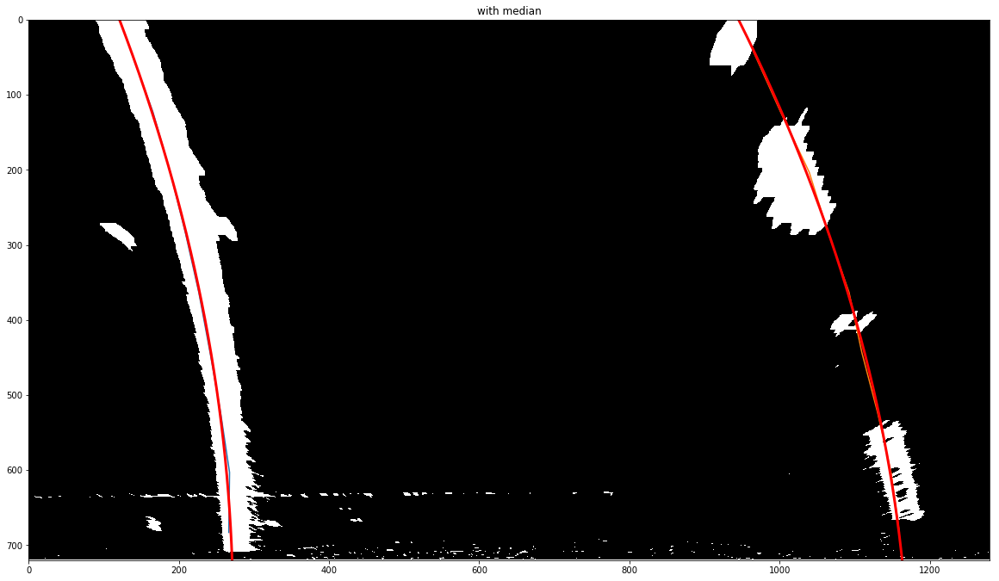

with weighted
median with average
length 9
point -  0
column l [[ 261.5  683. ]
 [ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]
 [ 266.5  683. ]
 [ 270.5  683. ]
 [ 271.5  683. ]
 [ 274.5  683. ]
 [ 276.5  683. ]
 [ 278.5  683. ]
 [ 278.5  683. ]
 [ 279.5  683. ]]
column r [[ 1151.5   683. ]
 [ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]
 [ 1147.5   683. ]
 [ 1157.5   683. ]
 [ 1160.5   683. ]
 [ 1162.5   683. ]
 [ 1136.5   683. ]
 [ 1137.5   683. ]
 [ 1147.5   683. ]
 [ 1151.5   683. ]]
data [[ 261.5]
 [ 257.5]
 [ 261.5]
 [ 261.5]
 [ 261.5]
 [ 264.5]
 [ 264.5]
 [ 266.5]
 [ 270.5]
 [ 271.5]
 [ 274.5]
 [ 276.5]
 [ 278.5]
 [ 278.5]
 [ 279.5]]
minus median [[  5.]
 [  9.]
 [  5.]
 [  5.]
 [  5.]
 [  2.]
 [  2.]
 [  0.]
 [  4.]
 [  5.]
 [  8.]
 [ 10.]
 [ 12.]
 [ 12.]
 [ 13.]]
median/mdev 5.0
s - d/mdev [[ 1. ]
 [ 1.8]
 [ 1. ]
 [ 1. ]
 [ 1. ]
 [ 0.4]
 [ 0.4]
 [ 0. ]
 [ 0.

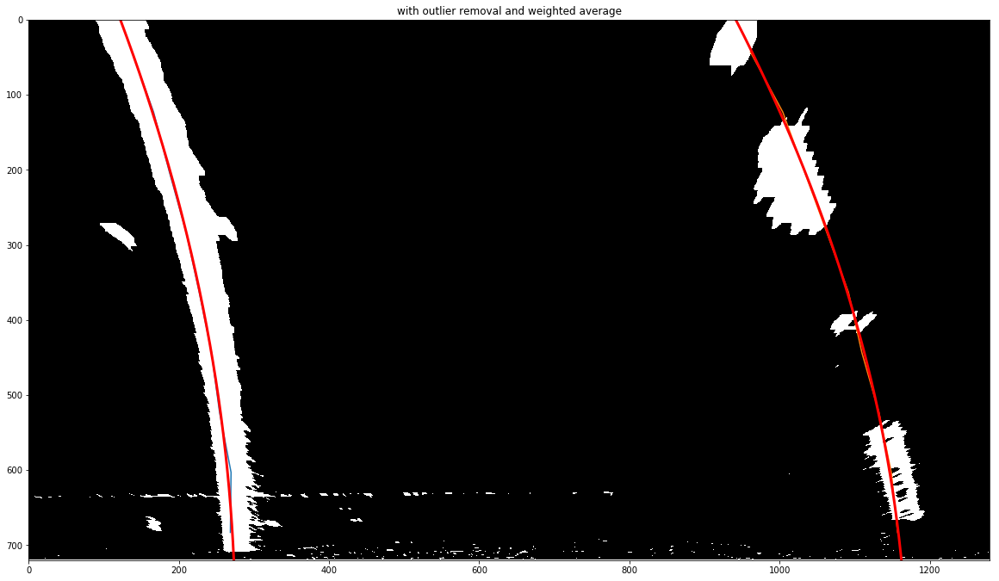

268.566666667 1157.16666667 -0.383566666667
694.872850843 m 1004.14677644 m
694.872850843 1004.14677644
Left curve radius 694.87 m
Right curve radius 1004.15 m
Car position -0.3836 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


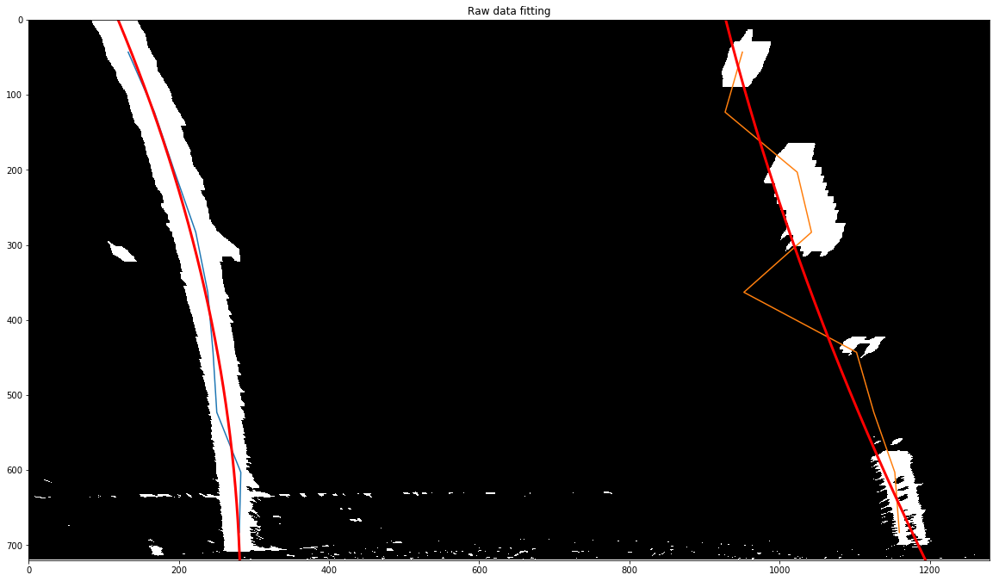

deque([[(257.5, 683), (258.5, 603), (242.5, 523), (220.5, 443), (206.5, 363), (186.5, 283), (173.5, 203), (146.5, 123), (117.5, 43)], [(261.5, 683), (260.5, 603), (243.5, 523), (227.5, 443), (208.5, 363), (196.5, 283), (173.5, 203), (147.5, 123), (122.5, 43)], [(261.5, 683), (261.5, 603), (246.5, 523), (228.5, 443), (212.5, 363), (202.5, 283), (176.5, 203), (152.5, 123), (125.5, 43)], [(261.5, 683), (260.5, 603), (247.5, 523), (231.5, 443), (216.5, 363), (205.5, 283), (180.5, 203), (155.5, 123), (135.5, 43)], [(264.5, 683), (262.5, 603), (255.5, 523), (238.5, 443), (225.5, 363), (208.5, 283), (185.5, 203), (165.5, 123), (138.5, 43)], [(264.5, 683), (264.5, 603), (248.5, 523), (242.5, 443), (224.5, 363), (204.5, 283), (186.5, 203), (162.5, 123), (136.5, 43)], [(266.5, 683), (267.5, 603), (251.5, 523), (247.5, 443), (226.5, 363), (206.5, 283), (188.5, 203), (165.5, 123), (143.5, 43)], [(270.5, 683), (270.5, 603), (259.5, 523), (246.5, 443), (226.5, 363), (208.5, 283), (189.5, 203), (170.

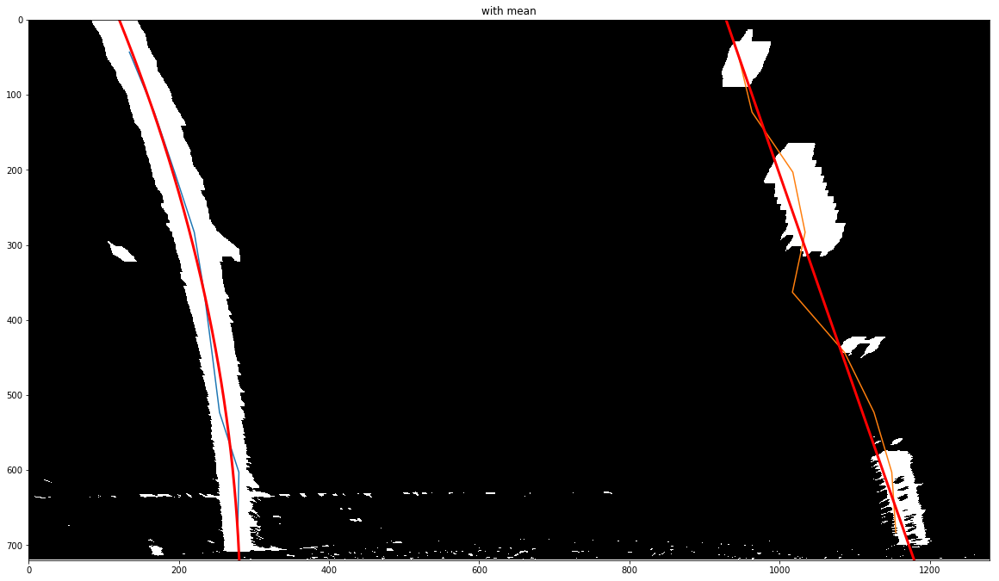

with median
length 9
point -  0
column l [[ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]
 [ 266.5  683. ]
 [ 270.5  683. ]
 [ 271.5  683. ]
 [ 274.5  683. ]
 [ 276.5  683. ]
 [ 278.5  683. ]
 [ 278.5  683. ]
 [ 279.5  683. ]
 [ 280.5  683. ]]
column r [[ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]
 [ 1147.5   683. ]
 [ 1157.5   683. ]
 [ 1160.5   683. ]
 [ 1162.5   683. ]
 [ 1136.5   683. ]
 [ 1137.5   683. ]
 [ 1147.5   683. ]
 [ 1151.5   683. ]
 [ 1159.5   683. ]]
data [[ 257.5]
 [ 261.5]
 [ 261.5]
 [ 261.5]
 [ 264.5]
 [ 264.5]
 [ 266.5]
 [ 270.5]
 [ 271.5]
 [ 274.5]
 [ 276.5]
 [ 278.5]
 [ 278.5]
 [ 279.5]
 [ 280.5]]
minus median [[ 13.]
 [  9.]
 [  9.]
 [  9.]
 [  6.]
 [  6.]
 [  4.]
 [  0.]
 [  1.]
 [  4.]
 [  6.]
 [  8.]
 [  8.]
 [  9.]
 [ 10.]]
median/mdev 8.0
s - d/mdev [[ 1.625]
 [ 1.125]
 [ 1.125]
 [ 1.125]
 [ 0.75 ]
 [ 0.75 ]
 [ 0.5  ]
 [ 0.   ]
 [ 0.125]
 

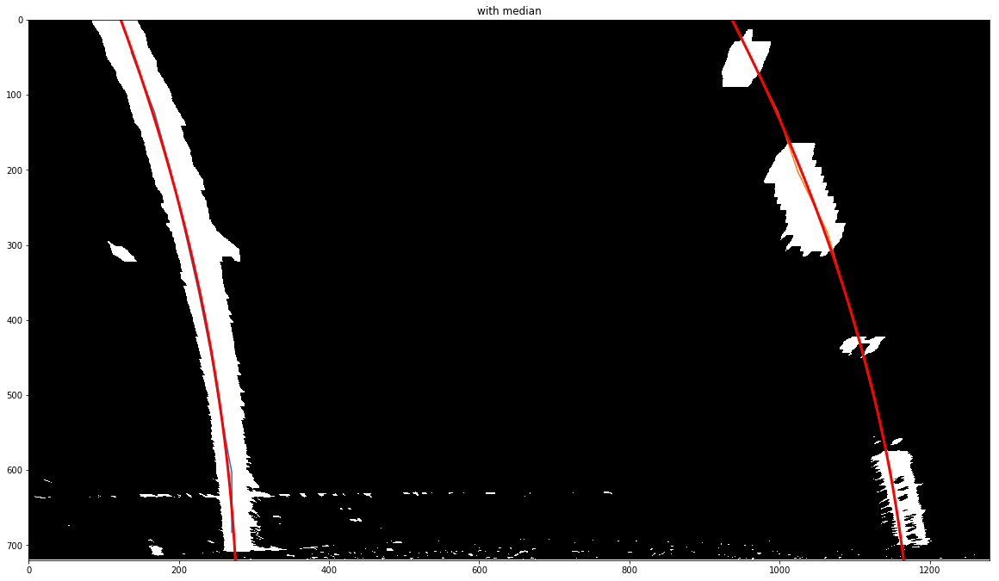

with weighted
median with average
length 9
point -  0
column l [[ 257.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]
 [ 266.5  683. ]
 [ 270.5  683. ]
 [ 271.5  683. ]
 [ 274.5  683. ]
 [ 276.5  683. ]
 [ 278.5  683. ]
 [ 278.5  683. ]
 [ 279.5  683. ]
 [ 280.5  683. ]]
column r [[ 1162.5   683. ]
 [ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]
 [ 1147.5   683. ]
 [ 1157.5   683. ]
 [ 1160.5   683. ]
 [ 1162.5   683. ]
 [ 1136.5   683. ]
 [ 1137.5   683. ]
 [ 1147.5   683. ]
 [ 1151.5   683. ]
 [ 1159.5   683. ]]
data [[ 257.5]
 [ 261.5]
 [ 261.5]
 [ 261.5]
 [ 264.5]
 [ 264.5]
 [ 266.5]
 [ 270.5]
 [ 271.5]
 [ 274.5]
 [ 276.5]
 [ 278.5]
 [ 278.5]
 [ 279.5]
 [ 280.5]]
minus median [[ 13.]
 [  9.]
 [  9.]
 [  9.]
 [  6.]
 [  6.]
 [  4.]
 [  0.]
 [  1.]
 [  4.]
 [  6.]
 [  8.]
 [  8.]
 [  9.]
 [ 10.]]
median/mdev 8.0
s - d/mdev [[ 1.625]
 [ 1.125]
 [ 1.125]
 [ 1.125]
 [ 0.75 ]
 [ 0.75 ]
 [ 0.5  ]

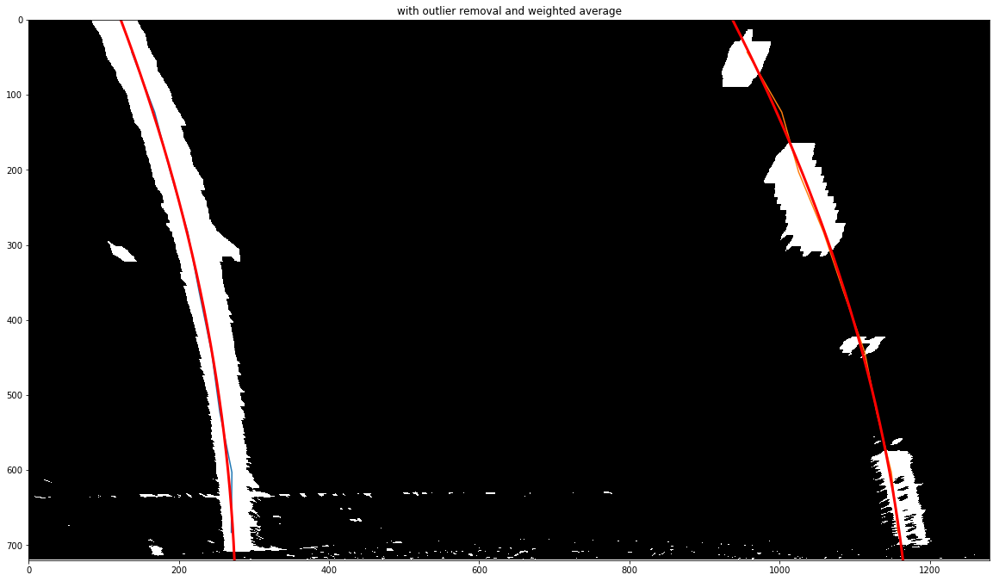

269.833333333 1157.7 -0.384976190476
656.07418137 m 42834.4207992 m
656.07418137 42834.4207992
Left curve radius 656.07 m
Right curve radius 42834.42 m
Car position -0.3850 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


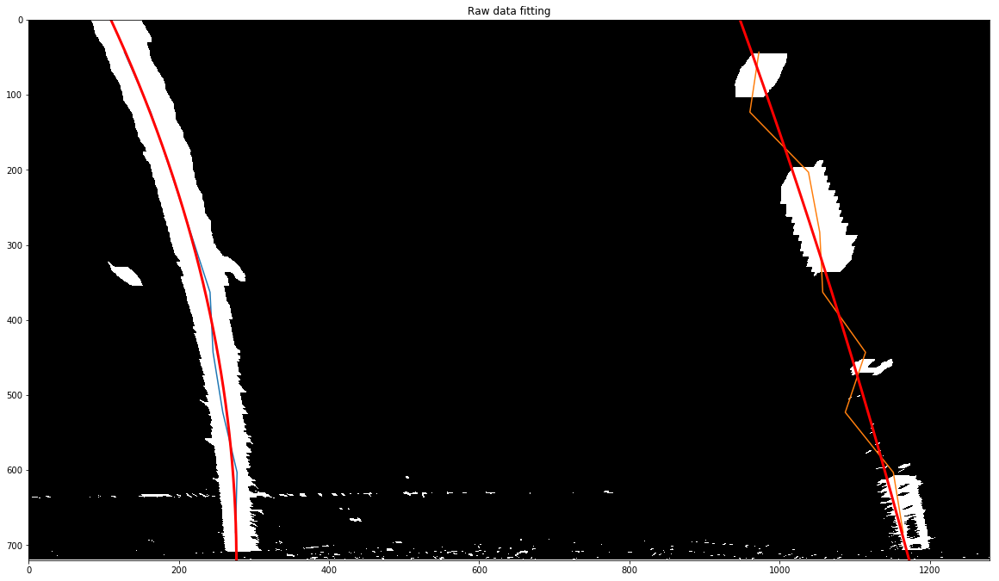

deque([[(261.5, 683), (260.5, 603), (243.5, 523), (227.5, 443), (208.5, 363), (196.5, 283), (173.5, 203), (147.5, 123), (122.5, 43)], [(261.5, 683), (261.5, 603), (246.5, 523), (228.5, 443), (212.5, 363), (202.5, 283), (176.5, 203), (152.5, 123), (125.5, 43)], [(261.5, 683), (260.5, 603), (247.5, 523), (231.5, 443), (216.5, 363), (205.5, 283), (180.5, 203), (155.5, 123), (135.5, 43)], [(264.5, 683), (262.5, 603), (255.5, 523), (238.5, 443), (225.5, 363), (208.5, 283), (185.5, 203), (165.5, 123), (138.5, 43)], [(264.5, 683), (264.5, 603), (248.5, 523), (242.5, 443), (224.5, 363), (204.5, 283), (186.5, 203), (162.5, 123), (136.5, 43)], [(266.5, 683), (267.5, 603), (251.5, 523), (247.5, 443), (226.5, 363), (206.5, 283), (188.5, 203), (165.5, 123), (143.5, 43)], [(270.5, 683), (270.5, 603), (259.5, 523), (246.5, 443), (226.5, 363), (208.5, 283), (189.5, 203), (170.5, 123), (142.5, 43)], [(271.5, 683), (272.5, 603), (266.5, 523), (243.5, 443), (226.5, 363), (212.5, 283), (189.5, 203), (177.

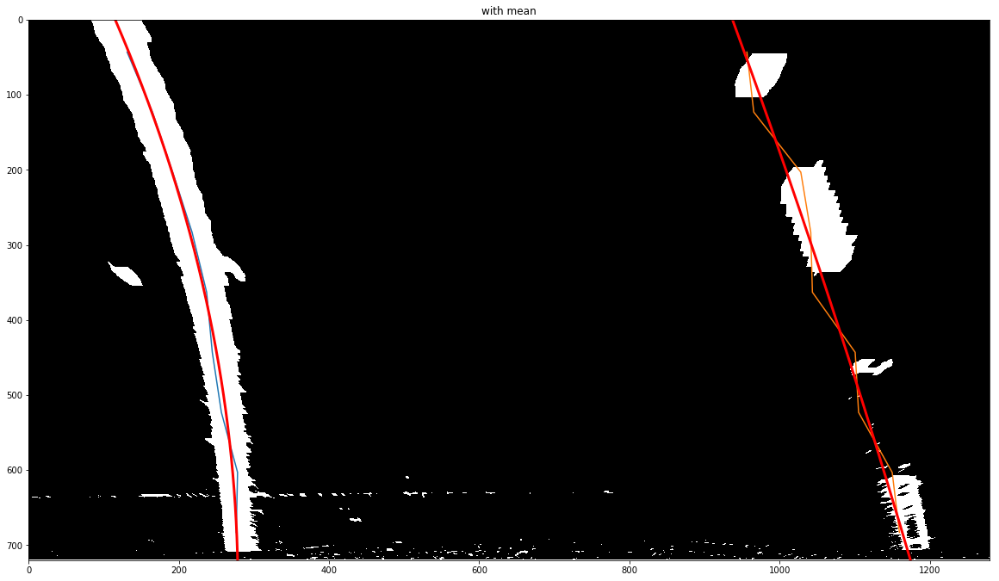

with median
length 9
point -  0
column l [[ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]
 [ 266.5  683. ]
 [ 270.5  683. ]
 [ 271.5  683. ]
 [ 274.5  683. ]
 [ 276.5  683. ]
 [ 278.5  683. ]
 [ 278.5  683. ]
 [ 279.5  683. ]
 [ 280.5  683. ]
 [ 275.5  683. ]]
column r [[ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]
 [ 1147.5   683. ]
 [ 1157.5   683. ]
 [ 1160.5   683. ]
 [ 1162.5   683. ]
 [ 1136.5   683. ]
 [ 1137.5   683. ]
 [ 1147.5   683. ]
 [ 1151.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]]
data [[ 261.5]
 [ 261.5]
 [ 261.5]
 [ 264.5]
 [ 264.5]
 [ 266.5]
 [ 270.5]
 [ 271.5]
 [ 274.5]
 [ 276.5]
 [ 278.5]
 [ 278.5]
 [ 279.5]
 [ 280.5]
 [ 275.5]]
minus median [[ 10.]
 [ 10.]
 [ 10.]
 [  7.]
 [  7.]
 [  5.]
 [  1.]
 [  0.]
 [  3.]
 [  5.]
 [  7.]
 [  7.]
 [  8.]
 [  9.]
 [  4.]]
median/mdev 7.0
s - d/mdev [[ 1.42857143]
 [ 1.42857143]
 [ 1.42857143]
 [ 1.        ]
 [ 1.        ]
 [ 0.71428571]
 

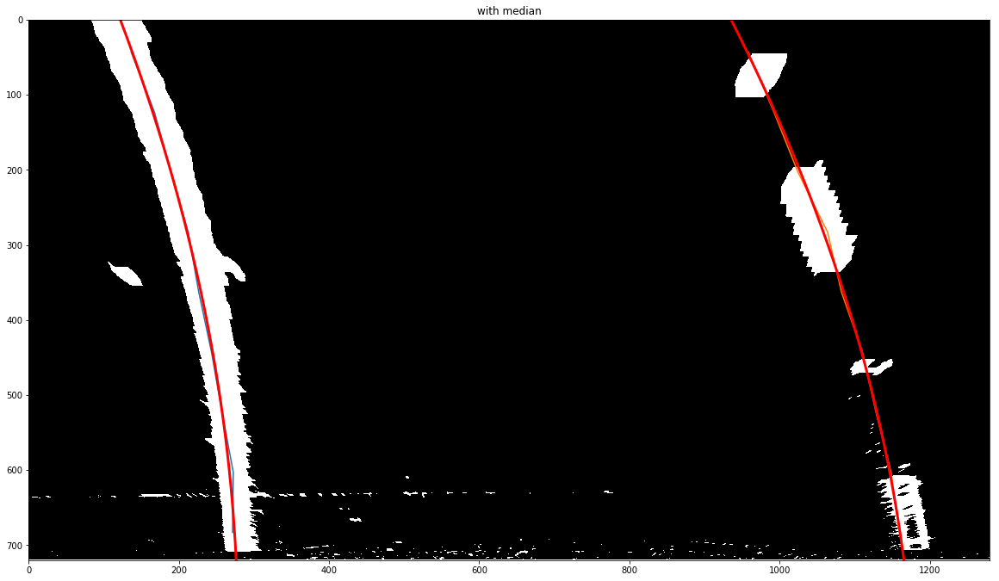

with weighted
median with average
length 9
point -  0
column l [[ 261.5  683. ]
 [ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]
 [ 266.5  683. ]
 [ 270.5  683. ]
 [ 271.5  683. ]
 [ 274.5  683. ]
 [ 276.5  683. ]
 [ 278.5  683. ]
 [ 278.5  683. ]
 [ 279.5  683. ]
 [ 280.5  683. ]
 [ 275.5  683. ]]
column r [[ 1168.5   683. ]
 [ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]
 [ 1147.5   683. ]
 [ 1157.5   683. ]
 [ 1160.5   683. ]
 [ 1162.5   683. ]
 [ 1136.5   683. ]
 [ 1137.5   683. ]
 [ 1147.5   683. ]
 [ 1151.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]]
data [[ 261.5]
 [ 261.5]
 [ 261.5]
 [ 264.5]
 [ 264.5]
 [ 266.5]
 [ 270.5]
 [ 271.5]
 [ 274.5]
 [ 276.5]
 [ 278.5]
 [ 278.5]
 [ 279.5]
 [ 280.5]
 [ 275.5]]
minus median [[ 10.]
 [ 10.]
 [ 10.]
 [  7.]
 [  7.]
 [  5.]
 [  1.]
 [  0.]
 [  3.]
 [  5.]
 [  7.]
 [  7.]
 [  8.]
 [  9.]
 [  4.]]
median/mdev 7.0
s - d/mdev [[ 1.42857143]
 [ 1.42857143]
 [ 1.42857143]
 [ 1.        ]
 [ 1.    

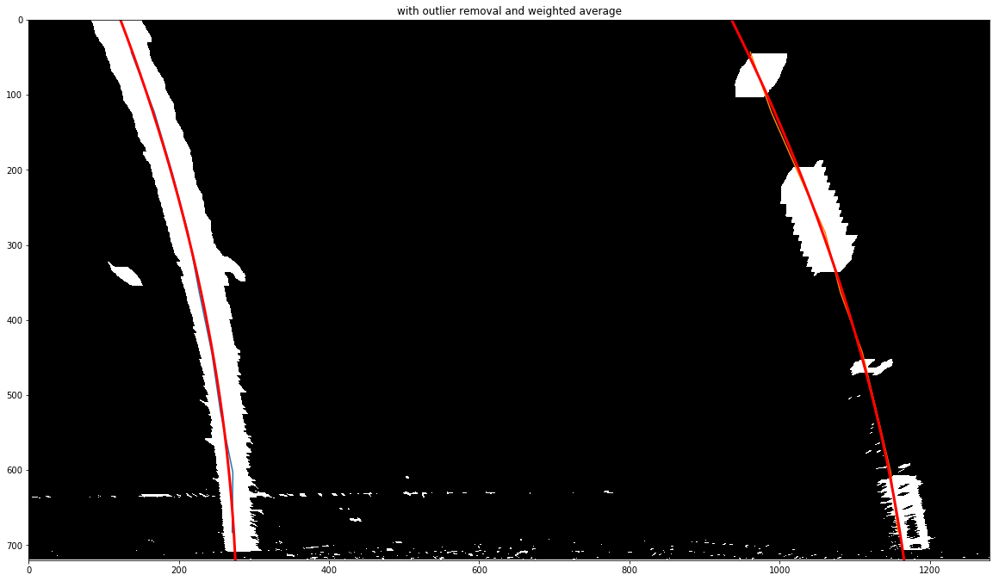

271.033333333 1157.83333333 -0.391319047619
581.223621288 m 3247.50898581 m
581.223621288 3247.50898581
Left curve radius 581.22 m
Right curve radius 3247.51 m
Car position -0.3913 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


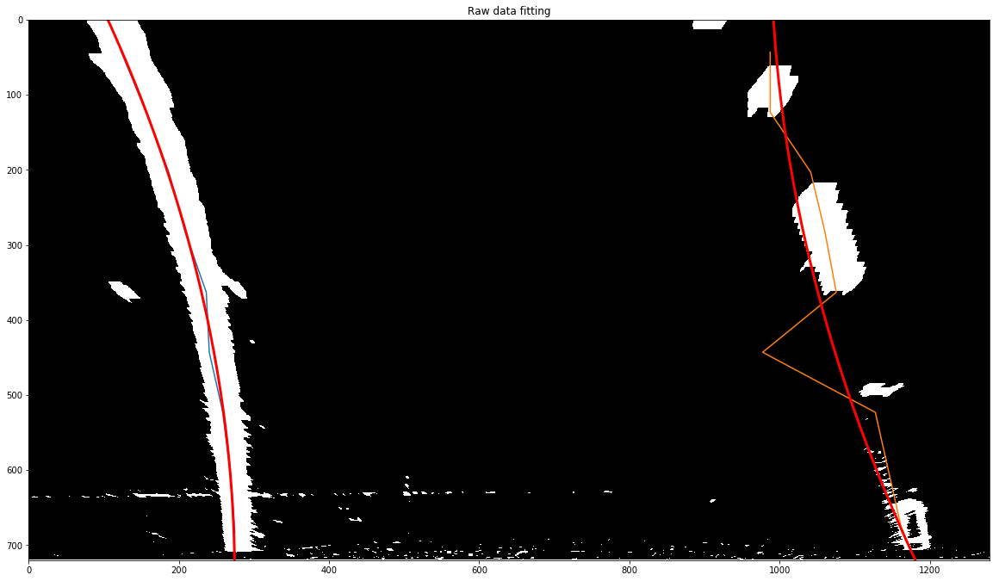

deque([[(261.5, 683), (261.5, 603), (246.5, 523), (228.5, 443), (212.5, 363), (202.5, 283), (176.5, 203), (152.5, 123), (125.5, 43)], [(261.5, 683), (260.5, 603), (247.5, 523), (231.5, 443), (216.5, 363), (205.5, 283), (180.5, 203), (155.5, 123), (135.5, 43)], [(264.5, 683), (262.5, 603), (255.5, 523), (238.5, 443), (225.5, 363), (208.5, 283), (185.5, 203), (165.5, 123), (138.5, 43)], [(264.5, 683), (264.5, 603), (248.5, 523), (242.5, 443), (224.5, 363), (204.5, 283), (186.5, 203), (162.5, 123), (136.5, 43)], [(266.5, 683), (267.5, 603), (251.5, 523), (247.5, 443), (226.5, 363), (206.5, 283), (188.5, 203), (165.5, 123), (143.5, 43)], [(270.5, 683), (270.5, 603), (259.5, 523), (246.5, 443), (226.5, 363), (208.5, 283), (189.5, 203), (170.5, 123), (142.5, 43)], [(271.5, 683), (272.5, 603), (266.5, 523), (243.5, 443), (226.5, 363), (212.5, 283), (189.5, 203), (177.5, 123), (140.5, 43)], [(274.5, 683), (277.5, 603), (265.5, 523), (241.5, 443), (226.5, 363), (212.5, 283), (198.5, 203), (172.

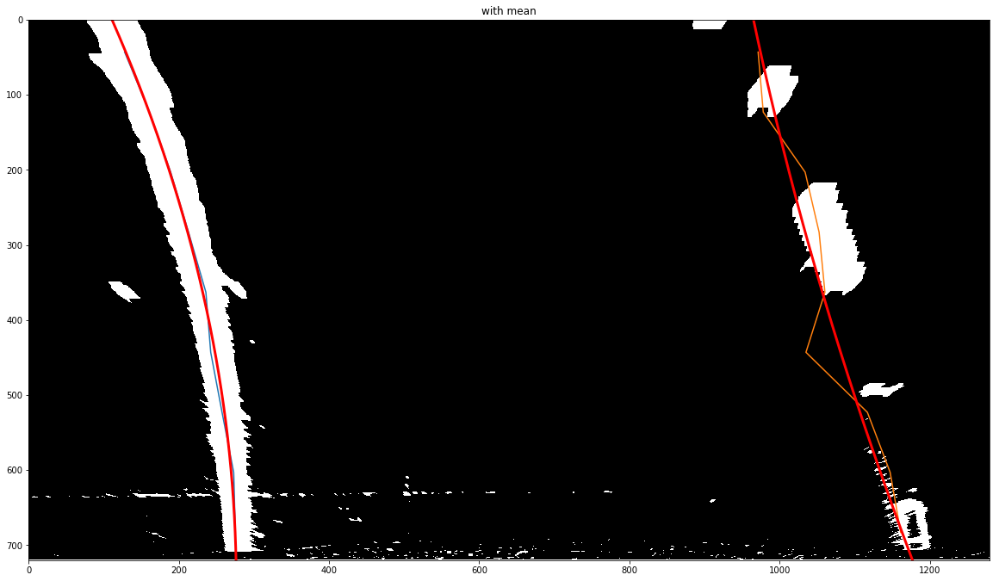

with median
length 9
point -  0
column l [[ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]
 [ 266.5  683. ]
 [ 270.5  683. ]
 [ 271.5  683. ]
 [ 274.5  683. ]
 [ 276.5  683. ]
 [ 278.5  683. ]
 [ 278.5  683. ]
 [ 279.5  683. ]
 [ 280.5  683. ]
 [ 275.5  683. ]
 [ 274.5  683. ]]
column r [[ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]
 [ 1147.5   683. ]
 [ 1157.5   683. ]
 [ 1160.5   683. ]
 [ 1162.5   683. ]
 [ 1136.5   683. ]
 [ 1137.5   683. ]
 [ 1147.5   683. ]
 [ 1151.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1163.5   683. ]]
data [[ 261.5]
 [ 261.5]
 [ 264.5]
 [ 264.5]
 [ 266.5]
 [ 270.5]
 [ 271.5]
 [ 274.5]
 [ 276.5]
 [ 278.5]
 [ 278.5]
 [ 279.5]
 [ 280.5]
 [ 275.5]
 [ 274.5]]
minus median [[ 13.]
 [ 13.]
 [ 10.]
 [ 10.]
 [  8.]
 [  4.]
 [  3.]
 [  0.]
 [  2.]
 [  4.]
 [  4.]
 [  5.]
 [  6.]
 [  1.]
 [  0.]]
median/mdev 4.0
s - d/mdev [[ 3.25]
 [ 3.25]
 [ 2.5 ]
 [ 2.5 ]
 [ 2.  ]
 [ 1.  ]
 [ 0.75]
 [ 0.  ]
 [ 0.5 ]
 [ 1.  ]
 

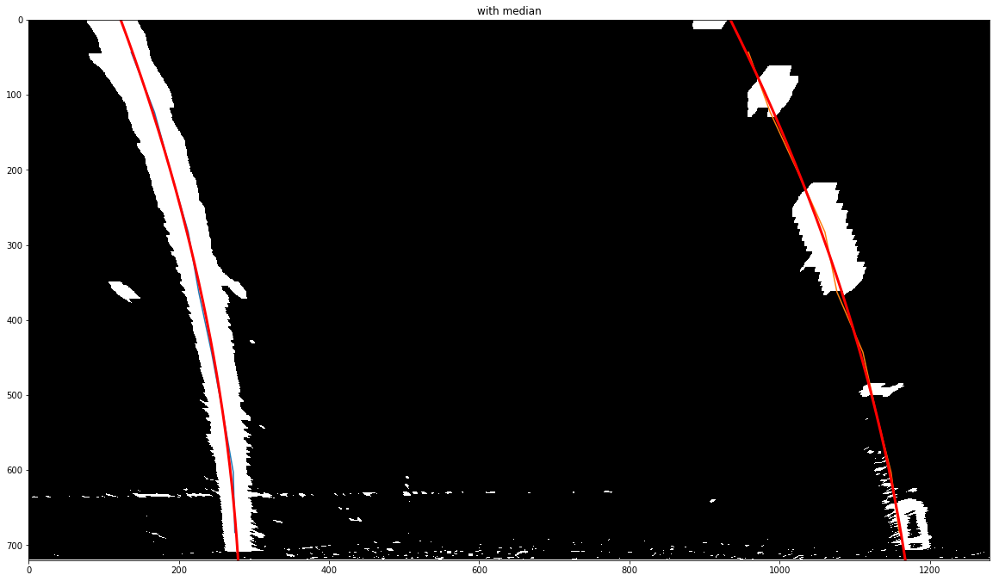

with weighted
median with average
length 9
point -  0
column l [[ 261.5  683. ]
 [ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]
 [ 266.5  683. ]
 [ 270.5  683. ]
 [ 271.5  683. ]
 [ 274.5  683. ]
 [ 276.5  683. ]
 [ 278.5  683. ]
 [ 278.5  683. ]
 [ 279.5  683. ]
 [ 280.5  683. ]
 [ 275.5  683. ]
 [ 274.5  683. ]]
column r [[ 1167.5   683. ]
 [ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]
 [ 1147.5   683. ]
 [ 1157.5   683. ]
 [ 1160.5   683. ]
 [ 1162.5   683. ]
 [ 1136.5   683. ]
 [ 1137.5   683. ]
 [ 1147.5   683. ]
 [ 1151.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1163.5   683. ]]
data [[ 261.5]
 [ 261.5]
 [ 264.5]
 [ 264.5]
 [ 266.5]
 [ 270.5]
 [ 271.5]
 [ 274.5]
 [ 276.5]
 [ 278.5]
 [ 278.5]
 [ 279.5]
 [ 280.5]
 [ 275.5]
 [ 274.5]]
minus median [[ 13.]
 [ 13.]
 [ 10.]
 [ 10.]
 [  8.]
 [  4.]
 [  3.]
 [  0.]
 [  2.]
 [  4.]
 [  4.]
 [  5.]
 [  6.]
 [  1.]
 [  0.]]
median/mdev 4.0
s - d/mdev [[ 3.25]
 [ 3.25]
 [ 2.5 ]
 [ 2.5 ]
 [ 2.  ]
 [ 1.  ]
 [ 0.75]
 [ 0. 

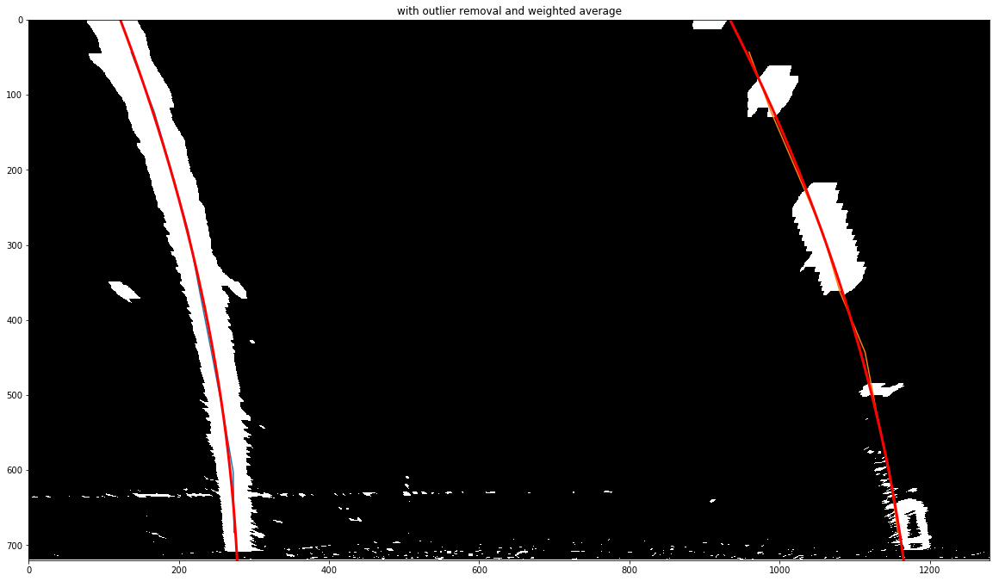

273.5 1157.5 -0.399071428571
567.468162042 m 1418.91772803 m
567.468162042 1418.91772803
Left curve radius 567.47 m
Right curve radius 1418.92 m
Car position -0.3991 m
low 10 high 160
<class 'numpy.uint8'>
<class 'numpy.uint8'>
without averaging


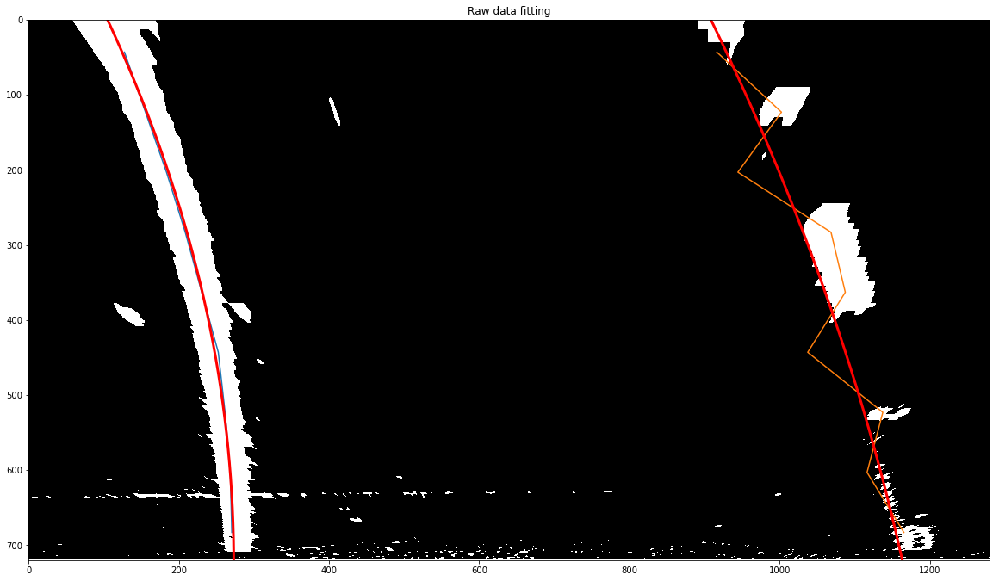

deque([[(261.5, 683), (260.5, 603), (247.5, 523), (231.5, 443), (216.5, 363), (205.5, 283), (180.5, 203), (155.5, 123), (135.5, 43)], [(264.5, 683), (262.5, 603), (255.5, 523), (238.5, 443), (225.5, 363), (208.5, 283), (185.5, 203), (165.5, 123), (138.5, 43)], [(264.5, 683), (264.5, 603), (248.5, 523), (242.5, 443), (224.5, 363), (204.5, 283), (186.5, 203), (162.5, 123), (136.5, 43)], [(266.5, 683), (267.5, 603), (251.5, 523), (247.5, 443), (226.5, 363), (206.5, 283), (188.5, 203), (165.5, 123), (143.5, 43)], [(270.5, 683), (270.5, 603), (259.5, 523), (246.5, 443), (226.5, 363), (208.5, 283), (189.5, 203), (170.5, 123), (142.5, 43)], [(271.5, 683), (272.5, 603), (266.5, 523), (243.5, 443), (226.5, 363), (212.5, 283), (189.5, 203), (177.5, 123), (140.5, 43)], [(274.5, 683), (277.5, 603), (265.5, 523), (241.5, 443), (226.5, 363), (212.5, 283), (198.5, 203), (172.5, 123), (139.5, 43)], [(276.5, 683), (278.5, 603), (261.5, 523), (243.5, 443), (230.5, 363), (217.5, 283), (201.5, 203), (168.

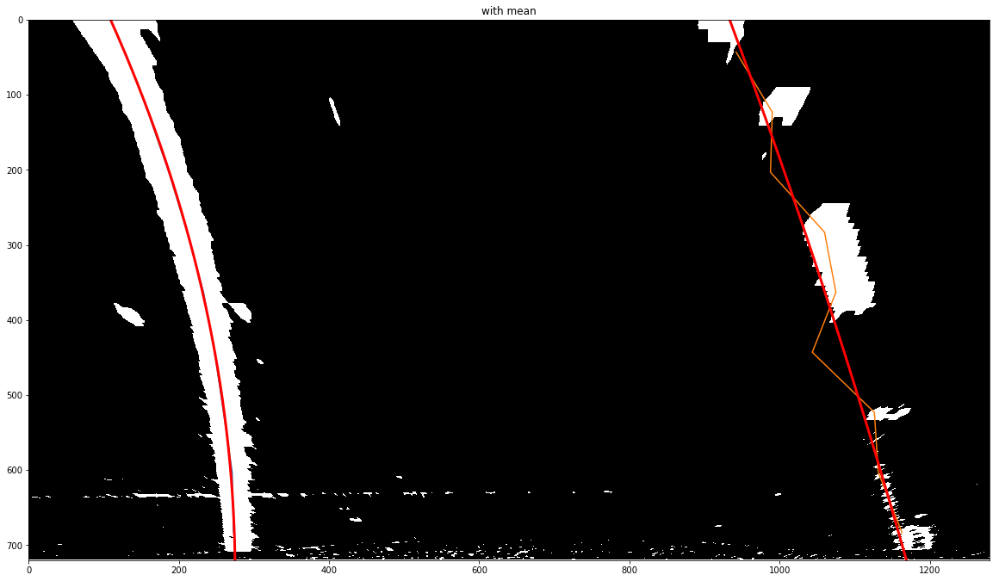

with median
length 9
point -  0
column l [[ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]
 [ 266.5  683. ]
 [ 270.5  683. ]
 [ 271.5  683. ]
 [ 274.5  683. ]
 [ 276.5  683. ]
 [ 278.5  683. ]
 [ 278.5  683. ]
 [ 279.5  683. ]
 [ 280.5  683. ]
 [ 275.5  683. ]
 [ 274.5  683. ]
 [ 270.5  683. ]]
column r [[ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]
 [ 1147.5   683. ]
 [ 1157.5   683. ]
 [ 1160.5   683. ]
 [ 1162.5   683. ]
 [ 1136.5   683. ]
 [ 1137.5   683. ]
 [ 1147.5   683. ]
 [ 1151.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1163.5   683. ]
 [ 1165.5   683. ]]
data [[ 261.5]
 [ 264.5]
 [ 264.5]
 [ 266.5]
 [ 270.5]
 [ 271.5]
 [ 274.5]
 [ 276.5]
 [ 278.5]
 [ 278.5]
 [ 279.5]
 [ 280.5]
 [ 275.5]
 [ 274.5]
 [ 270.5]]
minus median [[ 13.]
 [ 10.]
 [ 10.]
 [  8.]
 [  4.]
 [  3.]
 [  0.]
 [  2.]
 [  4.]
 [  4.]
 [  5.]
 [  6.]
 [  1.]
 [  0.]
 [  4.]]
median/mdev 4.0
s - d/mdev [[ 3.25]
 [ 2.5 ]
 [ 2.5 ]
 [ 2.  ]
 [ 1.  ]
 [ 0.75]
 [ 0.  ]
 [ 0.5 ]
 [ 1.  ]
 [ 1.  ]
 

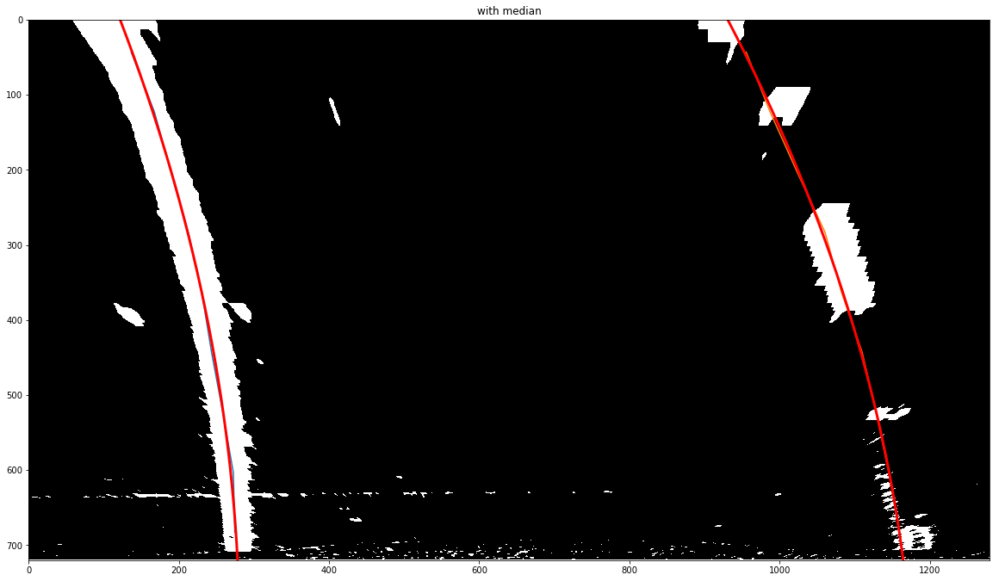

with weighted
median with average
length 9
point -  0
column l [[ 261.5  683. ]
 [ 264.5  683. ]
 [ 264.5  683. ]
 [ 266.5  683. ]
 [ 270.5  683. ]
 [ 271.5  683. ]
 [ 274.5  683. ]
 [ 276.5  683. ]
 [ 278.5  683. ]
 [ 278.5  683. ]
 [ 279.5  683. ]
 [ 280.5  683. ]
 [ 275.5  683. ]
 [ 274.5  683. ]
 [ 270.5  683. ]]
column r [[ 1174.5   683. ]
 [ 1172.5   683. ]
 [ 1159.5   683. ]
 [ 1147.5   683. ]
 [ 1157.5   683. ]
 [ 1160.5   683. ]
 [ 1162.5   683. ]
 [ 1136.5   683. ]
 [ 1137.5   683. ]
 [ 1147.5   683. ]
 [ 1151.5   683. ]
 [ 1159.5   683. ]
 [ 1164.5   683. ]
 [ 1163.5   683. ]
 [ 1165.5   683. ]]
data [[ 261.5]
 [ 264.5]
 [ 264.5]
 [ 266.5]
 [ 270.5]
 [ 271.5]
 [ 274.5]
 [ 276.5]
 [ 278.5]
 [ 278.5]
 [ 279.5]
 [ 280.5]
 [ 275.5]
 [ 274.5]
 [ 270.5]]
minus median [[ 13.]
 [ 10.]
 [ 10.]
 [  8.]
 [  4.]
 [  3.]
 [  0.]
 [  2.]
 [  4.]
 [  4.]
 [  5.]
 [  6.]
 [  1.]
 [  0.]
 [  4.]]
median/mdev 4.0
s - d/mdev [[ 3.25]
 [ 2.5 ]
 [ 2.5 ]
 [ 2.  ]
 [ 1.  ]
 [ 0.75]
 [ 0.  ]
 [ 0.5

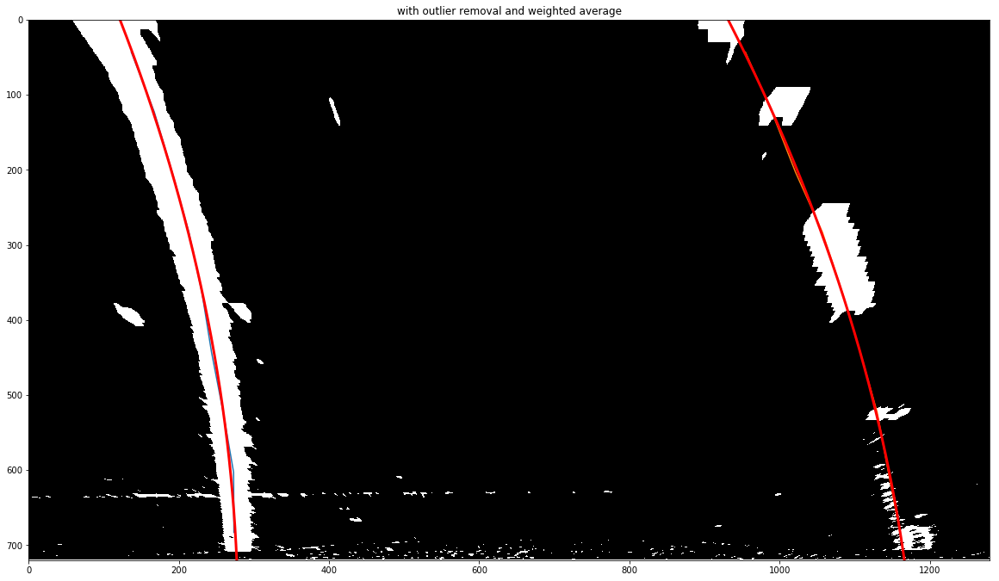

In [ ]:
video = imageio.get_reader("project_video.mp4","ffmpeg")
video_length = video.get_length()
print (video_length)

video_thresholded = imageio.get_writer("thresholded.mp4", fps=25)
video_warped = imageio.get_writer("warped.mp4", fps=25)

video_regular = imageio.get_writer("regular.mp4", fps=25)
video_average = imageio.get_writer("average.mp4", fps=25)
video_median = imageio.get_writer("median.mp4", fps=25)


video_ready = imageio.get_writer("video_ready.mp4", fps=25)

kernel = np.ones((3,3),np.uint8)

window_width = 75 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 150 # How much to slide left and right for searching
ploty = np.linspace(0, 719, num=720)
y_eval = np.max(ploty)

number_of_frames = 15
left_points_array = deque([], 25)
right_points_array = deque([], 25)


mtx = np.load("./camera_cal/new/mtx.npy")
dist = np.load("./camera_cal/new/dist.npy")

for i in range(0, video_length, 1):

    original_image_distorted = video.get_data(i)
    my_plt_show_image(original_image_distorted, "original distorted", mode='color')
    
    original_image = cv2.undistort(original_image_distorted, mtx, dist, None, mtx)
    my_plt_show_image(original_image, "original undistorted", mode='color')
    
    x = original_image

    h_channel, s_channel, v_channel, hsl_h_channel, hsl_s_channel, hsl_l_channel, l, a, b = create_channels(x)

#clahe = histogram_change(x)
#my_plt_show_image(clahe, title = "clahe", mode="color")

      
    img_size = (x.shape[1],x.shape[0])
    
    src = np.float32([
                [600,450],         
                [700,450],
                [1100,720],        
                [200,720]
                 ])

    dst = np.float32([
                [200,-400],         
                [1100,-400],
                [1100,720],        
                [200,720]
                 ])

    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)


    tested =  h_channel
    step2 = color_threshold(tested, s_thresh=(20, 25))
    my_plt_show_image(step2, title = "h_channel_hsv color threshold", mode="gray")

    step3 = color_threshold(hsl_l_channel, s_thresh=(0, 170))
    my_plt_show_image(1-step3, title = "hs_l channel color thres", mode="gray")
    
    low = 10
    high = 160
#for low in range(10,60,10):
    #for high in range(low+10,255,20):
     
    print ("low",low, "high", high)
    result3 = abs_sobel_thresh(x, orient='x', sobel_kernel=15, thresh=(low, high))
    my_plt_show_image(result3, title = "sobel X s_channel", mode="gray")
        
    result4 = abs_sobel_thresh(x, orient='y', sobel_kernel=15, thresh=(low, high))
    my_plt_show_image(result4, title = "sobel Y s_channel", mode="gray")
        
    combined = np.zeros_like(result3)
    combined[((result3 == 1) & (result4 == 1))] = 1
    #my_plt_show_image(combined, title = "combined sobel", mode="gray")
        
    combined2 = np.zeros_like(result3)
    combined2[((result3 == 1)  | (step2 == 1) | (step3 == 0))] = 1
    #my_plt_show_image(combined2, title = "combined2", mode="gray")

    combined3 = np.zeros_like(result3)
    combined3[((result3 == 1)  | (step2 == 1) )] = 1
    my_plt_show_image(combined3, title = "color threshold and sobel x", mode="gray")
    
    
    closing = cv2.morphologyEx(combined3.astype(np.uint8), cv2.MORPH_CLOSE, kernel)
    my_plt_show_image(closing, title = "morphology closing", mode="gray")
    
    
    
    rect = np.zeros_like(x)
    cv2.polylines(rect,np.int32([src]),True,(0,255,255),2)
    #my_plt_show_image(rect, title = "poly", mode="color")
        
 
    result6 = cv2.medianBlur(closing.astype(np.float32),5)
    my_plt_show_image(result6, title = "median blur", mode="gray")

    clean_warped = cv2.warpPerspective(closing, M, img_size, flags = cv2.INTER_LINEAR)        
    my_plt_show_image(clean_warped, title = "clean warped", mode="gray")  
    
    first = np.zeros_like(x)
    first[:,:,0] = result6*255
    first[:,:,1] = result6*255
    first[:,:,2] = result6*255
        
    #my_plt_show_image(first, title = "first", mode="gray")
        
    first2 = first.astype(np.uint8)
    #my_plt_show_image(first2, title = "first2", mode="gray")
        
        
    combined_rgb = cv2.add(first, rect)
    my_plt_show_image(combined_rgb, title = "combined rgb", mode="color")
    
    #video_thresholded.append_data(combined_rgb)
    
    
    warped = cv2.warpPerspective(combined_rgb, M, img_size, flags = cv2.INTER_LINEAR)
    my_plt_show_image(warped, title = "warped with lines", mode="gray")
    
    #video_warped.append_data(warped)
    
    #for bw
    window_centroids = find_window_centroids(clean_warped, window_width, window_height, margin)
    found = draw_centroids(original_image, clean_warped, window_centroids, window_width, window_height)
    my_plt_show_image(found, title = "found line regions", mode="color")
   
    left_points, right_points = centroids_to_points(window_centroids,window_width, window_height)
    
    print("without averaging")
    left_fitx_noav, right_fitx_noav, x_noav, y_noav, x1_noav, y1_noav, z_noav, z1_noav = fit_left_and_right(left_points, right_points)
    withoutaveraging = draw_fitted(original_image, clean_warped, "Raw data fitting", x_noav,y_noav,x1_noav,y1_noav, left_fitx_noav, right_fitx_noav)
    
        
    # averaging through time

    
    if len(left_points_array) < number_of_frames:
        left_points_array.append(left_points)
        right_points_array.append(right_points)
    else:
        left_points_array.popleft()
        right_points_array.popleft()
        
        left_points_array.append(left_points)
        right_points_array.append(right_points)

    
    print (left_points_array)
    print (right_points_array)
    
    print("with mean")
    left_avg_points, right_avg_points = average_points(left_points_array, right_points_array) 
    left_fitx, right_fitx, x, y, x1, y1, z, z1 = fit_left_and_right(left_avg_points, right_avg_points)
    newroad = draw_fitted(original_image, clean_warped, "with mean", x,y,x1,y1, left_fitx, right_fitx)
    
    
    print("with median")
    left_med_points, right_med_points = median_points(left_points_array, right_points_array) 
    left_fitx_med, right_fitx_med, x_med, y_med, x1_med, y1_med, z_med, z1_med = fit_left_and_right(left_med_points, right_med_points)
    med_newroad = draw_fitted(original_image, clean_warped,"with median", x_med,y_med,x1_med,y1_med, left_fitx_med, right_fitx_med)
    
    print("with weighted")
    left_weight_points, right_weight_points = weighted_points(left_points_array, right_points_array) 
    left_fitx_weight, right_fitx_weight, x_weight, y_weight, x1_weight, y1_weight, z_weight, z1_weight \
                                    = fit_left_and_right(left_weight_points, right_weight_points)
    weight_newroad = draw_fitted(original_image, clean_warped,"with outlier removal and weighted average", x_weight,y_weight,x1_weight,y1_weight, \
                                    left_fitx_weight, right_fitx_weight)
        
        
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    car_pos_delta = (640 - (left_weight_points[0][0] + (right_weight_points[0][0] - left_weight_points[0][0]) // 2)) * xm_per_pix
    print (left_weight_points[0][0], right_weight_points[0][0], car_pos_delta)
    
    newwarp = draw_road(ploty, clean_warped, right_fitx_weight, left_fitx_weight, y_eval)
    my_plt_show_image(newwarp, title = "road mask", mode="color")
     
    # Combine the result with the original image
    result = cv2.addWeighted(original_image, 1, newwarp, 0.3, 0)
    my_plt_show_image(result, title = "frame ready for movie", mode="color")
    #plt.show()

    
    left_curverad, right_curverad = road_curvature(ploty, left_fitx, right_fitx, y_eval)
    
    print(left_curverad, right_curverad)
    text = "Left curve radius " + str("%0.2f" % left_curverad) + " m"
    text2= "Right curve radius " + str("%0.2f" % right_curverad) + " m"
    text3= "Car position " + str("%0.4f" %  car_pos_delta) + " m"
    
    print (text)
    print (text2)
    print (text3)
    
    
    
    result2 = cv2.putText(result, text, (750,50), cv2.FONT_HERSHEY_SIMPLEX, 1, 50, 2)
    result3 = cv2.putText(result2, text2, (750,100), cv2.FONT_HERSHEY_SIMPLEX, 1, 50, 2)
    result4 = cv2.putText(result3, text3, (750,150), cv2.FONT_HERSHEY_SIMPLEX, 1, 50, 2)
    
    my_plt_show_image(result4, title = "with text", mode="color")
        
    video_ready.append_data(result)
    
    #input("Press Enter to continue...")
    

video_thresholded.close()
video_warped.close()
video_ready.close()

video_regular.close()
video_average.close()
video_median.close()

print ("finished")

